In [2]:
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, LSTM, Dense
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
import os

# Chemin vers le dossier contenant les fichiers CSV
chemin_dossier = 'OF_KSU_Sn1/OF_KSU_Sn1_CSV'

# Charger et préparer les données
donnees_totales = []
for fichier in os.listdir(chemin_dossier):
    chemin_complet = os.path.join(chemin_dossier, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        df = pd.read_csv(chemin_complet, header=None)
        donnees_totales.append(df.iloc[:, 0].values)  # Ajouter uniquement la dimension fractale

# Padding des vecteurs pour qu'ils aient tous la même longueur
longueur_max = max(len(vecteur) for vecteur in donnees_totales)
X_padded = pad_sequences(donnees_totales, maxlen=longueur_max, padding='post', dtype='float32')

# Préparer les étiquettes
y = np.array([df[1] for df in donnees_totales])  # Utiliser la première décision de chaque fichier

# Redimensionnement des données pour le CNN
X_cnn = X_padded.reshape((X_padded.shape[0], longueur_max, 1))

# Séparation des données
X_train, X_test, y_train, y_test = train_test_split(X_cnn, y, test_size=0.3, train_size=0.7, random_state=42)

# Construction du modèle CNN-LSTM
model = Sequential()

# Ajout des couches CNN
model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(longueur_max, 1)))
model.add(MaxPooling1D(pool_size=2))

# Ajout des couches LSTM
model.add(LSTM(units=128, return_sequences=True))
model.add(LSTM(units=128))

# Ajout d'une couche Dense pour la sortie
model.add(Dense(1, activation='sigmoid'))

# Compilation du modèle
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
model.fit(X_train, y_train, epochs=2, batch_size=32, validation_data=(X_test, y_test))
model.save('cnnlstm.h5')

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/2
13/13 ━━━━━━━━━━━━━━━━━━━━ 62s 4s/step - accuracy: 0.0000e+00 - loss: 0.5314 - val_accuracy: 0.0000e+00 - val_loss: -0.0063
Epoch 2/2
13/13 ━━━━━━━━━━━━━━━━━━━━ 46s 4s/step - accuracy: 0.0000e+00 - loss: -0.0305 - val_accuracy: 0.0000e+00 - val_loss: -0.0091


In [4]:
import os
import pandas as pd
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score

# Chemin vers le dossier contenant les fichiers CSV
chemin_dossier = 'OF_KSU_Sn1/OF_KSU_Sn1_CSV'

# Liste pour stocker les données de tous les fichiers
donnees_totales = []

# Lecture de chaque fichier CSV dans le dossier
for fichier in os.listdir(chemin_dossier):
    chemin_complet = os.path.join(chemin_dossier, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        # Lecture du fichier CSV sans en-tête
        df = pd.read_csv(chemin_complet, header=None)
        donnees_totales.append(df)

# Concaténation des données en un seul DataFrame
donnees_concatenees = pd.concat(donnees_totales, ignore_index=True)

# Prétraitement des données
scaler = MinMaxScaler(feature_range=(0, 1))
donnees_concatenees[0] = scaler.fit_transform(donnees_concatenees[0].values.reshape(-1, 1))

# Redimensionnement des données pour le LSTM
X = donnees_concatenees[0].values.reshape((donnees_concatenees.shape[0], 1, 1))
y = donnees_concatenees[1].values

# Division des données
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Construction du modèle LSTM
model = Sequential()
model.add(LSTM(units=170, return_sequences=True, input_shape=(1, 1)))
model.add(LSTM(units=170))
model.add(Dense(1, activation='sigmoid'))

# Compilation du modèle
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))
model.save('lstm.h5')

# Évaluation du modèle
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Test accuracy: {accuracy}')


# Faire des prédictions sur l'ensemble de test
y_pred = model.predict(X_test)

# Calculer les métriques d'évaluation
matrice_confusion = confusion_matrix(y_test, y_pred)
precision = precision_score(y_test, y_pred)
rappel = recall_score(y_test, y_pred)
score_f1 = f1_score(y_test, y_pred)
exactitude = accuracy_score(y_test, y_pred)

# Afficher les métriques d'évaluation
print(f"Matrice de confusion :\n{matrice_confusion}")
print(f"Précision : {precision:.4f}")
print(f"Rappel : {rappel:.4f}")
print(f"Score F1 : {score_f1:.4f}")
print(f"Exactitude : {exactitude:.4f}")

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 233s 18ms/step - accuracy: 0.8587 - loss: 0.2988 - val_accuracy: 0.8776 - val_loss: 0.2387
Epoch 2/10
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 199s 16ms/step - accuracy: 0.8771 - loss: 0.2405 - val_accuracy: 0.8779 - val_loss: 0.2375
Epoch 3/10
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 1068s 86ms/step - accuracy: 0.8758 - loss: 0.2403 - val_accuracy: 0.8780 - val_loss: 0.2380
Epoch 4/10
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 104s 8ms/step - accuracy: 0.8770 - loss: 0.2394 - val_accuracy: 0.8778 - val_loss: 0.2405
Epoch 5/10
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 96s 8ms/step - accuracy: 0.8774 - loss: 0.2391 - val_accuracy: 0.8778 - val_loss: 0.2413
Epoch 6/10
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 97s 8ms/step - accuracy: 0.8765 - loss: 0.2395 - val_accuracy: 0.8781 - val_loss: 0.2378
Epoch 7/10
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 84s 7ms/step - accuracy: 0.8761 - loss: 0.2394 - val_accuracy: 0.8778 - val_loss: 0.2375
Epoch 8/10
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 83s 7ms/step - ac

5327/5327 ━━━━━━━━━━━━━━━━━━━━ 11s 2ms/step - accuracy: 0.8779 - loss: 0.2374
Test accuracy: 0.8780622482299805


AttributeError: 'Sequential' object has no attribute 'score'

In [6]:
import os
import pandas as pd
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score

# Chemin vers le dossier contenant les fichiers CSV
chemin_dossier = 'OF_KSU_Sn1/OF_KSU_Sn1_CSV'

# Liste pour stocker les données de tous les fichiers
donnees_totales = []

# Lecture de chaque fichier CSV dans le dossier
for fichier in os.listdir(chemin_dossier):
    chemin_complet = os.path.join(chemin_dossier, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        # Lecture du fichier CSV sans en-tête
        df = pd.read_csv(chemin_complet, header=None)
        donnees_totales.append(df)

# Concaténation des données en un seul DataFrame
donnees_concatenees = pd.concat(donnees_totales, ignore_index=True)

# Prétraitement des données
scaler = MinMaxScaler(feature_range=(0, 1))
donnees_concatenees[0] = scaler.fit_transform(donnees_concatenees[0].values.reshape(-1, 1))

# Redimensionnement des données pour le LSTM
X = donnees_concatenees[0].values.reshape((donnees_concatenees.shape[0], 1, 1))
y = donnees_concatenees[1].values

# Division des données
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Construction du modèle LSTM
model = Sequential()
model.add(LSTM(units=250, return_sequences=True, input_shape=(1, 1)))
model.add(LSTM(units=250))
model.add(Dense(1, activation='sigmoid'))

# Compilation du modèle
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))
model.save('lstm250_20.h5')

# Évaluation du modèle
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Test accuracy: {accuracy}')


# Faire des prédictions sur l'ensemble de test
y_pred = model.predict(X_test)

# Calculer les métriques d'évaluation
matrice_confusion = confusion_matrix(y_test, y_pred)
precision = precision_score(y_test, y_pred)
rappel = recall_score(y_test, y_pred)
score_f1 = f1_score(y_test, y_pred)
exactitude = accuracy_score(y_test, y_pred)

# Afficher les métriques d'évaluation
print(f"Matrice de confusion :\n{matrice_confusion}")
print(f"Précision : {precision:.4f}")
print(f"Rappel : {rappel:.4f}")
print(f"Score F1 : {score_f1:.4f}")
print(f"Exactitude : {exactitude:.4f}")

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 209s 16ms/step - accuracy: 0.8605 - loss: 0.2958 - val_accuracy: 0.8778 - val_loss: 0.2395
Epoch 2/20
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 210s 17ms/step - accuracy: 0.8768 - loss: 0.2407 - val_accuracy: 0.8781 - val_loss: 0.2394
Epoch 3/20
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 208s 17ms/step - accuracy: 0.8754 - loss: 0.2417 - val_accuracy: 0.8777 - val_loss: 0.2384
Epoch 4/20
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 209s 17ms/step - accuracy: 0.8754 - loss: 0.2405 - val_accuracy: 0.8779 - val_loss: 0.2385
Epoch 5/20
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 209s 17ms/step - accuracy: 0.8775 - loss: 0.2387 - val_accuracy: 0.8778 - val_loss: 0.2383
Epoch 6/20
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 202s 16ms/step - accuracy: 0.8765 - loss: 0.2397 - val_accuracy: 0.8780 - val_loss: 0.2383
Epoch 7/20
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 200s 16ms/step - accuracy: 0.8760 - loss: 0.2397 - val_accuracy: 0.8778 - val_loss: 0.2376
Epoch 8/20
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 190s 15ms/s

5327/5327 ━━━━━━━━━━━━━━━━━━━━ 50s 9ms/step - accuracy: 0.8776 - loss: 0.2376
Test accuracy: 0.877763032913208
5327/5327 ━━━━━━━━━━━━━━━━━━━━ 48s 9ms/step


ValueError: Classification metrics can't handle a mix of binary and continuous targets

In [1]:
import os
import pandas as pd
import numpy as np
from tqdm import tqdm  # Importez tqdm pour l'indicateur de progression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import joblib

# Chemin du dossier contenant les fichiers CSV
dossier_csv = 'OF_KSU_Sn1/Decision'

# Initialiser un DataFrame vide pour stocker toutes les données
df_total = pd.DataFrame()

# Liste pour stocker les noms des fichiers CSV
file_names = []

# Obtenez la liste des fichiers CSV dans le dossier
file_list = [f for f in os.listdir(dossier_csv) if os.path.isfile(os.path.join(dossier_csv, f)) and f.endswith('.csv')]

# Instanciez tqdm pour l'indicateur de progression
pbar = tqdm(total=len(file_list), desc='Processing CSV Files')

# Boucle pour lire chaque fichier CSV dans le dossier
for fichier in file_list:
    chemin_complet = os.path.join(dossier_csv, fichier)
    df = pd.read_csv(chemin_complet, header=None)
    df.columns = ['FD', 'Decision']
    df_total = pd.concat([df_total, df], ignore_index=True)
    file_names.append(fichier)
    pbar.update(1)  # Mettre à jour l'indicateur de progression
pbar.close()  # Fermer l'indicateur de progression

# Séparer les caractéristiques (FD) et les étiquettes (Décision)
X = df_total['FD'].values.reshape(-1, 1)
y = df_total['Decision'].values

# Normaliser les caractéristiques
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Diviser les données en ensembles d'entraînement, de validation et de test
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y, test_size=0.2, random_state=42)

# Instancier un objet SVM
svm_model = SVC(kernel='rbf')

# Entraîner le SVM sur les données d'entraînement
svm_model.fit(X_train, y_train)

# Faire des prédictions sur les données de test
y_pred = svm_model.predict(X_test)

# Évaluer la performance du SVM en termes de précision (accuracy)
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')

# Enregistrer le modèle SVM
joblib.dump(svm_model, 'svm_model.pkl')

Processing CSV Files: 100%|██████████| 553/553 [00:02<00:00, 212.38it/s]


In [2]:
import os
import pandas as pd
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score

# Chemin vers le dossier contenant les fichiers CSV
chemin_dossier = 'OF_KSU_Sn1/Decision'

# Liste pour stocker les données de tous les fichiers
donnees_totales = []

# Lecture de chaque fichier CSV dans le dossier
for fichier in os.listdir(chemin_dossier):
    chemin_complet = os.path.join(chemin_dossier, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        # Lecture du fichier CSV sans en-tête
        df = pd.read_csv(chemin_complet, header=None)
        donnees_totales.append(df)

# Concaténation des données en un seul DataFrame
donnees_concatenees = pd.concat(donnees_totales, ignore_index=True)

# Prétraitement des données
scaler = MinMaxScaler(feature_range=(0, 1))
donnees_concatenees[0] = scaler.fit_transform(donnees_concatenees[0].values.reshape(-1, 1))

# Redimensionnement des données pour le LSTM
X = donnees_concatenees[0].values.reshape((donnees_concatenees.shape[0], 1, 1))
y = donnees_concatenees[1].values

# Division des données
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Construction du modèle LSTM
model = Sequential()
model.add(LSTM(units=170, return_sequences=True, input_shape=(1, 1)))
model.add(LSTM(units=170))
model.add(Dense(1, activation='sigmoid'))

# Compilation du modèle
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test), verbose= 1)
model.save('lstm.h5')

# Évaluation du modèle
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Test accuracy: {accuracy}')

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 251s 19ms/step - accuracy: 0.9124 - loss: 0.2256 - val_accuracy: 0.9661 - val_loss: 0.1156
Epoch 2/10
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 251s 20ms/step - accuracy: 0.9644 - loss: 0.1121 - val_accuracy: 0.9637 - val_loss: 0.1083
Epoch 3/10
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 236s 19ms/step - accuracy: 0.9646 - loss: 0.1111 - val_accuracy: 0.9625 - val_loss: 0.1155
Epoch 4/10
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 271s 20ms/step - accuracy: 0.9652 - loss: 0.1084 - val_accuracy: 0.9629 - val_loss: 0.1181
Epoch 5/10
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 242s 19ms/step - accuracy: 0.9655 - loss: 0.1074 - val_accuracy: 0.9649 - val_loss: 0.1038
Epoch 6/10
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 251s 20ms/step - accuracy: 0.9654 - loss: 0.1074 - val_accuracy: 0.9646 - val_loss: 0.1062
Epoch 7/10
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 246s 20ms/step - accuracy: 0.9659 - loss: 0.1061 - val_accuracy: 0.9654 - val_loss: 0.1048
Epoch 8/10
12430/12430 ━━━━━━━━━━━━━━━━━━━━ 250s 20ms/s

5327/5327 ━━━━━━━━━━━━━━━━━━━━ 42s 8ms/step - accuracy: 0.9639 - loss: 0.1097
Test accuracy: 0.9640745520591736


In [4]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Conv1D, LSTM, Dense, Bidirectional

# Chemin du dossier contenant les fichiers CSV
dossier_csv = 'ds_sans_bc/ds'

# Initialiser un DataFrame vide pour stocker toutes les données
df_total = pd.DataFrame()

# Boucle pour lire chaque fichier CSV dans le dossier
for fichier in os.listdir(dossier_csv):
    chemin_complet = os.path.join(dossier_csv, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        df = pd.read_csv(chemin_complet, header=None)
        df.columns = ['FD', 'Decision']
        df_total = pd.concat([df_total, df], ignore_index=True)

# Séparer les caractéristiques (FD) et les étiquettes (Décision)
X = df_total['FD'].values.reshape(-1, 1)
y = df_total['Decision'].values

# Normaliser les caractéristiques
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Redimensionner les données pour le modèle CNN
X_reshaped = X_normalized.reshape((X_normalized.shape[0], 1, 1))

# Diviser les données en ensembles d'entraînement, de validation et de test
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

# Construction du modèle CNN-LSTM
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=(1, 1)))
model.add(LSTM(164, return_sequences=True))
model.add(LSTM(132))
model.add(Dense(1, activation='sigmoid'))

# Compilation du modèle
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(X_train, y_train, epochs=10, validation_data=(X_val, y_val))

# Évaluation du modèle
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Loss: {loss}, Accuracy: {accuracy}')
model.save('hypBC.h5')

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/10
8036/8036 ━━━━━━━━━━━━━━━━━━━━ 159s 17ms/step - accuracy: 0.9244 - loss: 0.2020 - val_accuracy: 0.9621 - val_loss: 0.1123
Epoch 2/10
8036/8036 ━━━━━━━━━━━━━━━━━━━━ 134s 17ms/step - accuracy: 0.9627 - loss: 0.1205 - val_accuracy: 0.9643 - val_loss: 0.1065
Epoch 3/10
8036/8036 ━━━━━━━━━━━━━━━━━━━━ 147s 18ms/step - accuracy: 0.9638 - loss: 0.1163 - val_accuracy: 0.9638 - val_loss: 0.1102
Epoch 4/10
8036/8036 ━━━━━━━━━━━━━━━━━━━━ 152s 19ms/step - accuracy: 0.9640 - loss: 0.1155 - val_accuracy: 0.9647 - val_loss: 0.1074
Epoch 5/10
8036/8036 ━━━━━━━━━━━━━━━━━━━━ 138s 17ms/step - accuracy: 0.9648 - loss: 0.1131 - val_accuracy: 0.9648 - val_loss: 0.1083
Epoch 6/10
8036/8036 ━━━━━━━━━━━━━━━━━━━━ 125s 15ms/step - accuracy: 0.9651 - loss: 0.1116 - val_accuracy: 0.9660 - val_loss: 0.1051
Epoch 7/10
8036/8036 ━━━━━━━━━━━━━━━━━━━━ 124s 15ms/step - accuracy: 0.9650 - loss: 0.1121 - val_accuracy: 0.9654 - val_loss: 0.1070
Epoch 8/10
8036/8036 ━━━━━━━━━━━━━━━━━━━━ 122s 15ms/step - accuracy: 

In [5]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Conv1D, LSTM, Dense, Bidirectional

# Chemin du dossier contenant les fichiers CSV
dossier_csv = 'ds_sans_bc/ds'

# Initialiser un DataFrame vide pour stocker toutes les données
df_total = pd.DataFrame()

# Boucle pour lire chaque fichier CSV dans le dossier
for fichier in os.listdir(dossier_csv):
    chemin_complet = os.path.join(dossier_csv, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        df = pd.read_csv(chemin_complet, header=None)
        df.columns = ['FD', 'Decision']
        df_total = pd.concat([df_total, df], ignore_index=True)

# Séparer les caractéristiques (FD) et les étiquettes (Décision)
X = df_total['FD'].values.reshape(-1, 1)
y = df_total['Decision'].values

# Normaliser les caractéristiques
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Redimensionner les données pour le modèle CNN
X_reshaped = X_normalized.reshape((X_normalized.shape[0], 1, 1))

# Diviser les données en ensembles d'entraînement, de validation et de test
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

# Construction du modèle CNN-LSTM
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=(1, 1)))
model.add(LSTM(164, return_sequences=True))
model.add(LSTM(132))
model.add(Dense(1, activation='sigmoid'))

# Compilation du modèle
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(X_train, y_train, epochs=16, batch_size=32, validation_data=(X_val, y_val), verbose=1)

# Évaluation du modèle
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Loss: {loss}, Accuracy: {accuracy}')
model.save('hypBC_32.h5')

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/16
8036/8036 ━━━━━━━━━━━━━━━━━━━━ 65s 8ms/step - accuracy: 0.9271 - loss: 0.1989 - val_accuracy: 0.9662 - val_loss: 0.1134
Epoch 2/16
8036/8036 ━━━━━━━━━━━━━━━━━━━━ 62s 8ms/step - accuracy: 0.9625 - loss: 0.1211 - val_accuracy: 0.9644 - val_loss: 0.1058
Epoch 3/16
8036/8036 ━━━━━━━━━━━━━━━━━━━━ 67s 8ms/step - accuracy: 0.9637 - loss: 0.1159 - val_accuracy: 0.9663 - val_loss: 0.1105
Epoch 4/16
8036/8036 ━━━━━━━━━━━━━━━━━━━━ 65s 8ms/step - accuracy: 0.9639 - loss: 0.1158 - val_accuracy: 0.9616 - val_loss: 0.1344
Epoch 5/16
8036/8036 ━━━━━━━━━━━━━━━━━━━━ 65s 8ms/step - accuracy: 0.9652 - loss: 0.1121 - val_accuracy: 0.9660 - val_loss: 0.1053
Epoch 6/16
8036/8036 ━━━━━━━━━━━━━━━━━━━━ 65s 8ms/step - accuracy: 0.9647 - loss: 0.1124 - val_accuracy: 0.9629 - val_loss: 0.1205
Epoch 7/16
8036/8036 ━━━━━━━━━━━━━━━━━━━━ 63s 8ms/step - accuracy: 0.9647 - loss: 0.1115 - val_accuracy: 0.9662 - val_loss: 0.1047
Epoch 8/16
8036/8036 ━━━━━━━━━━━━━━━━━━━━ 63s 8ms/step - accuracy: 0.9648 - loss: 0

In [9]:
# import numpy as np
# from keras.models import load_model

# # Load the trained model
# model = load_model('hypBC_32.h5')

# # Create a random input tensor of shape (batch_size, 1, 1)
# batch_size = None
# input_tensor = np.random.rand(batch_size, 1, 1)

# # Get the output of the CNN layer (i.e., the feature map)
# # In Keras, you can obtain the output of an intermediate layer using the 'predict' function
# # Set 'batch_size' to 'None' to allow flexible batch size
# get_feature_map = keras.backend.function([model.layers[0].input], [model.layers[0].output])
# feature_map = get_feature_map([input_tensor])[0]

# # Print the shape of the feature map
# print("Shape of the feature map:", feature_map.shape)

# # Print the feature map itself
# print("Feature map:")
# print(feature_map)

TypeError: 'NoneType' object cannot be interpreted as an integer

In [3]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Conv1D, LSTM, Dense, Bidirectional

# Chemin du dossier contenant les fichiers CSV
dossier_csv = 'DF'

# Initialiser un DataFrame vide pour stocker toutes les données
df_total = pd.DataFrame()

# Boucle pour lire chaque fichier CSV dans le dossier
for fichier in os.listdir(dossier_csv):
    chemin_complet = os.path.join(dossier_csv, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        df = pd.read_csv(chemin_complet, header=None)
        df.columns = ['FD', 'Decision']
        df_total = pd.concat([df_total, df], ignore_index=True)

# Séparer les caractéristiques (FD) et les étiquettes (Décision)
X = df_total['FD'].values.reshape(-1, 1)
y = df_total['Decision'].values

# Normaliser les caractéristiques
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Redimensionner les données pour le modèle CNN
X_reshaped = X_normalized.reshape((X_normalized.shape[0], 1, 1))

# Diviser les données en ensembles d'entraînement, de validation et de test
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

# Construction du modèle CNN-LSTM
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=(1, 1)))
model.add(LSTM(164, return_sequences=True))
model.add(LSTM(132))
model.add(Dense(1, activation='sigmoid'))

# Compilation du modèle
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(X_train, y_train, epochs=12, batch_size=32, validation_data=(X_val, y_val))

# Évaluation du modèle
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Loss: {loss}, Accuracy: {accuracy}')
model.save('hypNew.h5')

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/12
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 156s 14ms/step - accuracy: 0.9289 - loss: 0.1905 - val_accuracy: 0.9665 - val_loss: 0.1032
Epoch 2/12
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 141s 14ms/step - accuracy: 0.9649 - loss: 0.1108 - val_accuracy: 0.9664 - val_loss: 0.1154
Epoch 3/12
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 150s 15ms/step - accuracy: 0.9650 - loss: 0.1094 - val_accuracy: 0.9664 - val_loss: 0.1016
Epoch 4/12
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 137s 13ms/step - accuracy: 0.9662 - loss: 0.1056 - val_accuracy: 0.9666 - val_loss: 0.1152
Epoch 5/12
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 142s 14ms/step - accuracy: 0.9660 - loss: 0.1052 - val_accuracy: 0.9666 - val_loss: 0.1018
Epoch 6/12
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 158s 16ms/step - accuracy: 0.9666 - loss: 0.1037 - val_accuracy: 0.9669 - val_loss: 0.1009
Epoch 7/12
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 184s 18ms/step - accuracy: 0.9664 - loss: 0.1038 - val_accuracy: 0.9669 - val_loss: 0.1009
Epoch 8/12
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 163s 16ms/s

Loss: 0.09778260439634323, Accuracy: 0.9669545888900757


In [6]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Conv1D, LSTM, Dense, Bidirectional

# Chemin du dossier contenant les fichiers CSV
dossier_csv = 'DF_noisy'

# Initialiser un DataFrame vide pour stocker toutes les données
df_total = pd.DataFrame()

# Boucle pour lire chaque fichier CSV dans le dossier
for fichier in os.listdir(dossier_csv):
    chemin_complet = os.path.join(dossier_csv, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        df = pd.read_csv(chemin_complet, header=None)
        df.columns = ['FD', 'Decision']
        df_total = pd.concat([df_total, df], ignore_index=True)

# Séparer les caractéristiques (FD) et les étiquettes (Décision)
X = df_total['FD'].values.reshape(-1, 1)
y = df_total['Decision'].values

# Normaliser les caractéristiques
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Redimensionner les données pour le modèle CNN
X_reshaped = X_normalized.reshape((X_normalized.shape[0], 1, 1))

# Diviser les données en ensembles d'entraînement, de validation et de test
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

# Construction du modèle CNN-LSTM
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=(1, 1)))
model.add(LSTM(164, return_sequences=True))
model.add(LSTM(132))
model.add(Dense(1, activation='sigmoid'))

# Compilation du modèle
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val))

# Évaluation du modèle
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Loss: {loss}, Accuracy: {accuracy}')
model.save('hyp_20.h5')

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 81s 8ms/step - accuracy: 0.9364 - loss: 0.1852 - val_accuracy: 0.9625 - val_loss: 0.1143
Epoch 2/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 74s 7ms/step - accuracy: 0.9634 - loss: 0.1162 - val_accuracy: 0.9653 - val_loss: 0.1126
Epoch 3/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 74s 7ms/step - accuracy: 0.9641 - loss: 0.1125 - val_accuracy: 0.9654 - val_loss: 0.1076
Epoch 4/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 73s 7ms/step - accuracy: 0.9642 - loss: 0.1119 - val_accuracy: 0.9642 - val_loss: 0.1132
Epoch 5/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 140s 14ms/step - accuracy: 0.9646 - loss: 0.1102 - val_accuracy: 0.9650 - val_loss: 0.1079
Epoch 6/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 169s 17ms/step - accuracy: 0.9653 - loss: 0.1076 - val_accuracy: 0.9652 - val_loss: 0.1115
Epoch 7/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 156s 15ms/step - accuracy: 0.9651 - loss: 0.1086 - val_accuracy: 0.9649 - val_loss: 0.1096
Epoch 8/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 157s 15ms/step - ac

In [7]:
# Charger le modèle
from keras.models import load_model
model = load_model('hyp_15.h5')

# Charger les données de test si elles ne sont pas déjà chargées
# X_test, y_test = ...

# Évaluation du modèle
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Loss: {loss}, Accuracy: {accuracy}')

3379/3379 ━━━━━━━━━━━━━━━━━━━━ 28s 7ms/step - accuracy: 0.9647 - loss: 0.1045
Loss: 0.10287687927484512, Accuracy: 0.9656320810317993


In [8]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Conv1D, LSTM, Dense, Bidirectional

# Chemin du dossier contenant les fichiers CSV
dossier_csv = 'DF_noisy_20'

# Initialiser un DataFrame vide pour stocker toutes les données
df_total = pd.DataFrame()

# Boucle pour lire chaque fichier CSV dans le dossier
for fichier in os.listdir(dossier_csv):
    chemin_complet = os.path.join(dossier_csv, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        df = pd.read_csv(chemin_complet, header=None)
        df.columns = ['FD', 'Decision']
        df_total = pd.concat([df_total, df], ignore_index=True)

# Séparer les caractéristiques (FD) et les étiquettes (Décision)
X = df_total['FD'].values.reshape(-1, 1)
y = df_total['Decision'].values

# Normaliser les caractéristiques
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Redimensionner les données pour le modèle CNN
X_reshaped = X_normalized.reshape((X_normalized.shape[0], 1, 1))

# Diviser les données en ensembles d'entraînement, de validation et de test
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

# Construction du modèle CNN-LSTM
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=(1, 1)))
model.add(LSTM(164, return_sequences=True))
model.add(LSTM(132))
model.add(Dense(1, activation='sigmoid'))

# Compilation du modèle
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val))

# Évaluation du modèle
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Loss: {loss}, Accuracy: {accuracy}')
model.save('hyp_Air20.h5')

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 114s 10ms/step - accuracy: 0.9273 - loss: 0.1951 - val_accuracy: 0.9628 - val_loss: 0.1430
Epoch 2/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 132s 13ms/step - accuracy: 0.9634 - loss: 0.1161 - val_accuracy: 0.9650 - val_loss: 0.1074
Epoch 3/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 130s 13ms/step - accuracy: 0.9650 - loss: 0.1112 - val_accuracy: 0.9654 - val_loss: 0.1086
Epoch 4/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 125s 12ms/step - accuracy: 0.9645 - loss: 0.1106 - val_accuracy: 0.9633 - val_loss: 0.1153
Epoch 5/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 159s 16ms/step - accuracy: 0.9656 - loss: 0.1083 - val_accuracy: 0.9647 - val_loss: 0.1105
Epoch 6/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 133s 13ms/step - accuracy: 0.9647 - loss: 0.1098 - val_accuracy: 0.9638 - val_loss: 0.1172
Epoch 7/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 130s 13ms/step - accuracy: 0.9652 - loss: 0.1067 - val_accuracy: 0.9654 - val_loss: 0.1069
Epoch 8/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 129s 13ms/s

Loss: 0.10087770968675613, Accuracy: 0.9660944938659668


In [10]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Conv1D, LSTM, Dense, Bidirectional

# Chemin du dossier contenant les fichiers CSV
dossier_csv = 'DF'

# Initialiser un DataFrame vide pour stocker toutes les données
df_total = pd.DataFrame()

# Boucle pour lire chaque fichier CSV dans le dossier
for fichier in os.listdir(dossier_csv):
    chemin_complet = os.path.join(dossier_csv, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        df = pd.read_csv(chemin_complet, header=None)
        df.columns = ['FD', 'Decision']
        df_total = pd.concat([df_total, df], ignore_index=True)

# Séparer les caractéristiques (FD) et les étiquettes (Décision)
X = df_total['FD'].values.reshape(-1, 1)
y = df_total['Decision'].values

# Normaliser les caractéristiques
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Redimensionner les données pour le modèle CNN
X_reshaped = X_normalized.reshape((X_normalized.shape[0], 1, 1))

# Diviser les données en ensembles d'entraînement, de validation et de test
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

# Construction du modèle CNN-LSTM
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=(1, 1)))
model.add(LSTM(164, return_sequences=True))
model.add(LSTM(132))
model.add(Dense(1, activation='sigmoid'))

# Compilation du modèle
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val))

# Évaluation du modèle
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Loss: {loss}, Accuracy: {accuracy}')
model.save('last_hyp.pb')

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 154s 14ms/step - accuracy: 0.9292 - loss: 0.1903 - val_accuracy: 0.9587 - val_loss: 0.1287
Epoch 2/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 136s 13ms/step - accuracy: 0.9634 - loss: 0.1150 - val_accuracy: 0.9631 - val_loss: 0.1118
Epoch 3/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 110s 11ms/step - accuracy: 0.9640 - loss: 0.1122 - val_accuracy: 0.9655 - val_loss: 0.1108
Epoch 4/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 126s 12ms/step - accuracy: 0.9647 - loss: 0.1100 - val_accuracy: 0.9650 - val_loss: 0.1078
Epoch 5/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 127s 12ms/step - accuracy: 0.9646 - loss: 0.1097 - val_accuracy: 0.9653 - val_loss: 0.1065
Epoch 6/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 132s 13ms/step - accuracy: 0.9653 - loss: 0.1080 - val_accuracy: 0.9650 - val_loss: 0.1082
Epoch 7/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 146s 14ms/step - accuracy: 0.9652 - loss: 0.1077 - val_accuracy: 0.9654 - val_loss: 0.1087
Epoch 8/10
10137/10137 ━━━━━━━━━━━━━━━━━━━━ 124s 12ms/s

ValueError: Invalid filepath extension for saving. Please add either a `.keras` extension for the native Keras format (recommended) or a `.h5` extension. Use `model.export(filepath)` if you want to export a SavedModel for use with TFLite/TFServing/etc. Received: filepath=last_hyp.pb.

In [31]:

# import tensorflow as tf


# # Remplacez 'votre_modele.h5' par le chemin de votre fichier modèle
# model_lstm = tf.keras.models.load_model('hypNew.h5')



# # Définissez le chemin où vous souhaitez sauvegarder le modèle .pb
# saved_model_path = 'modelTf'

# # Sauvegarder le modèle au format SavedModel
# tf.saved_model.save(model_lstm, saved_model_path)

import tensorflow as tf
from keras.models import load_model

# Load the Keras model
model = load_model('hypNew.h5')

model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_2 (Conv1D)               │ (None, 1, 64)          │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_4 (LSTM)                   │ (None, 1, 164)         │       150,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_5 (LSTM)                   │ (None, 132)            │       156,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           133 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 307,303 (1.17 MB)

 Trainable params: 307,301 (1.17 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [39]:
import tensorflow as tf

try:
    # Load the Keras model
    model = tf.keras.models.load_model('hypNew.h5')
    print("Model loaded successfully.")

    # Test the model (optional)
    # result = model.predict(your_test_dataset)
    # print("Model testing successful.")

    # Save the model in TensorFlow format with a .keras extension
    model.save('modelTf.keras')
    print("Model converted and saved in TensorFlow format.")
except Exception as e:
    print("An error occurred during conversion: ", e)

Model loaded successfully.
Model converted and saved in TensorFlow format.


In [59]:
# Construction du modèle CNN
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Conv1D, LSTM, Dense, Bidirectional

# Chemin du dossier contenant les fichiers CSV
dossier_csv = 'DF'

# Initialiser un DataFrame vide pour stocker toutes les données
df_total = pd.DataFrame()

# Boucle pour lire chaque fichier CSV dans le dossier
for fichier in os.listdir(dossier_csv):
    chemin_complet = os.path.join(dossier_csv, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        df = pd.read_csv(chemin_complet, header=None)
        df.columns = ['FD', 'Decision']
        df_total = pd.concat([df_total, df], ignore_index=True)

# Séparer les caractéristiques (FD) et les étiquettes (Décision)
X = df_total['FD'].values.reshape(-1, 1)
y = df_total['Decision'].values

# Normaliser les caractéristiques
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Redimensionner les données pour le modèle CNN
X_reshaped = X_normalized.reshape((X_normalized.shape[0], 1, 1))

# Diviser les données en ensembles d'entraînement, de validation et de test
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y, test_size=0.3, random_state=42)

model = Sequential()
model.add(Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=(1, 1)))
model.add(Conv1D(filters=32, kernel_size=1, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compilation du modèle
model.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test))

# Évaluation du modèle
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Perte: {loss}, Précision: {accuracy}')
model.save('modele_cnn.h5')

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 150s 12ms/step - accuracy: 0.5454 - loss: 0.2479 - val_accuracy: 0.5457 - val_loss: 0.2478
Epoch 2/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 133s 11ms/step - accuracy: 0.5457 - loss: 0.2478 - val_accuracy: 0.5457 - val_loss: 0.2477
Epoch 3/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 133s 11ms/step - accuracy: 0.5462 - loss: 0.2477 - val_accuracy: 0.5457 - val_loss: 0.2478
Epoch 4/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 132s 11ms/step - accuracy: 0.5464 - loss: 0.2477 - val_accuracy: 0.5457 - val_loss: 0.2477
Epoch 5/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 128s 11ms/step - accuracy: 0.5464 - loss: 0.2477 - val_accuracy: 0.5457 - val_loss: 0.2478
Epoch 6/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 136s 11ms/step - accuracy: 0.5445 - loss: 0.2479 - val_accuracy: 0.5457 - val_loss: 0.2477
Epoch 7/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 134s 11ms/step - accuracy: 0.5451 - loss: 0.2478 - val_accuracy: 0.5457 - val_loss: 0.2477
Epoch 8/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 136s 12ms/s

Perte: 0.24771161377429962, Précision: 0.5456944704055786


In [ ]:

# import tensorflow as tf


# # Remplacez 'votre_modele.h5' par le chemin de votre fichier modèle
# model_lstm = tf.keras.models.load_model('hypNew.h5')



# # Définissez le chemin où vous souhaitez sauvegarder le modèle .pb
# saved_model_path = 'modelTf'

# # Sauvegarder le modèle au format SavedModel
# tf.saved_model.save(model_lstm, saved_model_path)

import tensorflow as tf
from keras.models import load_model

# Load the Keras model
model = load_model('hypNew.h5')

model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_2 (Conv1D)               │ (None, 1, 64)          │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_4 (LSTM)                   │ (None, 1, 164)         │       150,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_5 (LSTM)                   │ (None, 132)            │       156,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           133 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 307,303 (1.17 MB)

 Trainable params: 307,301 (1.17 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [69]:
import tensorflow as tf
from keras.models import load_model

# Charger votre modèle Keras (hypNew.h5)
model = load_model('hypNew.h5')

# Enregistrer le modèle au format SavedModel
model.export('modelTf')  # Pour exporter un SavedModel


INFO:tensorflow:Assets written to: modelTf\assets


INFO:tensorflow:Assets written to: modelTf\assets


Saved artifact at 'modelTf'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 1, 1), dtype=tf.float32, name='input_layer_2')
Output Type:
  TensorSpec(shape=(None, 1), dtype=tf.float32, name=None)
Captures:
  2501401301392: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2501401300240: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2501401302160: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2501401303696: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2501401302736: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2501401300624: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2501401298128: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2501401299856: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2501401309840: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2501399478352: TensorSpec(shape=(), dtype=tf.resource, name=None)


In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from keras.models import load_model

# Chemin du fichier CSV à tester
csv_file_path = 'fracta.csv'

# Charger le modèle entraîné
model = load_model('hypNew.h5')

# Charger les données du fichier CSV
df = pd.read_csv(csv_file_path, header=None)
X = df.values.reshape(-1, 1)

# Normaliser les caractéristiques
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Redimensionner les données pour le modèle CNN
X_reshaped = X_normalized.reshape((X_normalized.shape[0], 1, 1))

# Faire des prédictions sur les nouvelles données
predictions = model.predict(X_reshaped)

# Appliquer un seuil de décision (par exemple, 0.5)
decision_threshold = 0.5
binary_predictions = (predictions > decision_threshold).astype(int)

# Créer un DataFrame pour les prédictions
predictions_df = pd.DataFrame(binary_predictions, columns=['Prediction'])

# Sauvegarder les prédictions dans un nouveau fichier CSV
predictions_df.to_csv('predictt.csv', index=False)

138/138 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step


In [8]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

# Chemin du dossier contenant les fichiers CSV de données de test
dossier_csv_test = 'DF'

# Initialiser un DataFrame vide pour stocker toutes les données
df_total_test = pd.DataFrame()

# Boucle pour lire chaque fichier CSV dans le dossier de test
for fichier in os.listdir(dossier_csv_test):
    chemin_complet = os.path.join(dossier_csv_test, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        df = pd.read_csv(chemin_complet, header=None)
        df_total_test = pd.concat([df_total_test, df], ignore_index=True)

# Séparer les caractéristiques (FD) et les étiquettes (Décision)
X_test = df_total_test[0].values.reshape(-1, 1)  # Adapter à votre structure de données
y_test = df_total_test[1].values  # Adapter à votre structure de données

X_train, X_test, y_train, y_test = train_test_split(X_test, y_test, test_size=0.3, random_state=42)

# Normaliser les caractéristiques
scaler = MinMaxScaler()
X_test_normalized = scaler.fit_transform(X_test)

# Redimensionner les données pour le modèle CNN
X_test_reshaped = X_test_normalized.reshape((X_test_normalized.shape[0], 1, 1))
# Faire des prédictions sur les données de test
y_pred = model.predict(X_test_reshaped)
y_pred_classes = np.round(y_pred).astype(int)

# Calculer la matrice de confusion
conf_matrix = confusion_matrix(y_test, y_pred_classes)

# Afficher la matrice de confusion
print("Matrice de confusion :")
print(conf_matrix)

5069/5069 ━━━━━━━━━━━━━━━━━━━━ 35s 7ms/step


ValueError: Classification metrics can't handle a mix of binary and unknown targets

In [9]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix, classification_report
from keras.models import load_model

# Charger votre modèle
model = load_model('hypNew.h5')

# Supposons que X_test et y_test soient déjà définis à partir de votre code

# Faire des prédictions sur l'ensemble de test
predictions = model.predict(X_test)

# Appliquer un seuil de décision (par exemple, 0.5)
seuil_decision = 0.5
binary_predictions = (predictions > seuil_decision).astype(int)

# Convertir en tableau 1D pour classification_report
y_pred = np.squeeze(binary_predictions)

# Afficher le rapport de classification
print("Rapport de classification :")
print(classification_report(y_test, y_pred))

# Calculer et afficher la matrice de confusion
conf_matrix = confusion_matrix(y_test, y_pred)
print("Matrice de confusion :")
print(conf_matrix)

5069/5069 ━━━━━━━━━━━━━━━━━━━━ 48s 9ms/step
Rapport de classification :


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00     88504
           1       0.45      1.00      0.62     73682

    accuracy                           0.45    162186
   macro avg       0.23      0.50      0.31    162186
weighted avg       0.21      0.45      0.28    162186

Matrice de confusion :
[[    0 88504]
 [    0 73682]]


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [10]:
import os
import pandas as pd
from keras.models import Sequential
from keras.layers import GRU, Dense
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score

# Chemin vers le dossier contenant les fichiers CSV
chemin_dossier = 'DF'

# Liste pour stocker les données de tous les fichiers
donnees_totales = []

# Lecture de chaque fichier CSV dans le dossier
for fichier in os.listdir(chemin_dossier):
    chemin_complet = os.path.join(chemin_dossier, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        # Lecture du fichier CSV sans en-tête
        df = pd.read_csv(chemin_complet, header=None)
        donnees_totales.append(df)

# Concaténation des données en un seul DataFrame
donnees_concatenees = pd.concat(donnees_totales, ignore_index=True)

# Prétraitement des données
scaler = MinMaxScaler(feature_range=(0, 1))
donnees_concatenees[0] = scaler.fit_transform(donnees_concatenees[0].values.reshape(-1, 1))

# Redimensionnement des données pour le LSTM
X = donnees_concatenees[0].values.reshape((donnees_concatenees.shape[0], 1, 1))
y = donnees_concatenees[1].values

# Division des données
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Construction du modèle LSTM
model = Sequential()
model.add(GRU(units=170, activation='tanh', return_sequences=True, input_shape=(1, 1)))
model.add(GRU(units=170))
model.add(Dense(1, activation='sigmoid'))

# Compilation du modèle
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test), verbose= 1)
model.save('GRU.h5')

# Évaluation du modèle
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Test accuracy: {accuracy}')

# Évaluation du modèle
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Loss: {loss}, Accuracy: {accuracy}')

# Faire des prédictions sur les données de test
predictions = model.predict(X_test)
y_pred = (predictions > 0.5).astype(int)

# Calculer la matrice de confusion
conf_matrix = confusion_matrix(y_test, y_pred)

# Afficher la matrice de confusion
print("Matrice de confusion :")
print(conf_matrix)

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 229s 18ms/step - accuracy: 0.9158 - loss: 0.2322 - val_accuracy: 0.9622 - val_loss: 0.1127
Epoch 2/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 217s 18ms/step - accuracy: 0.9634 - loss: 0.1142 - val_accuracy: 0.9646 - val_loss: 0.1280
Epoch 3/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 193s 16ms/step - accuracy: 0.9643 - loss: 0.1118 - val_accuracy: 0.9655 - val_loss: 0.1047
Epoch 4/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 174s 15ms/step - accuracy: 0.9644 - loss: 0.1110 - val_accuracy: 0.9640 - val_loss: 0.1066
Epoch 5/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 171s 14ms/step - accuracy: 0.9642 - loss: 0.1098 - val_accuracy: 0.9647 - val_loss: 0.1060
Epoch 6/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 920s 78ms/step - accuracy: 0.9652 - loss: 0.1090 - val_accuracy: 0.9619 - val_loss: 0.1229
Epoch 7/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 188s 16ms/step - accuracy: 0.9650 - loss: 0.1081 - val_accuracy: 0.9651 - val_loss: 0.1054
Epoch 8/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 207s 18ms/s

5069/5069 ━━━━━━━━━━━━━━━━━━━━ 41s 8ms/step - accuracy: 0.9650 - loss: 0.1055
Test accuracy: 0.9654964208602905
5069/5069 ━━━━━━━━━━━━━━━━━━━━ 45s 9ms/step - accuracy: 0.9650 - loss: 0.1055
Loss: 0.1053137257695198, Accuracy: 0.9654964208602905
5069/5069 ━━━━━━━━━━━━━━━━━━━━ 37s 7ms/step
Matrice de confusion :
[[85947  2557]
 [ 3039 70643]]


In [15]:
import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from keras.models import load_model

# Chemin du dossier contenant les fichiers CSV pour l'évaluation
dossier_csv_evaluation = 'DF_noisy_20'

# Charger le modèle CNN
model = load_model('hypNew.h5')

# Initialiser une liste pour stocker les résultats d'évaluation
evaluation_results = []

# Boucle pour lire chaque fichier CSV dans le dossier d'évaluation
for fichier in os.listdir(dossier_csv_evaluation):
    chemin_complet = os.path.join(dossier_csv_evaluation, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        # Lire le fichier CSV sans en-tête
        df = pd.read_csv(chemin_complet, header=None)

        # Extraire les données de la deuxième colonne pour les décisions
        X = df.iloc[:, 0].values.reshape(-1, 1)
        y = df.iloc[:, 1].values

        # Normaliser les caractéristiques
        scaler = MinMaxScaler()
        X_normalized = scaler.fit_transform(X)

        # Redimensionner les données pour le modèle CNN
        X_reshaped = X_normalized.reshape((X_normalized.shape[0], 1, 1))

        # Évaluer le modèle sur les données d'évaluation
        evaluation_result = model.evaluate(X_reshaped, y)
        
        # Ajouter le résultat d'évaluation à la liste
        evaluation_results.append(evaluation_result)

# Calculer la moyenne de l'accuracy sur toutes les évaluations
average_accuracy = np.mean([result[1] for result in evaluation_results])

print(f'Accuracy moyenne sur les données de test: {average_accuracy}')

29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.9555 - loss: 0.1320
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7647 - loss: 0.5435
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.9090 - loss: 0.2939
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9290 - loss: 0.1880
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6341 - loss: 0.6060
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9364 - loss: 0.1359
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9609 - loss: 0.0975
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5104 - loss: 1.0983
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8901 - loss: 0.3443
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8732 - loss: 0.3947
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8860 - loss: 0.3432
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7217 - loss: 0.6310
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8860 - loss: 0.2907
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step 

In [20]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.models import load_model
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score

# Chemin vers le dossier contenant les fichiers CSV
chemin_dossier = 'DF_noisy_20'

# Liste pour stocker les données de tous les fichiers
donnees_totales = []

# Lecture de chaque fichier CSV dans le dossier
for fichier in os.listdir(chemin_dossier):
    chemin_complet = os.path.join(chemin_dossier, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        # Lecture du fichier CSV sans en-tête
        df = pd.read_csv(chemin_complet, header=None)
        donnees_totales.append(df)

# Concaténation des données en un seul DataFrame
donnees_concatenees = pd.concat(donnees_totales, ignore_index=True)

# Prétraitement des données
scaler = MinMaxScaler(feature_range=(0, 1))
donnees_concatenees[0] = scaler.fit_transform(donnees_concatenees[0].values.reshape(-1, 1))

# Séparation des données en X et y
X = donnees_concatenees[0].values.reshape((donnees_concatenees.shape[0], 1, 1))
y = donnees_concatenees[1].values

# Division des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=1, random_state=42)

# Chargement du modèle
model = load_model('hypNew.h5')

# Évaluation du modèle sur les données de test
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Loss: {loss}, Accuracy: {accuracy}')

# Faire des prédictions sur les données de test
predictions = model.predict(X_test)
y_pred = (predictions > 0.5).astype(int)

# Calculer les métriques d'évaluation
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)

# Afficher les métriques d'évaluation
print(f'Precision: {precision}, Recall: {recall}, F1 Score: {f1}, Accuracy: {accuracy}')

# Calculer la matrice de confusion
conf_matrix = confusion_matrix(y_test, y_pred)

# Afficher la matrice de confusion
print("Matrice de confusion :")
print(conf_matrix)

import os
import pandas as pd
from keras.models import load_model
from sklearn.preprocessing import MinMaxScaler

# Charger le modèle pré-entraîné
model = load_model('hypNew.h5')

# Chemin du dossier contenant les fichiers CSV d'évaluation
dossier_eval = 'chemin_vers_le_dossier_eval'  # Remplacez 'chemin_vers_le_dossier_eval' par le chemin vers votre dossier d'évaluation

# Initialiser une liste pour stocker les accuracies pour chaque fichier
accuracies = []

# Parcourir tous les fichiers CSV dans le dossier d'évaluation
for fichier in os.listdir(dossier_eval):
    chemin_complet = os.path.join(dossier_eval, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        # Charger les données d'évaluation depuis le fichier CSV
        df_eval = pd.read_csv(chemin_complet)

        # Prétraiter les données si nécessaire (par exemple, normalisation)
        X_eval = df_eval['feature_column'].values.reshape(-1, 1)  # Adapter ceci à votre structure de données
        scaler = MinMaxScaler()
        X_eval_normalized = scaler.fit_transform(X_eval)

        # Évaluer le modèle sur les données d'évaluation
        loss, accuracy = model.evaluate(X_eval_normalized, df_eval['label_column'].values)

        # Ajouter l'accuracy à la liste
        accuracies.append(accuracy)

# Calculer l'accuracy moyenne sur tous les fichiers
accuracy_mean = sum(accuracies) / len(accuracies)

# Afficher l'accuracy moyenne
print(f'Accuracy moyenne sur les données d\'évaluation : {accuracy_mean}')


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 1.0000 - loss: 0.0012
Loss: 0.0012276375200599432, Accuracy: 1.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Precision: 0.0, Recall: 0.0, F1 Score: 0.0, Accuracy: 1.0
Matrice de confusion :
[[1]]


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1760: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))


In [21]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Conv1D, LSTM, Dense, Bidirectional

# Chemin du dossier contenant les fichiers CSV
dossier_csv = 'training_set'

# Initialiser un DataFrame vide pour stocker toutes les données
df_total = pd.DataFrame()

# Boucle pour lire chaque fichier CSV dans le dossier
for fichier in os.listdir(dossier_csv):
    chemin_complet = os.path.join(dossier_csv, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        df = pd.read_csv(chemin_complet, header=None)
        df.columns = ['FD', 'Decision']
        df_total = pd.concat([df_total, df], ignore_index=True)

# Séparer les caractéristiques (FD) et les étiquettes (Décision)
X = df_total['FD'].values.reshape(-1, 1)
y = df_total['Decision'].values

# Normaliser les caractéristiques
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Redimensionner les données pour le modèle CNN
X_reshaped = X_normalized.reshape((X_normalized.shape[0], 1, 1))

# Diviser les données en ensembles d'entraînement, de validation et de test
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y, test_size=0.3, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.3, random_state=42)

# Construction du modèle CNN-LSTM
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=(1, 1)))
model.add(LSTM(164, return_sequences=True))
model.add(LSTM(132))
model.add(Dense(1, activation='sigmoid'))

# Compilation du modèle
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val))

# Évaluation du modèle
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Loss: {loss}, Accuracy: {accuracy}')
model.save('model_with_noise.h5')

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/10
82783/82783 ━━━━━━━━━━━━━━━━━━━━ 1515s 18ms/step - accuracy: 0.9574 - loss: 0.1294 - val_accuracy: 0.9642 - val_loss: 0.1096
Epoch 2/10
82783/82783 ━━━━━━━━━━━━━━━━━━━━ 1770s 21ms/step - accuracy: 0.9653 - loss: 0.1065 - val_accuracy: 0.9656 - val_loss: 0.1042
Epoch 3/10
82783/82783 ━━━━━━━━━━━━━━━━━━━━ 1690s 20ms/step - accuracy: 0.9657 - loss: 0.1042 - val_accuracy: 0.9654 - val_loss: 0.1016
Epoch 4/10
82783/82783 ━━━━━━━━━━━━━━━━━━━━ 6531s 79ms/step - accuracy: 0.9658 - loss: 0.1036 - val_accuracy: 0.9658 - val_loss: 0.1011
Epoch 5/10
82783/82783 ━━━━━━━━━━━━━━━━━━━━ 663s 8ms/step - accuracy: 0.9659 - loss: 0.1026 - val_accuracy: 0.9657 - val_loss: 0.1010
Epoch 6/10
82783/82783 ━━━━━━━━━━━━━━━━━━━━ 687s 8ms/step - accuracy: 0.9657 - loss: 0.1027 - val_accuracy: 0.9654 - val_loss: 0.1054
Epoch 7/10
82783/82783 ━━━━━━━━━━━━━━━━━━━━ 681s 8ms/step - accuracy: 0.9660 - loss: 0.1019 - val_accuracy: 0.9657 - val_loss: 0.1010
Epoch 8/10
82783/82783 ━━━━━━━━━━━━━━━━━━━━ 686s 8ms/s

In [28]:
import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from keras.models import load_model

# Chemin du dossier contenant les fichiers CSV pour l'évaluation
dossier_csv_evaluation = 'DF_noisy_15'

# Charger le modèle CNN
model = load_model('model_with_noise.h5')

# Initialiser une liste pour stocker les résultats d'évaluation
evaluation_results = []

# Boucle pour lire chaque fichier CSV dans le dossier d'évaluation
for fichier in os.listdir(dossier_csv_evaluation):
    chemin_complet = os.path.join(dossier_csv_evaluation, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        # Lire le fichier CSV sans en-tête
        df = pd.read_csv(chemin_complet, header=None)

        # Extraire les données de la deuxième colonne pour les décisions
        X = df.iloc[:, 0].values.reshape(-1, 1)
        y = df.iloc[:, 1].values

        # Normaliser les caractéristiques
        scaler = MinMaxScaler()
        X_normalized = scaler.fit_transform(X)

        # Redimensionner les données pour le modèle CNN
        X_reshaped = X_normalized.reshape((X_normalized.shape[0], 1, 1))

        # Évaluer le modèle sur les données d'évaluation
        evaluation_result = model.evaluate(X_reshaped, y)
        
        # Ajouter le résultat d'évaluation à la liste
        evaluation_results.append(evaluation_result)

# Calculer la moyenne de l'accuracy sur toutes les évaluations
average_accuracy = np.mean([result[1] for result in evaluation_results])

print(f'Accuracy moyenne sur les données de test: {average_accuracy}')

29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.9484 - loss: 0.1415
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.6754 - loss: 0.6194
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.9033 - loss: 0.3175
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9274 - loss: 0.1937
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5669 - loss: 0.6949
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.9289 - loss: 0.1594
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.9537 - loss: 0.1186
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.5104 - loss: 1.0851
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.8781 - loss: 0.3374
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8679 - loss: 0.3897
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.8860 - loss: 0.3726
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.6762 - loss: 0.6624
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.8717 - loss: 0.3034
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/ste

In [36]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.models import load_model
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score

# Chemin vers le dossier contenant les fichiers CSV
chemin_dossier = 'training_set'

# Vérification de l'existence du dossier
if not os.path.exists(chemin_dossier):
    print(f"Le dossier '{chemin_dossier}' n'existe pas.")
    exit()

# Liste pour stocker les données de tous les fichiers
donnees_totales = []

# Lecture de chaque fichier CSV dans le dossier
for fichier in os.listdir(chemin_dossier):
    chemin_complet = os.path.join(chemin_dossier, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        # Lecture du fichier CSV sans en-tête
        df = pd.read_csv(chemin_complet, header=None)
        donnees_totales.append(df)

# Concaténation des données en un seul DataFrame
donnees_concatenees = pd.concat(donnees_totales, ignore_index=True)

# Prétraitement des données
scaler = MinMaxScaler(feature_range=(0, 1))
donnees_concatenees[0] = scaler.fit_transform(donnees_concatenees[0].values.reshape(-1, 1))

# Séparation des données en X et y
X = donnees_concatenees[0].values.reshape((donnees_concatenees.shape[0], 1, 1))
y = donnees_concatenees[1].values

# Division des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.999)

# Chargement du modèle
model = load_model('hypNew.h5')

# Évaluation du modèle sur les données de test
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Loss: {loss}, Accuracy: {accuracy}')

# Faire des prédictions sur les données de test
predictions = model.predict(X_test)
y_pred = (predictions > 0.5).astype(int)

# Calculer les métriques d'évaluation
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)

# Afficher les métriques d'évaluation
print(f'Precision: {precision}, Recall: {recall}, F1 Score: {f1}, Accuracy: {accuracy}')

# Calculer la matrice de confusion
conf_matrix = confusion_matrix(y_test, y_pred)

# Afficher la matrice de confusion
print("Matrice de confusion :")
print(conf_matrix)

262/262 ━━━━━━━━━━━━━━━━━━━━ 10s 18ms/step - accuracy: 0.3238 - loss: 5.3497
Loss: 5.3356781005859375, Accuracy: 0.32592061161994934
262/262 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step
Precision: 0.32591529073941133, Recall: 0.998533724340176, F1 Score: 0.49143063323110225, Accuracy: 0.32592061214729795
Matrice de confusion :
[[   2 5634]
 [   4 2724]]


In [45]:
# import parselmouth

# def calculate_jitter_shimmer(audio_file_path, frame_duration=0.01):
#     # Charger le fichier audio
#     snd = parselmouth.Sound(audio_file_path)

#     # Définir la durée et le pas de chaque trame
#     frame_length = frame_duration * 1000  # Convertir en millisecondes
#     frame_step = frame_length / 2  # Décalage de 50% entre les trames

#     # Initialiser les listes pour stocker les valeurs de jitter et shimmer
#     jitter_values = []
#     shimmer_values = []

#     # Diviser l'audio en trames
#     for start_time in range(0, int(snd.get_total_duration() * 1000) - int(frame_length), int(frame_step)):
#         end_time = start_time + frame_length
#         frame = snd.extract_part(from_time=start_time / 1000, to_time=end_time / 1000)

#         # Convertir la trame en objet de pitch avec un minimum de pitch de 300 Hz
#         pitch = parselmouth.praat.call(frame, "To Pitch", 0.0, 300.0, 15.0)

#         if pitch is not None:
#             jitter_values.append(parselmouth.praat.call(pitch, "Get jitter (local)"))
#             shimmer_values.append(parselmouth.praat.call(pitch, "Get shimmer (local)"))

#     return jitter_values, shimmer_values

# # Chemin vers votre fichier audio (remplacez par le chemin réel)
# chemin_audio = "speech/NS2-OF-NO1-BC.wav"
# jitter_values, shimmer_values = calculate_jitter_shimmer(chemin_audio)

# # Afficher les résultats
# print("Valeurs de jitter par frame :", jitter_values)
# print("Valeurs de shimmer par frame :", shimmer_values)

In [1]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Conv1D, LSTM, Dense, Bidirectional, Dropout

# Chemin du dossier contenant les fichiers CSV
dossier_csv = 'training_set'

# Initialiser un DataFrame vide pour stocker toutes les données
df_total = pd.DataFrame()

# Boucle pour lire chaque fichier CSV dans le dossier
for fichier in os.listdir(dossier_csv):
    chemin_complet = os.path.join(dossier_csv, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        df = pd.read_csv(chemin_complet, header=None)
        df.columns = ['FD', 'Decision']
        df_total = pd.concat([df_total, df], ignore_index=True)

# Séparer les caractéristiques (FD) et les étiquettes (Décision)
X = df_total['FD'].values.reshape(-1, 1)
y = df_total['Decision'].values

# Normaliser les caractéristiques
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Redimensionner les données pour le modèle CNN
X_reshaped = X_normalized.reshape((X_normalized.shape[0], 1, 1))

# Diviser les données en ensembles d'entraînement, de validation et de test
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y, test_size=0.3, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.3, random_state=42)

# Construction du modèle CNN-LSTM avec Dropout
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=(1, 1)))
model.add(LSTM(164, return_sequences=True))
model.add(Dropout(0.3))  # Ajouter une couche Dropout après la première LSTM
model.add(LSTM(132))
model.add(Dropout(0.3))  # Ajouter une couche Dropout après la deuxième LSTM
model.add(Dense(1, activation='sigmoid'))

# Compilation du modèle
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val))

# Évaluation du modèle
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Loss: {loss}, Accuracy: {accuracy}')
model.save('modelAbi.h5')

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/10
8279/8279 ━━━━━━━━━━━━━━━━━━━━ 165s 19ms/step - accuracy: 0.9211 - loss: 0.2077 - val_accuracy: 0.9635 - val_loss: 0.1082
Epoch 2/10
8279/8279 ━━━━━━━━━━━━━━━━━━━━ 161s 19ms/step - accuracy: 0.9629 - loss: 0.1197 - val_accuracy: 0.9650 - val_loss: 0.1055
Epoch 3/10
8279/8279 ━━━━━━━━━━━━━━━━━━━━ 140s 17ms/step - accuracy: 0.9639 - loss: 0.1147 - val_accuracy: 0.9587 - val_loss: 0.1470
Epoch 4/10
8279/8279 ━━━━━━━━━━━━━━━━━━━━ 153s 18ms/step - accuracy: 0.9645 - loss: 0.1126 - val_accuracy: 0.9650 - val_loss: 0.1053
Epoch 5/10
8279/8279 ━━━━━━━━━━━━━━━━━━━━ 162s 20ms/step - accuracy: 0.9645 - loss: 0.1109 - val_accuracy: 0.9647 - val_loss: 0.1057
Epoch 6/10
8279/8279 ━━━━━━━━━━━━━━━━━━━━ 166s 20ms/step - accuracy: 0.9649 - loss: 0.1093 - val_accuracy: 0.9652 - val_loss: 0.1045
Epoch 7/10
8279/8279 ━━━━━━━━━━━━━━━━━━━━ 165s 20ms/step - accuracy: 0.9648 - loss: 0.1102 - val_accuracy: 0.9604 - val_loss: 0.1386
Epoch 8/10
8279/8279 ━━━━━━━━━━━━━━━━━━━━ 159s 19ms/step - accuracy: 

In [3]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout

# Chemin vers le dossier contenant les fichiers CSV
chemin_dossier_csv = 'training'

# Charger les fichiers CSV
def charger_donnees(dossier_csv):
    frames = []
    for fichier in os.listdir(dossier_csv):
        if fichier.endswith('.csv'):
            chemin_fichier = os.path.join(dossier_csv, fichier)
            df = pd.read_csv(chemin_fichier)
            frames.append(df)
    return pd.concat(frames, ignore_index=True)

# Charger les données
df_total = charger_donnees(chemin_dossier_csv)

# Séparer les caractéristiques et les étiquettes
caracteristiques = [col for col in df_total.columns if 'Fractal' in col and 'Clean' in col]
X = df_total[caracteristiques].values
y = df_total['Decision_Clean'].values

# Normaliser les caractéristiques
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Reshaper les données pour le modèle LSTM
X_reshaped = X_normalized.reshape((X_normalized.shape[0], 1, X_normalized.shape[1]))

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y, test_size=0.3, random_state=42)

# Construction du modèle LSTM
model = Sequential()
model.add(LSTM(164, return_sequences=True, input_shape=(1, X_normalized.shape[1])))
model.add(Dropout(0.3))  # Ajouter une couche de dropout de 30%
model.add(LSTM(132))
model.add(Dense(1, activation='sigmoid'))

# Compilation du modèle
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

# Évaluation du modèle
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Loss: {loss}, Accuracy: {accuracy}')

# Enregistrer le modèle
model.save('clean_noisy.h5')

Epoch 1/10


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9461/9461 ━━━━━━━━━━━━━━━━━━━━ 61s 6ms/step - accuracy: 0.8992 - loss: 0.2527 - val_accuracy: 0.9639 - val_loss: 0.1154
Epoch 2/10
9461/9461 ━━━━━━━━━━━━━━━━━━━━ 59s 6ms/step - accuracy: 0.9618 - loss: 0.1211 - val_accuracy: 0.9647 - val_loss: 0.1062
Epoch 3/10
9461/9461 ━━━━━━━━━━━━━━━━━━━━ 60s 6ms/step - accuracy: 0.9639 - loss: 0.1138 - val_accuracy: 0.9607 - val_loss: 0.1233
Epoch 4/10
9461/9461 ━━━━━━━━━━━━━━━━━━━━ 61s 6ms/step - accuracy: 0.9642 - loss: 0.1119 - val_accuracy: 0.9646 - val_loss: 0.1059
Epoch 5/10
9461/9461 ━━━━━━━━━━━━━━━━━━━━ 61s 6ms/step - accuracy: 0.9635 - loss: 0.1130 - val_accuracy: 0.9648 - val_loss: 0.1061
Epoch 6/10
9461/9461 ━━━━━━━━━━━━━━━━━━━━ 55s 6ms/step - accuracy: 0.9650 - loss: 0.1091 - val_accuracy: 0.9661 - val_loss: 0.1065
Epoch 7/10
9461/9461 ━━━━━━━━━━━━━━━━━━━━ 55s 6ms/step - accuracy: 0.9650 - loss: 0.1091 - val_accuracy: 0.9662 - val_loss: 0.1098
Epoch 8/10
9461/9461 ━━━━━━━━━━━━━━━━━━━━ 54s 6ms/step - accuracy: 0.9643 - loss: 0.1100 - val

Loss: 0.10487709194421768, Accuracy: 0.9651634693145752


In [4]:
from keras.models import load_model

# Charger le modèle entraîné
model = load_model('clean_noisy.h5')

# Fonction pour tester le modèle avec un certain type de bruit et niveau de SNR
def tester_type_et_niveau_snr(df_total, type_bruit, snr_level, model):
    # Filtrer les colonnes correspondant au type de bruit et au niveau de SNR spécifiés
    caracteristiques = [col for col in df_total.columns if f'Fractal_Noisy_{type_bruit}_SNR_{snr_level}' in col]
    if not caracteristiques:
        print(f"Aucune donnée trouvée pour le type de bruit '{type_bruit}' et le niveau de SNR {snr_level}")
        return

    X = df_total[caracteristiques].values
    y = df_total['Decision_Clean'].values

    # Normaliser les caractéristiques
    X_normalized = scaler.transform(X)

    # Reshaper les données pour le modèle LSTM
    X_reshaped = X_normalized.reshape((X_normalized.shape[0], 1, X_normalized.shape[1]))

    # Évaluation du modèle
    loss, accuracy = model.evaluate(X_reshaped, y)
    print(f'Accuracy for {type_bruit} with SNR level {snr_level}: {accuracy}')

# Tester le modèle pour chaque type de bruit et niveau de SNR
types_bruit = ['babble', 'factory1', 'pink']  # Remplacer par les types de bruit réels
snr_levels = [-20, -15, -10, -5, 0, 5, 10, 15, 20]

for type_bruit in types_bruit:
    for snr in snr_levels:
        tester_type_et_niveau_snr(df_total, type_bruit, snr, model)

16895/16895 ━━━━━━━━━━━━━━━━━━━━ 42s 2ms/step - accuracy: 0.5205 - loss: nan
Accuracy for babble with SNR level -20: 0.5198938846588135
16895/16895 ━━━━━━━━━━━━━━━━━━━━ 38s 2ms/step - accuracy: 0.5165 - loss: nan
Accuracy for babble with SNR level -15: 0.519239068031311
16895/16895 ━━━━━━━━━━━━━━━━━━━━ 37s 2ms/step - accuracy: 0.5228 - loss: nan
Accuracy for babble with SNR level -10: 0.5237783193588257
16895/16895 ━━━━━━━━━━━━━━━━━━━━ 38s 2ms/step - accuracy: 0.5166 - loss: nan
Accuracy for babble with SNR level -5: 0.523745059967041
16895/16895 ━━━━━━━━━━━━━━━━━━━━ 100s 6ms/step - accuracy: 0.5113 - loss: nan
Accuracy for babble with SNR level 0: 0.5182550549507141
16895/16895 ━━━━━━━━━━━━━━━━━━━━ 124s 7ms/step - accuracy: 0.5243 - loss: nan
Accuracy for babble with SNR level 5: 0.5233418345451355
16895/16895 ━━━━━━━━━━━━━━━━━━━━ 120s 7ms/step - accuracy: 0.5198 - loss: nan
Accuracy for babble with SNR level 10: 0.5266750454902649
16895/16895 ━━━━━━━━━━━━━━━━━━━━ 115s 7ms/step - accu

In [26]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout

# Chemin vers le dossier contenant les fichiers CSV
chemin_dossier_csv = 'training'

# Charger les fichiers CSV
def charger_donnees(dossier_csv):
    frames = []
    for fichier in os.listdir(dossier_csv):
        if fichier.endswith('.csv'):
            chemin_fichier = os.path.join(dossier_csv, fichier)
            df = pd.read_csv(chemin_fichier)
            frames.append(df)
    if not frames:
        raise ValueError("Aucun fichier CSV trouvé dans le dossier spécifié.")
    return pd.concat(frames, ignore_index=True)

# Charger les données
df_total = charger_donnees(chemin_dossier_csv)

# Sélectionner les colonnes appropriées pour les fractales propres (clean)
caracteristiques_clean = [col for col in df_total.columns if 'Dimension_Fractale_Clean' in col]
if not caracteristiques_clean:
    raise ValueError("Aucune colonne 'Fractal_Clean' trouvée dans les fichiers CSV.")

X_clean = df_total[caracteristiques_clean].values

# Sélectionner les colonnes appropriées pour les fractales bruitées (noisy)
caracteristiques_noisy = [col for col in df_total.columns if 'Fractal_Noisy' in col]
if not caracteristiques_noisy:
    raise ValueError("Aucune colonne 'Fractal_Noisy' trouvée dans les fichiers CSV.")

X_noisy = df_total[caracteristiques_noisy].values

# Vérifier les dimensions des données sélectionnées
print(f'Dimensions de X_clean : {X_clean.shape}')
print(f'Dimensions de X_noisy : {X_noisy.shape}')

# Séparer les caractéristiques et les étiquettes
etiquette_clean = 'Decision_Clean'
if etiquette_clean not in df_total.columns:
    raise ValueError(f"La colonne '{etiquette_clean}' n'a pas été trouvée dans les fichiers CSV.")

y = df_total[etiquette_clean].values

# Normaliser les caractéristiques
scaler_clean = MinMaxScaler()
X_clean_normalized = scaler_clean.fit_transform(X_clean)

scaler_noisy = MinMaxScaler()
X_noisy_normalized = scaler_noisy.fit_transform(X_noisy)

# Redimensionner les données pour le modèle LSTM
X_clean_reshaped = X_clean_normalized.reshape((X_clean_normalized.shape[0], 1, X_clean_normalized.shape[1]))
X_noisy_reshaped = X_noisy_normalized.reshape((X_noisy_normalized.shape[0], 1, X_noisy_normalized.shape[1]))

# Diviser les données en ensembles d'entraînement et de test
X_clean_train, X_clean_test, y_train, y_test = train_test_split(X_clean_reshaped, y, test_size=0.2, random_state=42)
_, X_noisy_test, _, _ = train_test_split(X_noisy_reshaped, y, test_size=0.2, random_state=42)

# Construction du modèle LSTM
model = Sequential()
model.add(LSTM(164, return_sequences=True, input_shape=(1, X_clean_normalized.shape[1])))
model.add(Dropout(0.3))  # Ajouter une couche de dropout de 30%
model.add(LSTM(132))
model.add(Dense(1, activation='sigmoid'))

# Compilation du modèle
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entraînement du modèle avec les données propres (clean)
history = model.fit(X_clean_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

# Évaluation du modèle sur les données de test propres (clean)
loss_clean, accuracy_clean = model.evaluate(X_clean_test, y_test)
print(f'Accuracy pour les fractales propres : {accuracy_clean}')

# Évaluation du modèle sur les données de test bruitées pour chaque type de bruit
for i, col in enumerate(caracteristiques_noisy):
    X_noisy_current = X_noisy_test[:, :, i:i+1]
    loss_noisy, accuracy_noisy = model.evaluate(X_noisy_current, y_test)
    print(f'Accuracy pour {col} : {accuracy_noisy}')

Dimensions de X_clean : (540618, 1)
Dimensions de X_noisy : (540618, 36)


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
10813/10813 ━━━━━━━━━━━━━━━━━━━━ 211s 18ms/step - accuracy: 0.9015 - loss: 0.2466 - val_accuracy: 0.9620 - val_loss: 0.1118
Epoch 2/10
10813/10813 ━━━━━━━━━━━━━━━━━━━━ 169s 16ms/step - accuracy: 0.9618 - loss: 0.1196 - val_accuracy: 0.9646 - val_loss: 0.1368
Epoch 3/10
10813/10813 ━━━━━━━━━━━━━━━━━━━━ 174s 16ms/step - accuracy: 0.9634 - loss: 0.1158 - val_accuracy: 0.9622 - val_loss: 0.1190
Epoch 4/10
10813/10813 ━━━━━━━━━━━━━━━━━━━━ 711s 66ms/step - accuracy: 0.9642 - loss: 0.1107 - val_accuracy: 0.9662 - val_loss: 0.1049
Epoch 5/10
10813/10813 ━━━━━━━━━━━━━━━━━━━━ 172s 16ms/step - accuracy: 0.9644 - loss: 0.1117 - val_accuracy: 0.9651 - val_loss: 0.1043
Epoch 6/10
10813/10813 ━━━━━━━━━━━━━━━━━━━━ 173s 16ms/step - accuracy: 0.9649 - loss: 0.1086 - val_accuracy: 0.9651 - val_loss: 0.1046
Epoch 7/10
10813/10813 ━━━━━━━━━━━━━━━━━━━━ 156s 14ms/step - accuracy: 0.9640 - loss: 0.1104 - val_accuracy: 0.9636 - val_loss: 0.1136
Epoch 8/10
10813/10813 ━━━━━━━━━━━━━━━━━━━━ 161s 15ms/s

In [29]:
import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from keras.preprocessing.sequence import pad_sequences

def load_data(chemin_dossier_csv, sequence_length=100):
    files = os.listdir(chemin_dossier_csv)
    clean_files = [f for f in files if 'clean' in f]
    noisy_files = [f for f in files if 'clean' not in f]

    X_clean = []
    y_clean = []
    X_noisy = {}
    y_noisy = {}

    for file in clean_files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        X_clean.append(df['Dimension_Fractale_Clean'].values)
        y_clean.append(df['Decision_Clean'].values)

    for file in noisy_files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        key = file.split('_clean.csv')[0]
        if key not in X_noisy:
            X_noisy[key] = []
            y_noisy[key] = []
        X_noisy[key].append(df['Dimension_Fractale_Noisy'].values)
        y_noisy[key].append(df['Decision_Clean'].values)

    # Redimensionner les séquences
    X_clean = pad_sequences(X_clean, maxlen=sequence_length, padding='post', dtype='float32')
    y_clean = pad_sequences(y_clean, maxlen=sequence_length, padding='post', dtype='int')

    for key in X_noisy:
        X_noisy[key] = pad_sequences(X_noisy[key], maxlen=sequence_length, padding='post', dtype='float32')
        y_noisy[key] = pad_sequences(y_noisy[key], maxlen=sequence_length, padding='post', dtype='int')

    return X_clean, y_clean, X_noisy, y_noisy

chemin_dossier_csv = 'CSV'
X_clean, y_clean, X_noisy, y_noisy = load_data(chemin_dossier_csv)

import tensorflow as tf
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.optimizers import Adam

# Préparation des données pour l'entraînement
X_clean = X_clean.reshape(X_clean.shape[0], X_clean.shape[1], 1)
y_clean = y_clean.reshape(y_clean.shape[0], y_clean.shape[1], 1)

X_train, X_val, y_train, y_val = train_test_split(X_clean, y_clean, test_size=0.2, random_state=42)

# Définir le modèle LSTM
model = Sequential()
model.add(LSTM(128, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(64, return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))

model.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

# Entraîner le modèle
history = model.fit(X_train, y_train[:, -1], epochs=50, batch_size=32, validation_data=(X_val, y_val[:, -1]))

def evaluate_model(model, X_noisy, y_noisy):
    accuracies = {}
    for key in X_noisy:
        X_test = X_noisy[key].reshape(X_noisy[key].shape[0], X_noisy[key].shape[1], 1)
        y_test = y_noisy[key].reshape(y_noisy[key].shape[0], y_noisy[key].shape[1], 1)
        loss, accuracy = model.evaluate(X_test, y_test[:, -1])
        accuracies[key] = accuracy
    return accuracies

accuracies = evaluate_model(model, X_noisy, y_noisy)

# Affichage des résultats
for key, accuracy in accuracies.items():
    print(f'Accuracy for {key}: {accuracy:.4f}')

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 18s 539ms/step - accuracy: 0.9470 - loss: 0.3804 - val_accuracy: 1.0000 - val_loss: 0.0027
Epoch 2/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 5s 361ms/step - accuracy: 0.9959 - loss: 0.0280 - val_accuracy: 1.0000 - val_loss: 0.0010
Epoch 3/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 5s 349ms/step - accuracy: 0.9964 - loss: 0.0228 - val_accuracy: 1.0000 - val_loss: 0.0014
Epoch 4/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 5s 357ms/step - accuracy: 0.9947 - loss: 0.0353 - val_accuracy: 1.0000 - val_loss: 0.0026
Epoch 5/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 5s 377ms/step - accuracy: 0.9972 - loss: 0.0188 - val_accuracy: 1.0000 - val_loss: 0.0037
Epoch 6/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 5s 353ms/step - accuracy: 0.9983 - loss: 0.0140 - val_accuracy: 1.0000 - val_loss: 0.0038
Epoch 7/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 5s 314ms/step - accuracy: 0.9861 - loss: 0.0852 - val_accuracy: 1.0000 - val_loss: 0.0053
Epoch 8/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 314ms/step - accuracy: 0.9905 - loss: 0.0582 - val_accuracy: 1

KeyboardInterrupt: 

In [30]:
import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.optimizers import Adam

def load_data(chemin_dossier_csv, sequence_length=100):
    files = os.listdir(chemin_dossier_csv)
    clean_files = [f for f in files if 'clean' in f]
    noisy_files = [f for f in files if 'clean' not in f]

    X_clean = []
    y_clean = []
    X_noisy = []
    y_noisy = []

    for file in clean_files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        X_clean.append(df['Dimension_Fractale_Clean'].values)
        y_clean.append(df['Decision_Clean'].values)

    for file in noisy_files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        X_noisy.append(df['Dimension_Fractale_Noisy'].values)
        y_noisy.append(df['Decision_Clean'].values)

    # Redimensionner les séquences
    X_clean = pad_sequences(X_clean, maxlen=sequence_length, padding='post', dtype='float32')
    y_clean = pad_sequences(y_clean, maxlen=sequence_length, padding='post', dtype='int')
    X_noisy = pad_sequences(X_noisy, maxlen=sequence_length, padding='post', dtype='float32')
    y_noisy = pad_sequences(y_noisy, maxlen=sequence_length, padding='post', dtype='int')

    return X_clean, y_clean, X_noisy, y_noisy

chemin_dossier_csv = 'CSV'  # Chemin vers le dossier contenant les fichiers CSV
X_clean, y_clean, X_noisy, y_noisy = load_data(chemin_dossier_csv)

# Concaténer toutes les données pour l'entraînement
X_train = np.concatenate((X_clean, X_noisy), axis=0)
y_train = np.concatenate((y_clean, y_noisy), axis=0)

# Préparation des données pour l'entraînement
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
y_train = y_train.reshape(y_train.shape[0], y_train.shape[1], 1)

# Définir le modèle LSTM
model = Sequential()
model.add(LSTM(128, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(64, return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))

model.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

# Entraîner le modèle sur toutes les données
history = model.fit(X_train, y_train[:, -1], epochs=50, batch_size=32, validation_split=0.2)

# Évaluation du modèle sur les données bruitées pour chaque type de bruit avec différents SNR
accuracies = {}
for key in X_noisy:
    X_test = X_noisy[key].reshape(X_noisy[key].shape[0], X_noisy[key].shape[1], 1)
    y_test = y_noisy[key].reshape(y_noisy[key].shape[0], y_noisy[key].shape[1], 1)
    loss, accuracy = model.evaluate(X_test, y_test[:, -1])
    accuracies[key] = accuracy

# Affichage des résultats d'évaluation
for key, accuracy in accuracies.items():
    print(f'Accuracy for {key}: {accuracy:.4f}')

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 52s 335ms/step - accuracy: 0.9578 - loss: 0.1163 - val_accuracy: 1.0000 - val_loss: 0.0070
Epoch 2/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 36s 273ms/step - accuracy: 0.9939 - loss: 0.0376 - val_accuracy: 1.0000 - val_loss: 0.0023
Epoch 3/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 34s 256ms/step - accuracy: 0.9957 - loss: 0.0290 - val_accuracy: 1.0000 - val_loss: 0.0055
Epoch 4/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 36s 275ms/step - accuracy: 0.9953 - loss: 0.0316 - val_accuracy: 1.0000 - val_loss: 0.0036
Epoch 5/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 296ms/step - accuracy: 0.9962 - loss: 0.0259 - val_accuracy: 1.0000 - val_loss: 0.0035
Epoch 6/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 42s 316ms/step - accuracy: 0.9948 - loss: 0.0335 - val_accuracy: 1.0000 - val_loss: 0.0036
Epoch 7/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 300ms/step - accuracy: 0.9968 - loss: 0.0219 - val_accuracy: 1.0000 - val_loss: 0.0058
Epoch 8/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 42s 316ms/step - accuracy: 0.9959 - loss: 0

IndexError: arrays used as indices must be of integer (or boolean) type

In [36]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.optimizers import Adam
from keras.preprocessing.sequence import pad_sequences

def load_data(chemin_dossier_csv, sequence_length=100):
    files = os.listdir(chemin_dossier_csv)
    clean_files = [f for f in files if 'clean' in f]
    noisy_files = [f for f in files if 'clean' not in f]

    X_clean = []
    y_clean = []
    X_noisy = []
    y_noisy = []

    for file in clean_files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        X_clean.append(df['Dimension_Fractale_Clean'].values)
        y_clean.append(df['Decision_Clean'].values)

    for file in noisy_files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        X_noisy.append(df['Dimension_Fractale_Noisy'].values)
        y_noisy.append(df['Decision_Clean'].values)

    # Redimensionner les séquences
    X_clean = pad_sequences(X_clean, maxlen=sequence_length, padding='post', dtype='float32')
    y_clean = pad_sequences(y_clean, maxlen=sequence_length, padding='post', dtype='int')
    X_noisy = pad_sequences(X_noisy, maxlen=sequence_length, padding='post', dtype='float32')
    y_noisy = pad_sequences(y_noisy, maxlen=sequence_length, padding='post', dtype='int')

    return X_clean, y_clean, X_noisy, y_noisy

# Chemin vers le dossier contenant les fichiers CSV
chemin_dossier_csv = 'CSV'

# Charger les données
X_clean, y_clean, X_noisy, y_noisy = load_data(chemin_dossier_csv)

# Concaténer les données pour l'entraînement
X_train = np.concatenate((X_clean, X_noisy))
y_train = np.concatenate((y_clean, y_noisy))

# Définition du modèle LSTM
model = Sequential()
model.add(LSTM(128, input_shape=(X_train.shape[1], 1), return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(64, return_sequences=True))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))

# Compilation du modèle
model.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)
# Évaluation sur les données de test bruitées pour chaque type de bruit
accuracies = {}
for key in range(len(X_noisy)):
    X_test_noisy = X_noisy[key].reshape(len(X_noisy[key]), X_noisy[key].shape[1], 1)
    y_test_noisy = y_noisy[key].reshape(len(y_noisy[key]), y_noisy[key].shape[1], 1)
    loss, accuracy = model.evaluate(X_test_noisy, y_test_noisy, verbose=0)
    accuracies[key] = accuracy

# Affichage des résultats d'évaluation
for key, accuracy in accuracies.items():
    print(f'Accuracy for noisy type {key}: {accuracy:.4f}')


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 52s 296ms/step - accuracy: 0.8560 - loss: 0.4221 - val_accuracy: 0.8496 - val_loss: 0.3855
Epoch 2/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 43s 325ms/step - accuracy: 0.8524 - loss: 0.3676 - val_accuracy: 0.8496 - val_loss: 0.3849
Epoch 3/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 43s 323ms/step - accuracy: 0.8508 - loss: 0.3763 - val_accuracy: 0.8496 - val_loss: 0.3755
Epoch 4/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 44s 334ms/step - accuracy: 0.8538 - loss: 0.3644 - val_accuracy: 0.8496 - val_loss: 0.3782
Epoch 5/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 303ms/step - accuracy: 0.8550 - loss: 0.3600 - val_accuracy: 0.8496 - val_loss: 0.3795
Epoch 6/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 44s 329ms/step - accuracy: 0.8587 - loss: 0.3516 - val_accuracy: 0.8496 - val_loss: 0.3884
Epoch 7/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 43s 327ms/step - accuracy: 0.8509 - loss: 0.3669 - val_accuracy: 0.8496 - val_loss: 0.3765
Epoch 8/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 41s 313ms/step - accuracy: 0.8587 - loss: 0

IndexError: tuple index out of range

In [37]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.optimizers import Adam
from keras.preprocessing.sequence import pad_sequences

def load_data(chemin_dossier_csv, sequence_length=100):
    files = os.listdir(chemin_dossier_csv)
    clean_files = [f for f in files if 'clean' in f]
    noisy_files = [f for f in files if 'clean' not in f]

    X_clean = []
    y_clean = []
    X_noisy = {}
    y_noisy = {}

    for file in clean_files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        X_clean.append(df['Dimension_Fractale_Clean'].values)
        y_clean.append(df['Decision_Clean'].values)

    for file in noisy_files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        key = '_'.join(file.split('_')[:-1])  # Identifier par type de bruit et SNR
        if key not in X_noisy:
            X_noisy[key] = []
            y_noisy[key] = []
        X_noisy[key].append(df['Dimension_Fractale_Noisy'].values)
        y_noisy[key].append(df['Decision_Clean'].values)

    # Redimensionner les séquences
    X_clean = pad_sequences(X_clean, maxlen=sequence_length, padding='post', dtype='float32')
    y_clean = pad_sequences(y_clean, maxlen=sequence_length, padding='post', dtype='int')

    for key in X_noisy:
        X_noisy[key] = pad_sequences(X_noisy[key], maxlen=sequence_length, padding='post', dtype='float32')
        y_noisy[key] = pad_sequences(y_noisy[key], maxlen=sequence_length, padding='post', dtype='int')

    return X_clean, y_clean, X_noisy, y_noisy

# Chemin vers le dossier contenant les fichiers CSV
chemin_dossier_csv = 'CSV'

# Charger les données
X_clean, y_clean, X_noisy, y_noisy = load_data(chemin_dossier_csv)

# Concaténer les données pour l'entraînement
X_train = np.concatenate((X_clean, *X_noisy.values()))
y_train = np.concatenate((y_clean, *y_noisy.values()))

# Reshape pour LSTM
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
y_train = y_train.reshape(y_train.shape[0], y_train.shape[1], 1)

# Définir le modèle LSTM
model = Sequential()
model.add(LSTM(128, input_shape=(X_train.shape[1], 1), return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(64, return_sequences=True))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))

model.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

# Entraîner le modèle
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

# Évaluation du modèle
def evaluate_model(model, X_noisy, y_noisy):
    accuracies = {}
    for key in X_noisy:
        X_test = X_noisy[key].reshape(X_noisy[key].shape[0], X_noisy[key].shape[1], 1)
        y_test = y_noisy[key].reshape(y_noisy[key].shape[0], y_noisy[key].shape[1], 1)
        loss, accuracy = model.evaluate(X_test, y_test, verbose=1)
        accuracies[key] = accuracy
    return accuracies

accuracies = evaluate_model(model, X_noisy, y_noisy)

# Affichage des résultats
for key, accuracy in accuracies.items():
    print(f'Accuracy for {key}: {accuracy:.4f}')

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 50s 320ms/step - accuracy: 0.8505 - loss: 0.4250 - val_accuracy: 0.8496 - val_loss: 0.3807
Epoch 2/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 43s 326ms/step - accuracy: 0.8533 - loss: 0.3690 - val_accuracy: 0.8496 - val_loss: 0.4037
Epoch 3/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 302ms/step - accuracy: 0.8532 - loss: 0.3668 - val_accuracy: 0.8496 - val_loss: 0.3823
Epoch 4/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 44s 329ms/step - accuracy: 0.8502 - loss: 0.3684 - val_accuracy: 0.8496 - val_loss: 0.3817
Epoch 5/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 38s 285ms/step - accuracy: 0.8549 - loss: 0.3605 - val_accuracy: 0.8496 - val_loss: 0.3742
Epoch 6/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 47s 355ms/step - accuracy: 0.8563 - loss: 0.3554 - val_accuracy: 0.8496 - val_loss: 0.3778
Epoch 7/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 49s 370ms/step - accuracy: 0.8519 - loss: 0.3644 - val_accuracy: 0.8496 - val_loss: 0.3696
Epoch 8/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 50s 378ms/step - accuracy: 0.8499 - loss: 0

In [41]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.optimizers import Adam
from keras.preprocessing.sequence import pad_sequences

def load_data(chemin_dossier_csv):
    files = os.listdir(chemin_dossier_csv)
    clean_files = [f for f in files if 'clean' in f]
    noisy_files = [f for f in files if 'clean' not in f]

    X_clean = []
    y_clean = []
    X_noisy = {}
    y_noisy = {}

    for file in clean_files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        X_clean.append(df['Dimension_Fractale_Clean'].values)
        y_clean.append(df['Decision_Clean'].values)

    for file in noisy_files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        parts = file.split('_')
        key = parts[0]  # type de bruit
        snr = parts[1]  # niveau de SNR
        if key not in X_noisy:
            X_noisy[key] = {}
            y_noisy[key] = {}
        if snr not in X_noisy[key]:
            X_noisy[key][snr] = []
            y_noisy[key][snr] = []
        X_noisy[key][snr].append(df['Dimension_Fractale_Noisy'].values)
        y_noisy[key][snr].append(df['Decision_Clean'].values)

    # Déterminer la longueur maximale des séquences pour le padding
    max_sequence_length = max(
        max(len(seq) for seq in X_clean),
        max(max(len(seq) for seq in seqs) for seqs in X_noisy.values())
    )

    # Redimensionner les séquences
    X_clean = pad_sequences(X_clean, maxlen=max_sequence_length, padding='post', dtype='float32')
    y_clean = pad_sequences(y_clean, maxlen=max_sequence_length, padding='post', dtype='int')

    for key in X_noisy:
        for snr in X_noisy[key]:
            X_noisy[key][snr] = pad_sequences(X_noisy[key][snr], maxlen=max_sequence_length, padding='post', dtype='float32')
            y_noisy[key][snr] = pad_sequences(y_noisy[key][snr], maxlen=max_sequence_length, padding='post', dtype='int')

    return X_clean, y_clean, X_noisy, y_noisy, max_sequence_length

# Chemin vers le dossier contenant les fichiers CSV
chemin_dossier_csv = 'CSV'

# Charger les données
X_clean, y_clean, X_noisy, y_noisy, max_sequence_length = load_data(chemin_dossier_csv)

# Séparer les données en ensembles d'entraînement et de test
X_train_clean, X_test_clean, y_train_clean, y_test_clean = train_test_split(X_clean, y_clean, test_size=0.3, random_state=42)

X_train_noisy = []
y_train_noisy = []
X_test_noisy = {}
y_test_noisy = {}

for key in X_noisy:
    for snr in X_noisy[key]:
        X_noisy_train, X_noisy_test, y_noisy_train, y_noisy_test = train_test_split(X_noisy[key][snr], y_noisy[key][snr], test_size=0.1, random_state=42)
        X_train_noisy.append(X_noisy_train)
        y_train_noisy.append(y_noisy_train)
        if key not in X_test_noisy:
            X_test_noisy[key] = {}
            y_test_noisy[key] = {}
        X_test_noisy[key][snr] = X_noisy_test
        y_test_noisy[key][snr] = y_noisy_test

# Concaténer les données propres et bruitées pour l'entraînement
X_train = np.concatenate((X_train_clean, *X_train_noisy))
y_train = np.concatenate((y_train_clean, *y_train_noisy))

# Reshape pour LSTM
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
y_train = y_train.reshape(y_train.shape[0], y_train.shape[1], 1)
X_test_clean = X_test_clean.reshape(X_test_clean.shape[0], X_test_clean.shape[1], 1)
y_test_clean = y_test_clean.reshape(y_test_clean.shape[0], y_test_clean.shape[1], 1)

# Définir le modèle LSTM
model = Sequential()
model.add(LSTM(164, input_shape=(max_sequence_length, 1), return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(132, return_sequences=True))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))

model.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

# Entraîner le modèle
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

# Évaluation du modèle
def evaluate_model(model, X_test_clean, y_test_clean, X_test_noisy, y_test_noisy):
    accuracies = {}
    
    # Évaluer sur les données propres
    loss, accuracy = model.evaluate(X_test_clean, y_test_clean, verbose=1)
    accuracies['clean'] = accuracy
    
    # Évaluer sur les données bruitées
    for key in X_test_noisy:
        accuracies[key] = {}
        for snr in X_test_noisy[key]:
            X_test = X_test_noisy[key][snr].reshape(X_test_noisy[key][snr].shape[0], X_test_noisy[key][snr].shape[1], 1)
            y_test = y_test_noisy[key][snr].reshape(y_test_noisy[key][snr].shape[0], y_test_noisy[key][snr].shape[1], 1)
            loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
            accuracies[key][snr] = accuracy
            
    return accuracies

accuracies = evaluate_model(model, X_test_clean, y_test_clean, X_test_noisy, y_test_noisy)

# Affichage des résultats
for key in accuracies:
    if key == 'clean':
        print(f'\nAccuracy for clean data: {accuracies[key]:.4f}')
    else:
        print(f'\nType de bruit: {key}')
        for snr, accuracy in accuracies[key].items():
            print(f'  SNR: {snr}, Accuracy: {accuracy:.4f}')


model.save('Cfini.h5')


ValueError: With n_samples=1, test_size=0.1 and train_size=None, the resulting train set will be empty. Adjust any of the aforementioned parameters.

In [42]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.optimizers import Adam
from keras.preprocessing.sequence import pad_sequences

def load_data(chemin_dossier_csv):
    files = os.listdir(chemin_dossier_csv)
    clean_files = [f for f in files if 'clean' in f]
    noisy_files = [f for f in files if 'clean' not in f]

    X_clean = []
    y_clean = []
    X_noisy = {}
    y_noisy = {}

    for file in clean_files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        X_clean.append(df['Dimension_Fractale_Clean'].values)
        y_clean.append(df['Decision_Clean'].values)

    for file in noisy_files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        parts = file.split('_')
        key = parts[0]  # type de bruit
        snr = parts[1]  # niveau de SNR
        if key not in X_noisy:
            X_noisy[key] = {}
            y_noisy[key] = {}
        if snr not in X_noisy[key]:
            X_noisy[key][snr] = []
            y_noisy[key][snr] = []
        X_noisy[key][snr].append(df['Dimension_Fractale_Noisy'].values)
        y_noisy[key][snr].append(df['Decision_Clean'].values)

    # Déterminer la longueur maximale des séquences pour le padding
    max_sequence_length = max(
        max(len(seq) for seq in X_clean),
        max(max(len(seq) for snr in seqs.values() for seq in snr) for seqs in X_noisy.values())
    )

    # Redimensionner les séquences
    X_clean = pad_sequences(X_clean, maxlen=max_sequence_length, padding='post', dtype='float32')
    y_clean = pad_sequences(y_clean, maxlen=max_sequence_length, padding='post', dtype='int')

    for key in X_noisy:
        for snr in X_noisy[key]:
            X_noisy[key][snr] = pad_sequences(X_noisy[key][snr], maxlen=max_sequence_length, padding='post', dtype='float32')
            y_noisy[key][snr] = pad_sequences(y_noisy[key][snr], maxlen=max_sequence_length, padding='post', dtype='int')

    return X_clean, y_clean, X_noisy, y_noisy, max_sequence_length

# Chemin vers le dossier contenant les fichiers CSV
chemin_dossier_csv = 'CSV'

# Charger les données
X_clean, y_clean, X_noisy, y_noisy, max_sequence_length = load_data(chemin_dossier_csv)

# Séparer les données en ensembles d'entraînement et de test
X_train_clean, X_test_clean, y_train_clean, y_test_clean = train_test_split(X_clean, y_clean, test_size=0.2, random_state=42)

X_train_noisy = []
y_train_noisy = []
X_test_noisy = {}
y_test_noisy = {}

for key in X_noisy:
    for snr in X_noisy[key]:
        if len(X_noisy[key][snr]) > 1:
            X_noisy_train, X_noisy_test, y_noisy_train, y_noisy_test = train_test_split(X_noisy[key][snr], y_noisy[key][snr], test_size=0.3, random_state=42)
        else:
            X_noisy_train = X_noisy[key][snr]
            y_noisy_train = y_noisy[key][snr]
            X_noisy_test = np.array([]).reshape(0, max_sequence_length)
            y_noisy_test = np.array([]).reshape(0, max_sequence_length)
        
        X_train_noisy.append(X_noisy_train)
        y_train_noisy.append(y_noisy_train)
        if key not in X_test_noisy:
            X_test_noisy[key] = {}
            y_test_noisy[key] = {}
        X_test_noisy[key][snr] = X_noisy_test
        y_test_noisy[key][snr] = y_noisy_test

# Concaténer les données propres et bruitées pour l'entraînement
X_train = np.concatenate((X_train_clean, *X_train_noisy))
y_train = np.concatenate((y_train_clean, *y_train_noisy))

# Reshape pour LSTM
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
y_train = y_train.reshape(y_train.shape[0], y_train.shape[1], 1)
X_test_clean = X_test_clean.reshape(X_test_clean.shape[0], X_test_clean.shape[1], 1)
y_test_clean = y_test_clean.reshape(y_test_clean.shape[0], y_test_clean.shape[1], 1)

# Définir le modèle LSTM
model = Sequential()
model.add(LSTM(164, input_shape=(max_sequence_length, 1), return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(132, return_sequences=True))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))

model.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

# Entraîner le modèle
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

# Évaluation du modèle
def evaluate_model(model, X_test_clean, y_test_clean, X_test_noisy, y_test_noisy):
    accuracies = {}
    
    # Évaluer sur les données propres
    loss, accuracy = model.evaluate(X_test_clean, y_test_clean, verbose=0)
    accuracies['clean'] = accuracy
    
    # Évaluer sur les données bruitées
    for key in X_test_noisy:
        accuracies[key] = {}
        for snr in X_test_noisy[key]:
            if len(X_test_noisy[key][snr]) > 0:
                X_test = X_test_noisy[key][snr].reshape(X_test_noisy[key][snr].shape[0], X_test_noisy[key][snr].shape[1], 1)
                y_test = y_test_noisy[key][snr].reshape(y_test_noisy[key][snr].shape[0], y_test_noisy[key][snr].shape[1], 1)
                loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
                accuracies[key][snr] = accuracy
            else:
                accuracies[key][snr] = None
            
    return accuracies

accuracies = evaluate_model(model, X_test_clean, y_test_clean, X_test_noisy, y_test_noisy)

# Affichage des résultats
for key in accuracies:
    if key == 'clean':
        print(f'\nAccuracy for clean data: {accuracies[key]:.4f}')
    else:
        print(f'\nType de bruit: {key}')
        for snr, accuracy in accuracies[key].items():
            if accuracy is not None:
                print(f'  SNR: {snr}, Accuracy: {accuracy:.4f}')
            else:
                print(f'  SNR: {snr}, Accuracy: N/A (not enough data)')
model.save('cfini.h5')

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 1293s 15s/step - accuracy: 0.7162 - loss: 0.5196 - val_accuracy: 0.7170 - val_loss: 0.4198
Epoch 2/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 2545s 31s/step - accuracy: 0.7152 - loss: 0.4355 - val_accuracy: 0.7199 - val_loss: 0.4209
Epoch 3/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 2388s 28s/step - accuracy: 0.7252 - loss: 0.4142 - val_accuracy: 0.7560 - val_loss: 0.4034
Epoch 4/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 2252s 27s/step - accuracy: 0.7700 - loss: 0.3865 - val_accuracy: 0.7338 - val_loss: 0.4238
Epoch 5/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 2692s 32s/step - accuracy: 0.7314 - loss: 0.4165 - val_accuracy: 0.7679 - val_loss: 0.4174
Epoch 6/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 2082s 25s/step - accuracy: 0.7616 - loss: 0.3939 - val_accuracy: 0.7887 - val_loss: 0.3638
Epoch 7/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 1328s 16s/step - accuracy: 0.7975 - loss: 0.3554 - val_accuracy: 0.8140 - val_loss: 0.3405
Epoch 8/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 2538s 30s/step - accuracy: 0.8143 - loss: 0.3330 - val_accu


Accuracy for clean data: 0.9655

Type de bruit: NS10-OF-NO1-BC
  SNR: AirConditioner, Accuracy: N/A (not enough data)
  SNR: babble, Accuracy: N/A (not enough data)
  SNR: factory1, Accuracy: 0.7762
  SNR: pink, Accuracy: 0.9010

Type de bruit: NS10-OF-NO1-MC
  SNR: AirConditioner, Accuracy: 0.8965
  SNR: babble, Accuracy: 0.9294
  SNR: factory1, Accuracy: 0.7403
  SNR: pink, Accuracy: 0.9647

Type de bruit: NS10-OF-NO1-MF
  SNR: AirConditioner, Accuracy: 0.9527
  SNR: babble, Accuracy: 0.7002
  SNR: factory1, Accuracy: N/A (not enough data)
  SNR: pink, Accuracy: N/A (not enough data)

Type de bruit: NS10-OF-NO1-YM
  SNR: AirConditioner, Accuracy: N/A (not enough data)
  SNR: babble, Accuracy: 0.8450
  SNR: factory1, Accuracy: 0.7307
  SNR: pink, Accuracy: 0.7265

Type de bruit: NS14-OF-NO1-MC
  SNR: AirConditioner, Accuracy: N/A (not enough data)
  SNR: babble, Accuracy: 0.5787
  SNR: factory1, Accuracy: 0.9575
  SNR: pink, Accuracy: 0.7738

Type de bruit: NS14-OF-NO1-MF
  SNR: AirC

In [1]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.optimizers import Adam
from keras.preprocessing.sequence import pad_sequences

def load_data(chemin_dossier_csv):
    files = os.listdir(chemin_dossier_csv)
    clean_files = [f for f in files if 'clean' in f]
    noisy_files = [f for f in files if 'clean' not in f]

    X_clean = []
    y_clean = []
    X_noisy = {}
    y_noisy = {}

    for file in clean_files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        X_clean.append(df['Dimension_Fractale_Clean'].values)
        y_clean.append(df['Decision_Clean'].values)

    for file in noisy_files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        parts = file.split('_')
        key = parts[0]  # type de bruit
        snr = parts[2]  # niveau de SNR
        if key not in X_noisy:
            X_noisy[key] = {}
            y_noisy[key] = {}
        if snr not in X_noisy[key]:
            X_noisy[key][snr] = []
            y_noisy[key][snr] = []
        X_noisy[key][snr].append(df['Dimension_Fractale_Noisy'].values)
        y_noisy[key][snr].append(df['Decision_Clean'].values)

    # Déterminer la longueur maximale des séquences pour le padding
    max_sequence_length = max(
        max(len(seq) for seq in X_clean),
        max(max(len(seq) for snr in seqs.values() for seq in snr) for seqs in X_noisy.values())
    )

    # Redimensionner les séquences
    X_clean = pad_sequences(X_clean, maxlen=max_sequence_length, padding='post', dtype='float32')
    y_clean = pad_sequences(y_clean, maxlen=max_sequence_length, padding='post', dtype='int')

    for key in X_noisy:
        for snr in X_noisy[key]:
            X_noisy[key][snr] = pad_sequences(X_noisy[key][snr], maxlen=max_sequence_length, padding='post', dtype='float32')
            y_noisy[key][snr] = pad_sequences(y_noisy[key][snr], maxlen=max_sequence_length, padding='post', dtype='int')

    return X_clean, y_clean, X_noisy, y_noisy, max_sequence_length

# Chemin vers le dossier contenant les fichiers CSV
chemin_dossier_csv = 'CSV'

# Charger les données
X_clean, y_clean, X_noisy, y_noisy, max_sequence_length = load_data(chemin_dossier_csv)

# Séparer les données en ensembles d'entraînement et de test
X_train_clean, X_test_clean, y_train_clean, y_test_clean = train_test_split(X_clean, y_clean, test_size=0.2, random_state=42)

X_train_noisy = []
y_train_noisy = []
X_test_noisy = {}
y_test_noisy = {}

for key in X_noisy:
    for snr in X_noisy[key]:
        if len(X_noisy[key][snr]) > 1:
            X_noisy_train, X_noisy_test, y_noisy_train, y_noisy_test = train_test_split(X_noisy[key][snr], y_noisy[key][snr], test_size=0.3, random_state=42)
        else:
            X_noisy_train = X_noisy[key][snr]
            y_noisy_train = y_noisy[key][snr]
            X_noisy_test = np.array([]).reshape(0, max_sequence_length)
            y_noisy_test = np.array([]).reshape(0, max_sequence_length)
        
        X_train_noisy.append(X_noisy_train)
        y_train_noisy.append(y_noisy_train)
        if key not in X_test_noisy:
            X_test_noisy[key] = {}
            y_test_noisy[key] = {}
        X_test_noisy[key][snr] = X_noisy_test
        y_test_noisy[key][snr] = y_noisy_test

# Concaténer les données propres et bruitées pour l'entraînement
X_train = np.concatenate((X_train_clean, *X_train_noisy))
y_train = np.concatenate((y_train_clean, *y_train_noisy))

# Reshape pour LSTM
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
y_train = y_train.reshape(y_train.shape[0], y_train.shape[1], 1)
X_test_clean = X_test_clean.reshape(X_test_clean.shape[0], X_test_clean.shape[1], 1)
y_test_clean = y_test_clean.reshape(y_test_clean.shape[0], y_test_clean.shape[1], 1)

# Définir le modèle LSTM
model = Sequential()
model.add(LSTM(164, input_shape=(max_sequence_length, 1), return_sequences=True))
model.add(Dropout(0.3))
model.add(LSTM(132, return_sequences=True))
model.add(Dropout(0.3))
model.add(LSTM(100, return_sequences=True))
model.add(Dropout(0.3))
model.add(Dense(1, activation='sigmoid'))

model.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

# Entraîner le modèle
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

# Évaluation du modèle
def evaluate_model(model, X_test_clean, y_test_clean, X_test_noisy, y_test_noisy):
    accuracies = {}
    
    # Évaluer sur les données propres
    loss, accuracy = model.evaluate(X_test_clean, y_test_clean, verbose=0)
    accuracies['clean'] = accuracy
    
    # Évaluer sur les données bruitées
    for key in X_test_noisy:
        accuracies[key] = {}
        for snr in X_test_noisy[key]:
            if len(X_test_noisy[key][snr]) > 0:
                X_test = X_test_noisy[key][snr].reshape(X_test_noisy[key][snr].shape[0], X_test_noisy[key][snr].shape[1], 1)
                y_test = y_test_noisy[key][snr].reshape(y_test_noisy[key][snr].shape[0], y_test_noisy[key][snr].shape[1], 1)
                loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
                accuracies[key][snr] = accuracy
            else:
                accuracies[key][snr] = None
            
    return accuracies

accuracies = evaluate_model(model, X_test_clean, y_test_clean, X_test_noisy, y_test_noisy)

# Affichage des résultats
for key in accuracies:
    if key == 'clean':
        print(f'\nAccuracy for clean data: {accuracies[key]:.4f}')
    else:
        print(f'\nType de bruit: {key}')
        for snr, accuracy in accuracies[key].items():
            if accuracy is not None:
                print(f'  SNR: {snr}, Accuracy: {accuracy:.4f}')
            else:
                print(f'  SNR: {snr}, Accuracy: N/A (not enough data)')


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 3189s 38s/step - accuracy: 0.7181 - loss: 0.5134 - val_accuracy: 0.7184 - val_loss: 0.4368
Epoch 2/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 2980s 36s/step - accuracy: 0.7094 - loss: 0.4290 - val_accuracy: 0.7157 - val_loss: 0.4271
Epoch 3/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 2325s 28s/step - accuracy: 0.7233 - loss: 0.4157 - val_accuracy: 0.7364 - val_loss: 0.4150
Epoch 4/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 1647s 20s/step - accuracy: 0.7613 - loss: 0.3982 - val_accuracy: 0.7428 - val_loss: 0.4068
Epoch 5/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 1683s 20s/step - accuracy: 0.7663 - loss: 0.3886 - val_accuracy: 0.7665 - val_loss: 0.3765
Epoch 6/50
 2/84 ━━━━━━━━━━━━━━━━━━━━ 33:23 24s/step - accuracy: 0.7699 - loss: 0.3811

In [50]:
from keras.models import load_model
import numpy as np
import pandas as pd
import os
from sklearn.preprocessing import StandardScaler
from keras.preprocessing.sequence import pad_sequences

# Charger le modèle entraîné
model = load_model('cfini.h5')

# Fonction pour charger les données d'entraînement
def load_training_data(chemin_dossier_csv):
    files = os.listdir(chemin_dossier_csv)
    clean_files = [f for f in files if 'clean' in f]

    X_clean = []
    y_clean = []

    for file in clean_files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        X_clean.append(df['Dimension_Fractale_Clean'].values)
        y_clean.append(df['Decision_Clean'].values)

    # Déterminer la longueur maximale des séquences pour le padding
    max_sequence_length = max(len(seq) for seq in X_clean)

    # Redimensionner les séquences
    X_clean = pad_sequences(X_clean, maxlen=max_sequence_length, padding='post', dtype='float32')
    y_clean = pad_sequences(y_clean, maxlen=max_sequence_length, padding='post', dtype='int')

    return X_clean, y_clean, max_sequence_length

# Chemin vers le dossier contenant les fichiers CSV d'entraînement
chemin_dossier_csv = 'CSV'

# Charger les données d'entraînement
X_train, y_train, max_sequence_length = load_training_data(chemin_dossier_csv)

# Normaliser les données d'entraînement
scaler = StandardScaler()
X_train_flat = X_train.reshape(-1, 1)  # Transformer en 2D pour le scaler
X_train_flat = scaler.fit_transform(X_train_flat).reshape(-1, max_sequence_length)  # Remettre en forme originale après la normalisation

# Reshape pour LSTM
X_train = X_train_flat.reshape(X_train.shape[0], max_sequence_length, 1)
y_train = y_train.reshape(y_train.shape[0], max_sequence_length, 1)

# Évaluer le modèle sur les données d'entraînement
# Utiliser toutes les sorties pour la classification
loss, accuracy = model.evaluate(X_train, y_train, verbose=0)
print(f'Accuracy on training data: {accuracy:.4f}')

Accuracy on training data: 0.7692


In [6]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.optimizers import Adam
from keras.preprocessing.sequence import pad_sequences

import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from keras.preprocessing.sequence import pad_sequences

def load_data(chemin_dossier_csv):
    files = os.listdir(chemin_dossier_csv)
    clean_files = [f for f in files if 'clean' in f]
    noisy_files = [f for f in files if 'clean' not in f]

    X_clean = []
    y_clean = []
    X_noisy = {}
    y_noisy = {}

    for file in clean_files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        X_clean.append(df['Dimension_Fractale_Clean'].values)
        y_clean.append(df['Decision_Clean'].values)

    for file in noisy_files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        parts = file.split('_')
        nom_fichier_audio = parts[0]
        type_bruit = parts[2]
        snr = int(parts[4])
        
        if nom_fichier_audio not in X_noisy:
            X_noisy[nom_fichier_audio] = {}
            y_noisy[nom_fichier_audio] = {}
        if type_bruit not in X_noisy[nom_fichier_audio]:
            X_noisy[nom_fichier_audio][type_bruit] = {}
            y_noisy[nom_fichier_audio][type_bruit] = {}
        if snr not in X_noisy[nom_fichier_audio][type_bruit]:
            X_noisy[nom_fichier_audio][type_bruit][snr] = []
            y_noisy[nom_fichier_audio][type_bruit][snr] = []
        
        X_noisy[nom_fichier_audio][type_bruit][snr].append(df['Dimension_Fractale_Noisy'].values)
        y_noisy[nom_fichier_audio][type_bruit][snr].append(df['Decision_Clean'].values)

    # Déterminer la longueur maximale des séquences pour le padding
    max_sequence_length_clean = max(len(seq) for seq in X_clean)
    max_sequence_length_noisy = max(
        max(len(seq) for snr in bruit.values() for seq in bruit[snr]) 
        for bruit in X_noisy.values() for snr in bruit.values()
    )
    max_sequence_length = max(max_sequence_length_clean, max_sequence_length_noisy)

    # Redimensionner les séquences
    X_clean = pad_sequences(X_clean, maxlen=max_sequence_length, padding='post', dtype='float32')
    y_clean = pad_sequences(y_clean, maxlen=max_sequence_length, padding='post', dtype='int')

    for nom_fichier_audio in X_noisy:
        for type_bruit in X_noisy[nom_fichier_audio]:
            for snr in X_noisy[nom_fichier_audio][type_bruit]:
                X_noisy[nom_fichier_audio][type_bruit][snr] = pad_sequences(X_noisy[nom_fichier_audio][type_bruit][snr], maxlen=max_sequence_length, padding='post', dtype='float32')
                y_noisy[nom_fichier_audio][type_bruit][snr] = pad_sequences(y_noisy[nom_fichier_audio][type_bruit][snr], maxlen=max_sequence_length, padding='post', dtype='int')

    return X_clean, y_clean, X_noisy, y_noisy, max_sequence_length

# Chemin vers le dossier contenant les fichiers CSV
chemin_dossier_csv = 'CSV'

# Charger les données
X_clean, y_clean, X_noisy, y_noisy, max_sequence_length = load_data(chemin_dossier_csv)

# Séparer les données en ensembles d'entraînement et de test pour les données propres
X_train_clean, X_test_clean, y_train_clean, y_test_clean = train_test_split(X_clean, y_clean, test_size=0.2, random_state=42)

# Préparer les données pour les données bruitées
X_train_noisy = []
y_train_noisy = []
X_test_noisy = {}
y_test_noisy = {}

for nom_fichier_audio in X_noisy:
    X_test_noisy[nom_fichier_audio] = {}
    y_test_noisy[nom_fichier_audio] = {}
    for type_bruit in X_noisy[nom_fichier_audio]:
        X_test_noisy[nom_fichier_audio][type_bruit] = {}
        y_test_noisy[nom_fichier_audio][type_bruit] = {}
        for snr in X_noisy[nom_fichier_audio][type_bruit]:
            if len(X_noisy[nom_fichier_audio][type_bruit][snr]) > 1:
                X_noisy_train, X_noisy_test, y_noisy_train, y_noisy_test = train_test_split(X_noisy[nom_fichier_audio][type_bruit][snr], y_noisy[nom_fichier_audio][type_bruit][snr], test_size=0.3, random_state=42)
            else:
                X_noisy_train = X_noisy[nom_fichier_audio][type_bruit][snr]
                y_noisy_train = y_noisy[nom_fichier_audio][type_bruit][snr]
                X_noisy_test = np.array([]).reshape(0, max_sequence_length)
                y_noisy_test = np.array([]).reshape(0, max_sequence_length)
            
            X_train_noisy.append(X_noisy_train)
            y_train_noisy.append(y_noisy_train)
            X_test_noisy[nom_fichier_audio][type_bruit][snr] = X_noisy_test
            y_test_noisy[nom_fichier_audio][type_bruit][snr] = y_noisy_test

# Concaténer les données propres et bruitées pour l'entraînement
X_train = np.concatenate((X_train_clean, *X_train_noisy))
y_train = np.concatenate((y_train_clean, *y_train_noisy))

# Reshape pour LSTM
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
y_train = y_train.reshape(y_train.shape[0], y_train.shape[1], 1)
X_test_clean = X_test_clean.reshape(X_test_clean.shape[0], X_test_clean.shape[1], 1)
y_test_clean = y_test_clean.reshape(y_test_clean.shape[0], y_test_clean.shape[1], 1)

# Définir le modèle LSTM
model = Sequential()
model.add(LSTM(164, input_shape=(max_sequence_length, 1), return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(132, return_sequences=True))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))

model.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

# Entraîner le modèle
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

# Évaluation du modèle
def evaluate_model(model, X_test_clean, y_test_clean, X_test_noisy, y_test_noisy):
    accuracies = {}
    
    # Évaluer sur les données propres
    loss, accuracy = model.evaluate(X_test_clean, y_test_clean, verbose=0)
    accuracies['clean'] = accuracy
    
    # Évaluer sur les données bruitées
    for nom_fichier_audio in X_test_noisy:
        accuracies[nom_fichier_audio] = {}
        for type_bruit in X_test_noisy[nom_fichier_audio]:
            accuracies[nom_fichier_audio][type_bruit] = {}
            for snr in X_test_noisy[nom_fichier_audio][type_bruit]:
                if len(X_test_noisy[nom_fichier_audio][type_bruit][snr]) > 0:
                    X_test = X_test_noisy[nom_fichier_audio][type_bruit][snr].reshape(X_test_noisy[nom_fichier_audio][type_bruit][snr].shape[0], X_test_noisy[nom_fichier_audio][type_bruit][snr].shape[1], 1)
                    y_test = y_test_noisy[nom_fichier_audio][type_bruit][snr].reshape(y_test_noisy[nom_fichier_audio][type_bruit][snr].shape[0], y_test_noisy[nom_fichier_audio][type_bruit][snr].shape[1], 1)
                    loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
                    accuracies[nom_fichier_audio][type_bruit][snr] = accuracy
                else:
                    accuracies[nom_fichier_audio][type_bruit][snr] = None
    
    return accuracies

# Évaluer le modèle sur les données de test
accuracies = evaluate_model(model, X_test_clean, y_test_clean, X_test_noisy, y_test_noisy)

# Afficher les résultats d'évaluation
print("\nAccuracies:")
for key in accuracies:
    if key == 'clean':
        print(f'Clean Data: {accuracies[key]:.4f}')
    else:
        print(f'\n{nom_fichier_audio}:')
        for type_bruit in accuracies[key]:
            print(f'  {type_bruit}:')
            for snr in accuracies[key][type_bruit]:
                if accuracies[key][type_bruit][snr] is not None:
                    print(f'    SNR {snr}: {accuracies[key][type_bruit][snr]:.4f}')
                else:
                    print(f'    SNR {snr}: No data available')

# Exemple de sortie attendue :
# Clean Data: 0.9500
#
# S148-OF-NO1-YM:
#   babble:
#     SNR 15: 0.8750
#   factory1:
#     SNR 20: 0.9000
#   pink:
#     SNR -10: 0.8000
#     SNR 0: 0.8200
#     SNR 5: 0.8300
# S149-OF-NO1-BC:
#   AirConditioner_6:
#     SNR 15: 0.9100
#   babble:
#     SNR -20: 0.7600
#     SNR -10: 0.7800
#     SNR 0: 0.8000
#   factory1:
#     SNR -5: 0.8300
#     SNR 10: 0.8500
#     SNR 20: 0.8600


ValueError: invalid literal for int() with base 10: '15.csv'

In [1]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.optimizers import Adam
from keras.preprocessing.sequence import pad_sequences

def load_data(chemin_dossier_csv):
    files = os.listdir(chemin_dossier_csv)
    X = []
    y = []
    X_clean = []
    y_clean = []
    X_noisy = {}
    y_noisy = {}

    for file in files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        features = df.iloc[:, 0].values  # Première colonne : Dimension fractale
        decisions = df.iloc[:, 1].values  # Deuxième colonne : Décision

        X.append(features)
        y.append(decisions)

        if 'clean' in file:
            X_clean.append(features)
            y_clean.append(decisions)
        else:
            parts = file.split('_')
            key = parts[0]  # type de bruit
            snr = parts[2]  # niveau de SNR
            if key not in X_noisy:
                X_noisy[key] = {}
                y_noisy[key] = {}
            if snr not in X_noisy[key]:
                X_noisy[key][snr] = []
                y_noisy[key][snr] = []
            X_noisy[key][snr].append(features)
            y_noisy[key][snr].append(decisions)

    # Déterminer la longueur maximale des séquences pour le padding
    max_sequence_length = max(len(seq) for seq in X)

    # Redimensionner les séquences
    X = pad_sequences(X, maxlen=max_sequence_length, padding='post', dtype='float32')
    y = pad_sequences(y, maxlen=max_sequence_length, padding='post', dtype='int')
    X_clean = pad_sequences(X_clean, maxlen=max_sequence_length, padding='post', dtype='float32')
    y_clean = pad_sequences(y_clean, maxlen=max_sequence_length, padding='post', dtype='int')

    for key in X_noisy:
        for snr in X_noisy[key]:
            X_noisy[key][snr] = pad_sequences(X_noisy[key][snr], maxlen=max_sequence_length, padding='post', dtype='float32')
            y_noisy[key][snr] = pad_sequences(y_noisy[key][snr], maxlen=max_sequence_length, padding='post', dtype='int')

    return X, y, X_clean, y_clean, X_noisy, y_noisy, max_sequence_length

# Chemin vers le dossier contenant les fichiers CSV
chemin_dossier_csv = 'CSV'

# Charger les données
X, y, X_clean, y_clean, X_noisy, y_noisy, max_sequence_length = load_data(chemin_dossier_csv)

# Vérifier les labels pour assurer qu'ils sont binaires (0 ou 1)
print("Unique values in y:", np.unique(y))

# Séparer les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train_clean, X_test_clean, y_train_clean, y_test_clean = train_test_split(X_clean, y_clean, test_size=0.2, random_state=42)

X_test_noisy = {}
y_test_noisy = {}

for key in X_noisy:
    X_test_noisy[key] = {}
    y_test_noisy[key] = {}
    for snr in X_noisy[key]:
        if len(X_noisy[key][snr]) > 1:
            X_noisy_train, X_noisy_test, y_noisy_train, y_noisy_test = train_test_split(X_noisy[key][snr], y_noisy[key][snr], test_size=0.3, random_state=42)
        else:
            X_noisy_train = X_noisy[key][snr]
            y_noisy_train = y_noisy[key][snr]
            X_noisy_test = np.array([]).reshape(0, max_sequence_length)
            y_noisy_test = np.array([]).reshape(0, max_sequence_length)

        if key not in X_test_noisy:
            X_test_noisy[key] = {}
            y_test_noisy[key] = {}
        X_test_noisy[key][snr] = X_noisy_test
        y_test_noisy[key][snr] = y_noisy_test

# Reshape pour LSTM
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
y_train = y_train.reshape(y_train.shape[0], y_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)
y_test = y_test.reshape(y_test.shape[0], y_test.shape[1], 1)
X_test_clean = X_test_clean.reshape(X_test_clean.shape[0], X_test_clean.shape[1], 1)
y_test_clean = y_test_clean.reshape(y_test_clean.shape[0], y_test_clean.shape[1], 1)

for key in X_test_noisy:
    for snr in X_test_noisy[key]:
        X_test_noisy[key][snr] = X_test_noisy[key][snr].reshape(X_test_noisy[key][snr].shape[0], X_test_noisy[key][snr].shape[1], 1)
        y_test_noisy[key][snr] = y_test_noisy[key][snr].reshape(y_test_noisy[key][snr].shape[0], y_test_noisy[key][snr].shape[1], 1)

# Définir le modèle LSTM
model = Sequential()
model.add(LSTM(164, input_shape=(max_sequence_length, 1), return_sequences=True))
model.add(Dropout(0.3))
model.add(LSTM(132, return_sequences=True))
model.add(Dropout(0.3))
model.add(LSTM(100, return_sequences=True))
model.add(Dropout(0.3))
model.add(Dense(1, activation='sigmoid'))  # Sigmoid activation for binary classification

model.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

# Entraîner le modèle
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

# Évaluation du modèle
def evaluate_model(model, X_test_clean, y_test_clean, X_test_noisy, y_test_noisy):
    accuracies = {}
    
    # Évaluer sur les données propres
    loss, accuracy = model.evaluate(X_test_clean, y_test_clean, verbose=0)
    accuracies['clean'] = accuracy
    
    # Évaluer sur les données bruitées
    for key in X_test_noisy:
        accuracies[key] = {}
        for snr in X_test_noisy[key]:
            if len(X_test_noisy[key][snr]) > 0:
                X_test = X_test_noisy[key][snr].reshape(X_test_noisy[key][snr].shape[0], X_test_noisy[key][snr].shape[1], 1)
                y_test = y_test_noisy[key][snr].reshape(y_test_noisy[key][snr].shape[0], y_test_noisy[key][snr].shape[1], 1)
                loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
                accuracies[key][snr] = accuracy
            else:
                accuracies[key][snr] = None
            
    return accuracies

accuracies = evaluate_model(model, X_test_clean, y_test_clean, X_test_noisy, y_test_noisy)

# Affichage des résultats
for key in accuracies:
    if key == 'clean':
        print(f'\nAccuracy for clean data: {accuracies[key]:.4f}')
    else:
        print(f'\nType de bruit: {key}')
        for snr, accuracy in accuracies[key].items():
            if accuracy is not None:
                print(f'  SNR: {snr}, Accuracy: {accuracy:.4f}')
            else:
                print(f'  SNR: {snr}, Accuracy: N/A (not enough data)')

Unique values in y: [0 1 2 3 4 5]


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
  3/106 ━━━━━━━━━━━━━━━━━━━━ 1:01:02 36s/step - accuracy: 0.5701 - loss: 0.5605

In [36]:
import os
import pandas as pd
from keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.optimizers import Adam

# Fonction pour charger les données
def load_data(chemin_dossier_csv):
    files = os.listdir(chemin_dossier_csv)
    X = []
    y = []

    for file in files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        features = df.iloc[:, 1].values  # Deuxième colonne : Dimension fractale
        decisions = df.iloc[:, 2].values  # Troisième colonne : Décision

        X.append(features)
        y.append(decisions)

    # Déterminer la longueur maximale des séquences pour le padding
    max_sequence_length = max(len(seq) for seq in X)

    # Redimensionner les séquences
    X = pad_sequences(X, maxlen=max_sequence_length, padding='post', dtype='float32')
    y = pad_sequences(y, maxlen=max_sequence_length, padding='post', dtype='int')

    return X, y, max_sequence_length

# Chemin vers le dossier contenant les fichiers CSV
chemin_dossier_csv = 'CSVN'

# Charger les données
X, y, max_sequence_length = load_data(chemin_dossier_csv)

# Séparer les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Reshape pour LSTM
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
y_train = y_train.reshape(y_train.shape[0], y_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)
y_test = y_test.reshape(y_test.shape[0], y_test.shape[1], 1)

# Définir le modèle LSTM
model = Sequential()
model.add(LSTM(164, input_shape=(max_sequence_length, 1), return_sequences=True))
model.add(Dropout(0.4))
model.add(LSTM(132, return_sequences=True))
model.add(Dropout(0.4))
model.add(LSTM(100, return_sequences=True))
model.add(Dropout(0.4))
model.add(LSTM(64, return_sequences=True))
model.add(Dropout(0.4))
model.add(Dense(1, activation='sigmoid'))

model.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

# Entraîner le modèle
model.fit(X_train, y_train, epochs=60, validation_split=0.2)

# Sauvegarder le modèle
model.save('trainingMdel.h5')

# Charger le modèle pour l'évaluation
from keras.models import load_model
modele_charge = load_model('trainingMdel.h5')

# Évaluer le modèle
loss, accuracy = modele_charge.evaluate(X_test, y_test, verbose=1)
print(f'\nAccuracy on test data: {accuracy:.4f}')

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/60
65/65 ━━━━━━━━━━━━━━━━━━━━ 3303s 50s/step - accuracy: 0.6981 - loss: 0.5463 - val_accuracy: 0.7075 - val_loss: 0.4332
Epoch 2/60
65/65 ━━━━━━━━━━━━━━━━━━━━ 1995s 30s/step - accuracy: 0.7243 - loss: 0.4308 - val_accuracy: 0.7709 - val_loss: 0.4088
Epoch 3/60
65/65 ━━━━━━━━━━━━━━━━━━━━ 1446s 22s/step - accuracy: 0.7598 - loss: 0.4019 - val_accuracy: 0.7780 - val_loss: 0.3904
Epoch 4/60
65/65 ━━━━━━━━━━━━━━━━━━━━ 1337s 21s/step - accuracy: 0.7760 - loss: 0.3797 - val_accuracy: 0.7746 - val_loss: 0.3796
Epoch 5/60
65/65 ━━━━━━━━━━━━━━━━━━━━ 1670s 26s/step - accuracy: 0.7868 - loss: 0.3682 - val_accuracy: 0.7993 - val_loss: 0.3541
Epoch 6/60
65/65 ━━━━━━━━━━━━━━━━━━━━ 6596s 103s/step - accuracy: 0.7888 - loss: 0.3629 - val_accuracy: 0.7940 - val_loss: 0.3560
Epoch 7/60
65/65 ━━━━━━━━━━━━━━━━━━━━ 5344s 83s/step - accuracy: 0.7979 - loss: 0.3517 - val_accuracy: 0.8043 - val_loss: 0.3424
Epoch 8/60
65/65 ━━━━━━━━━━━━━━━━━━━━ 1874s 28s/step - accuracy: 0.8029 - loss: 0.3430 - val_acc

35/35 ━━━━━━━━━━━━━━━━━━━━ 286s 8s/step - accuracy: 0.8505 - loss: 0.2666

Accuracy on test data: 0.8499


In [51]:
import os
import pandas as pd
from keras.preprocessing.sequence import pad_sequences
from keras.models import load_model
import numpy as np

# Fonction pour charger les nouvelles données à partir d'un fichier CSV
def load_new_data(chemin_fichier_csv):
    df = pd.read_csv(chemin_fichier_csv)
    features = df.iloc[:, 0].values  # Deuxième colonne : Dimension fractale
    
    # Convertir les features en une liste de listes pour le padding
    X = [features]
    
    # Déterminer la longueur maximale des séquences pour le padding
    max_sequence_length = len(features)
    
    # Redimensionner les séquences
    X = pad_sequences(X, maxlen=max_sequence_length, padding='post', dtype='float32')
    
    return df, X, max_sequence_length

# Chemin vers le fichier CSV contenant les nouvelles données
chemin_fichier_csv = 'Test/dimension_fractale.csv'

# Charger le modèle préalablement sauvegardé
modele_charge = load_model('trainingMdel.h5')

# Charger et prétraiter les nouvelles données
df, X_new, max_sequence_length = load_new_data(chemin_fichier_csv)

# Reshape pour LSTM
X_new = X_new.reshape(X_new.shape[0], X_new.shape[1], 1)

# Faire des prédictions sur les nouvelles données
predictions = modele_charge.predict(X_new)

# Post-traitement des prédictions si nécessaire
predictions = (predictions > 0.5).astype(int)  # Convertir les probabilités en classes binaires

# Afficher les résultats des prédictions
print("Prédictions pour les nouvelles données :")
print(predictions)

# Ajouter les prédictions à la DataFrame existante
df['Prediction'] = predictions.reshape(-1)

# Sauvegarder les résultats des prédictions dans un fichier CSV
df.to_csv('predictions.csv', index=False)
print("Les résultats des prédictions ont été sauvegardés dans 'predictions.csv'.")

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Prédictions pour les nouvelles données :
[[[0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [1]
  [1]
  [1]
  [1]
  [1]
  [0]
  [0]
  [1]
  [1]
  [1]
  [1]
  [0]
  [0]
  [0]
  [1]
  [1]
  [1]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]
  [0]

In [6]:
import os
import pandas as pd
from keras.preprocessing.sequence import pad_sequences
from keras.models import load_model
import numpy as np

# Fonction pour charger et préparer les données à partir du fichier CSV
def load_and_prepare_data(csv_path, max_sequence_length):
    df = pd.read_csv(csv_path)
    features = df.iloc[:, 1].values  # Deuxième colonne : Dimension fractale
    decisions = df.iloc[:, 2].values  # Troisième colonne : Décision

    # Redimensionner les séquences
    X = pad_sequences([features], maxlen=max_sequence_length, padding='post', dtype='float32')
    y = pad_sequences([decisions], maxlen=max_sequence_length, padding='post', dtype='int')

    # Reshape pour LSTM
    X = X.reshape(X.shape[0], X.shape[1], 1)
    y = y.reshape(y.shape[0], y.shape[1], 1)

    return X, y

# Chemin vers le modèle sauvegardé et le nouveau fichier CSV
model_path = 'trainingMdel.h5'
csv_path = 'CSVs/S102-OF-NO1-BC_pink_SNR_-5.csv'

# Charger le modèle sauvegardé
model = load_model(model_path)

# Longueur maximale de la séquence (doit être cohérente avec l'entraînement)
max_sequence_length = model.input_shape[1]

# Charger et préparer les nouvelles données
X_new, y_new = load_and_prepare_data(csv_path, max_sequence_length)

# Évaluer le modèle sur les nouvelles données
loss, accuracy = model.evaluate(X_new, y_new, verbose=0)
print(f'\nAccuracy on new data: {accuracy:.4f}')


Accuracy on new data: 0.8409


In [28]:
import os
import pandas as pd
from keras.preprocessing.sequence import pad_sequences
from keras.models import load_model
import numpy as np



# Charger le modèle préalablement sauvegardé
modele_charge = load_model('trainingMdel.h5')

modele_charge.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 1596, 164)      │       108,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1596, 164)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 1596, 132)      │       156,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1596, 132)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 1596, 100)      │        93,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1596, 100)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_3 (LSTM)                   │ (None, 1596, 64)       │        42,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 1596, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1596, 1)        │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 401,219 (1.53 MB)

 Trainable params: 401,217 (1.53 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [27]:
import os
import pandas as pd
from keras.preprocessing.sequence import pad_sequences
from keras.models import load_model
import numpy as np

# Fonction pour charger et préparer les données à partir du fichier CSV
def load_and_prepare_data(csv_path, max_sequence_length):
    df = pd.read_csv(csv_path)
    features = df.iloc[:, 1].values  # Deuxième colonne : Dimension fractale
    decisions = df.iloc[:, 2].values  # Troisième colonne : Décision

    # Redimensionner les séquences
    X = pad_sequences([features], maxlen=max_sequence_length, padding='post', dtype='float32')
    y = pad_sequences([decisions], maxlen=max_sequence_length, padding='post', dtype='int')

    # Reshape pour LSTM
    X = X.reshape(X.shape[0], X.shape[1], 1)
    y = y.reshape(y.shape[0], y.shape[1], 1)

    return X, y

# Fonction pour calculer l'accuracy manuellement
def calculate_accuracy(y_true, y_pred):
    y_pred_binary = (y_pred > 0.5).astype(int)
    correct_predictions = np.sum(y_true == y_pred_binary)
    total_predictions = y_true.size
    accuracy = correct_predictions / total_predictions
    return accuracy

# Chemin vers le modèle sauvegardé et le nouveau fichier CSV
model_path = 'trainingMdel.h5'
csv_path = 'CSVs/S102-OF-NO1-BC_babble_SNR_0.csv'

# Charger le modèle sauvegardé
model = load_model(model_path)

# Longueur maximale de la séquence (doit être cohérente avec l'entraînement)
max_sequence_length = model.input_shape[1]

# Charger et préparer les nouvelles données
X_new, y_new = load_and_prepare_data(csv_path, max_sequence_length)

# Faire des prédictions avec le modèle chargé
y_pred = model.predict(X_new)

# Calculer l'accuracy manuellement
accuracy = calculate_accuracy(y_new, y_pred)
print(f'\nAccuracy on new data: {accuracy:.4f}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step

Accuracy on new data: 0.8327


In [37]:
import os
import pandas as pd
from keras.preprocessing.sequence import pad_sequences
from keras.models import load_model
import numpy as np

# Fonction pour charger et préparer les données à partir du fichier CSV
def load_and_prepare_data(csv_path, max_sequence_length):
    df = pd.read_csv(csv_path)
    features = df.iloc[:, 1].values  # Deuxième colonne : Dimension fractale
    decisions = df.iloc[:, 2].values  # Troisième colonne : Décision

    # Redimensionner les séquences
    X = pad_sequences([features], maxlen=max_sequence_length, padding='post', dtype='float32')
    y = pad_sequences([decisions], maxlen=max_sequence_length, padding='post', dtype='int')

    # Reshape pour LSTM
    X = X.reshape(X.shape[0], X.shape[1], 1)
    y = y.reshape(y.shape[0], y.shape[1], 1)

    return X, y

# Fonction pour calculer l'accuracy manuellement
def calculate_accuracy(y_true, y_pred):
    y_pred_binary = (y_pred > 0.5).astype(int)
    correct_predictions = np.sum(y_true == y_pred_binary)
    total_predictions = y_true.size
    accuracy = correct_predictions / total_predictions
    return accuracy

# Chemin vers le modèle sauvegardé
model_path = 'modelF.h5'

# Longueur maximale de la séquence (doit être cohérente avec l'entraînement)
model = load_model(model_path)
max_sequence_length = model.input_shape[1]

# Dossier contenant les fichiers CSV à tester
csv_folder = 'D:\\DAV\\Noisy\\pink\\Niveau_Bruit_4\\SNR_20'

# Liste des fichiers CSV dans le dossier
csv_files = os.listdir(csv_folder)

# Pour calculer l'accuracy moyenne
total_accuracy = 0.0
num_files = 0

# Parcourir chaque fichier CSV
for csv_file in csv_files:
    if csv_file.endswith('.csv'):
        csv_path = os.path.join(csv_folder, csv_file)

        # Charger et préparer les nouvelles données
        X_new, y_new = load_and_prepare_data(csv_path, max_sequence_length)

        # Faire des prédictions avec le modèle chargé
        y_pred = model.predict(X_new)

        # Calculer l'accuracy pour ce fichier
        accuracy = calculate_accuracy(y_new, y_pred)
        print(f'Accuracy for {csv_file}: {accuracy:.4f}')

        # Cumuler l'accuracy pour l'accuracy moyenne
        total_accuracy += accuracy
        num_files += 1

# Calculer l'accuracy moyenne
average_accuracy = total_accuracy / num_files
print(f'\nAverage accuracy across all files: {average_accuracy:.4f}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
Accuracy for S147-OF-NO1-BC_pink_Niveau_Bruit_4_SNR_20.csv: 0.9479
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Accuracy for S147-OF-NO1-MC_pink_Niveau_Bruit_4_SNR_20.csv: 0.9617
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Accuracy for S147-OF-NO1-MF_pink_Niveau_Bruit_4_SNR_20.csv: 0.9443
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Accuracy for S147-OF-NO1-YM_pink_Niveau_Bruit_4_SNR_20.csv: 0.9312
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Accuracy for S148-OF-NO1-BC_pink_Niveau_Bruit_4_SNR_20.csv: 0.9479
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Accuracy for S148-OF-NO1-MC_pink_Niveau_Bruit_4_SNR_20.csv: 0.9467
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Accuracy for S148-OF-NO1-MF_pink_Niveau_Bruit_4_SNR_20.csv: 0.9360
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Accuracy for S148-OF-NO1-YM_pink_Niveau_Bruit_4_SNR_20.csv: 0.9449
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Accuracy for S149-OF-NO1-BC_pink_Niveau_Bruit_4_SNR_20.csv: 0.9431
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Accuracy for S149-OF-NO1-MC_pink_Nive

35/35 ━━━━━━━━━━━━━━━━━━━━ 186s 5s/step


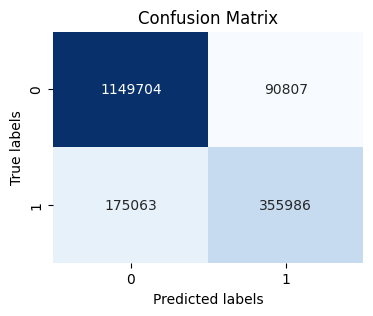


Accuracy on test data: 0.8499


In [31]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from keras.models import load_model
import os
import pandas as pd
from keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.optimizers import Adam

# Fonction pour charger les données
def load_data(chemin_dossier_csv):
    files = os.listdir(chemin_dossier_csv)
    X = []
    y = []

    for file in files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        features = df.iloc[:, 1].values  # Deuxième colonne : Dimension fractale
        decisions = df.iloc[:, 2].values  # Troisième colonne : Décision

        X.append(features)
        y.append(decisions)

    # Déterminer la longueur maximale des séquences pour le padding
    max_sequence_length = max(len(seq) for seq in X)

    # Redimensionner les séquences
    X = pad_sequences(X, maxlen=max_sequence_length, padding='post', dtype='float32')
    y = pad_sequences(y, maxlen=max_sequence_length, padding='post', dtype='int')

    return X, y, max_sequence_length

# Chemin vers le dossier contenant les fichiers CSV
chemin_dossier_csv = 'CSVN'

# Charger les données
X, y, max_sequence_length = load_data(chemin_dossier_csv)

# Séparer les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Reshape pour LSTM
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
y_train = y_train.reshape(y_train.shape[0], y_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)
y_test = y_test.reshape(y_test.shape[0], y_test.shape[1], 1)

# Charger le modèle pour l'évaluation
modele_charge = load_model('trainingMdel.h5')

# Faire des prédictions sur les données de test
y_pred = modele_charge.predict(X_test)
y_pred = (y_pred > 0.5)  # Convertir les probabilités en classes binaires (0 ou 1)

# Calculer la matrice de confusion
cm = confusion_matrix(y_test.flatten(), y_pred.flatten())

# Afficher la matrice de confusion avec seaborn
plt.figure(figsize=(4, 3))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

# Évaluer le modèle sur les données de test
loss, accuracy = modele_charge.evaluate(X_test, y_test, verbose=0)
print(f'\nAccuracy on test data: {accuracy:.4f}')

In [30]:
y_pred = modele_charge.predict(X_test)
accuracy = np.mean(np.equal(y_test, np.round(y_pred)))
print(f'\nAccuracy on test data: {accuracy:.4f}')

35/35 ━━━━━━━━━━━━━━━━━━━━ 184s 5s/step

Accuracy on test data: 0.8499


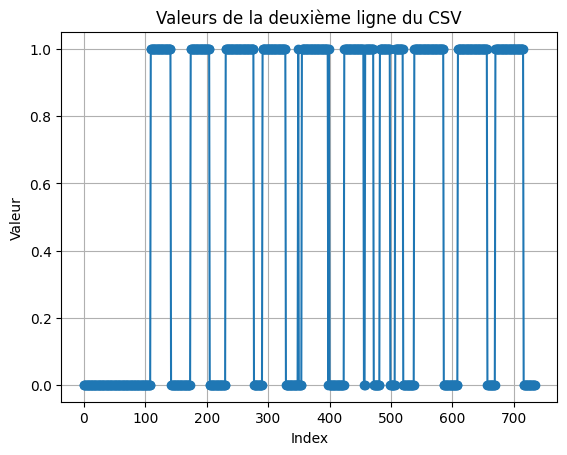

In [46]:
import csv
import matplotlib.pyplot as plt

# Lire le fichier CSV et extraire la deuxième ligne
filename = 'predictions.csv'
second_line = []

with open(filename, 'r') as csvfile:
    csvreader = csv.reader(csvfile)
    # Sauter la première ligne (en-tête)
    next(csvreader)
    # Lire la deuxième ligne
    second_line = next(csvreader)

# Convertir les valeurs en entier (ou en float si nécessaire)
second_line = [int(value) for value in second_line]

# Tracer les valeurs de la deuxième ligne
plt.plot(second_line, marker='o')
plt.title('Valeurs de la deuxième ligne du CSV')
plt.xlabel('Index')
plt.ylabel('Valeur')
plt.grid(True)
plt.show()


In [9]:
import numpy as np
import pandas as pd
from scipy.io import wavfile
import matplotlib.pyplot as plt

# Charger un fichier audio (par exemple, 'audio_file.wav')
sample_rate, audio_data = wavfile.read('Audio/SA1.wav')

# Créer une série temporelle avec pandas
timestamps = pd.date_range(start='2024-05-23', periods=len(audio_data), freq=pd.Timedelta(seconds=1/sample_rate))
audio_series = pd.Series(audio_data, index=timestamps)

# Rééchantillonner et calculer la densité spectrale de puissance
window_size = 30 * sample_rate  # taille de la fenêtre pour le calcul de l'énergie
energy = audio_series.rolling(window=window_size, min_periods=1).apply(
    lambda segment: (np.absolute(np.fft.fft(segment))**2 / window_size).sum()
)
print(energy)



KeyboardInterrupt: 

In [1]:
import numpy as np
import scipy.io.wavfile

def calculate_frame_energy(signal, sample_rate, frame_duration_ms=20):
    """
    Calcule l'énergie par trame de 20 ms pour un signal audio.

    Args:
        signal (array): Le signal audio.
        sample_rate (int): La fréquence d'échantillonnage du signal.
        frame_duration_ms (int): La durée de chaque trame en millisecondes.

    Returns:
        energies (array): Tableau des énergies pour chaque trame.
    """
    # Convertir la durée de la trame de millisecondes en nombre d'échantillons
    frame_length = int(sample_rate * frame_duration_ms / 1000)
    
    # Calculer le nombre de trames
    num_frames = int(np.ceil(len(signal) / frame_length))
    
    # Ajouter du padding pour les dernières trames si nécessaire
    padded_signal = np.append(signal, np.zeros(frame_length * num_frames - len(signal)))
    
    # Initialiser la liste des énergies
    energies = []
    
    # Calculer l'énergie pour chaque trame
    for i in range(num_frames):
        frame = padded_signal[i * frame_length : (i + 1) * frame_length]
        frame_energy = np.sum(frame ** 2)
        energies.append(frame_energy)
    
    return np.array(energies)

if __name__ == "__main__":
    # Charger un fichier audio
    fname = "Audio/SA1.wav"
    sample_rate, signal = scipy.io.wavfile.read(fname)
    
    # Calculer l'énergie par trame de 20 ms
    energies = calculate_frame_energy(signal, sample_rate)
    
    # Afficher les énergies calculées
    print("Energies par trame de 20 ms :")
    print(energies)

Energies par trame de 20 ms :
[4.45900000e+03 3.34500000e+03 4.33200000e+03 1.45850000e+04
 4.21700000e+03 5.21500000e+03 5.08100000e+03 5.13300000e+03
 4.63600000e+03 1.75846000e+05 1.50560200e+06 6.82243600e+06
 1.36855810e+07 3.17052600e+06 6.56454300e+06 2.26133900e+07
 3.06714760e+07 2.72095750e+07 6.89609000e+06 9.02012900e+06
 2.15011700e+07 6.87391560e+07 2.05611942e+08 3.78102715e+08
 3.64721364e+08 1.60574480e+08 9.12404660e+07 1.17405420e+07
 5.28522000e+05 7.80444000e+05 3.36632600e+06 3.62023500e+06
 2.25807900e+07 6.28813920e+07 4.44734760e+07 3.18830130e+07
 3.43633000e+05 1.66829000e+05 2.76552000e+05 1.20357440e+07
 4.69810440e+07 1.11570170e+08 1.61940038e+08 1.45606210e+08
 1.17033121e+08 1.41540950e+07 4.08466000e+05 4.06400000e+03
 5.12160000e+04 1.10866300e+06 2.23714200e+06 1.59084500e+06
 1.06656400e+06 1.43539500e+06 2.71666400e+06 2.18190700e+06
 7.26999100e+06 3.57333420e+07 4.80742090e+07 4.84040840e+07
 3.57297660e+07 2.35562790e+07 1.85347910e+07 1.6761989

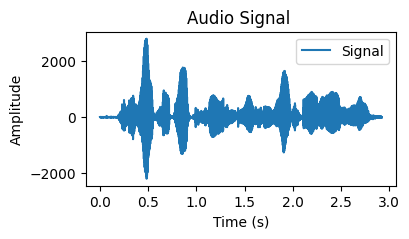

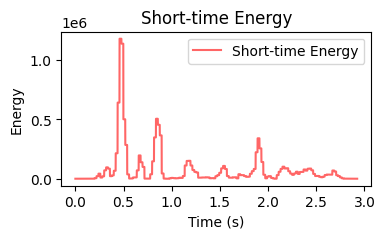

In [6]:
import numpy as np
import scipy.io.wavfile
import matplotlib.pyplot as plt

def stride_trick(a, stride_length, stride_step):
    """
    Apply framing using the stride trick from numpy.

    Args:
        a (array): Signal array.
        stride_length (int): Length of the stride.
        stride_step (int): Stride step.

    Returns:
        Framed array.
    """
    nrows = ((a.size - stride_length) // stride_step) + 1
    n = a.strides[0]
    return np.lib.stride_tricks.as_strided(a, shape=(nrows, stride_length), strides=(stride_step * n, n))

def framing(sig, fs=16000, win_len=0.025, win_hop=0.01):
    """
    Transform a signal into a series of overlapping frames (Frame blocking).

    Args:
        sig (array): A mono audio signal (Nx1) from which to compute features.
        fs (int): The sampling frequency of the signal. Default is 16000.
        win_len (float): Window length in seconds. Default is 0.025.
        win_hop (float): Step between successive windows in seconds. Default is 0.01.

    Returns:
        Array of frames and frame length.
    """
    frame_length = int(win_len * fs)
    frame_step = int(win_hop * fs)
    signal_length = len(sig)
    num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step)) + 1

    pad_signal_length = num_frames * frame_step + frame_length
    z = np.zeros((pad_signal_length - signal_length))
    pad_signal = np.append(sig, z)

    indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T
    frames = pad_signal[indices.astype(np.int32, copy=False)]
    
    return frames, frame_length

def _calculate_normalized_short_time_energy(frames):
    """
    Calculate the normalized short-time energy for each frame.

    Args:
        frames (array): Array of frames.

    Returns:
        energies (array): Array of normalized short-time energies for each frame.
    """
    return np.sum(frames**2, axis=1) / frames.shape[1]

def plot_signal_with_energy(signal, sample_rate, energies, frame_length):
    """
    Plot the original signal and the short-time energy overlaid.

    Args:
        signal (array): The original audio signal.
        sample_rate (int): The sample rate of the audio signal.
        energies (array): The short-time energies of the frames.
        frame_length (int): The length of each frame in samples.
    """
    time_signal = np.linspace(0, len(signal) / sample_rate, num=len(signal))
    time_energy = np.linspace(0, len(signal) / sample_rate, num=len(energies))

    plt.figure(figsize=(4, 2))
    plt.plot(time_signal, signal, label='Signal')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.title('Audio Signal ')
    plt.legend()
    plt.show()
    plt.figure(figsize=(4, 2))
    plt.plot(time_energy, energies, label='Short-time Energy', color='red', alpha=0.6)
    plt.xlabel('Time (s)')
    plt.ylabel('Energy')
    plt.title('Short-time Energy')
    plt.legend()
    plt.show()

if __name__ == "__main__":
    # Charger un fichier audio
    fname = "Audio/SA1.wav"
    sample_rate, signal = scipy.io.wavfile.read(fname)
    
    # Découper le signal en trames de 20 ms (0.02 secondes)
    frame_duration_ms = 20
    win_len = frame_duration_ms / 1000  # Convertir en secondes
    win_hop = win_len  # Pas de chevauchement pour des trames consécutives
    frames, frame_length = framing(signal, sample_rate, win_len, win_hop)
    
    # Calculer l'énergie par trame de 20 ms
    energies = _calculate_normalized_short_time_energy(frames)
    
    # Étirer les valeurs d'énergie pour correspondre à la longueur du signal
    stretched_energies = np.repeat(energies, frame_length)
    
    # Tracer le signal original et les énergies à court terme
    plot_signal_with_energy(signal, sample_rate, stretched_energies, frame_length)

In [8]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, BatchNormalization

# Chemin du dossier contenant les fichiers CSV
dossier_csv = 'CSVN'

# Initialiser un DataFrame vide pour stocker toutes les données
df_total = pd.DataFrame()

# Boucle pour lire chaque fichier CSV dans le dossier
for fichier in os.listdir(dossier_csv):
    chemin_complet = os.path.join(dossier_csv, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        df = pd.read_csv(chemin_complet)
        df_total = pd.concat([df_total, df], ignore_index=True)

# Séparer les caractéristiques (DF) et les étiquettes (Decision)
X = df_total.iloc[:, 1].values.reshape(-1, 1)  # DF est la deuxième colonne
y = df_total.iloc[:, 2].values  # Decision est la troisième colonne

# Normaliser les caractéristiques
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Redimensionner les données pour le modèle CNN
X_reshaped = X_normalized.reshape((X_normalized.shape[0], 1, 1))

# Diviser les données en ensembles d'entraînement, de validation et de test
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y, test_size=0.3, random_state=42)

# Construction du modèle CNN amélioré
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=(1, 1)))
model.add(BatchNormalization())
model.add(MaxPooling1D(pool_size=1))
model.add(Dropout(0.3))

model.add(Conv1D(filters=32, kernel_size=1, activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling1D(pool_size=1))
model.add(Dropout(0.3))

model.add(Conv1D(filters=16, kernel_size=1, activation='relu'))
model.add(BatchNormalization())
model.add(Flatten())

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(32, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

# Compilation du modèle
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Évaluation du modèle
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Perte: {loss}, Précision: {accuracy}')
model.save('modele_cnn_ameliore.h5')

# Plot the training and validation loss and accuracy
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.show()

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/50
81913/81913 ━━━━━━━━━━━━━━━━━━━━ 1212s 15ms/step - accuracy: 0.5305 - loss: 0.6914 - val_accuracy: 0.5310 - val_loss: 0.6912
Epoch 2/50
44374/81913 ━━━━━━━━━━━━━━━━━━━━ 7:47 12ms/step - accuracy: 0.5301 - loss: 0.6914

KeyboardInterrupt: 

In [20]:
import os
import numpy as np
import pandas as pd
import librosa

def load_data(audio_folder, csv_folder):
    features = []
    labels = []
    
    # Parcours des fichiers audio dans le dossier spécifié
    for audio_file in os.listdir(audio_folder):
        if audio_file.endswith('.wav'):
            audio_path = os.path.join(audio_folder, audio_file)
            
            # Charger le fichier audio
            y, sr = librosa.load(audio_path, sr=None)
            
            # Construire le nom du fichier CSV correspondant
            csv_filename = f"{os.path.splitext(audio_file)[0]}_fractal_df.csv"
            csv_file = os.path.join(csv_folder, csv_filename)
            
            # Vérifier si le fichier CSV existe
            if os.path.exists(csv_file):
                print(f"Processing {audio_file}...")
                
                # Charger les données CSV
                df = pd.read_csv(csv_file, header=None)  # Assurez-vous de définir les en-têtes correctement
                print(f"CSV shape: {df.shape}")
                
                # Vérifiez les premières lignes pour comprendre la structure des données
                print(df.head())
                
                # Parcours des lignes du CSV
                for index, row in df.iterrows():
                    try:
                        decision = int(row[2])  # Colonne où la décision est
                    except KeyError as e:
                        print(f"KeyError: {e}")
                        print(f"Row with issue: {row}")
                        continue
                    
                    # Découper le signal en frames de 10 ms et calculer les MFCC
                    frame_length = int(0.01 * sr)  # 10 ms en échantillons
                    hop_length = frame_length  # Pas de chevauchement
                    
                    start_frame = index * frame_length
                    end_frame = start_frame + frame_length
                    
                    # Assurez-vous que la frame finale ne dépasse pas la longueur du signal
                    if end_frame >= len(y):
                        break
                    
                    mfccs = librosa.feature.mfcc(y=y[start_frame:end_frame+1], sr=sr, n_fft=frame_length, hop_length=hop_length, n_mfcc=13)
                    
                    # Ajouter la caractéristique MFCC et la décision à la liste
                    features.append(mfccs.T)  # Transposer pour avoir (temps, MFCC)
                    labels.append(decision)
            else:
                print(f"CSV file not found for {audio_file}.")
    
    return np.array(features), np.array(labels)

In [24]:
import os
import numpy as np
import pandas as pd
import librosa
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout

def enframe(x, win, inc=None):
    nx = len(x)
    nwin = len(win) if hasattr(win, '__len__') else win
    len_win = nwin if nwin != 1 else win
    
    if inc is None:
        inc = len_win
    
    nf = (nx - len_win + inc) // inc
    frames = np.zeros((nf, len_win))
    indf = inc * np.arange(nf).reshape(-1, 1)
    inds = np.arange(len_win)
    frames = x[indf + inds]
    
    if hasattr(win, '__len__'):
        w = np.array(win).reshape(1, -1)
        frames *= w
    
    return frames

def load_data(audio_folder, csv_folder, rFs=16000, frSize=0.01):
    features = []
    labels = []
    
    # Parcours des fichiers audio dans le dossier spécifié
    for audio_file in os.listdir(audio_folder):
        if audio_file.endswith('.wav'):
            audio_path = os.path.join(audio_folder, audio_file)
            
            # Charger le fichier audio en stéréo
            y11, fs = librosa.load(audio_path, sr=None, mono=False)
            
            # Utiliser seulement le premier canal si stéréo
            if y11.ndim == 2:
                y1 = y11[0, :]
            else:
                y1 = y11
            
            # Rééchantillonnage si nécessaire
            if fs != rFs:
                y = librosa.resample(y1, orig_sr=fs, target_sr=rFs)
                fs = rFs
            else:
                y = y1
            
            # Remplissage de zéros pour rendre la longueur du signal divisible par la taille de la fenêtre
            lFr = int(fs * frSize)  # Taille de la fenêtre en échantillons
            padSize = lFr - (len(y) % lFr) if len(y) % lFr != 0 else 0
            y = np.pad(y, (0, padSize), 'constant')
            
            # Découpage du signal en fenêtres de 10 ms
            frames = enframe(y, lFr, lFr)
            
            # Construire le nom du fichier CSV correspondant
            csv_filename = f"{os.path.splitext(audio_file)[0]}_fractal_df.csv"
            csv_file = os.path.join(csv_folder, csv_filename)
            
            # Vérifier si le fichier CSV existe
            if os.path.exists(csv_file):
                print(f"Processing {audio_file}...")
                
                # Charger les données CSV (colonne 2ème pour les décisions)
                df = pd.read_csv(csv_file, header=None)
                decisions = df.iloc[:, 1]
                
                # Vérifier la correspondance entre le nombre de frames et les décisions
                num_frames = len(frames)
                if num_frames != len(decisions):
                    print(f"Warning: Number of frames ({num_frames}) does not match number of decisions ({len(decisions)}) in {csv_file}")
                
                # Parcours des frames
                for i in range(num_frames):
                    frame = frames[i]
                    
                    # Calculer les MFCC pour cette frame
                    mfccs = librosa.feature.mfcc(y=frame, sr=fs, n_mfcc=13)
                    
                    # Transposer les MFCC si nécessaire pour obtenir la forme correcte (temps, 13)
                    if mfccs.shape != (13,):  # Assurez-vous que les MFCC sont (temps, 13)
                        mfccs = mfccs.T  
                    
                    # Vérifier la forme des MFCC
                    if mfccs.shape == (1, 13):
                        features.append(mfccs)
                        labels.append(int(decisions.iloc[i]))  # Décision correspondant à cette frame
                    else:
                        print(f"Warning: MFCC shape mismatch for frame {i} in {audio_file}. Expected (1, 13), got {mfccs.shape}")
                
                # Debug: Afficher la forme des MFCC après traitement du fichier audio
                print(f"Shape of features after {audio_file}: {[f.shape for f in features]} frames")
                
            else:
                print(f"CSV file not found for {audio_file}.")
    
    return np.array(features), np.array(labels)

# Chargement des données
audio_folder = 'speech'
csv_folder = 'training_set'
features, labels = load_data(audio_folder, csv_folder)

# Vérification des dimensions des features et des labels
print(f"Shape of features: {features.shape}")
print(f"Shape of labels: {labels.shape}")

# Remodeler les données d'entrée pour les rendre compatibles avec le modèle LSTM
features = np.array(features).reshape((features.shape[0], features.shape[1], features.shape[2]))

# Construction du modèle LSTM
model = Sequential([
    LSTM(units=64, input_shape=(features.shape[1], features.shape[2]), return_sequences=True),
    Dropout(0.3),
    LSTM(units=64),
    Dropout(0.3),
    Dense(units=1, activation='sigmoid')
])

# Compilation du modèle
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
model.fit(features, labels, epochs=10, batch_size=32, validation_split=0.2)

Processing NS10-OF-NO1-BC.wav...


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=160
  warnings.warn(


Shape of features after NS10-OF-NO1-BC.wav: [(1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=160
  warnings.warn(


Shape of features after NS10-OF-NO1-MC.wav: [(1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=160
  warnings.warn(


Shape of features after NS10-OF-NO1-MF.wav: [(1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=160
  warnings.warn(


Shape of features after NS10-OF-NO1-YM.wav: [(1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=160
  warnings.warn(


Shape of features after NS14-OF-NO1-MC.wav: [(1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=160
  warnings.warn(


Shape of features after NS14-OF-NO1-MF.wav: [(1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=160
  warnings.warn(


Shape of features after NS14-OF-NO1-YM.wav: [(1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (1, 13), (

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=160
  warnings.warn(


KeyboardInterrupt: 

441
Nombre de trames : 144359


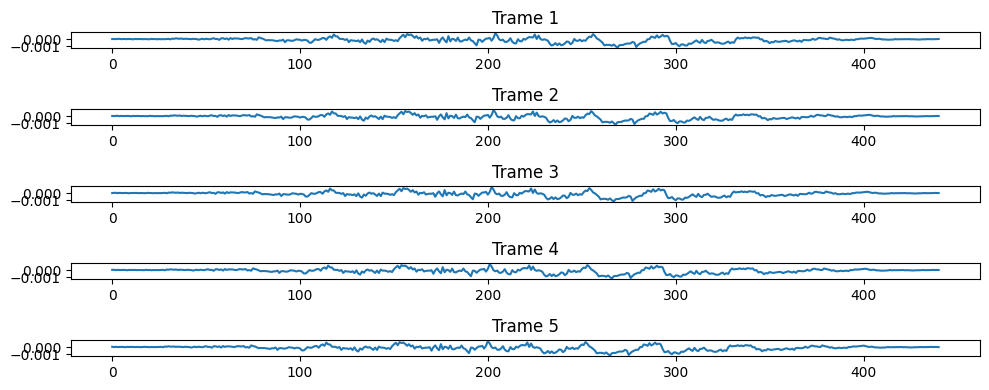

In [44]:
import numpy as np
import librosa
import matplotlib.pyplot as plt

def enframe(x, win, inc):
    """
    Divise le signal en trames en utilisant une fenêtre spécifiée.
    
    Arguments :
        x (array) : Signal audio à diviser en trames.
        win (array) : Fenêtre à appliquer à chaque trame.
        inc (int) : Pas entre les trames.
    
    Renvoie :
        array : Matrice où chaque ligne représente une trame.
    """
    nx = len(x)
    nwin = len(win)
    if nwin == 1:
        len_frame = win
    else:
        len_frame = nwin
    if inc <= 0:
        inc = 1
    if len_frame % 2 == 0:
        indf = np.arange(0, nx - len_frame + inc, inc, dtype=int)
    else:
        indf = np.arange(0, nx - len_frame + inc - 1, inc, dtype=int)
    inds = np.arange(len_frame, dtype=int)
    nframes = len(indf)
    frames = np.zeros((nframes, len_frame))
    for i in range(nframes):
        frames[i] = x[indf[i] + inds] * win
    return frames

# Charger le signal audio (ex. déjà effectué dans votre cas)
stereo_file = './speech/NS10-OF-NO1-BC.wav'
y, sr = librosa.load(stereo_file, sr=44100, mono=False)

# Convertir en mono et resampler à 16 kHz (ex. déjà effectué dans votre cas)
y_mono = librosa.to_mono(y)
y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=16000)

# Paramètres de la trame
frame_length_ms = 10  # Longueur de la trame en millisecondes
frame_shift_ms = 0    # Décalage (overlap) de la trame en millisecondes

frame_length = int(frame_length_ms * sr / 1000)    # Longueur de la trame en échantillons
frame_shift = int(frame_shift_ms * sr / 1000)      # Décalage de la trame en échantillons
print(frame_length)
# Fenêtre Hamming
win = np.hamming(frame_length)

# Diviser le signal en trames avec la fonction enframe
frames = enframe(y_resampled, win, inc=frame_shift)

# Affichage des résultats
num_frames = frames.shape[0]
print(f"Nombre de trames : {num_frames}")

# Affichage des trames (par exemple, les 5 premières trames)
plt.figure(figsize=(10, 4))
for i in range(5):
    plt.subplot(5, 1, i + 1)
    plt.plot(frames[i])
    plt.title(f"Trame {i + 1}")
plt.tight_layout()
plt.show()

In [15]:
import os
import pandas as pd
import numpy as np
import librosa

def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

def extract_mfcc(y, sr, frame_length=0.01, n_mfcc=13):
    try:
        hop_length = int(sr * frame_length)
        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, hop_length=hop_length)
        mfccs = mfccs.T
        return mfccs
    except Exception as e:
        print(f"Error extracting MFCC: {e}")
        return None

def process_files(csv_folder, audio_folder, output_file, target_sr=16000, frame_length=0.01):
    data = []
    skipped_files_count = 0

    for csv_file in os.listdir(csv_folder):
        if csv_file.endswith('_fractal_df.csv'):
            csv_path = os.path.join(csv_folder, csv_file)
            df = pd.read_csv(csv_path, header=None)
            decisions = df.iloc[:, 1].values

            audio_file_base = csv_file.replace('_fractal_df.csv', '')
            audio_path = os.path.join(audio_folder, f"{audio_file_base}.wav")

            if os.path.exists(audio_path):
                y, sr = process_audio_file(audio_path, target_sr)
                if y is not None and sr is not None:
                    mfccs = extract_mfcc(y, sr, frame_length)
                    if mfccs is not None:
                        # Ajuster les décisions pour correspondre aux frames
                        while len(mfccs) > len(decisions):
                            decisions = np.append(decisions, 0)
                        
                        if len(mfccs) == len(decisions):
                            for mfcc, decision in zip(mfccs, decisions):
                                data.append((mfcc, decision))
                        else:
                            print(f"Still mismatched for {audio_file_base}.wav: {len(mfccs)} frames, {len(decisions)} decisions")
                    else:
                        print(f"Failed to extract MFCCs for {audio_file_base}.wav")
                else:
                    print(f"Failed to process audio file {audio_file_base}.wav")
            else:
                # print(f"Audio file {audio_file_base}.wav not found. Skipping the corresponding CSV file.")
                skipped_files_count += 1

    if data:
        # Convert the list of tuples to a structured array to save as .npy
        structured_data = np.array(data, dtype=object)
        np.save(output_file, structured_data)
        print(f"Data saved to {output_file}")
    else:
        print("No data to save")

    # Print the number of skipped files
    print(f"Number of CSV files skipped due to missing audio files: {skipped_files_count}")

# Define folders and output file
csv_folder = 'training_set'
audio_folder = 'speech'
output_file = 'processed_data.npy'

# Process the files and save the data
process_files(csv_folder, audio_folder, output_file)

Audio file S147-OF-NO1-BC.wav not found. Skipping the corresponding CSV file.
Audio file S147-OF-NO1-MC.wav not found. Skipping the corresponding CSV file.
Audio file S147-OF-NO1-MF.wav not found. Skipping the corresponding CSV file.
Audio file S147-OF-NO1-YM.wav not found. Skipping the corresponding CSV file.
Audio file S148-OF-NO1-BC.wav not found. Skipping the corresponding CSV file.
Audio file S148-OF-NO1-MC.wav not found. Skipping the corresponding CSV file.
Audio file S148-OF-NO1-MF.wav not found. Skipping the corresponding CSV file.
Audio file S148-OF-NO1-YM.wav not found. Skipping the corresponding CSV file.
Audio file S149-OF-NO1-BC.wav not found. Skipping the corresponding CSV file.
Audio file S149-OF-NO1-MC.wav not found. Skipping the corresponding CSV file.
Audio file S149-OF-NO1-MF.wav not found. Skipping the corresponding CSV file.
Audio file S149-OF-NO1-YM.wav not found. Skipping the corresponding CSV file.
Audio file S150-OF-NO1-BC.wav not found. Skipping the correspond

In [18]:
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Charger les données prétraitées
data = np.load('processed_data.npy', allow_pickle=True)
X, y = zip(*data)

# Convertir les listes en tableaux numpy
X = np.array(X)
y = np.array(y)

# Vérifier la forme actuelle de X
print("Shape of X before reshaping:", X.shape)

# Redimensionner X pour correspondre aux exigences de l'entrée LSTM
# Si X a la forme (nombre_d'échantillons, nombre_de_caractéristiques),
# redimensionner pour ajouter une dimension pour les timesteps
X = X.reshape(X.shape[0], X.shape[1], 1)

# Vérifier la forme de X après redimensionnement
print("Shape of X after reshaping:", X.shape)

# Définir le modèle LSTM
model = Sequential()
model.add(LSTM(128, input_shape=(X.shape[1], X.shape[2])))
model.add(Dense(1, activation='sigmoid'))  # Couche de sortie binaire (1 neurone pour 1 ou 0)

# Compiler le modèle
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entraîner le modèle
model.fit(X, y, epochs=10, batch_size=32, validation_split=0.2)


Shape of X before reshaping: (507948, 13)
Shape of X after reshaping: (507948, 13, 1)


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
12699/12699 ━━━━━━━━━━━━━━━━━━━━ 152s 12ms/step - accuracy: 0.9287 - loss: 0.1768 - val_accuracy: 0.9486 - val_loss: 0.1312
Epoch 2/10
12699/12699 ━━━━━━━━━━━━━━━━━━━━ 170s 13ms/step - accuracy: 0.9480 - loss: 0.1285 - val_accuracy: 0.9505 - val_loss: 0.1204
Epoch 3/10
12699/12699 ━━━━━━━━━━━━━━━━━━━━ 216s 17ms/step - accuracy: 0.9505 - loss: 0.1209 - val_accuracy: 0.9504 - val_loss: 0.1238
Epoch 4/10
12699/12699 ━━━━━━━━━━━━━━━━━━━━ 210s 17ms/step - accuracy: 0.9544 - loss: 0.1123 - val_accuracy: 0.9507 - val_loss: 0.1302
Epoch 5/10
12699/12699 ━━━━━━━━━━━━━━━━━━━━ 184s 14ms/step - accuracy: 0.9566 - loss: 0.1068 - val_accuracy: 0.9468 - val_loss: 0.1320
Epoch 6/10
12699/12699 ━━━━━━━━━━━━━━━━━━━━ 309s 24ms/step - accuracy: 0.9584 - loss: 0.1029 - val_accuracy: 0.9487 - val_loss: 0.1346
Epoch 7/10
12699/12699 ━━━━━━━━━━━━━━━━━━━━ 449s 35ms/step - accuracy: 0.9602 - loss: 0.0971 - val_accuracy: 0.9494 - val_loss: 0.1321
Epoch 8/10
12699/12699 ━━━━━━━━━━━━━━━━━━━━ 457s 36ms/s

In [42]:
import os
import pandas as pd
import numpy as np
import librosa

# Fonction pour charger et prétraiter l'audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Erreur lors du traitement du fichier audio {audio_path}: {e}")
        return None, None

# Fonction pour extraire les MFCCs
def extract_mfcc(y, sr, frame_length=0.01, n_mfcc=13):
    try:
        hop_length = int(sr * frame_length)
        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, hop_length=hop_length)
        mfccs = mfccs.T
        return mfccs
    except Exception as e:
        print(f"Erreur lors de l'extraction des MFCC: {e}")
        return None

# Fonction pour calculer l'énergie RMS
def extract_energy(y):
    return np.sum(y**2)

# Fonction pour calculer le ZCR
def extract_zcr(y, frame_length=0.01, sr=16000):
    hop_length = int(sr * frame_length)
    zcr = librosa.feature.zero_crossing_rate(y, frame_length=hop_length, hop_length=hop_length)[0]
    return zcr

# Fonction pour traiter les fichiers et extraire les caractéristiques
def process_files(csv_folder, audio_folder, output_file, target_sr=16000, frame_length=0.01):
    data = []
    skipped_files_count = 0

    for csv_file in os.listdir(csv_folder):
        if csv_file.endswith('_fractal_df.csv'):
            csv_path = os.path.join(csv_folder, csv_file)
            df = pd.read_csv(csv_path, header=None)
            decisions = df.iloc[:, 1].values

            audio_file_base = csv_file.replace('_fractal_df.csv', '')
            audio_path = os.path.join(audio_folder, f"{audio_file_base}.wav")

            if os.path.exists(audio_path):
                y, sr = process_audio_file(audio_path, target_sr)
                if y is not None and sr is not None:
                    mfccs = extract_mfcc(y, sr, frame_length)
                    energy = extract_energy(y)
                    zcr = extract_zcr(y, frame_length, sr)
                    if mfccs is not None:
                        # Ajuster les décisions pour correspondre aux frames
                        while len(mfccs) > len(decisions):
                            decisions = np.append(decisions, 0)
                        
                        if len(mfccs) == len(decisions):
                            # Calculate energy for each frame
                            energies = np.full(len(mfccs), energy)
                            
                            # Calculate zcr for each frame
                            zcrs = np.full(len(mfccs), zcr)
                            
                            for mfcc, decision, e, z in zip(mfccs, decisions, energies, zcrs):
                                data.append((mfcc, decision, e, z))
                        else:
                            print(f"Décalage pour {audio_file_base}.wav: {len(mfccs)} frames, {len(decisions)} décisions")
                    else:
                        print(f"Échec de l'extraction des MFCCs pour {audio_file_base}.wav")
                else:
                    print(f"Échec du traitement du fichier audio {audio_file_base}.wav")
            else:
                skipped_files_count += 1

    if data:
        structured_data = np.array(data, dtype=object)
        np.save(output_file, structured_data)
        print(f"Données enregistrées dans {output_file}")
    else:
        print("Aucune donnée à enregistrer")

    print(f"Nombre de fichiers CSV ignorés en raison de fichiers audio manquants : {skipped_files_count}")

# Définir les dossiers et le fichier de sortie
csv_folder = 'training_set'
audio_folder = 'speech'
output_file = 'processed_data.npy'

# Traiter les fichiers et enregistrer les données
process_files(csv_folder, audio_folder, output_file)

Données enregistrées dans processed_data.npy
Nombre de fichiers CSV ignorés en raison de fichiers audio manquants : 32


In [45]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from sklearn.model_selection import train_test_split

# Charger les données structurées
data = np.load('processed_data.npy', allow_pickle=True)

# Séparer les caractéristiques et les étiquettes
features = np.array([x[0] for x in data])  # MFCCs
energies = np.array([x[2] for x in data])  # Énergie
zcrs = np.array([x[3] for x in data])  # ZCR
labels = np.array([x[1] for x in data])  # Étiquettes de décision

# Normaliser les caractéristiques
scaler = StandardScaler()
features = scaler.fit_transform(features)
energies = scaler.fit_transform(energies.reshape(-1, 1)).flatten()
zcrs = scaler.fit_transform(zcrs.reshape(-1, 1)).flatten()

# Définir 'n_steps', le nombre de pas de temps par séquence
n_steps = 100  # Ce nombre doit être déterminé en fonction de votre analyse des données

# Redimensionner les caractéristiques pour correspondre à 'n_steps'
n_samples = len(features) // n_steps
features = features[:n_samples * n_steps].reshape((n_samples, n_steps, features.shape[1]))
energies = energies[:n_samples * n_steps].reshape((n_samples, n_steps, 1))
zcrs = zcrs[:n_samples * n_steps].reshape((n_samples, n_steps, 1))

# Concaténer les caractéristiques pour former les séquences d'entrée
input_sequences = np.concatenate((features, energies, zcrs), axis=-1)

# Redimensionner les étiquettes pour correspondre aux séquences d'entrée
labels = labels[:n_samples * n_steps].reshape((n_samples, n_steps))

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(input_sequences, labels, test_size=0.2, random_state=42)

# Construire le modèle LSTM
model = Sequential([
    LSTM(64, input_shape=(n_steps, input_sequences.shape[2]), return_sequences=True),
    Dropout(0.5),
    LSTM(64),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Compiler le modèle
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

y_train = y_train[:, -1]
y_test = y_test[:, -1]

# Ensuite, vous pouvez entraîner votre modèle avec ces étiquettes ajustées :
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

# Évaluer le modèle
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 41s 280ms/step - accuracy: 0.8014 - loss: 0.4582 - val_accuracy: 0.9385 - val_loss: 0.1739
Epoch 2/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - accuracy: 0.9370 - loss: 0.1697 - val_accuracy: 0.9508 - val_loss: 0.1462
Epoch 3/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 25s 241ms/step - accuracy: 0.9417 - loss: 0.1458 - val_accuracy: 0.9446 - val_loss: 0.1461
Epoch 4/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 24s 230ms/step - accuracy: 0.9564 - loss: 0.1268 - val_accuracy: 0.9483 - val_loss: 0.1375
Epoch 5/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 25s 240ms/step - accuracy: 0.9543 - loss: 0.1171 - val_accuracy: 0.9459 - val_loss: 0.1280
Epoch 6/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 23s 228ms/step - accuracy: 0.9623 - loss: 0.1009 - val_accuracy: 0.9434 - val_loss: 0.1361
Epoch 7/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 23s 228ms/step - accuracy: 0.9737 - loss: 0.0813 - val_accuracy: 0.9496 - val_loss: 0.1289
Epoch 8/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 22s 219ms/step - accuracy: 0.9671 - loss: 0

In [9]:
import numpy as np

# Charger les données prétraitées
processed_data = np.load('processed_data.npy', allow_pickle=True)
X_mfcc = np.array([item[0] for item in processed_data])  # MFCCs
X_energy = np.array([item[2] for item in processed_data])  # Énergie
X_zcr = np.array([item[3] for item in processed_data])  # ZCR
y = np.array([item[1] for item in processed_data])  # Décisions

# Vérifier les dimensions
print(f"MFCCs shape: {X_mfcc.shape}, Energy shape: {X_energy.shape}, ZCR shape: {X_zcr.shape}, Labels shape: {y.shape}")

MFCCs shape: (507948, 13), Energy shape: (507948,), ZCR shape: (507948,), Labels shape: (507948,)


In [10]:
from keras.preprocessing.sequence import pad_sequences

# Concaténer toutes les caractéristiques
X_combined = np.concatenate((X_mfcc, X_energy[:, np.newaxis], X_zcr[:, np.newaxis]), axis=1)

# Paddage des séquences pour avoir des longueurs uniformes
X_combined_padded = pad_sequences(X_combined, dtype='float32', padding='post')

# Vérifier les dimensions après le paddage
print(f"Combined features shape after padding: {X_combined_padded.shape}")

Combined features shape after padding: (507948, 15)


In [15]:
from keras.preprocessing.sequence import pad_sequences

# Paddage des séquences pour avoir des longueurs uniformes si nécessaire
X_combined_padded = pad_sequences(X_combined, dtype='float32', padding='post')

In [16]:
X_combined_padded = X_combined  # Si les séquences sont déjà de longueur fixe

In [19]:
# Réorganiser X_combined pour inclure une dimension de longueur de séquence fixe
X_combined = X_combined.reshape(X_combined.shape[0], X_combined.shape[1], 1)

# Créer le modèle LSTM en utilisant X_combined avec la nouvelle dimension ajoutée
model = Sequential([
    LSTM(units=64, input_shape=(X_combined.shape[1], X_combined.shape[2])),
    Dense(units=1, activation='sigmoid')  # Couche de sortie pour la classification binaire, ajuster en fonction de votre tâche
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])



In [22]:
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split

# Charger les données prétraitées
processed_data = np.load('processed_data.npy', allow_pickle=True)
X_combined_padded = np.array([item[0] for item in processed_data])
y = np.array([item[1] for item in processed_data])

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_combined_padded, y, test_size=0.2, random_state=42)

In [24]:
# Réorganiser X_train pour inclure une dimension de longueur de séquence fixe
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)

# Créer le modèle LSTM avec les bonnes dimensions d'entrée
model = Sequential([
    LSTM(units=64, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(units=1, activation='sigmoid')  # Couche de sortie pour la classification binaire, ajuster en fonction de votre tâche
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

model.summary()

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                   │ (None, 64)             │        16,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,961 (66.25 KB)

 Trainable params: 16,961 (66.25 KB)

 Non-trainable params: 0 (0.00 B)

In [25]:
# Charger les données prétraitées
processed_data = np.load('processed_data.npy', allow_pickle=True)
X_combined_padded = np.array([item[0] for item in processed_data])
y = np.array([item[1] for item in processed_data])

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_combined_padded, y, test_size=0.2, random_state=42)

In [26]:
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

In [27]:
model = Sequential([
    LSTM(units=64, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(units=1, activation='sigmoid')  # Couche de sortie pour la classification binaire
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_3 (LSTM)                   │ (None, 64)             │        16,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,961 (66.25 KB)

 Trainable params: 16,961 (66.25 KB)

 Non-trainable params: 0 (0.00 B)

In [28]:
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/10
10273/12699 ━━━━━━━━━━━━━━━━━━━━ 46s 19ms/step - accuracy: 0.9234 - loss: 0.1925

KeyboardInterrupt: 

In [29]:
processed_data = np.load('processed_data.npy', allow_pickle=True)
X = np.array([item[:-1] for item in processed_data])  # Utiliser toutes les features sauf la dernière (qui est l'étiquette)
y = np.array([item[-1] for item in processed_data])   # Dernière colonne comme étiquette

In [30]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [31]:
# Si nécessaire pour les séquences de longueur fixe
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

In [32]:
from keras.models import Sequential
from keras.layers import LSTM, Dense

model = Sequential([
    LSTM(units=64, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(units=1, activation='sigmoid')  # Couche de sortie pour la classification binaire, ajustez selon votre tâche
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [36]:
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split

# Chargement des données
processed_data = np.load('processed_data.npy', allow_pickle=True)
X = np.array([item[:-1] for item in processed_data])
y = np.array([item[-1] for item in processed_data])

# Division des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

import numpy as np

print(type(X_train))  # Devrait être <class 'numpy.ndarray'>
print(type(y_train))  # Devrait être <class 'numpy.ndarray'>
print(type(X_test))   # Devrait être <class 'numpy.ndarray'>
print(type(y_test))   # Devrait être <class 'numpy.ndarray'>

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(406358, 3)
(406358,)
(101590, 3)
(101590,)


In [57]:
import os
import pandas as pd
import numpy as np
import librosa
from keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout

# Fonction pour charger et prétraiter l'audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Erreur lors du traitement du fichier audio {audio_path}: {e}")
        return None, None

# Fonction pour extraire les MFCCs
def extract_mfcc(y, sr, frame_length=0.01, n_mfcc=13):
    try:
        hop_length = int(sr * frame_length)
        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, hop_length=hop_length)
        mfccs = mfccs.T
        return mfccs
    except Exception as e:
        print(f"Erreur lors de l'extraction des MFCC: {e}")
        return None

# Fonction pour calculer l'énergie RMS
def extract_energy(y):
    return np.sum(y**2)

# Fonction pour calculer le ZCR
def extract_zcr(y, frame_length=0.01, sr=16000):
    hop_length = int(sr * frame_length)
    zcr = librosa.feature.zero_crossing_rate(y, frame_length=hop_length, hop_length=hop_length)[0]
    return zcr

# Fonction pour traiter les fichiers et extraire les caractéristiques
def process_files(csv_folder, audio_folder, output_file, target_sr=16000, frame_length=0.01):
    data = []
    skipped_files_count = 0

    for csv_file in os.listdir(csv_folder):
        if csv_file.endswith('_fractal_df.csv'):
            csv_path = os.path.join(csv_folder, csv_file)
            df = pd.read_csv(csv_path, header=None)
            decisions = df.iloc[:, 1].values

            audio_file_base = csv_file.replace('_fractal_df.csv', '')
            audio_path = os.path.join(audio_folder, f"{audio_file_base}.wav")

            if os.path.exists(audio_path):
                y, sr = process_audio_file(audio_path, target_sr)
                if y is not None and sr is not None:
                    mfccs = extract_mfcc(y, sr, frame_length)
                    energy = extract_energy(y)
                    zcr = extract_zcr(y, frame_length, sr)
                    if mfccs is not None:
                        # Ajuster les décisions pour correspondre aux frames
                        while len(mfccs) > len(decisions):
                            decisions = np.append(decisions, 0)
                        
                        if len(mfccs) == len(decisions):
                            # Convertir les énergies et zcrs en listes d'objets itérables
                            energies_list = [np.full_like(mfcc, energy) for mfcc in mfccs]
                            zcrs_list = [extract_zcr(mfcc.T, frame_length, sr) for mfcc in mfccs]
                            
                            # Pad sequences pour les énergies et zcrs
                            X_energies = pad_sequences(energies_list, maxlen=len(mfccs), padding='post', dtype='float32')
                            X_zcrs = pad_sequences(zcrs_list, maxlen=len(mfccs), padding='post', dtype='float32')
                            
                            # Parcourir les caractéristiques extraites et les ajouter à data
                            for mfcc, decision, e, z in zip(mfccs, decisions, X_energies, X_zcrs):
                                data.append((mfcc, decision, e, z))
                        else:
                            print(f"Décalage pour {audio_file_base}.wav: {len(mfccs)} frames, {len(decisions)} décisions")
                    else:
                        print(f"Échec de l'extraction des MFCCs pour {audio_file_base}.wav")
                else:
                    print(f"Échec du traitement du fichier audio {audio_file_base}.wav")
            else:
                skipped_files_count += 1

    if data:
        structured_data = np.array(data, dtype=object)
        np.save(output_file, structured_data)
        print(f"Données enregistrées dans {output_file}")
    else:
        print("Aucune donnée à enregistrer")

    print(f"Nombre de fichiers CSV ignorés en raison de fichiers audio manquants : {skipped_files_count}")

# Définir les dossiers et le fichier de sortie
csv_folder = 'training_set'
audio_folder = 'speech'
output_file = 'processed_d.npy'

# Traiter les fichiers et enregistrer les données
process_files(csv_folder, audio_folder, output_file)

# Charger les données structurées
structured_data = np.load(output_file, allow_pickle=True)

# Charger les données structurées
structured_data = np.load(output_file, allow_pickle=True)

# Vérifier les premiers éléments de structured_data pour comprendre la structure
print(structured_data[0])

# Séparer les caractéristiques et les étiquettes
mfccs = np.array([x[0] for x in structured_data])
energies = np.array([x[2] for x in structured_data])
zcrs = np.array([x[3] for x in structured_data])
labels = np.array([x[1] for x in structured_data])

# Vérifier les dimensions des tableaux après séparation
print("Dimensions des tableaux :")
print("MFCCs :", mfccs.shape)
print("Énergies :", energies.shape)
print("ZCRs :", zcrs.shape)
print("Labels :", labels.shape)


# Trouver la longueur maximale des séquences
longueur_maximale = max(len(m) for m in mfccs)

# Rembourrer les séquences pour qu'elles aient toutes la même longueur
X_mfccs = pad_sequences(mfccs, maxlen=longueur_maximale, padding='post', dtype='float32')
X_energies = pad_sequences(energies, maxlen=longueur_maximale, padding='post', dtype='float32')
X_zcrs = pad_sequences(zcrs, maxlen=longueur_maximale, padding='post', dtype='float32')

# Empiler les caractéristiques pour former un tableau 3D
X = np.stack((X_mfccs, X_energies, X_zcrs), axis=-1)

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, labels, test_size=0.2, random_state=42)

# Construire le modèle LSTM
model = Sequential([
    LSTM(64, input_shape=(longueur_maximale, 3), return_sequences=False),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Compiler le modèle
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Entraîner le modèle
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

# Évaluer le modèle
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

Données enregistrées dans processed_d.npy
Nombre de fichiers CSV ignorés en raison de fichiers audio manquants : 32


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (507948,) + inhomogeneous part.

In [1]:
import os
import pandas as pd
import numpy as np
import librosa
from keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout

# Fonction pour charger et prétraiter l'audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Erreur lors du traitement du fichier audio {audio_path}: {e}")
        return None, None

# Fonction pour extraire les MFCCs
def extract_mfcc(y, sr, frame_length=0.01, n_mfcc=13):
    try:
        hop_length = int(sr * frame_length)
        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, hop_length=hop_length)
        mfccs = mfccs.T
        return mfccs
    except Exception as e:
        print(f"Erreur lors de l'extraction des MFCC: {e}")
        return None

# Fonction pour calculer l'énergie RMS
def extract_energy(y):
    return np.sum(y**2)

# Fonction pour calculer le ZCR
def extract_zcr(y, frame_length=0.01, sr=16000):
    hop_length = int(sr * frame_length)
    zcr = librosa.feature.zero_crossing_rate(y, frame_length=hop_length, hop_length=hop_length)[0]
    return zcr

# Fonction pour traiter un fichier et extraire les caractéristiques
def process_file(csv_file, audio_folder, target_sr=16000, frame_length=0.01):
    data = []
    csv_path = os.path.join(csv_folder, csv_file)
    df = pd.read_csv(csv_path, header=None)
    decisions = df.iloc[:, 1].values

    audio_file_base = csv_file.replace('_fractal_df.csv', '')
    audio_path = os.path.join(audio_folder, f"{audio_file_base}.wav")

    if os.path.exists(audio_path):
        y, sr = process_audio_file(audio_path, target_sr)
        if y is not None and sr is not None:
            mfccs = extract_mfcc(y, sr, frame_length)
            energy = extract_energy(y)
            zcr = extract_zcr(y, frame_length, sr)
            if mfccs is not None:
                # Ajuster les décisions pour correspondre aux frames
                while len(mfccs) > len(decisions):
                    decisions = np.append(decisions, 0)

                if len(mfccs) == len(decisions):
                    # Convertir les énergies et zcrs en listes d'objets itérables
                    energies_list = [np.full(mfcc.shape, energy) for mfcc in mfccs]
                    zcrs_list = [np.tile(zcr, (len(mfcc), 1)) for mfcc in mfccs]
                    
                    # Pad sequences pour les énergies et zcrs
                    X_energies = pad_sequences(energies_list, padding='post', dtype='float32')
                    X_zcrs = pad_sequences(zcrs_list, padding='post', dtype='float32')
                    
                    # Parcourir les caractéristiques extraites et les ajouter à data
                    for mfcc, decision, e, z in zip(mfccs, decisions, X_energies, X_zcrs):
                        data.append((mfcc, decision, e, z))
                else:
                    print(f"Décalage pour {audio_file_base}.wav: {len(mfccs)} frames, {len(decisions)} décisions")
            else:
                print(f"Échec de l'extraction des MFCCs pour {audio_file_base}.wav")
        else:
            print(f"Échec du traitement du fichier audio {audio_file_base}.wav")
    else:
        return []

    return data

# Fonction pour traiter les fichiers en lots et sauvegarder les résultats par lot
def process_files_in_batches(csv_folder, audio_folder, output_file, batch_size=50, target_sr=16000, frame_length=0.01):
    all_data = []
    csv_files = [f for f in os.listdir(csv_folder) if f.endswith('_fractal_df.csv')]
    skipped_files_count = 0

    for i in range(0, len(csv_files), batch_size):
        batch_files = csv_files[i:i + batch_size]
        batch_data = []
        for csv_file in batch_files:
            batch_data.extend(process_file(csv_file, audio_folder, target_sr, frame_length))
        if batch_data:
            all_data.extend(batch_data)

    if all_data:
        structured_data = np.array(all_data, dtype=object)
        np.save(output_file, structured_data)
        print(f"Données enregistrées dans {output_file}")
    else:
        print("Aucune donnée à enregistrer")

    print(f"Nombre de fichiers CSV ignorés en raison de fichiers audio manquants : {skipped_files_count}")

# Définir les dossiers et le fichier de sortie
csv_folder = 'training_set'
audio_folder = 'speech'
output_file = 'processed_d.npy'

# Traiter les fichiers en lots et enregistrer les données
process_files_in_batches(csv_folder, audio_folder, output_file, batch_size=10)

# Charger les données structurées
structured_data = np.load(output_file, allow_pickle=True)

# Séparer les caractéristiques et les étiquettes
mfccs = np.array([x[0] for x in structured_data])
energies = pad_sequences([x[2] for x in structured_data], padding='post', dtype='float32')
zcrs = pad_sequences([x[3] for x in structured_data], padding='post', dtype='float32')
labels = np.array([x[1] for x in structured_data])

# Trouver la longueur maximale des séquences
longueur_maximale = max(len(m) for m in mfccs)

# Rembourrer les séquences pour qu'elles aient toutes la même longueur
X_mfccs = pad_sequences(mfccs, maxlen=longueur_maximale, padding='post', dtype='float32')
X_energies = pad_sequences(energies, maxlen=longueur_maximale, padding='post', dtype='float32')
X_zcrs = pad_sequences(zcrs, maxlen=longueur_maximale, padding='post', dtype='float32')

# Empiler les caractéristiques pour former un tableau 3D
X = np.stack((X_mfccs, X_energies, X_zcrs), axis=-1)

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, labels, test_size=0.2, random_state=42)

# Construire le modèle LSTM
model = Sequential([
    LSTM(64, input_shape=(longueur_maximale, 3), return_sequences=False),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Compiler le modèle
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Entraîner le modèle
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

# Évaluer le modèle
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

MemoryError: Unable to allocate 133. KiB for an array with shape (13, 1310) and data type float64

In [2]:
import os
import pandas as pd
import numpy as np
import librosa

# Fonction pour charger et prétraiter l'audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Erreur lors du traitement du fichier audio {audio_path}: {e}")
        return None, None

# Fonction pour extraire les MFCCs
def extract_mfcc(y, sr, frame_length=0.01, n_mfcc=13):
    try:
        hop_length = int(sr * frame_length)
        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, hop_length=hop_length)
        mfccs = mfccs.T
        return mfccs
    except Exception as e:
        print(f"Erreur lors de l'extraction des MFCC: {e}")
        return None

# Fonction pour calculer l'énergie RMS
def extract_energy(y):
    return np.sum(y**2)

# Fonction pour calculer le ZCR
def extract_zcr(y, frame_length=0.01, sr=16000):
    hop_length = int(sr * frame_length)
    zcr = librosa.feature.zero_crossing_rate(y, frame_length=hop_length, hop_length=hop_length)[0]
    return zcr

# Fonction pour traiter les fichiers et extraire les caractéristiques
def process_files(csv_folder, audio_folder, output_file, target_sr=16000, frame_length=0.01):
    data = []
    skipped_files_count = 0

    for csv_file in os.listdir(csv_folder):
        if csv_file.endswith('_fractal_df.csv'):
            csv_path = os.path.join(csv_folder, csv_file)
            df = pd.read_csv(csv_path, header=None)
            decisions = df.iloc[:, 1].values

            audio_file_base = csv_file.replace('_fractal_df.csv', '')
            audio_path = os.path.join(audio_folder, f"{audio_file_base}.wav")

            if os.path.exists(audio_path):
                y, sr = process_audio_file(audio_path, target_sr)
                if y is not None and sr is not None:
                    mfccs = extract_mfcc(y, sr, frame_length)
                    energy = extract_energy(y)
                    zcr = extract_zcr(y, frame_length, sr)
                    if mfccs is not None:
                        # Ajuster les décisions pour correspondre aux frames
                        while len(mfccs) > len(decisions):
                            decisions = np.append(decisions, 0)
                        
                        if len(mfccs) == len(decisions):
                            # Calculate energy for each frame
                            energies = np.full(len(mfccs), energy)
                            
                            # Calculate zcr for each frame
                            zcrs = np.full(len(mfccs), zcr)
                            
                            for mfcc, decision, e, z in zip(mfccs, decisions, energies, zcrs):
                                data.append((mfcc, decision, e, z))
                        else:
                            print(f"Décalage pour {audio_file_base}.wav: {len(mfccs)} frames, {len(decisions)} décisions")
                    else:
                        print(f"Échec de l'extraction des MFCCs pour {audio_file_base}.wav")
                else:
                    print(f"Échec du traitement du fichier audio {audio_file_base}.wav")
            else:
                skipped_files_count += 1

    if data:
        structured_data = np.array(data, dtype=object)
        np.save(output_file, structured_data)
        print(f"Données enregistrées dans {output_file}")
    else:
        print("Aucune donnée à enregistrer")

    print(f"Nombre de fichiers CSV ignorés en raison de fichiers audio manquants : {skipped_files_count}")

# Définir les dossiers et le fichier de sortie
csv_folder = 'training_set'
audio_folder = 'speech'
output_file = 'processed_all.npy'

# Traiter les fichiers et enregistrer les données
process_files(csv_folder, audio_folder, output_file)

Données enregistrées dans processed_all.npy
Nombre de fichiers CSV ignorés en raison de fichiers audio manquants : 32


In [3]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler  # Import de StandardScaler
import numpy as np
# Charger les données structurées
data = np.load('processed_all.npy', allow_pickle=True)

# Séparer les caractéristiques et les étiquettes
features = np.array([x[0] for x in data])  # MFCCs
energies = np.array([x[2] for x in data])  # Énergie
zcrs = np.array([x[3] for x in data])  # ZCR
labels = np.array([x[1] for x in data])  # Étiquettes de décision

# Normaliser les caractéristiques
scaler = StandardScaler()
features = scaler.fit_transform(features)
energies = scaler.fit_transform(energies.reshape(-1, 1)).flatten()
zcrs = scaler.fit_transform(zcrs.reshape(-1, 1)).flatten()
# Définir 'n_steps', le nombre de pas de temps par séquence
n_steps = 100  # Ce nombre doit être déterminé en fonction de votre analyse des données

# Redimensionner les caractéristiques pour correspondre à 'n_steps'
n_samples = len(features) // n_steps
features = features[:n_samples * n_steps].reshape((n_samples, n_steps, features.shape[1]))
energies = energies[:n_samples * n_steps].reshape((n_samples, n_steps, 1))
zcrs = zcrs[:n_samples * n_steps].reshape((n_samples, n_steps, 1))

# Concaténer les caractéristiques pour former les séquences d'entrée
input_sequences = np.concatenate((features, energies, zcrs), axis=-1)

# Redimensionner les étiquettes pour correspondre aux séquences d'entrée
labels = labels[:n_samples * n_steps].reshape((n_samples, n_steps))

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(input_sequences, labels, test_size=0.2, random_state=42)

# Construire le modèle LSTM
model = Sequential([
    LSTM(64, input_shape=(n_steps, input_sequences.shape[2]), return_sequences=True),
    Dropout(0.5),
    LSTM(64),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Compiler le modèle
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


y_train = y_train[:, -1]
y_test = y_test[:, -1]

# Ensuite, vous pouvez entraîner votre modèle avec ces étiquettes ajustées :
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

# Évaluer le modèle
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 33s 241ms/step - accuracy: 0.8114 - loss: 0.4474 - val_accuracy: 0.9397 - val_loss: 0.1743
Epoch 2/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 23s 222ms/step - accuracy: 0.9371 - loss: 0.1730 - val_accuracy: 0.9422 - val_loss: 0.1493
Epoch 3/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.9377 - loss: 0.1593 - val_accuracy: 0.9446 - val_loss: 0.1394
Epoch 4/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 191ms/step - accuracy: 0.9555 - loss: 0.1211 - val_accuracy: 0.9533 - val_loss: 0.1229
Epoch 5/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 21s 206ms/step - accuracy: 0.9531 - loss: 0.1214 - val_accuracy: 0.9459 - val_loss: 0.1298
Epoch 6/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 22s 218ms/step - accuracy: 0.9620 - loss: 0.0993 - val_accuracy: 0.9508 - val_loss: 0.1274
Epoch 7/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 23s 219ms/step - accuracy: 0.9630 - loss: 0.0934 - val_accuracy: 0.9545 - val_loss: 0.1295
Epoch 8/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 24s 232ms/step - accuracy: 0.9636 - loss: 0

In [6]:
import os
import pandas as pd
import numpy as np
import librosa
import parselmouth
from scipy.signal import find_peaks
import soundfile as sf


# Fonction pour charger et prétraiter l'audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Erreur lors du traitement du fichier audio {audio_path}: {e}")
        return None, None

# Fonction pour extraire les MFCCs
def extract_mfcc(y, sr, frame_length=0.01, n_mfcc=13):
    try:
        hop_length = int(sr * frame_length)
        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, hop_length=hop_length)
        mfccs = mfccs.T
        return mfccs
    except Exception as e:
        print(f"Erreur lors de l'extraction des MFCC: {e}")
        return None

# Fonction pour calculer l'énergie RMS
def extract_energy(y):
    return np.sum(y**2)

# Fonction pour calculer le ZCR
def extract_zcr(y, frame_length=0.01, sr=16000):
    hop_length = int(sr * frame_length)
    zcr = librosa.feature.zero_crossing_rate(y, frame_length=hop_length, hop_length=hop_length)[0]
    return zcr

def extract_formants(audio_path, target_sr=16000):
    try:
        # Charger l'audio avec soundfile
        y, sr = sf.read(audio_path)
        
        # Assurer que l'audio est mono et à la fréquence d'échantillonnage cible
        if len(y.shape) > 1:
            y = np.mean(y, axis=1)
        
        # Normaliser l'audio entre -1 et 1 si nécessaire
        if np.max(np.abs(y)) > 1.0:
            y = y / np.max(np.abs(y))
        
        # Extraire les formants avec scipy
        peaks, _ = find_peaks(np.abs(np.fft.fft(y)), height=np.max(np.abs(y))/4)
        formants = peaks[:3]  # Garder seulement les trois premiers formants
        
        return formants
    except Exception as e:
        print(f"Erreur lors de l'extraction des formants pour {audio_path}: {e}")
        return None

def process_files(csv_folder, audio_folder, output_file, target_sr=16000, frame_length=0.01):
    data = []
    skipped_files_count = 0

    for csv_file in os.listdir(csv_folder):
        if csv_file.endswith('_fractal_df.csv'):
            csv_path = os.path.join(csv_folder, csv_file)
            df = pd.read_csv(csv_path, header=None)
            decisions = df.iloc[:, 1].values

            audio_file_base = csv_file.replace('_fractal_df.csv', '')
            audio_path = os.path.join(audio_folder, f"{audio_file_base}.wav")

            if os.path.exists(audio_path):
                y, sr = process_audio_file(audio_path, target_sr)
                if y is not None and sr is not None:
                    mfccs = extract_mfcc(y, sr, frame_length)
                    energy = extract_energy(y)
                    zcr = extract_zcr(y, frame_length, sr)
                    formants = extract_formants(audio_path, target_sr)  # Nouvelle fonction pour extraire les formants

                    if mfccs is not None and formants is not None:
                        # Ajuster les décisions pour correspondre aux frames
                        while len(mfccs) > len(decisions):
                            decisions = np.append(decisions, 0)
                        
                        if len(mfccs) == len(decisions):
                            # Calculate energy for each frame
                            energies = np.full(len(mfccs), energy)
                            
                            # Calculate zcr for each frame
                            zcrs = np.full(len(mfccs), zcr)
                            
                            for mfcc, decision, e, z, formant in zip(mfccs, decisions, energies, zcrs, formants):
                                data.append((mfcc, decision, e, z, formant))
                        else:
                            print(f"Décalage pour {audio_file_base}.wav: {len(mfccs)} frames, {len(decisions)} décisions")
                    else:
                        print(f"Échec de l'extraction des MFCCs ou des formants pour {audio_file_base}.wav")
                else:
                    print(f"Échec du traitement du fichier audio {audio_file_base}.wav")
            else:
                skipped_files_count += 1

    if data:
        structured_data = np.array(data, dtype=object)
        np.save(output_file, structured_data)
        print(f"Données enregistrées dans {output_file}")
    else:
        print("Aucune donnée à enregistrer")

    print(f"Nombre de fichiers CSV ignorés en raison de fichiers audio manquants : {skipped_files_count}")

# Définir les dossiers et le fichier de sortie
csv_folder = 'training_set'
audio_folder = 'speech'
output_file = 'processed_formants.npy'

# Traiter les fichiers et enregistrer les données
process_files(csv_folder, audio_folder, output_file)

Données enregistrées dans processed_formants.npy
Nombre de fichiers CSV ignorés en raison de fichiers audio manquants : 32


In [7]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler  # Import de StandardScaler
import numpy as np
# Charger les données structurées
data = np.load('processed_formants.npy', allow_pickle=True)

# Séparer les caractéristiques et les étiquettes
features = np.array([x[0] for x in data])  # MFCCs
energies = np.array([x[2] for x in data])  # Énergie
zcrs = np.array([x[3] for x in data])  # ZCR
formants = np.array([x[4] for x in data])  # Formants
labels = np.array([x[1] for x in data])  # Étiquettes de décision

# Normaliser les caractéristiques
scaler = StandardScaler()
features = scaler.fit_transform(features)
energies = scaler.fit_transform(energies.reshape(-1, 1)).flatten()
zcrs = scaler.fit_transform(zcrs.reshape(-1, 1)).flatten()
# Définir 'n_steps', le nombre de pas de temps par séquence
n_steps = 100  # Ce nombre doit être déterminé en fonction de votre analyse des données

# Redimensionner les caractéristiques pour correspondre à 'n_steps'
n_samples = len(features) // n_steps
features = features[:n_samples * n_steps].reshape((n_samples, n_steps, features.shape[1]))
energies = energies[:n_samples * n_steps].reshape((n_samples, n_steps, 1))
zcrs = zcrs[:n_samples * n_steps].reshape((n_samples, n_steps, 1))
formants = formants[:n_samples * n_steps].reshape((n_samples, n_steps, 1))


# Concaténer les caractéristiques pour former les séquences d'entrée
input_sequences = np.concatenate((features, energies, zcrs, formants), axis=-1)  # Ajout des formants ici

# Redimensionner les étiquettes pour correspondre aux séquences d'entrée
labels = labels[:n_samples * n_steps].reshape((n_samples, n_steps))

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(input_sequences, labels, test_size=0.2, random_state=42)

# Construire le modèle LSTM
model = Sequential([
    LSTM(64, input_shape=(n_steps, input_sequences.shape[2]), return_sequences=True),
    Dropout(0.5),
    LSTM(64),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Compiler le modèle
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


y_train = y_train[:, -1]
y_test = y_test[:, -1]

# Ensuite, vous pouvez entraîner votre modèle avec ces étiquettes ajustées :
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

# Évaluer le modèle
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

Epoch 1/10


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - accuracy: 0.6250 - loss: 0.6817 - val_accuracy: 1.0000 - val_loss: 0.4965
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - accuracy: 0.8750 - loss: 0.5278 - val_accuracy: 1.0000 - val_loss: 0.4125
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - accuracy: 1.0000 - loss: 0.4079 - val_accuracy: 1.0000 - val_loss: 0.3451
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - accuracy: 1.0000 - loss: 0.4347 - val_accuracy: 1.0000 - val_loss: 0.2834
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - accuracy: 1.0000 - loss: 0.3040 - val_accuracy: 1.0000 - val_loss: 0.2254
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 1.0000 - loss: 0.2348 - val_accuracy: 1.0000 - val_loss: 0.1755
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - accuracy: 1.0000 - loss: 0.2693 - val_accuracy: 1.0000 - val_loss: 0.1343
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - accuracy: 1.0000 - loss: 0.1748 - val_accuracy: 1.0000 - val_loss: 0.1014
Epoch 

In [8]:
import os
import numpy as np
import pandas as pd
import librosa
import parselmouth
from scipy.signal import find_peaks
import soundfile as sf
import matplotlib.pyplot as plt

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Erreur lors du traitement du fichier audio {audio_path}: {e}")
        return None, None

# Function to extract MFCCs
def extract_mfcc(y, sr, frame_length=0.01, n_mfcc=13):
    try:
        hop_length = int(sr * frame_length)
        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, hop_length=hop_length)
        mfccs = mfccs.T
        return mfccs
    except Exception as e:
        print(f"Erreur lors de l'extraction des MFCC: {e}")
        return None

# Function to calculate energy per frame
def extract_energy(y, frame_length, sr):
    hop_length = int(sr * frame_length)
    energy = np.array([
        np.sum(frame**2)
        for frame in librosa.util.frame(y, frame_length=hop_length, hop_length=hop_length)
    ])
    return energy

# Function to calculate ZCR per frame
def extract_zcr(y, frame_length=0.01, sr=16000):
    hop_length = int(sr * frame_length)
    zcr = librosa.feature.zero_crossing_rate(y, frame_length=hop_length, hop_length=hop_length)[0]
    return zcr

# Function to extract formants
def extract_formants(audio_path, target_sr=16000):
    try:
        y, sr = sf.read(audio_path)
        if len(y.shape) > 1:
            y = np.mean(y, axis=1)
        if np.max(np.abs(y)) > 1.0:
            y = y / np.max(np.abs(y))
        peaks, _ = find_peaks(np.abs(np.fft.fft(y)), height=np.max(np.abs(y))/4)
        formants = peaks[:3]
        return formants
    except Exception as e:
        print(f"Erreur lors de l'extraction des formants pour {audio_path}: {e}")
        return None

# Function to process files
def process_files(csv_folder, audio_folder, output_file, target_sr=16000, frame_length=0.01):
    data = []
    skipped_files_count = 0

    for csv_file in os.listdir(csv_folder):
        if csv_file.endswith('_fractal_df.csv'):
            csv_path = os.path.join(csv_folder, csv_file)
            df = pd.read_csv(csv_path, header=None)
            decisions = df.iloc[:, 1].values

            audio_file_base = csv_file.replace('_fractal_df.csv', '')
            audio_path = os.path.join(audio_folder, f"{audio_file_base}.wav")

            if os.path.exists(audio_path):
                y, sr = process_audio_file(audio_path, target_sr)
                if y is not None and sr is not None:
                    mfccs = extract_mfcc(y, sr, frame_length)
                    energies = extract_energy(y, frame_length, sr)
                    zcrs = extract_zcr(y, frame_length, sr)
                    formants = extract_formants(audio_path, target_sr)

                    if mfccs is not None and formants is not None:
                        while len(mfccs) > len(decisions):
                            decisions = np.append(decisions, 0)

                        if len(mfccs) == len(decisions):
                            for i in range(len(mfccs)):
                                mfcc = mfccs[i]
                                decision = decisions[i]
                                energy = energies[i] if i < len(energies) else 0
                                zcr = zcrs[i] if i < len(zcrs) else 0
                                formant = formants if formants is not None else [0, 0, 0]
                                data.append((mfcc, decision, energy, zcr, formant))
                        else:
                            print(f"Décalage pour {audio_file_base}.wav: {len(mfccs)} frames, {len(decisions)} décisions")
                    else:
                        print(f"Échec de l'extraction des MFCCs ou des formants pour {audio_file_base}.wav")
                else:
                    print(f"Échec du traitement du fichier audio {audio_file_base}.wav")
            else:
                skipped_files_count += 1

    if data:
        structured_data = np.array(data, dtype=object)
        np.save(output_file, structured_data)
        print(f"Données enregistrées dans {output_file}")
    else:
        print("Aucune donnée à enregistrer")

    print(f"Nombre de fichiers CSV ignorés en raison de fichiers audio manquants : {skipped_files_count}")

# Set folders and output file
csv_folder = 'training_set'
audio_folder = 'speech'
output_file = 'processed_formants.npy'

# Process files and save data
process_files(csv_folder, audio_folder, output_file)

Données enregistrées dans processed_formants.npy
Nombre de fichiers CSV ignorés en raison de fichiers audio manquants : 32


In [12]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, BatchNormalization
from keras.regularizers import l2
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import numpy as np

# Charger les données structurées
data = np.load('processed_formants.npy', allow_pickle=True)

# Séparer les caractéristiques et les étiquettes
features = np.array([x[0] for x in data])  # MFCCs
energies = np.array([x[2] for x in data])  # Énergie
zcrs = np.array([x[3] for x in data])  # ZCR
formants = np.array([x[4] for x in data])  # Formants
labels = np.array([x[1] for x in data])  # Étiquettes de décision

# Normaliser les caractéristiques
scaler = StandardScaler()
features = scaler.fit_transform(features)
energies = scaler.fit_transform(energies.reshape(-1, 1)).flatten()
zcrs = scaler.fit_transform(zcrs.reshape(-1, 1)).flatten()
formants = scaler.fit_transform(formants.reshape(-1, 3))  # Normalisation des formants

# Définir 'n_steps', le nombre de pas de temps par séquence
n_steps = 100  # Ce nombre doit être déterminé en fonction de votre analyse des données

# Redimensionner les caractéristiques pour correspondre à 'n_steps'
n_samples = len(features) // n_steps
features = features[:n_samples * n_steps].reshape((n_samples, n_steps, features.shape[1]))
energies = energies[:n_samples * n_steps].reshape((n_samples, n_steps, 1))
zcrs = zcrs[:n_samples * n_steps].reshape((n_samples, n_steps, 1))
formants = formants[:n_samples * n_steps].reshape((n_samples, n_steps, formants.shape[1]))

# Concaténer les caractéristiques pour former les séquences d'entrée
input_sequences = np.concatenate((features, energies, zcrs, formants), axis=-1)

# Redimensionner les étiquettes pour correspondre aux séquences d'entrée
labels = labels[:n_samples * n_steps].reshape((n_samples, n_steps))

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(input_sequences, labels, test_size=0.2, random_state=42)

# Construire le modèle LSTM amélioré
model = Sequential([
    LSTM(128, input_shape=(n_steps, input_sequences.shape[2]), return_sequences=True, 
        kernel_regularizer=l2(0.01), recurrent_regularizer=l2(0.01)),
    BatchNormalization(),
    Dropout(0.5),
    LSTM(128, return_sequences=True, 
        kernel_regularizer=l2(0.01), recurrent_regularizer=l2(0.01)),
    BatchNormalization(),
    Dropout(0.5),
    LSTM(64, 
        kernel_regularizer=l2(0.01), recurrent_regularizer=l2(0.01)),
    BatchNormalization(),
    Dense(64, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.5),
    Dense(32, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Compiler le modèle
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Étant donné que la prédiction est au niveau de la séquence, mais que les étiquettes sont pour la dernière frame de chaque séquence
y_train_last = y_train[:, -1]
y_test_last = y_test[:, -1]

# Entraîner le modèle
model.fit(X_train, y_train_last, epochs=10, batch_size=32, validation_split=0.2)

# Évaluer le modèle
test_loss, test_accuracy = model.evaluate(X_test, y_test_last)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")


c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 98s 612ms/step - accuracy: 0.6736 - loss: 7.5223 - val_accuracy: 0.8905 - val_loss: 4.0648
Epoch 2/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 62s 609ms/step - accuracy: 0.8816 - loss: 3.4223 - val_accuracy: 0.9102 - val_loss: 2.1569
Epoch 3/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 62s 603ms/step - accuracy: 0.9161 - loss: 1.9013 - val_accuracy: 0.9188 - val_loss: 1.3006
Epoch 4/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 61s 600ms/step - accuracy: 0.9222 - loss: 1.1972 - val_accuracy: 0.9385 - val_loss: 0.8606
Epoch 5/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 62s 606ms/step - accuracy: 0.9253 - loss: 0.8507 - val_accuracy: 0.9422 - val_loss: 0.6268
Epoch 6/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 60s 587ms/step - accuracy: 0.9304 - loss: 0.6318 - val_accuracy: 0.9373 - val_loss: 0.5039
Epoch 7/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 60s 588ms/step - accuracy: 0.9256 - loss: 0.5199 - val_accuracy: 0.9471 - val_loss: 0.4185
Epoch 8/10
102/102 ━━━━━━━━━━━━━━━━━━━━ 57s 560ms/step - accuracy: 0.9273 - loss: 0

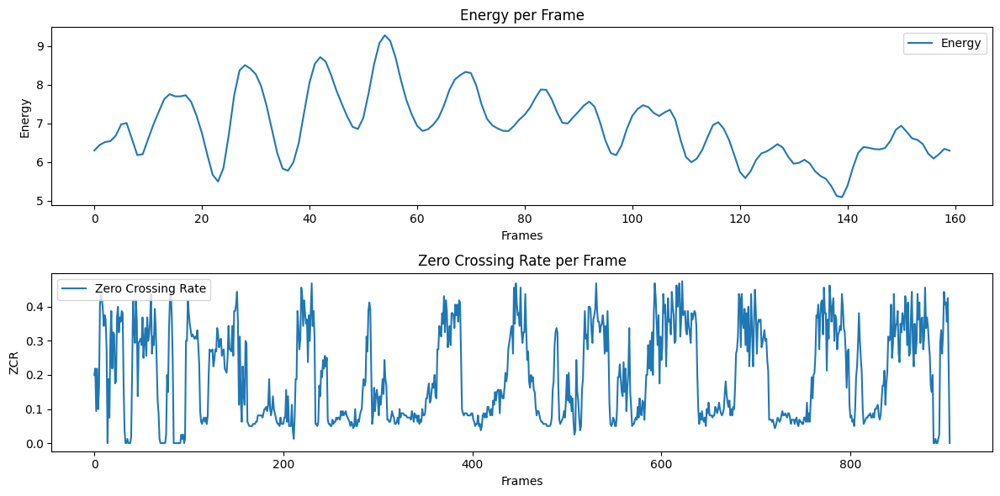

In [11]:
import os
import numpy as np
import pandas as pd
import librosa
import parselmouth
from scipy.signal import find_peaks
import soundfile as sf
import matplotlib.pyplot as plt

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Erreur lors du traitement du fichier audio {audio_path}: {e}")
        return None, None

# Function to extract MFCCs
def extract_mfcc(y, sr, frame_length=0.01, n_mfcc=13):
    try:
        hop_length = int(sr * frame_length)
        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, hop_length=hop_length)
        mfccs = mfccs.T
        return mfccs
    except Exception as e:
        print(f"Erreur lors de l'extraction des MFCC: {e}")
        return None

# Function to calculate energy per frame
def extract_energy(y, frame_length, sr):
    hop_length = int(sr * frame_length)
    energy = np.array([
        np.sum(frame**2)
        for frame in librosa.util.frame(y, frame_length=hop_length, hop_length=hop_length)
    ])
    return energy

# Function to calculate ZCR per frame
def extract_zcr(y, frame_length=0.01, sr=16000):
    hop_length = int(sr * frame_length)
    zcr = librosa.feature.zero_crossing_rate(y, frame_length=hop_length, hop_length=hop_length)[0]
    return zcr

# Function to extract formants
def extract_formants(audio_path, target_sr=16000):
    try:
        y, sr = sf.read(audio_path)
        if len(y.shape) > 1:
            y = np.mean(y, axis=1)
        if np.max(np.abs(y)) > 1.0:
            y = y / np.max(np.abs(y))
        peaks, _ = find_peaks(np.abs(np.fft.fft(y)), height=np.max(np.abs(y))/4)
        formants = peaks[:3]
        return formants
    except Exception as e:
        print(f"Erreur lors de l'extraction des formants pour {audio_path}: {e}")
        return None

# Function to process and plot a single audio file
def process_and_plot(audio_path, target_sr=16000, frame_length=0.01):
    y, sr = process_audio_file(audio_path, target_sr)
    if y is not None and sr is not None:
        energies = extract_energy(y, frame_length, sr)
        zcrs = extract_zcr(y, frame_length, sr)
        
        # Plot Energy
        plt.figure(figsize=(12, 6))
        plt.subplot(2, 1, 1)
        plt.plot(energies, label='Energy')
        plt.xlabel('Frames')
        plt.ylabel('Energy')
        plt.title('Energy per Frame')
        plt.legend()

        # Plot ZCR
        plt.subplot(2, 1, 2)
        plt.plot(zcrs, label='Zero Crossing Rate')
        plt.xlabel('Frames')
        plt.ylabel('ZCR')
        plt.title('Zero Crossing Rate per Frame')
        plt.legend()
        
        plt.tight_layout()
        plt.show()
    else:
        print("Failed to process the audio file")

# Example usage for a single audio file
audio_file = './speech/NS10-OF-NO1-BC.wav'
process_and_plot(audio_file)

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 102s 8ms/step - accuracy: 0.9256 - loss: 0.2036 - val_accuracy: 0.9655 - val_loss: 0.1063
Epoch 2/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 107s 9ms/step - accuracy: 0.9640 - loss: 0.1149 - val_accuracy: 0.9660 - val_loss: 0.1044
Epoch 3/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 120s 10ms/step - accuracy: 0.9644 - loss: 0.1114 - val_accuracy: 0.9660 - val_loss: 0.1032
Epoch 4/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 131s 11ms/step - accuracy: 0.9645 - loss: 0.1104 - val_accuracy: 0.9650 - val_loss: 0.1082
Epoch 5/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 127s 11ms/step - accuracy: 0.9658 - loss: 0.1081 - val_accuracy: 0.9660 - val_loss: 0.1034
Epoch 6/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 111s 9ms/step - accuracy: 0.9648 - loss: 0.1100 - val_accuracy: 0.9644 - val_loss: 0.1130
Epoch 7/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 90s 8ms/step - accuracy: 0.9651 - loss: 0.1076 - val_accuracy: 0.9662 - val_loss: 0.1036
Epoch 8/10
11826/11826 ━━━━━━━━━━━━━━━━━━━━ 88s 7ms/step - a

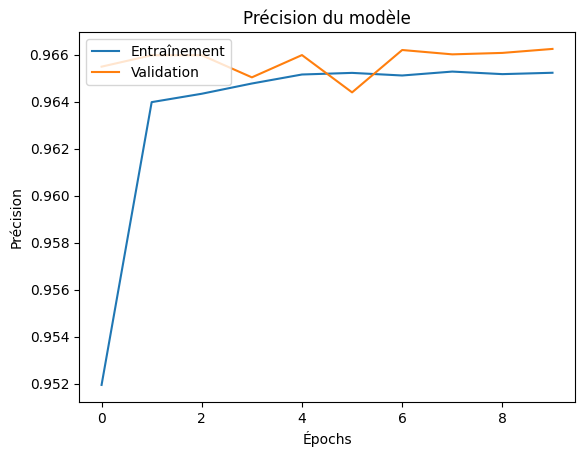

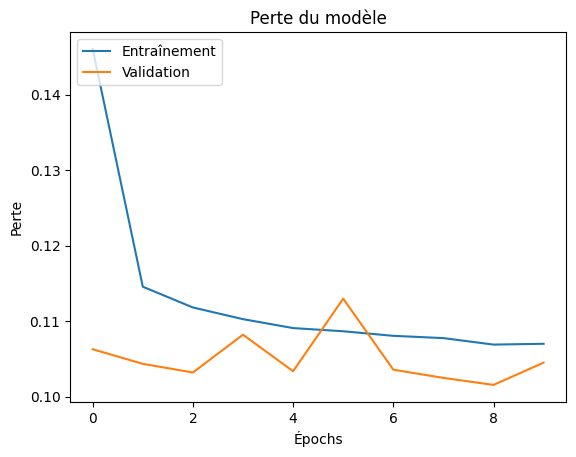

In [3]:
# Construction du modèle CNN
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Conv1D, Dense, Flatten
import matplotlib.pyplot as plt

# Chemin du dossier contenant les fichiers CSV
dossier_csv = 'training_set'

# Initialiser un DataFrame vide pour stocker toutes les données
df_total = pd.DataFrame()

# Boucle pour lire chaque fichier CSV dans le dossier
for fichier in os.listdir(dossier_csv):
    chemin_complet = os.path.join(dossier_csv, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        df = pd.read_csv(chemin_complet, header=None)
        df.columns = ['FD', 'Decision']
        df_total = pd.concat([df_total, df], ignore_index=True)

# Séparer les caractéristiques (FD) et les étiquettes (Décision)
X = df_total['FD'].values.reshape(-1, 1)
y = df_total['Decision'].values

# Normaliser les caractéristiques
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Redimensionner les données pour le modèle CNN
X_reshaped = X_normalized.reshape((X_normalized.shape[0], 1, 1))

# Diviser les données en ensembles d'entraînement, de validation et de test
X_train, X_temp, y_train, y_temp = train_test_split(X_reshaped, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.2, random_state=42)

# Construction du modèle CNN
model = Sequential()
model.add(Conv1D(filters=164, kernel_size=1, activation='relu', input_shape=(1, 1)))
model.add(Conv1D(filters=132, kernel_size=1, activation='relu'))
model.add(Flatten())  # Ajout de Flatten pour passer de 3D à 2D
model.add(Dense(1, activation='sigmoid'))

# Compilation du modèle
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(X_train, y_train, epochs=10, validation_data=(X_val, y_val))

# Évaluation du modèle
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Perte: {loss}, Précision: {accuracy}')

# Optionnel: Visualisation de l'historique de l'entraînement
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Précision du modèle')
plt.xlabel('Épochs')
plt.ylabel('Précision')
plt.legend(['Entraînement', 'Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Perte du modèle')
plt.xlabel('Épochs')
plt.ylabel('Perte')
plt.legend(['Entraînement', 'Validation'], loc='upper left')
plt.show()

In [4]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Conv1D, Dense, Flatten, Dropout, MaxPooling1D, BatchNormalization
import matplotlib.pyplot as plt

# Chemin du dossier contenant les fichiers CSV
dossier_csv = 'CSVN'

# Initialiser un DataFrame vide pour stocker toutes les données
df_total = pd.DataFrame()

# Boucle pour lire chaque fichier CSV dans le dossier
for fichier in os.listdir(dossier_csv):
    chemin_complet = os.path.join(dossier_csv, fichier)
    if os.path.isfile(chemin_complet) and fichier.endswith('.csv'):
        df = pd.read_csv(chemin_complet)
        df_total = pd.concat([df_total, df], ignore_index=True)

# Séparer les caractéristiques (DF) et les étiquettes (Decision)
X = df_total.iloc[:, 1].values.reshape(-1, 1)  # DF est la deuxième colonne
y = df_total.iloc[:, 2].values  # Decision est la troisième colonne

# Localiser les valeurs NaN
nan_indices = np.where(np.isnan(X))[0]
if len(nan_indices) > 0:
    print(f"Indices contenant des NaN: {nan_indices}")
else:
    print("Aucune valeur NaN trouvée.")

# Localiser les valeurs infinies
inf_indices = np.where(np.isinf(X))[0]
if len(inf_indices) > 0:
    print(f"Indices contenant des valeurs infinies: {inf_indices}")
else:
    print("Aucune valeur infinie trouvée.")

# Remplacer les NaN dans X par la moyenne de la colonne
X = np.nan_to_num(X, nan=np.nanmean(X))

# Vérifier et remplacer les valeurs infinies par des valeurs finies dans X
X = np.where(np.isinf(X), np.nanmean(X), X)

# Vérifiez les données avant la normalisation
assert not np.any(np.isnan(X)), "Les caractéristiques contiennent des NaN avant la normalisation."
assert not np.any(np.isinf(X)), "Les caractéristiques contiennent des valeurs infinies avant la normalisation."

# Normaliser les caractéristiques
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Vérifiez les valeurs normalisées pour les NaN ou inf
assert not np.any(np.isnan(X_normalized)), "Les caractéristiques normalisées contiennent des NaN."
assert not np.any(np.isinf(X_normalized)), "Les caractéristiques normalisées contiennent des valeurs infinies."

Indices contenant des NaN: [  16290   16291   16292 ... 3733062 3733063 3733064]
Aucune valeur infinie trouvée.


1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


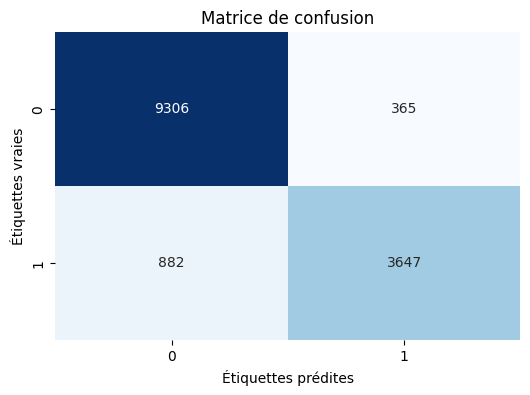

1/1 - 11s - 11s/step - accuracy: 0.9122 - loss: 0.2113

Accuracy on test data: 0.9122


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from keras.models import load_model
import os
import pandas as pd
from keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from keras.optimizers import Adam

# Fonction pour charger les données
def load_data(chemin_dossier_csv):
    files = os.listdir(chemin_dossier_csv)
    X = []
    y = []

    for file in files:
        if file.endswith('.csv'):
            df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
            features = df.iloc[:, 1].values  # Deuxième colonne : Dimension fractale
            decisions = df.iloc[:, 2].values  # Troisième colonne : Décision

            X.append(features)
            y.append(decisions)

    # Déterminer la longueur maximale des séquences pour le padding
    max_sequence_length = max(len(seq) for seq in X)

    # Redimensionner les séquences
    X = pad_sequences(X, maxlen=max_sequence_length, padding='post', dtype='float32')
    y = pad_sequences(y, maxlen=max_sequence_length, padding='post', dtype='int')

    return X, y, max_sequence_length

# Chemin vers le dossier contenant les fichiers CSV
chemin_dossier_csv = 'D:\\DAV\\Noisy\\AirConditioner\\Niveau_Bruit_1\\SNR_15'

# Charger les données
X, y, max_sequence_length = load_data(chemin_dossier_csv)

# Séparer les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Reshape pour LSTM
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

# Charger le modèle pour l'évaluation
modele_charge = load_model('modelF.h5')

# Faire des prédictions sur les données de test
y_pred = modele_charge.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)  # Convertir les probabilités en classes binaires (0 ou 1)

# Aplatir les étiquettes pour la matrice de confusion
y_test_flat = y_test.flatten()
y_pred_flat = y_pred.flatten()

# Calculer la matrice de confusion
cm = confusion_matrix(y_test_flat, y_pred_flat)

# Afficher la matrice de confusion avec seaborn
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Étiquettes prédites')
plt.ylabel('Étiquettes vraies')
plt.title('Matrice de confusion')
plt.show()

# Évaluer le modèle sur les données de test
loss, accuracy = modele_charge.evaluate(X_test, y_test, verbose=2)
print(f'\nAccuracy on test data: {accuracy:.4f}')

138/138 ━━━━━━━━━━━━━━━━━━━━ 1071s 8s/step


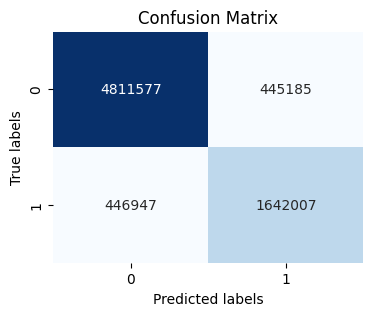


Accuracy on test data: 0.8786


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from keras.models import load_model
import os
import pandas as pd
from keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.optimizers import Adam

# Fonction pour charger les données
def load_data(chemin_dossier_csv):
    files = os.listdir(chemin_dossier_csv)
    X = []
    y = []

    for file in files:
        df = pd.read_csv(os.path.join(chemin_dossier_csv, file))
        features = df.iloc[:, 1].values  # Deuxième colonne : Dimension fractale
        decisions = df.iloc[:, 2].values  # Troisième colonne : Décision

        X.append(features)
        y.append(decisions)

    # Déterminer la longueur maximale des séquences pour le padding
    max_sequence_length = max(len(seq) for seq in X)

    # Redimensionner les séquences
    X = pad_sequences(X, maxlen=max_sequence_length, padding='post', dtype='float32')
    y = pad_sequences(y, maxlen=max_sequence_length, padding='post', dtype='int')

    return X, y, max_sequence_length

# Chemin vers le dossier contenant les fichiers CSV
chemin_dossier_csv = 'CSVs'

# Charger les données
X, y, max_sequence_length = load_data(chemin_dossier_csv)

# Séparer les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Reshape pour LSTM
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
y_train = y_train.reshape(y_train.shape[0], y_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)
y_test = y_test.reshape(y_test.shape[0], y_test.shape[1], 1)

# Charger le modèle pour l'évaluation
modele_charge = load_model('modelF.h5')

# Faire des prédictions sur les données de test
y_pred = modele_charge.predict(X_test)
y_pred = (y_pred > 0.5)  # Convertir les probabilités en classes binaires (0 ou 1)

# Calculer la matrice de confusion
cm = confusion_matrix(y_test.flatten(), y_pred.flatten())

# Afficher la matrice de confusion avec seaborn
plt.figure(figsize=(4, 3))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

# Évaluer le modèle sur les données de test
loss, accuracy = modele_charge.evaluate(X_test, y_test, verbose=0)
print(f'\nAccuracy on test data: {accuracy:.4f}')

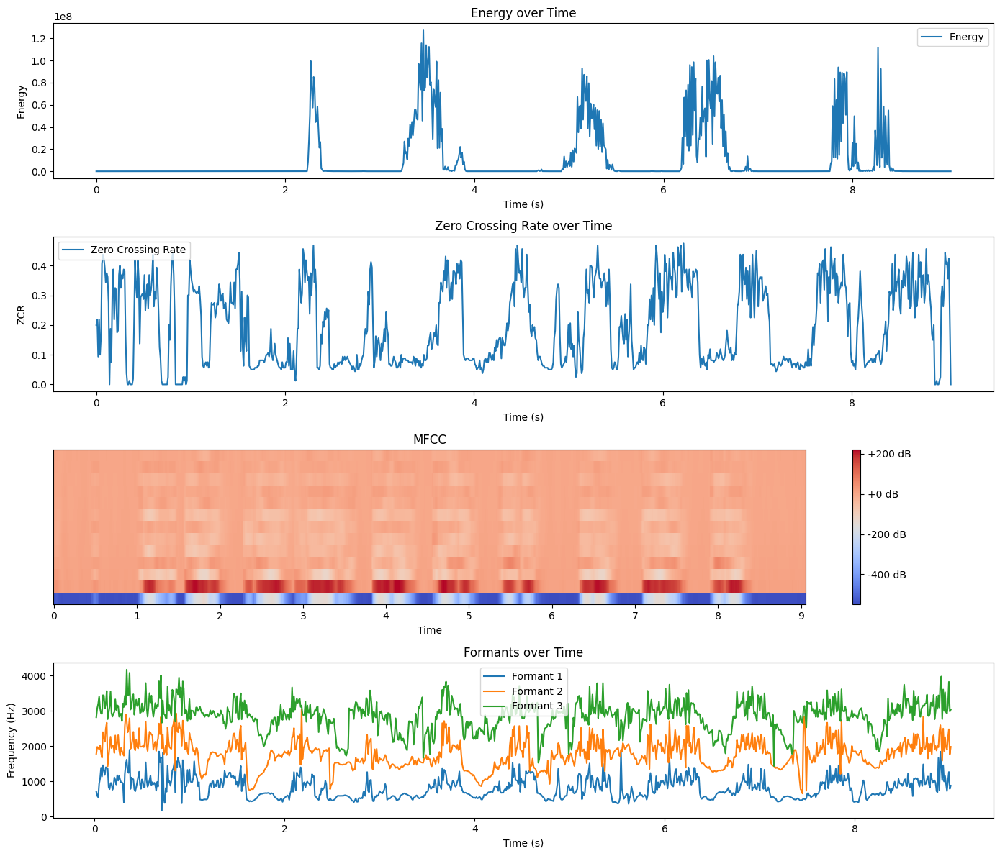

In [4]:
import os
import numpy as np
import scipy.io.wavfile
import librosa
import parselmouth
from parselmouth.praat import call
import matplotlib.pyplot as plt
import librosa.display

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Erreur lors du traitement du fichier audio {audio_path}: {e}")
        return None, None

# Function to extract MFCCs
def extract_mfcc(y, sr, frame_length=0.01, n_mfcc=13):
    try:
        hop_length = int(sr * frame_length)
        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, hop_length=hop_length)
        mfccs = mfccs.T
        return mfccs, hop_length / sr
    except Exception as e:
        print(f"Erreur lors de l'extraction des MFCC: {e}")
        return None, None

# Function to frame the signal
def framing(signal, sample_rate, win_len, win_hop):
    frame_length = int(win_len * sample_rate)
    frame_step = int(win_hop * sample_rate)
    signal_length = len(signal)
    num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step)) + 1
    pad_signal_length = num_frames * frame_step + frame_length
    z = np.zeros((pad_signal_length - signal_length))
    pad_signal = np.append(signal, z)
    indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T
    frames = pad_signal[indices.astype(np.int32, copy=False)]
    return frames, frame_length

# Function to calculate normalized short-time energy
def _calculate_normalized_short_time_energy(frames):
    return np.sum(frames**2, axis=1) / frames.shape[1]

# Function to extract energy using the provided method
def extract_energy(file_path):
    sample_rate, signal = scipy.io.wavfile.read(file_path)
    frame_duration_ms = 10
    win_len = frame_duration_ms / 1000
    win_hop = win_len
    frames, frame_length = framing(signal, sample_rate, win_len, win_hop)
    energies = _calculate_normalized_short_time_energy(frames)
    return energies, signal, sample_rate, frame_length / sample_rate

# Function to calculate ZCR per frame
def extract_zcr(y, frame_length=0.01, sr=16000):
    hop_length = int(sr * frame_length)
    zcr = librosa.feature.zero_crossing_rate(y, frame_length=hop_length, hop_length=hop_length)[0]
    return zcr, hop_length / sr

# Function to extract formants using Praat via parselmouth
def extract_formants(audio_path, target_sr=16000):
    try:
        snd = parselmouth.Sound(audio_path)
        formant = call(snd, "To Formant (burg)", 0.01, 5.0, 5500, 0.025, 50.0)
        formants = []
        for t in range(1, int(snd.duration // 0.01) + 1):
            formants.append([call(formant, "Get value at time", i, t * 0.01, 'Hertz', 'Linear') for i in range(1, 4)])
        return np.array(formants), 0.01
    except Exception as e:
        print(f"Erreur lors de l'extraction des formants pour {audio_path}: {e}")
        return None, None

# Function to process and plot a single audio file
def process_and_plot(audio_path, target_sr=16000, frame_length=0.01):
    y, sr = process_audio_file(audio_path, target_sr)
    if y is not None and sr is not None:
        energies, signal, sample_rate, energy_time_step = extract_energy(audio_path)
        zcrs, zcr_time_step = extract_zcr(y, frame_length, sr)
        mfccs, mfcc_time_step = extract_mfcc(y, sr, frame_length)
        formants, formant_time_step = extract_formants(audio_path, target_sr)
        
        time_energies = np.arange(len(energies)) * energy_time_step
        time_zcrs = np.arange(len(zcrs)) * zcr_time_step
        time_mfccs = np.arange(mfccs.shape[0]) * mfcc_time_step
        time_formants = np.arange(formants.shape[0]) * formant_time_step if formants is not None else None
        
        # Plot Energy
        plt.figure(figsize=(14, 12))
        plt.subplot(4, 1, 1)
        plt.plot(time_energies, energies, label='Energy')
        plt.xlabel('Time (s)')
        plt.ylabel('Energy')
        plt.title('Energy over Time')
        plt.legend()

        # Plot ZCR
        plt.subplot(4, 1, 2)
        plt.plot(time_zcrs, zcrs, label='Zero Crossing Rate')
        plt.xlabel('Time (s)')
        plt.ylabel('ZCR')
        plt.title('Zero Crossing Rate over Time')
        plt.legend()
        
        # Plot MFCC
        plt.subplot(4, 1, 3)
        librosa.display.specshow(mfccs.T, sr=sr, x_axis='time', hop_length=int(sr * frame_length))
        plt.colorbar(format='%+2.0f dB')
        plt.title('MFCC')
        
        # Plot Formants
        if formants is not None:
            plt.subplot(4, 1, 4)
            for i in range(3):
                plt.plot(time_formants, formants[:, i], label=f'Formant {i+1}')
            plt.xlabel('Time (s)')
            plt.ylabel('Frequency (Hz)')
            plt.title('Formants over Time')
            plt.legend()
        
        plt.tight_layout()
        plt.show()
    else:
        print("Failed to process the audio file")

# Example usage for a single audio file
audio_file = './speech/NS10-OF-NO1-BC.wav'
process_and_plot(audio_file)

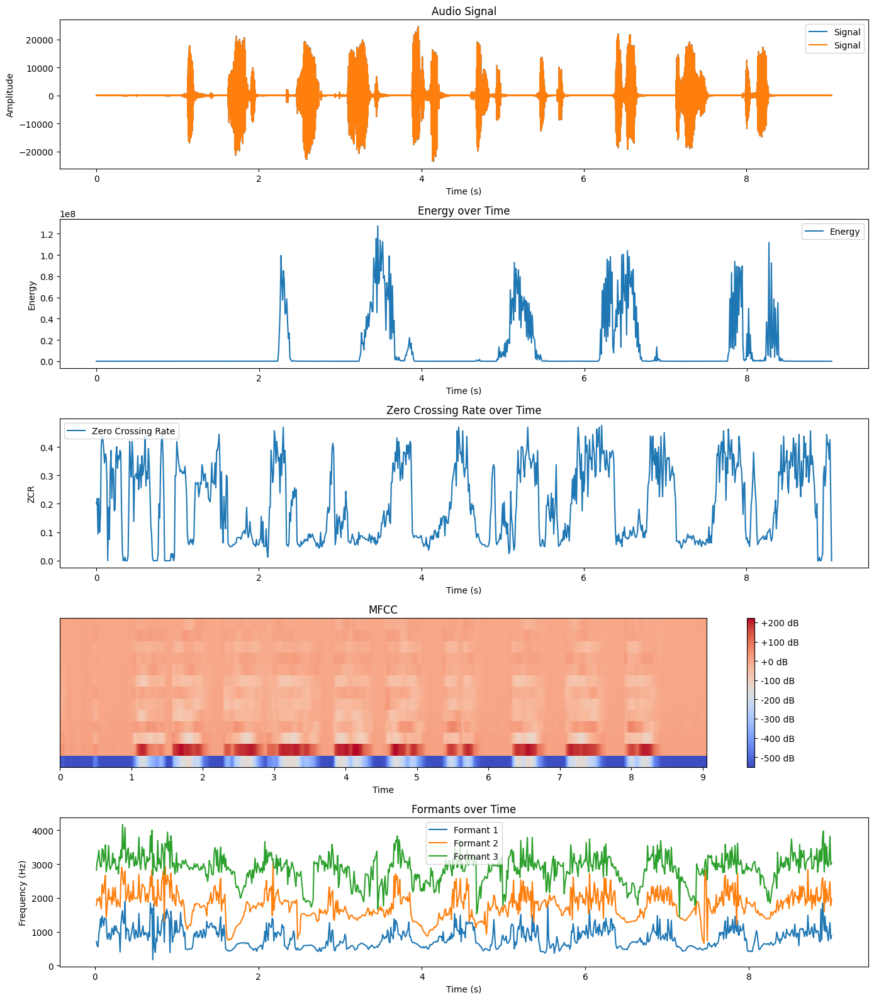

In [10]:
import os
import numpy as np
import scipy.io.wavfile
import librosa
import parselmouth
from parselmouth.praat import call
import matplotlib.pyplot as plt
import librosa.display

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Erreur lors du traitement du fichier audio {audio_path}: {e}")
        return None, None

# Function to extract MFCCs
def extract_mfcc(y, sr, frame_length=0.01, n_mfcc=13):
    try:
        hop_length = int(sr * frame_length)
        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, hop_length=hop_length)
        mfccs = mfccs.T
        return mfccs, hop_length / sr
    except Exception as e:
        print(f"Erreur lors de l'extraction des MFCC: {e}")
        return None, None

# Function to frame the signal
def framing(signal, sample_rate, win_len, win_hop):
    frame_length = int(win_len * sample_rate)
    frame_step = int(win_hop * sample_rate)
    signal_length = len(signal)
    num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step)) + 1
    pad_signal_length = num_frames * frame_step + frame_length
    z = np.zeros((pad_signal_length - signal_length))
    pad_signal = np.append(signal, z)
    indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T
    frames = pad_signal[indices.astype(np.int32, copy=False)]
    return frames, frame_length

# Function to calculate normalized short-time energy
def _calculate_normalized_short_time_energy(frames):
    return np.sum(frames**2, axis=1) / frames.shape[1]

# Function to extract energy using the provided method
def extract_energy(file_path):
    sample_rate, signal = scipy.io.wavfile.read(file_path)
    frame_duration_ms = 10
    win_len = frame_duration_ms / 1000
    win_hop = win_len
    frames, frame_length = framing(signal, sample_rate, win_len, win_hop)
    energies = _calculate_normalized_short_time_energy(frames)
    return energies, signal, sample_rate, frame_length / sample_rate

# Function to calculate ZCR per frame
def extract_zcr(y, frame_length=0.01, sr=16000):
    hop_length = int(sr * frame_length)
    zcr = librosa.feature.zero_crossing_rate(y, frame_length=hop_length, hop_length=hop_length)[0]
    return zcr, hop_length / sr

# Function to extract formants using Praat via parselmouth
def extract_formants(audio_path, target_sr=16000):
    try:
        snd = parselmouth.Sound(audio_path)
        formant = call(snd, "To Formant (burg)", 0.01, 5.0, 5500, 0.025, 50.0)
        formants = []
        for t in range(1, int(snd.duration // 0.01) + 1):
            formants.append([call(formant, "Get value at time", i, t * 0.01, 'Hertz', 'Linear') for i in range(1, 4)])
        return np.array(formants), 0.01
    except Exception as e:
        print(f"Erreur lors de l'extraction des formants pour {audio_path}: {e}")
        return None, None

# Function to process and plot a single audio file
def process_and_plot(audio_path, target_sr=16000, frame_length=0.01):
    y, sr = process_audio_file(audio_path, target_sr)
    if y is not None and sr is not None:
        energies, signal, sample_rate, energy_time_step = extract_energy(audio_path)
        zcrs, zcr_time_step = extract_zcr(y, frame_length, sr)
        mfccs, mfcc_time_step = extract_mfcc(y, sr, frame_length)
        formants, formant_time_step = extract_formants(audio_path, target_sr)
        
        time_energies = np.arange(len(energies)) * energy_time_step
        time_zcrs = np.arange(len(zcrs)) * zcr_time_step
        time_mfccs = np.arange(mfccs.shape[0]) * mfcc_time_step
        time_formants = np.arange(formants.shape[0]) * formant_time_step if formants is not None else None
        time_signal = np.arange(len(signal)) / sample_rate
        
        # Plot Signal
        plt.figure(figsize=(14, 16))
        plt.subplot(5, 1, 1)
        plt.plot(time_signal, signal, label='Signal')
        plt.xlabel('Time (s)')
        plt.ylabel('Amplitude')
        plt.title('Audio Signal')
        plt.legend()

        # Plot Energy
        plt.subplot(5, 1, 2)
        plt.plot(time_energies, energies, label='Energy')
        plt.xlabel('Time (s)')
        plt.ylabel('Energy')
        plt.title('Energy over Time')
        plt.legend()

        # Plot ZCR
        plt.subplot(5, 1, 3)
        plt.plot(time_zcrs, zcrs, label='Zero Crossing Rate')
        plt.xlabel('Time (s)')
        plt.ylabel('ZCR')
        plt.title('Zero Crossing Rate over Time')
        plt.legend()
        
        # Plot MFCC
        plt.subplot(5, 1, 4)
        librosa.display.specshow(mfccs.T, sr=sr, x_axis='time', hop_length=int(sr * frame_length))
        plt.colorbar(format='%+2.0f dB')
        plt.title('MFCC')
        
        # Plot Formants
        if formants is not None:
            plt.subplot(5, 1, 5)
            for i in range(3):
                plt.plot(time_formants, formants[:, i], label=f'Formant {i+1}')
            plt.xlabel('Time (s)')
            plt.ylabel('Frequency (Hz)')
            plt.title('Formants over Time')
            plt.legend()
        
        plt.tight_layout()
        plt.show()
    else:
        print("Failed to process the audio file")

# Example usage for a single audio file
audio_file = './speech/NS10-OF-NO1-BC.wav'
process_and_plot(audio_file)

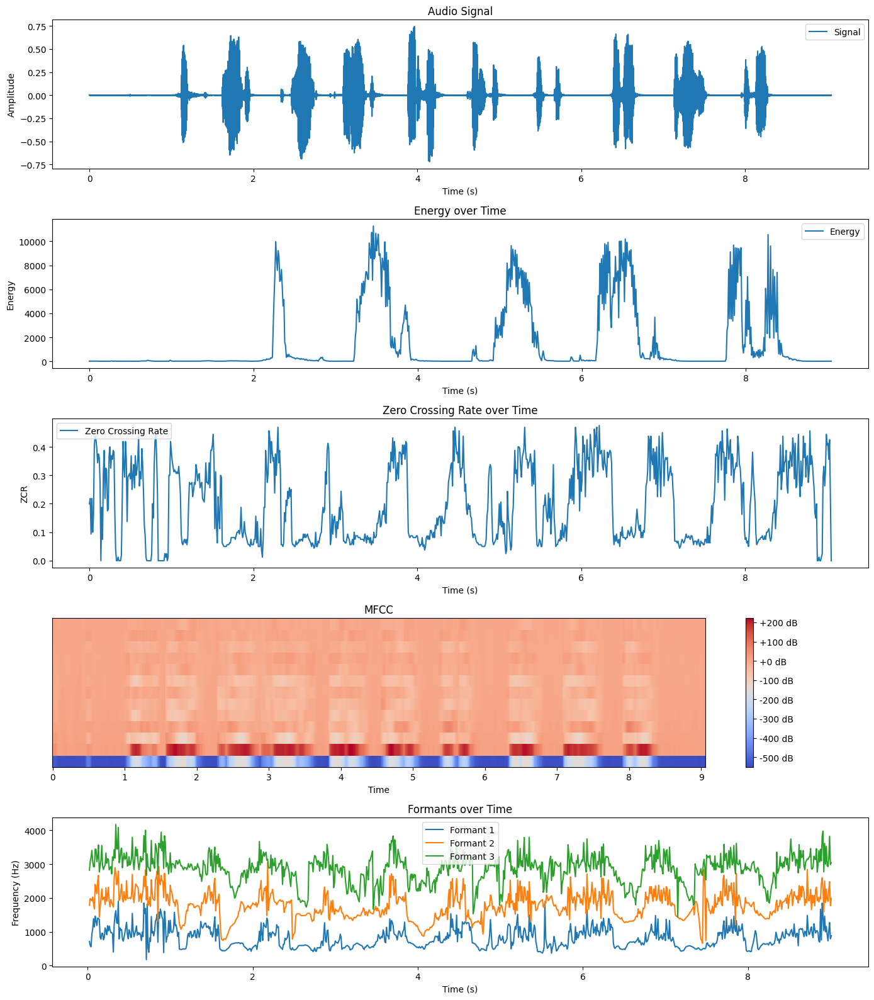

In [13]:
import os
import numpy as np
import scipy.io.wavfile
import librosa
import parselmouth
from parselmouth.praat import call
import matplotlib.pyplot as plt
import librosa.display

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to frame the signal
def framing(signal, sample_rate, win_len, win_hop):
    frame_length = int(win_len * sample_rate)
    frame_step = int(win_hop * sample_rate)
    signal_length = len(signal)
    num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step)) + 1
    pad_signal_length = num_frames * frame_step + frame_length
    z = np.zeros((pad_signal_length - signal_length))
    pad_signal = np.append(signal, z)
    indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T
    frames = pad_signal[indices.astype(np.int32, copy=False)]
    return frames, frame_length

# Function to calculate RMS (Root Mean Square) per frame
def calculate_rms(frames):
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms

# Function to extract energy using the provided method
def extract_energy(file_path):
    sample_rate, signal = scipy.io.wavfile.read(file_path)
    frame_duration_ms = 10
    win_len = frame_duration_ms / 1000
    win_hop = win_len
    frames, frame_length = framing(signal, sample_rate, win_len, win_hop)
    energies = calculate_rms(frames)
    return energies, signal, sample_rate, frame_length / sample_rate

# Function to calculate ZCR per frame
def extract_zcr(y, frame_length=0.01, sr=16000):
    hop_length = int(sr * frame_length)
    zcr = librosa.feature.zero_crossing_rate(y, frame_length=hop_length, hop_length=hop_length)[0]
    return zcr, hop_length / sr

# Function to extract MFCCs
def extract_mfcc(y, sr, frame_length=0.01, n_mfcc=13):
    try:
        hop_length = int(sr * frame_length)
        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, hop_length=hop_length)
        mfccs = mfccs.T
        return mfccs, hop_length / sr
    except Exception as e:
        print(f"Error extracting MFCCs: {e}")
        return None, None

# Function to extract formants using Praat via parselmouth
def extract_formants(audio_path, target_sr=16000):
    try:
        snd = parselmouth.Sound(audio_path)
        formant = call(snd, "To Formant (burg)", 0.01, 5.0, 5500, 0.025, 50.0)
        formants = []
        for t in range(1, int(snd.duration // 0.01) + 1):
            formants.append([call(formant, "Get value at time", i, t * 0.01, 'Hertz', 'Linear') for i in range(1, 4)])
        return np.array(formants), 0.01
    except Exception as e:
        print(f"Error extracting formants for {audio_path}: {e}")
        return None, None

# Function to process and plot a single audio file
def process_and_plot(audio_path, target_sr=16000, frame_length=0.01):
    y, sr = process_audio_file(audio_path, target_sr)
    if y is not None and sr is not None:
        energies, signal, sample_rate, energy_time_step = extract_energy(audio_path)
        zcrs, zcr_time_step = extract_zcr(y, frame_length, sr)
        mfccs, mfcc_time_step = extract_mfcc(y, sr, frame_length)
        formants, formant_time_step = extract_formants(audio_path, target_sr)
        
        time_energies = np.arange(len(energies)) * energy_time_step
        time_zcrs = np.arange(len(zcrs)) * zcr_time_step
        time_mfccs = np.arange(mfccs.shape[0]) * mfcc_time_step
        time_formants = np.arange(formants.shape[0]) * formant_time_step if formants is not None else None
        time_signal = np.arange(len(y)) / sr
        
        # Plot Signal, Energy, ZCR, MFCC, and Formants (if available)
        plt.figure(figsize=(14, 16))
        
        # Plot Signal
        plt.subplot(5, 1, 1)
        plt.plot(time_signal, y, label='Signal')
        plt.xlabel('Time (s)')
        plt.ylabel('Amplitude')
        plt.title('Audio Signal')
        plt.legend()
        
        # Plot Energy
        plt.subplot(5, 1, 2)
        plt.plot(time_energies, energies, label='Energy')
        plt.xlabel('Time (s)')
        plt.ylabel('Energy')
        plt.title('Energy over Time')
        plt.legend()
        
        # Plot ZCR
        plt.subplot(5, 1, 3)
        plt.plot(time_zcrs, zcrs, label='Zero Crossing Rate')
        plt.xlabel('Time (s)')
        plt.ylabel('ZCR')
        plt.title('Zero Crossing Rate over Time')
        plt.legend()
        
        # Plot MFCC
        plt.subplot(5, 1, 4)
        librosa.display.specshow(mfccs.T, sr=sr, x_axis='time', hop_length=int(sr * frame_length))
        plt.colorbar(format='%+2.0f dB')
        plt.title('MFCC')
        
        # Plot Formants
        if formants is not None:
            plt.subplot(5, 1, 5)
            for i in range(3):
                plt.plot(time_formants, formants[:, i], label=f'Formant {i+1}')
            plt.xlabel('Time (s)')
            plt.ylabel('Frequency (Hz)')
            plt.title('Formants over Time')
            plt.legend()
        
        plt.tight_layout()
        plt.show()
    else:
        print("Failed to process the audio file")

# Example usage for a single audio file
audio_file = './speech/NS10-OF-NO1-BC.wav'
process_and_plot(audio_file)

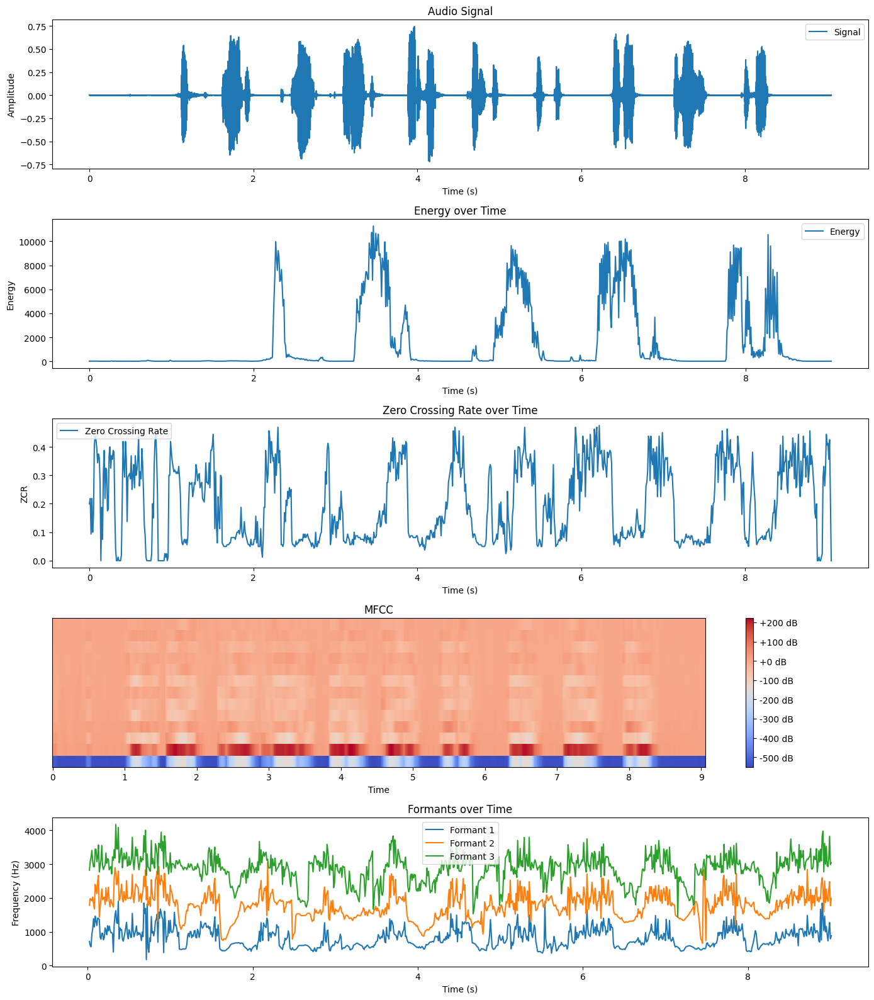

In [14]:
import os
import numpy as np
import scipy.io.wavfile as wav
import librosa
import parselmouth
from parselmouth.praat import call
import matplotlib.pyplot as plt
import librosa.display

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to frame the signal
def framing(signal, sample_rate, win_len, win_hop):
    frame_length = int(win_len * sample_rate)
    frame_step = int(win_hop * sample_rate)
    signal_length = len(signal)
    num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step)) + 1
    pad_signal_length = num_frames * frame_step + frame_length
    z = np.zeros((pad_signal_length - signal_length))
    pad_signal = np.append(signal, z)
    indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T
    frames = pad_signal[indices.astype(np.int32, copy=False)]
    return frames, frame_length

# Function to calculate RMS (Root Mean Square) per frame
def calculate_rms(frames):
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms

# Function to extract energy using the provided method
def extract_energy(file_path):
    sample_rate, signal = wav.read(file_path)
    frame_duration_ms = 10
    win_len = frame_duration_ms / 1000
    win_hop = win_len
    frames, frame_length = framing(signal, sample_rate, win_len, win_hop)
    energies = calculate_rms(frames)
    return energies, signal, sample_rate, frame_length / sample_rate

# Function to calculate ZCR per frame
def extract_zcr(y, frame_length=0.01, sr=16000):
    hop_length = int(sr * frame_length)
    zcr = librosa.feature.zero_crossing_rate(y, frame_length=hop_length, hop_length=hop_length)[0]
    return zcr, hop_length / sr

# Function to extract MFCCs
def extract_mfcc(y, sr, frame_length=0.01, n_mfcc=13):
    try:
        hop_length = int(sr * frame_length)
        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, hop_length=hop_length)
        mfccs = mfccs.T
        return mfccs, hop_length / sr
    except Exception as e:
        print(f"Error extracting MFCCs: {e}")
        return None, None

# Function to extract formants using Praat via parselmouth
def extract_formants(audio_path, target_sr=16000):
    try:
        snd = parselmouth.Sound(audio_path)
        formant = call(snd, "To Formant (burg)", 0.01, 5.0, 5500, 0.025, 50.0)
        formants = []
        for t in range(1, int(snd.duration // 0.01) + 1):
            formants.append([call(formant, "Get value at time", i, t * 0.01, 'Hertz', 'Linear') for i in range(1, 4)])
        return np.array(formants), 0.01
    except Exception as e:
        print(f"Error extracting formants for {audio_path}: {e}")
        return None, None

# Function to process and plot a single audio file
def process_and_plot(audio_path, target_sr=16000, frame_length=0.01):
    y, sr = process_audio_file(audio_path, target_sr)
    if y is not None and sr is not None:
        energies, signal, sample_rate, energy_time_step = extract_energy(audio_path)
        zcrs, zcr_time_step = extract_zcr(y, frame_length, sr)
        mfccs, mfcc_time_step = extract_mfcc(y, sr, frame_length)
        formants, formant_time_step = extract_formants(audio_path, target_sr)
        
        time_energies = np.arange(len(energies)) * energy_time_step
        time_zcrs = np.arange(len(zcrs)) * zcr_time_step
        time_mfccs = np.arange(mfccs.shape[0]) * mfcc_time_step
        time_formants = np.arange(formants.shape[0]) * formant_time_step if formants is not None else None
        time_signal = np.arange(len(y)) / sr
        
        # Plot Signal, Energy, ZCR, MFCC, and Formants (if available)
        plt.figure(figsize=(14, 16))
        
        # Plot Signal
        plt.subplot(5, 1, 1)
        plt.plot(time_signal, y, label='Signal')
        plt.xlabel('Time (s)')
        plt.ylabel('Amplitude')
        plt.title('Audio Signal')
        plt.legend()
        
        # Plot Energy
        plt.subplot(5, 1, 2)
        plt.plot(time_energies, energies, label='Energy')
        plt.xlabel('Time (s)')
        plt.ylabel('Energy')
        plt.title('Energy over Time')
        plt.legend()
        
        # Plot ZCR
        plt.subplot(5, 1, 3)
        plt.plot(time_zcrs, zcrs, label='Zero Crossing Rate')
        plt.xlabel('Time (s)')
        plt.ylabel('ZCR')
        plt.title('Zero Crossing Rate over Time')
        plt.legend()
        
        # Plot MFCC
        plt.subplot(5, 1, 4)
        librosa.display.specshow(mfccs.T, sr=sr, x_axis='time', hop_length=int(sr * frame_length))
        plt.colorbar(format='%+2.0f dB')
        plt.title('MFCC')
        
        # Plot Formants
        if formants is not None:
            plt.subplot(5, 1, 5)
            for i in range(3):
                plt.plot(time_formants, formants[:, i], label=f'Formant {i+1}')
            plt.xlabel('Time (s)')
            plt.ylabel('Frequency (Hz)')
            plt.title('Formants over Time')
            plt.legend()
        
        plt.tight_layout()
        plt.show()
    else:
        print("Failed to process the audio file")

# Example usage for a single audio file
audio_file = './speech/NS10-OF-NO1-BC.wav'
process_and_plot(audio_file)

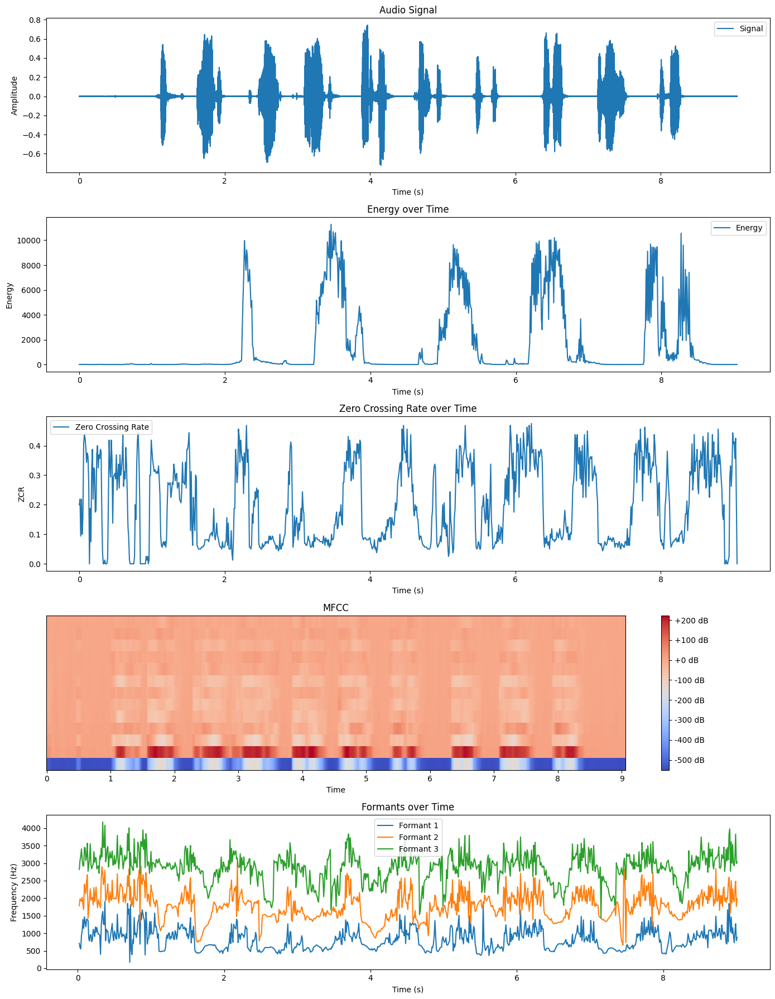

In [15]:
import os
import numpy as np
import scipy.io.wavfile as wav
import librosa
import parselmouth
from parselmouth.praat import call
import matplotlib.pyplot as plt
import librosa.display

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to frame the signal
def framing(signal, sample_rate, win_len, win_hop):
    frame_length = int(win_len * sample_rate)
    frame_step = int(win_hop * sample_rate)
    signal_length = len(signal)
    num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step)) + 1
    pad_signal_length = num_frames * frame_step + frame_length
    z = np.zeros((pad_signal_length - signal_length))
    pad_signal = np.append(signal, z)
    indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T
    frames = pad_signal[indices.astype(np.int32, copy=False)]
    return frames, frame_length

# Function to calculate RMS (Root Mean Square) per frame
def calculate_rms(frames):
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms

# Function to extract energy using the provided method
def extract_energy(file_path):
    sample_rate, signal = wav.read(file_path)
    frame_duration_ms = 10
    win_len = frame_duration_ms / 1000
    win_hop = win_len
    frames, frame_length = framing(signal, sample_rate, win_len, win_hop)
    energies = calculate_rms(frames)
    return energies, signal, sample_rate, frame_length / sample_rate

# Function to calculate ZCR per frame
def extract_zcr(y, frame_length=0.01, sr=16000):
    hop_length = int(sr * frame_length)
    zcr = librosa.feature.zero_crossing_rate(y, frame_length=hop_length, hop_length=hop_length)[0]
    return zcr, hop_length / sr

# Function to extract MFCCs
def extract_mfcc(y, sr, frame_length=0.01, n_mfcc=13):
    try:
        hop_length = int(sr * frame_length)
        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, hop_length=hop_length)
        mfccs = mfccs.T
        return mfccs, hop_length / sr
    except Exception as e:
        print(f"Error extracting MFCCs: {e}")
        return None, None

# Function to extract formants using Praat via parselmouth
def extract_formants(audio_path, target_sr=16000):
    try:
        snd = parselmouth.Sound(audio_path)
        formant = call(snd, "To Formant (burg)", 0.01, 5.0, 5500, 0.025, 50.0)
        formants = []
        for t in range(1, int(snd.duration // 0.01) + 1):
            formants.append([call(formant, "Get value at time", i, t * 0.01, 'Hertz', 'Linear') for i in range(1, 4)])
        return np.array(formants), 0.01
    except Exception as e:
        print(f"Error extracting formants for {audio_path}: {e}")
        return None, None

# Function to process and plot a single audio file
def process_and_plot(audio_path, target_sr=16000, frame_length=0.01):
    y, sr = process_audio_file(audio_path, target_sr)
    if y is not None and sr is not None:
        energies, signal, sample_rate, energy_time_step = extract_energy(audio_path)
        zcrs, zcr_time_step = extract_zcr(y, frame_length, sr)
        mfccs, mfcc_time_step = extract_mfcc(y, sr, frame_length)
        formants, formant_time_step = extract_formants(audio_path, target_sr)
        
        time_energies = np.arange(len(energies)) * energy_time_step
        time_zcrs = np.arange(len(zcrs)) * zcr_time_step
        time_mfccs = np.arange(mfccs.shape[0]) * mfcc_time_step
        time_formants = np.arange(formants.shape[0]) * formant_time_step if formants is not None else None
        time_signal = np.arange(len(y)) / sr
        
        # Plot all features in one figure with subplots
        fig, axs = plt.subplots(5, 1, figsize=(14, 18))
        
        # Plot Signal
        axs[0].plot(time_signal, y, label='Signal')
        axs[0].set_xlabel('Time (s)')
        axs[0].set_ylabel('Amplitude')
        axs[0].set_title('Audio Signal')
        axs[0].legend()
        
        # Plot Energy
        axs[1].plot(time_energies, energies, label='Energy')
        axs[1].set_xlabel('Time (s)')
        axs[1].set_ylabel('Energy')
        axs[1].set_title('Energy over Time')
        axs[1].legend()
        
        # Plot ZCR
        axs[2].plot(time_zcrs, zcrs, label='Zero Crossing Rate')
        axs[2].set_xlabel('Time (s)')
        axs[2].set_ylabel('ZCR')
        axs[2].set_title('Zero Crossing Rate over Time')
        axs[2].legend()
        
        # Plot MFCC
        img = librosa.display.specshow(mfccs.T, sr=sr, x_axis='time', hop_length=int(sr * frame_length), ax=axs[3])
        fig.colorbar(img, ax=axs[3], format='%+2.0f dB')
        axs[3].set_title('MFCC')
        
        # Plot Formants
        if formants is not None:
            for i in range(3):
                axs[4].plot(time_formants, formants[:, i], label=f'Formant {i+1}')
            axs[4].set_xlabel('Time (s)')
            axs[4].set_ylabel('Frequency (Hz)')
            axs[4].set_title('Formants over Time')
            axs[4].legend()
        
        plt.tight_layout()
        plt.show()
    else:
        print("Failed to process the audio file")

# Example usage for a single audio file
audio_file = './speech/NS10-OF-NO1-BC.wav'
process_and_plot(audio_file)

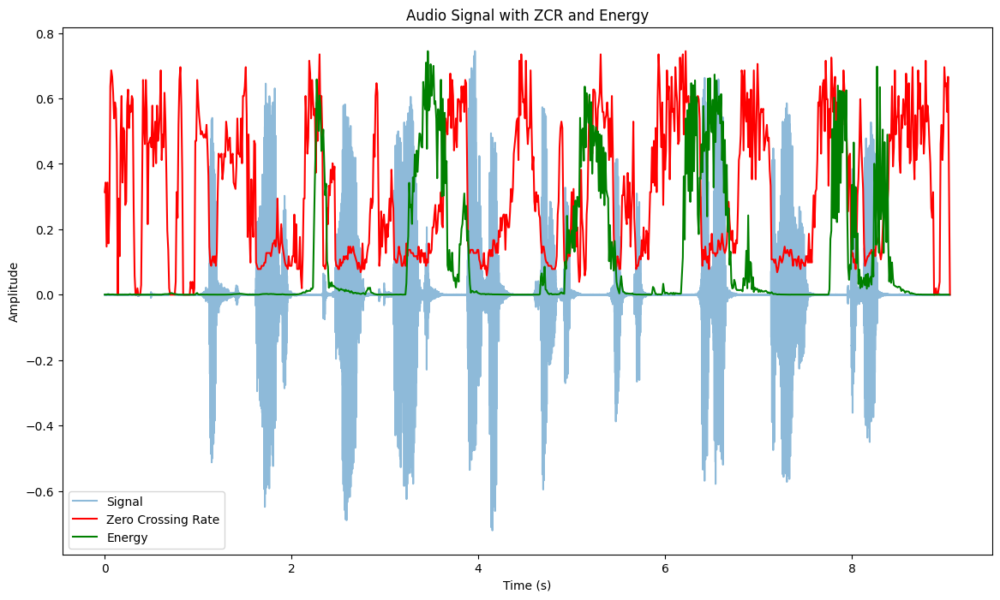

In [16]:
import os
import numpy as np
import scipy.io.wavfile as wav
import librosa
import parselmouth
from parselmouth.praat import call
import matplotlib.pyplot as plt
import librosa.display

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to frame the signal
def framing(signal, sample_rate, win_len, win_hop):
    frame_length = int(win_len * sample_rate)
    frame_step = int(win_hop * sample_rate)
    signal_length = len(signal)
    num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step)) + 1
    pad_signal_length = num_frames * frame_step + frame_length
    z = np.zeros((pad_signal_length - signal_length))
    pad_signal = np.append(signal, z)
    indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T
    frames = pad_signal[indices.astype(np.int32, copy=False)]
    return frames, frame_length

# Function to calculate RMS (Root Mean Square) per frame
def calculate_rms(frames):
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms

# Function to extract energy using the provided method
def extract_energy(file_path):
    sample_rate, signal = wav.read(file_path)
    frame_duration_ms = 10
    win_len = frame_duration_ms / 1000
    win_hop = win_len
    frames, frame_length = framing(signal, sample_rate, win_len, win_hop)
    energies = calculate_rms(frames)
    return energies, signal, sample_rate, frame_length / sample_rate

# Function to calculate ZCR per frame
def extract_zcr(y, frame_length=0.01, sr=16000):
    hop_length = int(sr * frame_length)
    zcr = librosa.feature.zero_crossing_rate(y, frame_length=hop_length, hop_length=hop_length)[0]
    return zcr, hop_length / sr

# Function to extract MFCCs
def extract_mfcc(y, sr, frame_length=0.01, n_mfcc=13):
    try:
        hop_length = int(sr * frame_length)
        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, hop_length=hop_length)
        mfccs = mfccs.T
        return mfccs, hop_length / sr
    except Exception as e:
        print(f"Error extracting MFCCs: {e}")
        return None, None

# Function to extract formants using Praat via parselmouth
def extract_formants(audio_path, target_sr=16000):
    try:
        snd = parselmouth.Sound(audio_path)
        formant = call(snd, "To Formant (burg)", 0.01, 5.0, 5500, 0.025, 50.0)
        formants = []
        for t in range(1, int(snd.duration // 0.01) + 1):
            formants.append([call(formant, "Get value at time", i, t * 0.01, 'Hertz', 'Linear') for i in range(1, 4)])
        return np.array(formants), 0.01
    except Exception as e:
        print(f"Error extracting formants for {audio_path}: {e}")
        return None, None

# Function to process and plot a single audio file
def process_and_plot(audio_path, target_sr=16000, frame_length=0.01):
    y, sr = process_audio_file(audio_path, target_sr)
    if y is not None and sr is not None:
        energies, signal, sample_rate, energy_time_step = extract_energy(audio_path)
        zcrs, zcr_time_step = extract_zcr(y, frame_length, sr)
        mfccs, mfcc_time_step = extract_mfcc(y, sr, frame_length)
        formants, formant_time_step = extract_formants(audio_path, target_sr)
        
        time_energies = np.arange(len(energies)) * energy_time_step
        time_zcrs = np.arange(len(zcrs)) * zcr_time_step
        time_mfccs = np.arange(mfccs.shape[0]) * mfcc_time_step
        time_formants = np.arange(formants.shape[0]) * formant_time_step if formants is not None else None
        time_signal = np.arange(len(y)) / sr
        
        # Normalize ZCR and Energy for plotting on the same graph as the signal
        zcrs_normalized = (zcrs - np.min(zcrs)) / (np.max(zcrs) - np.min(zcrs))
        energies_normalized = (energies - np.min(energies)) / (np.max(energies) - np.min(energies))
        
        # Plot Signal with ZCR and Energy
        plt.figure(figsize=(14, 8))
        
        plt.plot(time_signal, y, label='Signal', alpha=0.5)
        plt.plot(time_zcrs, zcrs_normalized * np.max(np.abs(y)), label='Zero Crossing Rate', color='r')
        plt.plot(time_energies, energies_normalized * np.max(np.abs(y)), label='Energy', color='g')
        
        plt.xlabel('Time (s)')
        plt.ylabel('Amplitude')
        plt.title('Audio Signal with ZCR and Energy')
        plt.legend()
        plt.show()
    else:
        print("Failed to process the audio file")

# Example usage for a single audio file
audio_file = './speech/NS10-OF-NO1-BC.wav'
process_and_plot(audio_file)

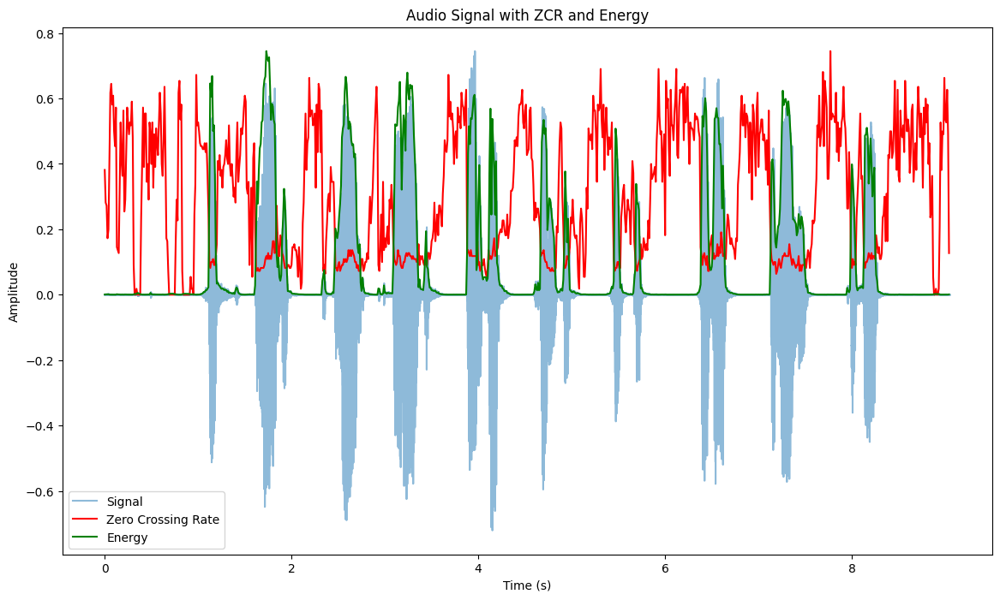

In [17]:
import os
import numpy as np
import scipy.io.wavfile as wav
import librosa
import parselmouth
from parselmouth.praat import call
import matplotlib.pyplot as plt
import librosa.display

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to calculate RMS (Root Mean Square) per frame
def calculate_rms(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms, frame_length

# Function to extract energy
def extract_energy(signal, sample_rate, frame_length=0.01):
    energies, time_step = calculate_rms(signal, sample_rate, frame_length)
    return energies, time_step

# Function to calculate ZCR per frame
def extract_zcr(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    zcr = np.sum(np.abs(np.diff(np.sign(frames))), axis=1) / (2.0 * frame_size)
    return zcr, frame_length

# Function to extract MFCCs
def extract_mfcc(signal, sample_rate, frame_length=0.01, n_mfcc=13):
    hop_length = int(sample_rate * frame_length)
    mfccs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=n_mfcc, hop_length=hop_length)
    mfccs = mfccs.T
    return mfccs, frame_length

# Function to extract formants using Praat via parselmouth
def extract_formants(audio_path, target_sr=16000):
    try:
        snd = parselmouth.Sound(audio_path)
        formant = call(snd, "To Formant (burg)", 0.01, 5.0, 5500, 0.025, 50.0)
        formants = []
        for t in range(1, int(snd.duration // 0.01) + 1):
            formants.append([call(formant, "Get value at time", i, t * 0.01, 'Hertz', 'Linear') for i in range(1, 4)])
        return np.array(formants), 0.01
    except Exception as e:
        print(f"Error extracting formants for {audio_path}: {e}")
        return None, None

# Function to process and plot a single audio file
def process_and_plot(audio_path, target_sr=16000, frame_length=0.01):
    y, sr = process_audio_file(audio_path, target_sr)
    if y is not None and sr is not None:
        energies, energy_time_step = extract_energy(y, sr, frame_length)
        zcrs, zcr_time_step = extract_zcr(y, sr, frame_length)
        mfccs, mfcc_time_step = extract_mfcc(y, sr, frame_length)
        formants, formant_time_step = extract_formants(audio_path, target_sr)
        
        time_energies = np.arange(len(energies)) * energy_time_step
        time_zcrs = np.arange(len(zcrs)) * zcr_time_step
        time_mfccs = np.arange(mfccs.shape[0]) * mfcc_time_step
        time_formants = np.arange(formants.shape[0]) * formant_time_step if formants is not None else None
        time_signal = np.arange(len(y)) / sr
        
        # Normalize ZCR and Energy for plotting on the same graph as the signal
        zcrs_normalized = (zcrs - np.min(zcrs)) / (np.max(zcrs) - np.min(zcrs))
        energies_normalized = (energies - np.min(energies)) / (np.max(energies) - np.min(energies))
        
        # Plot Signal with ZCR and Energy
        plt.figure(figsize=(14, 8))
        
        plt.plot(time_signal, y, label='Signal', alpha=0.5)
        plt.plot(time_zcrs, zcrs_normalized * np.max(np.abs(y)), label='Zero Crossing Rate', color='r')
        plt.plot(time_energies, energies_normalized * np.max(np.abs(y)), label='Energy', color='g')
        
        plt.xlabel('Time (s)')
        plt.ylabel('Amplitude')
        plt.title('Audio Signal with ZCR and Energy')
        plt.legend()
        plt.show()
    else:
        print("Failed to process the audio file")

# Example usage for a single audio file
audio_file = './speech/NS10-OF-NO1-BC.wav'
process_and_plot(audio_file)

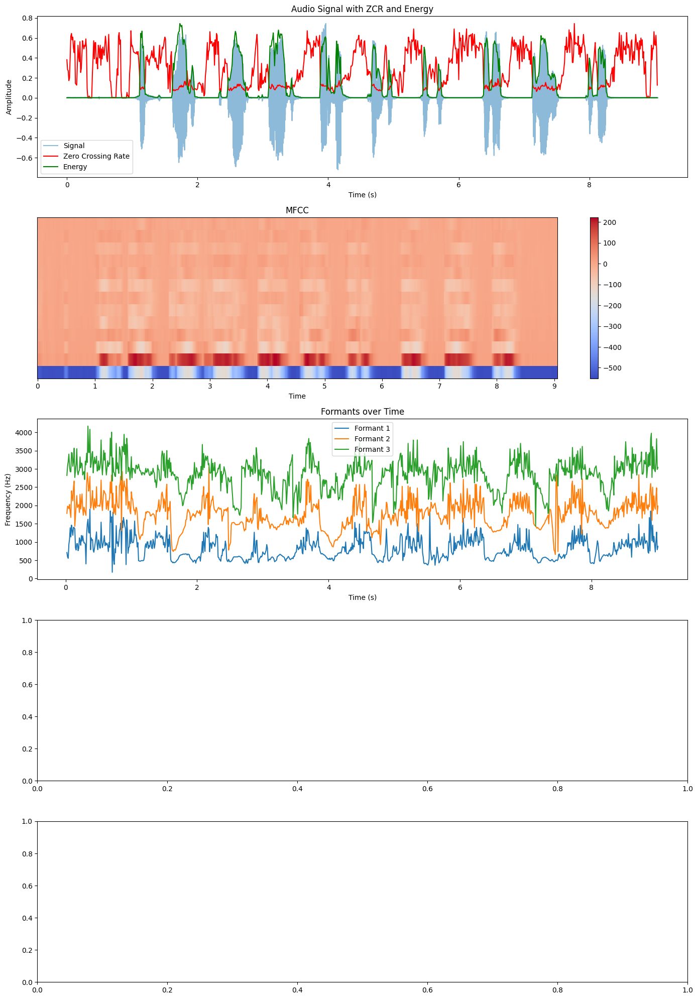

In [21]:
import os
import numpy as np
import scipy.io.wavfile as wav
import librosa
import parselmouth
from parselmouth.praat import call
import matplotlib.pyplot as plt
import librosa.display

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to calculate RMS (Root Mean Square) per frame
def calculate_rms(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms, frame_length

# Function to extract energy
def extract_energy(signal, sample_rate, frame_length=0.01):
    energies, time_step = calculate_rms(signal, sample_rate, frame_length)
    return energies, time_step

# Function to calculate ZCR per frame
def extract_zcr(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    zcr = np.sum(np.abs(np.diff(np.sign(frames))), axis=1) / (2.0 * frame_size)
    return zcr, frame_length

# Function to extract MFCCs
def extract_mfcc(signal, sample_rate, frame_length=0.01, n_mfcc=13):
    hop_length = int(sample_rate * frame_length)
    mfccs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=n_mfcc, hop_length=hop_length)
    mfccs = mfccs.T
    return mfccs, frame_length

# Function to extract formants using Praat via parselmouth
def extract_formants(audio_path, target_sr=16000):
    try:
        snd = parselmouth.Sound(audio_path)
        formant = call(snd, "To Formant (burg)", 0.01, 5.0, 5500, 0.025, 50.0)
        formants = []
        for t in range(1, int(snd.duration // 0.01) + 1):
            formants.append([call(formant, "Get value at time", i, t * 0.01, 'Hertz', 'Linear') for i in range(1, 4)])
        return np.array(formants), 0.01
    except Exception as e:
        print(f"Error extracting formants for {audio_path}: {e}")
        return None, None

# Function to process and plot a single audio file
def process_and_plot(audio_path, target_sr=16000, frame_length=0.01):
    y, sr = process_audio_file(audio_path, target_sr)
    if y is not None and sr is not None:
        energies, energy_time_step = extract_energy(y, sr, frame_length)
        zcrs, zcr_time_step = extract_zcr(y, sr, frame_length)
        mfccs, mfcc_time_step = extract_mfcc(y, sr, frame_length)
        formants, formant_time_step = extract_formants(audio_path, target_sr)
        
        time_energies = np.arange(len(energies)) * energy_time_step
        time_zcrs = np.arange(len(zcrs)) * zcr_time_step
        time_mfccs = np.arange(mfccs.shape[0]) * mfcc_time_step
        time_formants = np.arange(formants.shape[0]) * formant_time_step if formants is not None else None
        time_signal = np.arange(len(y)) / sr
        
        # Normalize ZCR and Energy for plotting on the same graph as the signal
        zcrs_normalized = (zcrs - np.min(zcrs)) / (np.max(zcrs) - np.min(zcrs))
        energies_normalized = (energies - np.min(energies)) / (np.max(energies) - np.min(energies))
        
        # Plot Signal, ZCR, Energy, MFCC, and Formants
        fig, ax = plt.subplots(5, 1, figsize=(14, 20))
        
        # Plot Signal with ZCR and Energy
        ax[0].plot(time_signal, y, label='Signal', alpha=0.5)
        ax[0].plot(time_zcrs, zcrs_normalized * np.max(np.abs(y)), label='Zero Crossing Rate', color='r')
        ax[0].plot(time_energies, energies_normalized * np.max(np.abs(y)), label='Energy', color='g')
        ax[0].set_xlabel('Time (s)')
        ax[0].set_ylabel('Amplitude')
        ax[0].set_title('Audio Signal with ZCR and Energy')
        ax[0].legend()
        
        # Plot MFCCs
        img = librosa.display.specshow(mfccs.T, sr=sr, x_axis='time', hop_length=int(sr * frame_length), ax=ax[1])
        fig.colorbar(img, ax=ax[1])
        ax[1].set_title('MFCC')
        
        # Plot Formants
        if formants is not None:
            for i in range(3):
                ax[2].plot(time_formants, formants[:, i], label=f'Formant {i+1}')
            ax[2].set_xlabel('Time (s)')
            ax[2].set_ylabel('Frequency (Hz)')
            ax[2].set_title('Formants over Time')
            ax[2].legend()
        
        plt.tight_layout()
        plt.show()
    else:
        print("Failed to process the audio file")

# Example usage for a single audio file
audio_file = './speech/NS10-OF-NO1-BC.wav'
process_and_plot(audio_file)

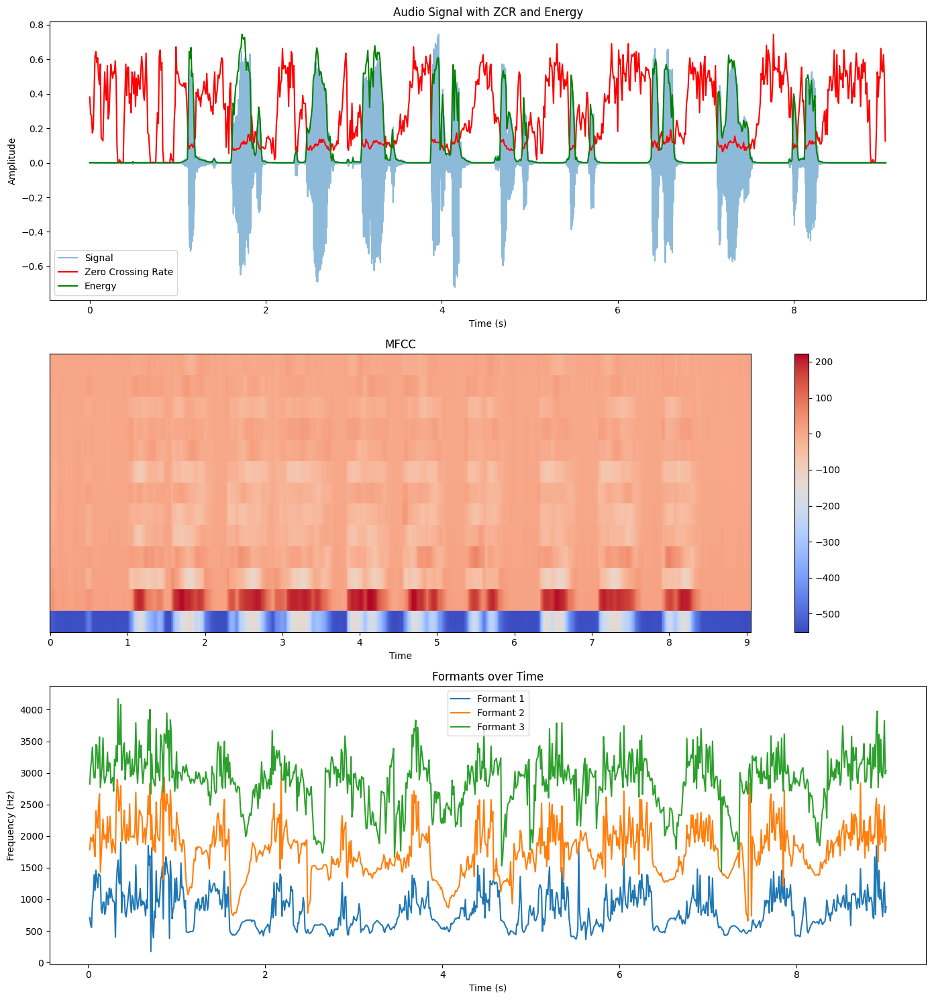

In [23]:
import os
import numpy as np
import scipy.io.wavfile as wav
import librosa
import parselmouth
from parselmouth.praat import call
import matplotlib.pyplot as plt
import librosa.display

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to calculate RMS (Root Mean Square) per frame
def calculate_rms(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms, frame_length

# Function to extract energy
def extract_energy(signal, sample_rate, frame_length=0.01):
    energies, time_step = calculate_rms(signal, sample_rate, frame_length)
    return energies, time_step

# Function to calculate ZCR per frame
def extract_zcr(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    zcr = np.sum(np.abs(np.diff(np.sign(frames))), axis=1) / (2.0 * frame_size)
    return zcr, frame_length

# Function to extract MFCCs
def extract_mfcc(signal, sample_rate, frame_length=0.01, n_mfcc=13):
    hop_length = int(sample_rate * frame_length)
    mfccs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=n_mfcc, hop_length=hop_length)
    mfccs = mfccs.T
    return mfccs, frame_length

# Function to extract formants using Praat via parselmouth
def extract_formants(audio_path, target_sr=16000):
    try:
        snd = parselmouth.Sound(audio_path)
        formant = call(snd, "To Formant (burg)", 0.01, 5.0, 5500, 0.025, 50.0)
        formants = []
        for t in range(1, int(snd.duration // 0.01) + 1):
            formants.append([call(formant, "Get value at time", i, t * 0.01, 'Hertz', 'Linear') for i in range(1, 4)])
        return np.array(formants), 0.01
    except Exception as e:
        print(f"Error extracting formants for {audio_path}: {e}")
        return None, None

# Function to process and plot a single audio file
def process_and_plot(audio_path, target_sr=16000, frame_length=0.01):
    y, sr = process_audio_file(audio_path, target_sr)
    if y is not None and sr is not None:
        energies, energy_time_step = extract_energy(y, sr, frame_length)
        zcrs, zcr_time_step = extract_zcr(y, sr, frame_length)
        mfccs, mfcc_time_step = extract_mfcc(y, sr, frame_length)
        formants, formant_time_step = extract_formants(audio_path, target_sr)
        
        time_energies = np.arange(len(energies)) * energy_time_step
        time_zcrs = np.arange(len(zcrs)) * zcr_time_step
        time_mfccs = np.arange(mfccs.shape[0]) * mfcc_time_step
        time_formants = np.arange(formants.shape[0]) * formant_time_step if formants is not None else None
        time_signal = np.arange(len(y)) / sr
        
        # Normalize ZCR and Energy for plotting on the same graph as the signal
        zcrs_normalized = (zcrs - np.min(zcrs)) / (np.max(zcrs) - np.min(zcrs))
        energies_normalized = (energies - np.min(energies)) / (np.max(energies) - np.min(energies))
        
        # Create a list of subplots to plot the features
        num_subplots = 1  # Starting with Signal + ZCR and Energy
        if mfccs is not None:
            num_subplots += 1
        if formants is not None:
            num_subplots += 1
        
        fig, axs = plt.subplots(num_subplots, 1, figsize=(14, 5 * num_subplots))
        
        # Ensure axs is always a list for consistency
        if num_subplots == 1:
            axs = [axs]
        
        # Plot Signal with ZCR and Energy
        ax_idx = 0
        axs[ax_idx].plot(time_signal, y, label='Signal', alpha=0.5)
        axs[ax_idx].plot(time_zcrs, zcrs_normalized * np.max(np.abs(y)), label='Zero Crossing Rate', color='r')
        axs[ax_idx].plot(time_energies, energies_normalized * np.max(np.abs(y)), label='Energy', color='g')
        axs[ax_idx].set_xlabel('Time (s)')
        axs[ax_idx].set_ylabel('Amplitude')
        axs[ax_idx].set_title('Audio Signal with ZCR and Energy')
        axs[ax_idx].legend()
        
        # Plot MFCCs
        if mfccs is not None:
            ax_idx += 1
            img = librosa.display.specshow(mfccs.T, sr=sr, x_axis='time', hop_length=int(sr * frame_length), ax=axs[ax_idx])
            fig.colorbar(img, ax=axs[ax_idx])
            axs[ax_idx].set_title('MFCC')
        
        # Plot Formants
        if formants is not None:
            ax_idx += 1
            for i in range(3):
                axs[ax_idx].plot(time_formants, formants[:, i], label=f'Formant {i+1}')
            axs[ax_idx].set_xlabel('Time (s)')
            axs[ax_idx].set_ylabel('Frequency (Hz)')
            axs[ax_idx].set_title('Formants over Time')
            axs[ax_idx].legend()
        
        plt.tight_layout()
        plt.show()
    else:
        print("Failed to process the audio file")

# Example usage for a single audio file
audio_file = './speech/NS10-OF-NO1-BC.wav'
process_and_plot(audio_file)

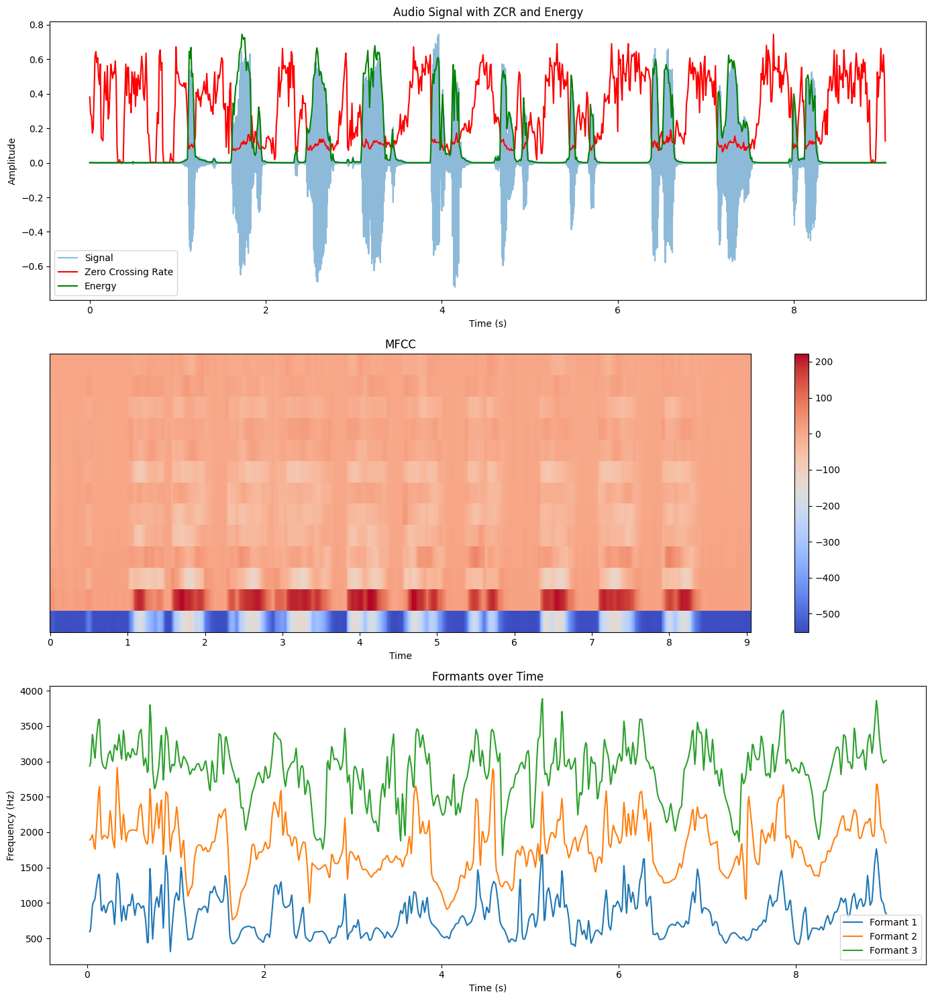

In [64]:
import os
import numpy as np
import librosa
import parselmouth
from parselmouth.praat import call
import matplotlib.pyplot as plt
import librosa.display

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to calculate RMS (Root Mean Square) per frame
def calculate_rms(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms, frame_length

# Function to extract energy
def extract_energy(signal, sample_rate, frame_length=0.01):
    energies, time_step = calculate_rms(signal, sample_rate, frame_length)
    return energies, time_step

# Function to calculate ZCR per frame
def extract_zcr(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    zcr = np.sum(np.abs(np.diff(np.sign(frames))), axis=1) / (2.0 * frame_size)
    return zcr, frame_length

# Function to extract MFCCs
def extract_mfcc(signal, sample_rate, frame_length=0.01, n_mfcc=13):
    hop_length = int(sample_rate * frame_length)
    mfccs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=n_mfcc, hop_length=hop_length)
    mfccs = mfccs.T
    return mfccs, frame_length

# Function to extract formants using Praat
def extract_formants(signal, sample_rate, frame_length=0.01, max_formant=5500):
    sound = parselmouth.Sound(signal, sampling_frequency=sample_rate)
    formant = call(sound, "To Formant (burg)", 0.025, 5.0, max_formant, 0.025, 50.0)
    num_frames = int(np.ceil(sound.duration / frame_length))
    formants = np.zeros((num_frames, 3))
    time_step = sound.duration / num_frames
    for i in range(num_frames):
        t = i * time_step
        for j in range(3):
            formants[i, j] = call(formant, "Get value at time", j + 1, t, 'Hertz', 'Linear')
    return formants, time_step

# Function to process and plot a single audio file
def process_and_plot(audio_path, target_sr=16000, frame_length=0.01):
    y, sr = process_audio_file(audio_path, target_sr)
    if y is not None and sr is not None:
        energies, energy_time_step = extract_energy(y, sr, frame_length)
        zcrs, zcr_time_step = extract_zcr(y, sr, frame_length)
        mfccs, mfcc_time_step = extract_mfcc(y, sr, frame_length)
        formants, formant_time_step = extract_formants(y, sr, frame_length)
                
        time_energies = np.arange(len(energies)) * energy_time_step
        time_zcrs = np.arange(len(zcrs)) * zcr_time_step
        time_mfccs = np.arange(mfccs.shape[0]) * mfcc_time_step
        time_formants = np.arange(formants.shape[0]) * formant_time_step if formants is not None else None
        time_signal = np.arange(len(y)) / sr
        
        # Normalize ZCR and Energy for plotting on the same graph as the signal
        zcrs_normalized = (zcrs - np.min(zcrs)) / (np.max(zcrs) - np.min(zcrs))
        energies_normalized = (energies - np.min(energies)) / (np.max(energies) - np.min(energies))
        
        # Create a list of subplots to plot the features
        num_subplots = 1  # Starting with Signal + ZCR and Energy
        if mfccs is not None:
            num_subplots += 1
        if formants is not None:
            num_subplots += 1
        
        fig, axs = plt.subplots(num_subplots, 1, figsize=(14, 5 * num_subplots))
        
        # Ensure axs is always a list for consistency
        if num_subplots == 1:
            axs = [axs]
        
        # Plot Signal with ZCR and Energy
        ax_idx = 0
        axs[ax_idx].plot(time_signal, y, label='Signal', alpha=0.5)
        axs[ax_idx].plot(time_zcrs, zcrs_normalized * np.max(np.abs(y)), label='Zero Crossing Rate', color='r')
        axs[ax_idx].plot(time_energies, energies_normalized * np.max(np.abs(y)), label='Energy', color='g')
        axs[ax_idx].set_xlabel('Time (s)')
        axs[ax_idx].set_ylabel('Amplitude')
        axs[ax_idx].set_title('Audio Signal with ZCR and Energy')
        axs[ax_idx].legend()
        
        # Plot MFCCs
        if mfccs is not None:
            ax_idx += 1
            img = librosa.display.specshow(mfccs.T, sr=sr, x_axis='time', hop_length=int(sr * frame_length), ax=axs[ax_idx])
            fig.colorbar(img, ax=axs[ax_idx])
            axs[ax_idx].set_title('MFCC')
        
        # Plot Formants
        if formants is not None:
            ax_idx += 1
            for i in range(3):
                axs[ax_idx].plot(time_formants, formants[:, i], label=f'Formant {i+1}')
            axs[ax_idx].set_xlabel('Time (s)')
            axs[ax_idx].set_ylabel('Frequency (Hz)')
            axs[ax_idx].set_title('Formants over Time')
            axs[ax_idx].legend()
        
        plt.tight_layout()
        plt.show()
    else:
        print("Failed to process the audio file")

# Example usage for a single audio file
audio_file = './speech/NS10-OF-NO1-BC.wav'
process_and_plot(audio_file)

In [160]:
# Function to extract formants using Praat
def extract_formants(signal, sample_rate, frame_length=0.01):
    pitch = call(parselmouth.Sound, signal).to_pitch()
    formants = call(pitch, "To Formant (burg)", 0.005, 5, 5500, 0.025, 50)
    num_frames = len(formants.GetTime())  # Number of frames
    frame_size = int(sample_rate * frame_length)
    formant_values = []
    for i in range(num_frames):
        start_time = formants.GetTime()[i]
        if i < num_frames - 1:
            end_time = formants.GetTime()[i + 1]
        else:
            end_time = start_time + frame_length
        frame_signal = signal[int(start_time * sample_rate): int(end_time * sample_rate)]
        formant_value = np.mean(call(formants, "Get value at time", start_time, 'Hertz'))
        formant_values.append(formant_value)
    return np.array(formant_values), frame_length

In [161]:
def process_and_plot(audio_path, target_sr=16000, frame_length=0.01):
    y, sr = process_audio_file(audio_path, target_sr)
    if y is not None and sr is not None:
        energies, energy_time_step = extract_energy(y, sr, frame_length)
        zcrs, zcr_time_step = extract_zcr(y, sr, frame_length)
        mfccs, mfcc_time_step = extract_mfcc(y, sr, frame_length)
        formants, formant_time_step = extract_formants(y, sr, frame_length)
                
        time_energies = np.arange(len(energies)) * energy_time_step
        time_zcrs = np.arange(len(zcrs)) * zcr_time_step
        time_mfccs = np.arange(mfccs.shape[0]) * mfcc_time_step
        time_formants = np.arange(len(formants)) * formant_time_step if formants is not None else None
        time_signal = np.arange(len(y)) / sr
        
        # Normalize ZCR and Energy for plotting on the same graph as the signal
        zcrs_normalized = (zcrs - np.min(zcrs)) / (np.max(zcrs) - np.min(zcrs))
        energies_normalized = (energies - np.min(energies)) / (np.max(energies) - np.min(energies))
        
        # Create a list of subplots to plot the features
        num_subplots = 1  # Starting with Signal + ZCR and Energy
        if mfccs is not None:
            num_subplots += 1
        if formants is not None:
            num_subplots += 1
        
        fig, axs = plt.subplots(num_subplots, 1, figsize=(14, 5 * num_subplots))
        
        # Ensure axs is always a list for consistency
        if num_subplots == 1:
            axs = [axs]
        
        # Plot Signal with ZCR and Energy
        ax_idx = 0
        axs[ax_idx].plot(time_signal, y, label='Signal', alpha=0.5)
        axs[ax_idx].plot(time_zcrs, zcrs_normalized * np.max(np.abs(y)), label='Zero Crossing Rate', color='r')
        axs[ax_idx].plot(time_energies, energies_normalized * np.max(np.abs(y)), label='Energy', color='g')
        axs[ax_idx].set_xlabel('Time (s)')
        axs[ax_idx].set_ylabel('Amplitude')
        axs[ax_idx].set_title('Audio Signal with ZCR and Energy')
        axs[ax_idx].legend()
        
        # Plot MFCCs
        if mfccs is not None:
            ax_idx += 1
            img = librosa.display.specshow(mfccs.T, sr=sr, x_axis='time', hop_length=int(sr * frame_length), ax=axs[ax_idx])
            fig.colorbar(img, ax=axs[ax_idx])
            axs[ax_idx].set_title('MFCC')
        
        # Plot Formants
        if formants is not None:
            ax_idx += 1
            axs[ax_idx].plot(time_formants, formants, label='Formants', color='m')
            axs[ax_idx].set_xlabel('Time (s)')
            axs[ax_idx].set_ylabel('Frequency (Hz)')
            axs[ax_idx].set_title('Formants')
            axs[ax_idx].legend()
  
    else:
        print("Failed to process the audio file")

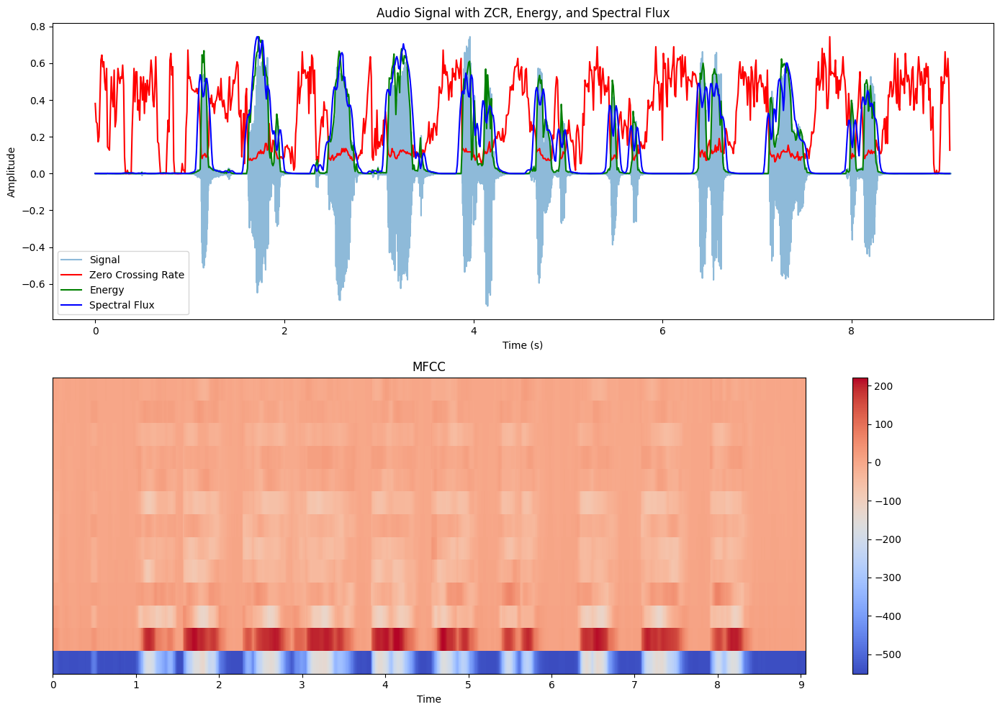

In [17]:
import os
import numpy as np
import librosa
import matplotlib.pyplot as plt
import librosa.display

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to calculate RMS (Root Mean Square) per frame
def calculate_rms(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms, frame_length

# Function to extract energy
def extract_energy(signal, sample_rate, frame_length=0.01):
    energies, time_step = calculate_rms(signal, sample_rate, frame_length)
    return energies, time_step

# Function to calculate ZCR per frame
def extract_zcr(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    zcr = np.sum(np.abs(np.diff(np.sign(frames))), axis=1) / (2.0 * frame_size)
    return zcr, frame_length

# Function to extract MFCCs
def extract_mfcc(signal, sample_rate, frame_length=0.01, n_mfcc=13):
    hop_length = int(sample_rate * frame_length)
    mfccs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=n_mfcc, hop_length=hop_length)
    mfccs = mfccs.T
    return mfccs, frame_length

# Function to extract spectral flux
def extract_spectral_flux(signal, sample_rate, frame_length=0.01):
    hop_length = int(sample_rate * frame_length)
    stft = np.abs(librosa.stft(signal, hop_length=hop_length))
    spectral_flux = np.sqrt(np.sum(np.diff(stft, axis=1)**2, axis=0)) / stft.shape[0]
    return spectral_flux, frame_length

# Function to process and plot a single audio file
def process_and_plot(audio_path, target_sr=16000, frame_length=0.01):
    y, sr = process_audio_file(audio_path, target_sr)
    if y is not None and sr is not None:
        energies, energy_time_step = extract_energy(y, sr, frame_length)
        zcrs, zcr_time_step = extract_zcr(y, sr, frame_length)
        mfccs, mfcc_time_step = extract_mfcc(y, sr, frame_length)
        spectral_flux, flux_time_step = extract_spectral_flux(y, sr, frame_length)
                
        time_energies = np.arange(len(energies)) * energy_time_step
        time_zcrs = np.arange(len(zcrs)) * zcr_time_step
        time_mfccs = np.arange(mfccs.shape[0]) * mfcc_time_step
        time_flux = np.arange(len(spectral_flux)) * flux_time_step
        time_signal = np.arange(len(y)) / sr
        
        # Normalize ZCR, Energy, and Spectral Flux for plotting on the same graph as the signal
        zcrs_normalized = (zcrs - np.min(zcrs)) / (np.max(zcrs) - np.min(zcrs))
        energies_normalized = (energies - np.min(energies)) / (np.max(energies) - np.min(energies))
        flux_normalized = (spectral_flux - np.min(spectral_flux)) / (np.max(spectral_flux) - np.min(spectral_flux))
        
        # Create a list of subplots to plot the features
        num_subplots = 1  # Starting with Signal + ZCR, Energy, and Spectral Flux
        if mfccs is not None:
            num_subplots += 1
        
        fig, axs = plt.subplots(num_subplots, 1, figsize=(14, 5 * num_subplots))
        
        # Ensure axs is always a list for consistency
        if num_subplots == 1:
            axs = [axs]
        
        # Plot Signal with ZCR, Energy, and Spectral Flux
        ax_idx = 0
        axs[ax_idx].plot(time_signal, y, label='Signal', alpha=0.5)
        axs[ax_idx].plot(time_zcrs, zcrs_normalized * np.max(np.abs(y)), label='Zero Crossing Rate', color='r')
        axs[ax_idx].plot(time_energies, energies_normalized * np.max(np.abs(y)), label='Energy', color='g')
        axs[ax_idx].plot(time_flux, flux_normalized * np.max(np.abs(y)), label='Spectral Flux', color='b')
        axs[ax_idx].set_xlabel('Time (s)')
        axs[ax_idx].set_ylabel('Amplitude')
        axs[ax_idx].set_title('Audio Signal with ZCR, Energy, and Spectral Flux')
        axs[ax_idx].legend()
        
        # Plot MFCCs
        if mfccs is not None:
            ax_idx += 1
            img = librosa.display.specshow(mfccs.T, sr=sr, x_axis='time', hop_length=int(sr * frame_length), ax=axs[ax_idx])
            fig.colorbar(img, ax=axs[ax_idx])
            axs[ax_idx].set_title('MFCC')
        
        plt.tight_layout()
        plt.show()
    else:
        print("Failed to process the audio file")

# Example usage for a single audio file
audio_file = './speech/NS10-OF-NO1-BC.wav'
process_and_plot(audio_file)

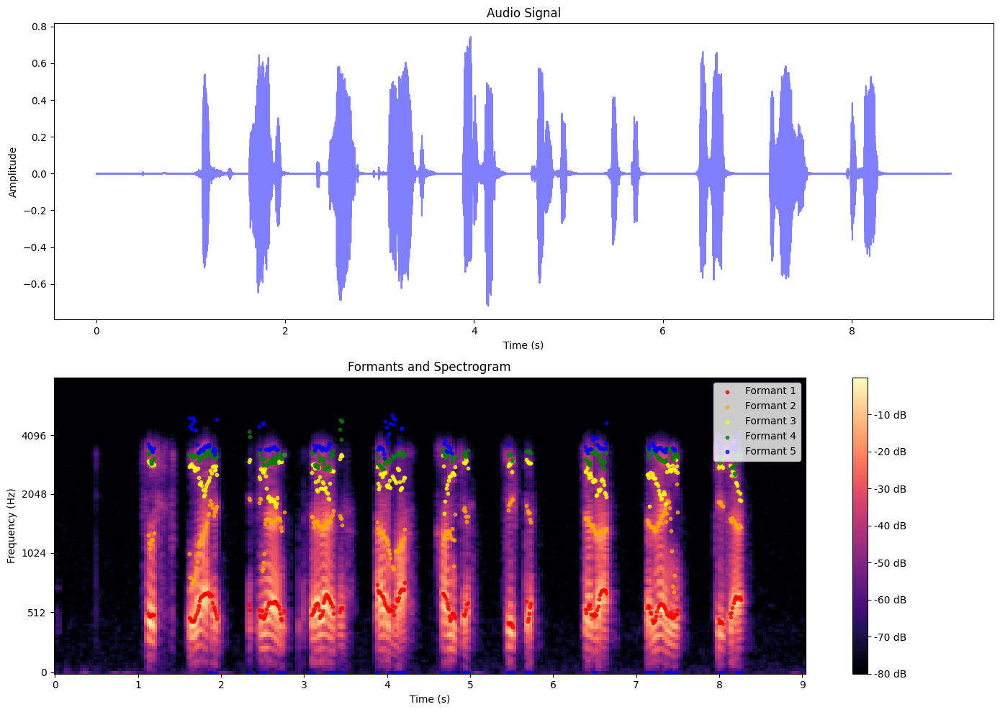

In [26]:
import os
import numpy as np
import librosa
import matplotlib.pyplot as plt
import librosa.display
import parselmouth
from parselmouth.praat import call

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to extract formants using Praat (parselmouth)
def extract_formants(signal, sample_rate, max_formant=5500, num_formants=5, window_length=0.025, frame_length=0.01):
    sound = parselmouth.Sound(signal, sampling_frequency=sample_rate)
    formant = call(sound, "To Formant (burg)", 0.0, num_formants, max_formant, window_length, 50.0)
    formants = []
    times = []

    for t in np.arange(0, sound.get_total_duration(), frame_length):
        formant_frame = []
        times.append(t)
        for i in range(1, num_formants + 1):
            formant_value = formant.get_value_at_time(i, t)
            if np.isnan(formant_value):
                formant_frame.append(0)
            else:
                formant_frame.append(formant_value)
        formants.append(formant_frame)
    
    formants = np.array(formants)
    return formants, times

# Function to calculate the signal intensity
def calculate_intensity(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    intensity = np.sqrt(np.mean(frames**2, axis=1))
    return intensity, frame_length

# Function to process and plot a single audio file
def process_and_plot(audio_path, target_sr=16000, frame_length=0.01, intensity_threshold=0.02):
    y, sr = process_audio_file(audio_path, target_sr)
    if y is not None and sr is not None:
        formants, formant_times = extract_formants(y, sr, frame_length=frame_length)
        intensity, _ = calculate_intensity(y, sr, frame_length)
        
        time_signal = np.arange(len(y)) / sr
        time_formants = formant_times
        time_intensity = np.arange(len(intensity)) * frame_length
        
        # Create a plot with two subplots: one for the signal and one for the spectrogram with formants
        fig, axs = plt.subplots(2, 1, figsize=(14, 10))
        
        # Plot Signal
        axs[0].plot(time_signal, y, label='Signal', alpha=0.5, color='b')
        axs[0].set_xlabel('Time (s)')
        axs[0].set_ylabel('Amplitude')
        axs[0].set_title('Audio Signal')
        
        # Create a spectrogram for the background
        S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)
        S_dB = librosa.power_to_db(S, ref=np.max)
        img = librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel', fmax=8000, ax=axs[1])
        fig.colorbar(img, ax=axs[1], format='%+2.0f dB')
        
        # Overlay formant tracks
        colors = ['red', 'orange', 'yellow', 'green', 'blue']
        for i in range(formants.shape[1]):
            valid_indices = intensity > intensity_threshold
            axs[1].scatter(np.array(time_formants)[valid_indices], formants[:, i][valid_indices], label=f'Formant {i+1}', alpha=0.75, s=10, color=colors[i % len(colors)])
        
        axs[1].set_xlabel('Time (s)')
        axs[1].set_ylabel('Frequency (Hz)')
        axs[1].set_title('Formants and Spectrogram')
        axs[1].legend(loc='upper right')
        
        plt.tight_layout()
        plt.show()
    else:
        print("Failed to process the audio file")

# Example usage for a single audio file
audio_file = './speech/NS10-OF-NO1-BC.wav'
process_and_plot(audio_file)

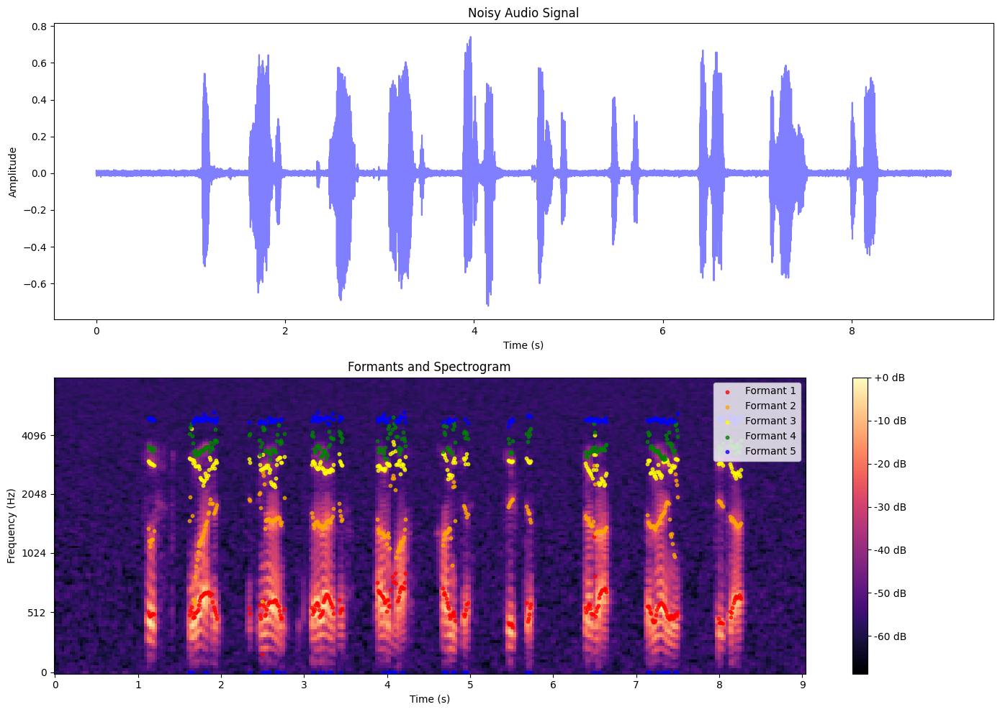

In [27]:
import os
import numpy as np
import librosa
import matplotlib.pyplot as plt
import librosa.display
import parselmouth
from parselmouth.praat import call

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to add white noise to the signal
def add_white_noise(signal, noise_level=0.005):
    noise = np.random.randn(len(signal))
    augmented_data = signal + noise_level * noise
    return augmented_data

# Function to extract formants using Praat (parselmouth)
def extract_formants(signal, sample_rate, max_formant=5500, num_formants=5, window_length=0.025, frame_length=0.01):
    sound = parselmouth.Sound(signal, sampling_frequency=sample_rate)
    formant = call(sound, "To Formant (burg)", 0.0, num_formants, max_formant, window_length, 50.0)
    formants = []
    times = []

    for t in np.arange(0, sound.get_total_duration(), frame_length):
        formant_frame = []
        times.append(t)
        for i in range(1, num_formants + 1):
            formant_value = formant.get_value_at_time(i, t)
            if np.isnan(formant_value):
                formant_frame.append(0)
            else:
                formant_frame.append(formant_value)
        formants.append(formant_frame)
    
    formants = np.array(formants)
    return formants, times

# Function to calculate the signal intensity
def calculate_intensity(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    intensity = np.sqrt(np.mean(frames**2, axis=1))
    return intensity, frame_length

# Function to process and plot a single audio file
def process_and_plot(audio_path, target_sr=16000, frame_length=0.01, intensity_threshold=0.02, noise_level=0.005):
    y, sr = process_audio_file(audio_path, target_sr)
    if y is not None and sr is not None:
        y_noisy = add_white_noise(y, noise_level)
        formants, formant_times = extract_formants(y_noisy, sr, frame_length=frame_length)
        intensity, _ = calculate_intensity(y_noisy, sr, frame_length)
        
        time_signal = np.arange(len(y_noisy)) / sr
        time_formants = formant_times
        time_intensity = np.arange(len(intensity)) * frame_length
        
        # Create a plot with two subplots: one for the signal and one for the spectrogram with formants
        fig, axs = plt.subplots(2, 1, figsize=(14, 10))
        
        # Plot Signal
        axs[0].plot(time_signal, y_noisy, label='Noisy Signal', alpha=0.5, color='b')
        axs[0].set_xlabel('Time (s)')
        axs[0].set_ylabel('Amplitude')
        axs[0].set_title('Noisy Audio Signal')
        
        # Create a spectrogram for the background
        S = librosa.feature.melspectrogram(y=y_noisy, sr=sr, n_mels=128, fmax=8000)
        S_dB = librosa.power_to_db(S, ref=np.max)
        img = librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel', fmax=8000, ax=axs[1])
        fig.colorbar(img, ax=axs[1], format='%+2.0f dB')
        
        # Overlay formant tracks
        colors = ['red', 'orange', 'yellow', 'green', 'blue']
        for i in range(formants.shape[1]):
            valid_indices = intensity > intensity_threshold
            axs[1].scatter(np.array(time_formants)[valid_indices], formants[:, i][valid_indices], label=f'Formant {i+1}', alpha=0.75, s=10, color=colors[i % len(colors)])
        
        axs[1].set_xlabel('Time (s)')
        axs[1].set_ylabel('Frequency (Hz)')
        axs[1].set_title('Formants and Spectrogram')
        axs[1].legend(loc='upper right')
        
        plt.tight_layout()
        plt.show()
    else:
        print("Failed to process the audio file")

# Example usage for a single audio file
audio_file = './speech/NS10-OF-NO1-BC.wav'
process_and_plot(audio_file)

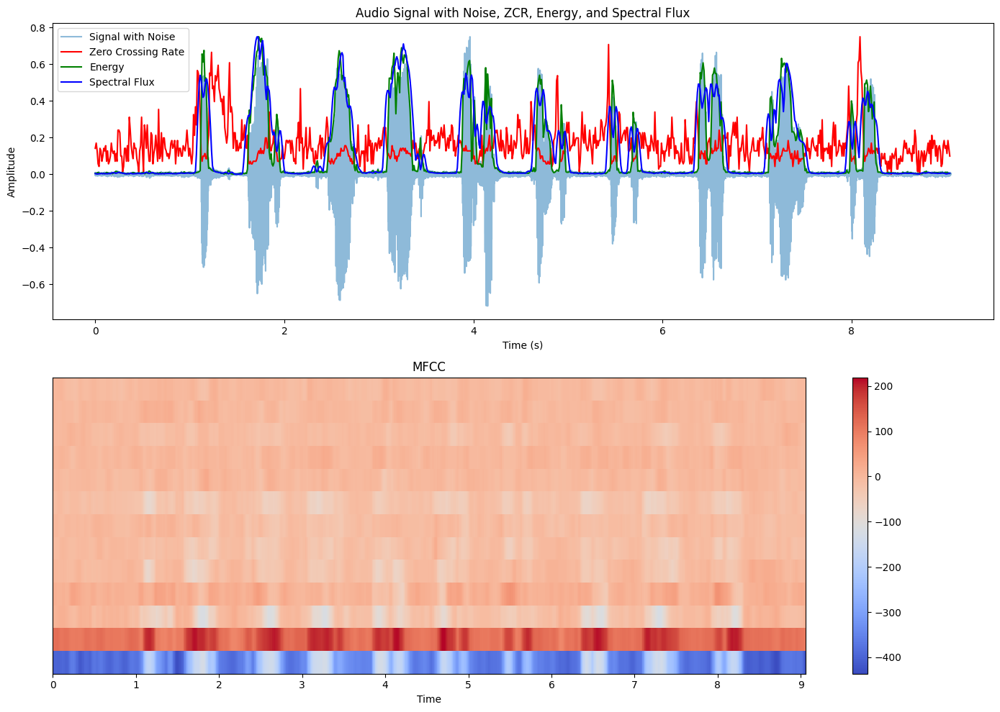

In [49]:
import os
import numpy as np
import librosa
import matplotlib.pyplot as plt
import librosa.display

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to calculate RMS (Root Mean Square) per frame
def calculate_rms(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms, frame_length

# Function to extract energy
def extract_energy(signal, sample_rate, frame_length=0.01):
    energies, time_step = calculate_rms(signal, sample_rate, frame_length)
    return energies, time_step

# Function to calculate ZCR per frame
def extract_zcr(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    zcr = np.sum(np.abs(np.diff(np.sign(frames))), axis=1) / (2.0 * frame_size)
    return zcr, frame_length

# Function to extract MFCCs
def extract_mfcc(signal, sample_rate, frame_length=0.01, n_mfcc=13):
    hop_length = int(sample_rate * frame_length)
    mfccs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=n_mfcc, hop_length=hop_length)
    mfccs = mfccs.T
    return mfccs, frame_length

# Function to extract spectral flux
def extract_spectral_flux(signal, sample_rate, frame_length=0.01):
    hop_length = int(sample_rate * frame_length)
    stft = np.abs(librosa.stft(signal, hop_length=hop_length))
    spectral_flux = np.sqrt(np.sum(np.diff(stft, axis=1)**2, axis=0)) / stft.shape[0]
    return spectral_flux, frame_length

# Function to add noise to the audio signal
def add_noise(signal, noise, snr):
    signal_power = np.mean(signal ** 2)
    noise_power = np.mean(noise ** 2)
    noise_variance = signal_power / (10 ** (snr / 10))
    scaled_noise = np.sqrt(noise_variance / noise_power) * noise
    noisy_signal = signal + scaled_noise
    return noisy_signal

# Function to process and plot a single audio file with noise
def process_and_plot(audio_path, noise_path, target_sr=16000, frame_length=0.01, snr=25):
    try:
        # Load audio and resample if necessary
        y, sr = process_audio_file(audio_path, target_sr)
        if y is None:
            raise ValueError("Failed to load audio file or resample.")

        # Load noise and resample if necessary
        noise, _ = librosa.load(noise_path, sr=target_sr)
        if len(noise) < len(y):
            repeats = int(np.ceil(len(y) / len(noise)))
            noise = np.tile(noise, repeats)[:len(y)]
        elif len(noise) > len(y):
            noise = noise[:len(y)]

        # Add noise to the signal
        y_noisy = add_noise(y, noise, snr)

        # Extract features
        energies, energy_time_step = extract_energy(y_noisy, sr, frame_length)
        zcrs, zcr_time_step = extract_zcr(y_noisy, sr, frame_length)
        mfccs, mfcc_time_step = extract_mfcc(y_noisy, sr, frame_length)
        spectral_flux, flux_time_step = extract_spectral_flux(y_noisy, sr, frame_length)
                
        time_energies = np.arange(len(energies)) * energy_time_step
        time_zcrs = np.arange(len(zcrs)) * zcr_time_step
        time_mfccs = np.arange(mfccs.shape[0]) * mfcc_time_step
        time_flux = np.arange(len(spectral_flux)) * flux_time_step
        time_signal = np.arange(len(y_noisy)) / sr
        
        # Normalize ZCR, Energy, and Spectral Flux for plotting on the same graph as the signal
        zcrs_normalized = (zcrs - np.min(zcrs)) / (np.max(zcrs) - np.min(zcrs))
        energies_normalized = (energies - np.min(energies)) / (np.max(energies) - np.min(energies))
        flux_normalized = (spectral_flux - np.min(spectral_flux)) / (np.max(spectral_flux) - np.min(spectral_flux))
        
        # Create a list of subplots to plot the features
        num_subplots = 1  # Starting with Signal + ZCR, Energy, and Spectral Flux
        if mfccs is not None:
            num_subplots += 1
        
        fig, axs = plt.subplots(num_subplots, 1, figsize=(14, 5 * num_subplots))
        
        # Ensure axs is always a list for consistency
        if num_subplots == 1:
            axs = [axs]
        
        # Plot Signal with ZCR, Energy, and Spectral Flux
        ax_idx = 0
        axs[ax_idx].plot(time_signal, y_noisy, label='Signal with Noise', alpha=0.5)
        axs[ax_idx].plot(time_zcrs, zcrs_normalized * np.max(np.abs(y_noisy)), label='Zero Crossing Rate', color='r')
        axs[ax_idx].plot(time_energies, energies_normalized * np.max(np.abs(y_noisy)), label='Energy', color='g')
        axs[ax_idx].plot(time_flux, flux_normalized * np.max(np.abs(y_noisy)), label='Spectral Flux', color='b')
        axs[ax_idx].set_xlabel('Time (s)')
        axs[ax_idx].set_ylabel('Amplitude')
        axs[ax_idx].set_title('Audio Signal with Noise, ZCR, Energy, and Spectral Flux')
        axs[ax_idx].legend()
        
        # Plot MFCCs
        if mfccs is not None:
            ax_idx += 1
            img = librosa.display.specshow(mfccs.T, sr=sr, x_axis='time', hop_length=int(sr * frame_length), ax=axs[ax_idx])
            fig.colorbar(img, ax=axs[ax_idx])
            axs[ax_idx].set_title('MFCC')
        
        plt.tight_layout()
        plt.show()
    
    except Exception as e:
        print(f"Error processing and plotting audio file {audio_path}: {e}")

# Example usage for a single audio file
audio_file = './speech/NS10-OF-NO1-BC.wav'
noise_file = './bruits/babble.wav'
process_and_plot(audio_file, noise_file)


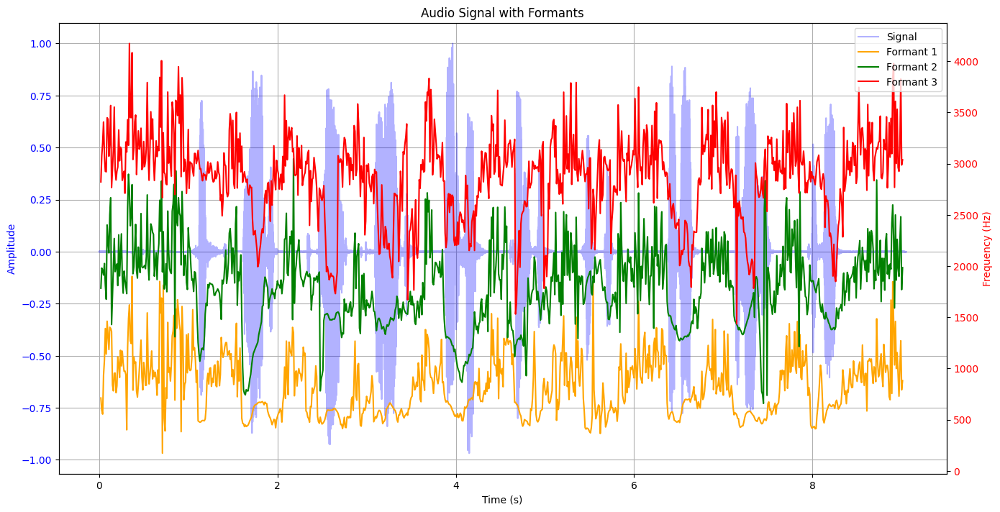

In [11]:
import os
import numpy as np
import librosa
import parselmouth
from parselmouth.praat import call
import matplotlib.pyplot as plt

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to extract formants using Praat via parselmouth
def extract_formants(audio_path, target_sr=16000):
    try:
        snd = parselmouth.Sound(audio_path)
        formant = call(snd, "To Formant (burg)", 0.01, 5.0, 5500, 0.025, 50.0)
        formants = []
        for t in range(1, int(snd.duration // 0.01) + 1):
            formants.append([call(formant, "Get value at time", i, t * 0.01, 'Hertz', 'Linear') for i in range(1, 4)])
        return np.array(formants), 0.01
    except Exception as e:
        print(f"Error extracting formants for {audio_path}: {e}")
        return None, None

# Function to process and plot a single audio file
def process_and_plot(audio_path, target_sr=16000, frame_length=0.01):
    y, sr = process_audio_file(audio_path, target_sr)
    if y is not None and sr is not None:
        formants, formant_time_step = extract_formants(audio_path, target_sr)
        
        time_formants = np.arange(formants.shape[0]) * formant_time_step if formants is not None else None
        time_signal = np.arange(len(y)) / sr
        
        fig, ax1 = plt.subplots(figsize=(14, 7))
        
        # Normalize the signal for better visibility
        y_normalized = y / np.max(np.abs(y))
        
        # Plot Signal on the primary y-axis
        ax1.plot(time_signal, y_normalized, label='Signal', alpha=0.3, color='b')
        ax1.set_xlabel('Time (s)')
        ax1.set_ylabel('Amplitude', color='b')
        ax1.tick_params(axis='y', labelcolor='b')
        
        # Create a secondary y-axis for the formants
        ax2 = ax1.twinx()
        ax2.set_ylabel('Frequency (Hz)', color='r')
        ax2.tick_params(axis='y', labelcolor='r')
        
        # Plot Formants on the secondary y-axis
        if formants is not None:
            formant_colors = ['orange', 'green', 'red']
            for i in range(3):
                ax2.plot(time_formants, formants[:, i], label=f'Formant {i+1}', color=formant_colors[i])
        
        fig.tight_layout()
        fig.legend(loc="upper right", bbox_to_anchor=(1,1), bbox_transform=ax1.transAxes)
        ax1.grid(True)  # Adding grid for better readability
        plt.title('Audio Signal with Formants')
        plt.show()
    else:
        print("Failed to process the audio file")

# Example usage for a single audio file
audio_file = './speech/NS10-OF-NO1-BC.wav'
process_and_plot(audio_file)

Error extracting formants for ./speech/NS10-OF-NO1-BC.wav: [WinError 2] Le fichier spécifié est introuvable


Traceback (most recent call last):
  File "C:\Users\user\AppData\Local\Temp\ipykernel_13680\127316157.py", line 104, in extract_formants
    formants = file2formants(audio_path, maxformant=5500, winlen=0.025, preemph=50)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\user\AppData\Local\Temp\ipykernel_13680\127316157.py", line 76, in file2formants
    res = run_praat(make_script(),
          ^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\user\AppData\Local\Temp\ipykernel_13680\127316157.py", line 40, in run_praat
    p = subprocess.run(['praat'] + ['--run'] + list(map(str, list(args))), shell=False, stdout=subprocess.PIPE, stderr=subprocess.PIPE, bufsize=1, universal_newlines=True)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\subprocess.py", line 54

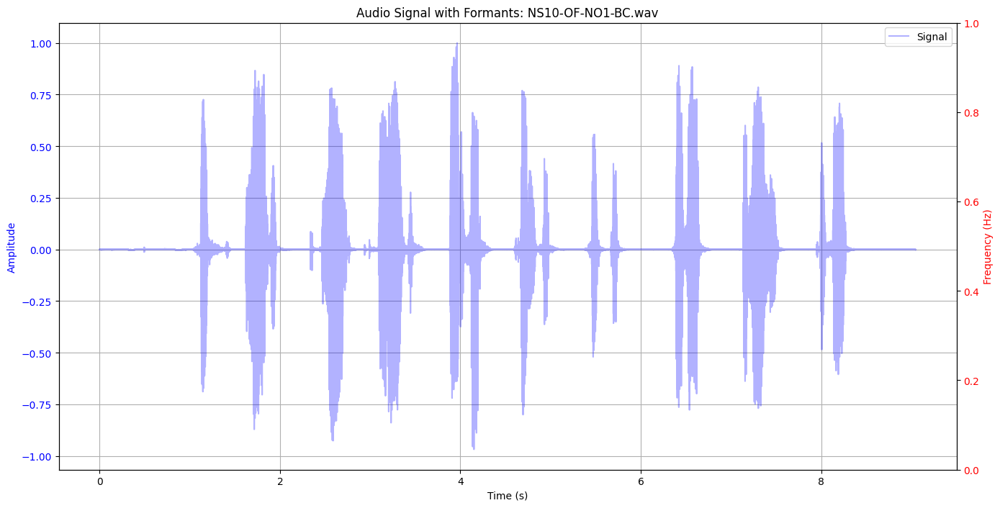

In [58]:
import os
import numpy as np
import librosa
import parselmouth
from parselmouth.praat import call
import matplotlib.pyplot as plt
import warnings
import tempfile
import subprocess

_script_loc = None

def make_script():
    global _script_loc
    if _script_loc is None:
        _script_loc = tempfile.mktemp(suffix='.praat')
        with open(_script_loc, 'w') as fid:
            fid.write("""# take name of wav file from stdin and dump formant table to stdout
form File
sentence filename
positive maxformant 5500
real winlen 0.025
positive preemph 50
endform
Read from file... 'filename$'
To Formant (burg)... 0.01 5 'maxformant' 'winlen' 'preemph'
List... no yes 6 no 3 no 3 no
exit""")
    return _script_loc

class PraatError(Exception):
    pass

def run_praat(*args):
    """Run praat with `args` and return results as a c string

    Arguments:
    :param *args: command line arguments to pass to praat.
    """
    p = subprocess.run(['praat'] + ['--run'] + list(map(str, list(args))), shell=False, stdout=subprocess.PIPE, stderr=subprocess.PIPE, bufsize=1, universal_newlines=True)

    if p.returncode:
        raise PraatError(''.join(p.stderr.readlines()))
    else:
        return p.stdout

_fmt_cache = {}

def file2formants(filename, maxformant=5500, winlen=0.025, preemph=50,
                  memoize_call=True):
    """Extract formant table from audio file using praat.
    The return array is laid out as:
    [[time, f1, f2, f3],
     ..]

    Formants that praat returns as undefined are represented as NaNs. This
    function can be memoized to minimize the number of calls to praat.

    Arguments:
    :param filename: filename of audio file
    :param maxformant: formant ceiling (use 5500 for female speech, 5000 for male)
    :param winlen: window length in seconds [0.025]
    :param preemph: pre-emphasis [50]
    :param memoize_call: Memoize the calls to praat. Use `clear_formant_cache()`
      to reset the cache.
    """
    def _float(s):
        try:
            return float(s)
        except ValueError:
            return np.nan

    if memoize_call:
        key = (filename, maxformant, winlen, preemph)
        if key not in _fmt_cache:
            res = run_praat(make_script(),
                            filename, maxformant, winlen, preemph)
            _fmt_cache[key] = np.array([list(map(_float, x.rstrip().split('\t')[:4])) for x in res.split('\n')[1:-1]])
        return _fmt_cache[key]
    else:
        res = run_praat(make_script(),
                        filename, maxformant, winlen, preemph)
        return np.array([list(map(_float, x.rstrip().split('\t')[:4])) for x in res.split('\n')[1:-1]])

def clear_formant_cache():
    """Clear the formant cache.
    """
    global _fmt_cache
    _fmt_cache = {}

def process_audio_file(audio_path, target_sr=16000):
    """Load and preprocess audio file."""
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=True)  # Load as mono
        y_resampled = librosa.resample(y, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

def extract_formants(audio_path, target_sr=16000):
    """Extract formants using Praat via parselmouth."""
    try:
        formants = file2formants(audio_path, maxformant=5500, winlen=0.025, preemph=50)
        formant_time_step = 0.01  # assuming a fixed time step of 0.01s for formants
        return formants, formant_time_step
    except Exception as e:
        import traceback
        print(f"Error extracting formants for {audio_path}: {e}")
        traceback.print_exc()
        return None, None


def process_and_plot(audio_path, target_sr=16000, frame_length=0.01):
    """Process and plot a single audio file with its formants."""
    y, sr = process_audio_file(audio_path, target_sr)
    if y is not None and sr is not None:
        formants, formant_time_step = extract_formants(audio_path, target_sr)
        
        if formants is not None:
            time_formants = np.arange(formants.shape[0]) * formant_time_step
        else:
            time_formants = None
        
        time_signal = np.arange(len(y)) / sr
        
        fig, ax1 = plt.subplots(figsize=(14, 7))
        
        # Normalize the signal for better visibility
        y_normalized = y / np.max(np.abs(y))
        
        # Plot Signal on the primary y-axis
        ax1.plot(time_signal, y_normalized, label='Signal', alpha=0.3, color='b')
        ax1.set_xlabel('Time (s)')
        ax1.set_ylabel('Amplitude', color='b')
        ax1.tick_params(axis='y', labelcolor='b')
        
        # Create a secondary y-axis for the formants
        ax2 = ax1.twinx()
        ax2.set_ylabel('Frequency (Hz)', color='r')
        ax2.tick_params(axis='y', labelcolor='r')
        
        # Plot Formants on the secondary y-axis
        if formants is not None:
            formant_colors = ['orange', 'green', 'red']
            for i in range(3):
                ax2.plot(time_formants, formants[:, i], label=f'Formant {i+1}', color=formant_colors[i])
        
        fig.tight_layout()
        fig.legend(loc="upper right", bbox_to_anchor=(1,1), bbox_transform=ax1.transAxes)
        ax1.grid(True)  # Adding grid for better readability
        plt.title(f'Audio Signal with Formants: {os.path.basename(audio_path)}')
        plt.show()
    else:
        print("Failed to process the audio file")

# Example usage for a single audio file
audio_file = './speech/NS10-OF-NO1-BC.wav'
process_and_plot(audio_file)

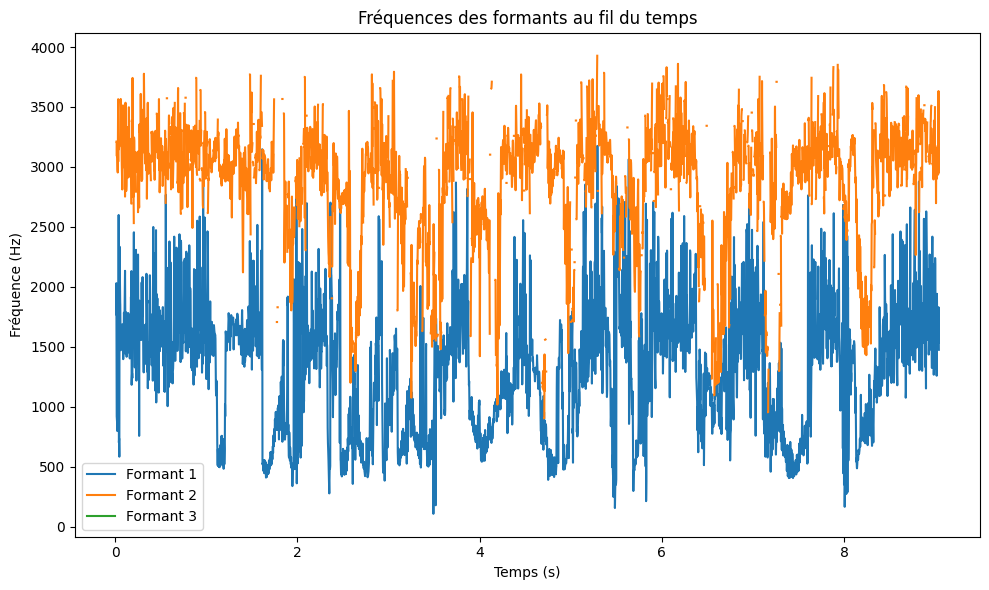

Terminé


In [60]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import parselmouth
from parselmouth.praat import call

# Définir les paramètres
test_wav = './speech/NS10-OF-NO1-BC.wav'
frame_duration = 0.010  # Durée de la trame de 10 ms
emphasize_ratio = 0.65
f0_min = 30
f0_max = 4000
max_frames = 500
max_formants = 3

# Charger le fichier audio et resampler à 16 kHz en mono
y, sr = librosa.load(test_wav, sr=16000, mono=True)

# Créer un objet Sound à partir du signal chargé
sound = parselmouth.Sound(y, sampling_frequency=sr)

# Extraire les formants en utilisant Praat (méthode To Formant (burg))
formants = call(sound, "To Formant (burg)", 0, max_formants - 1, f0_max, frame_duration, frame_duration)

# Extraire les valeurs des formants
formant_values = []
for formant_idx in range(max_formants):
    formant_values.append([formants.get_value_at_time(formant_idx + 1, t) for t in sound.xs()])

# Convertir en numpy array pour faciliter la manipulation
formant_values = np.array(formant_values)

# Visualiser les fréquences des formants au fil du temps
plt.figure(figsize=(10, 6))
for formant_idx in range(max_formants):
    plt.plot(sound.xs(), formant_values[formant_idx], label=f"Formant {formant_idx + 1}")

plt.xlabel("Temps (s)")
plt.ylabel("Fréquence (Hz)")
plt.title("Fréquences des formants au fil du temps")
plt.legend()
plt.tight_layout()
plt.show()

print("Terminé")

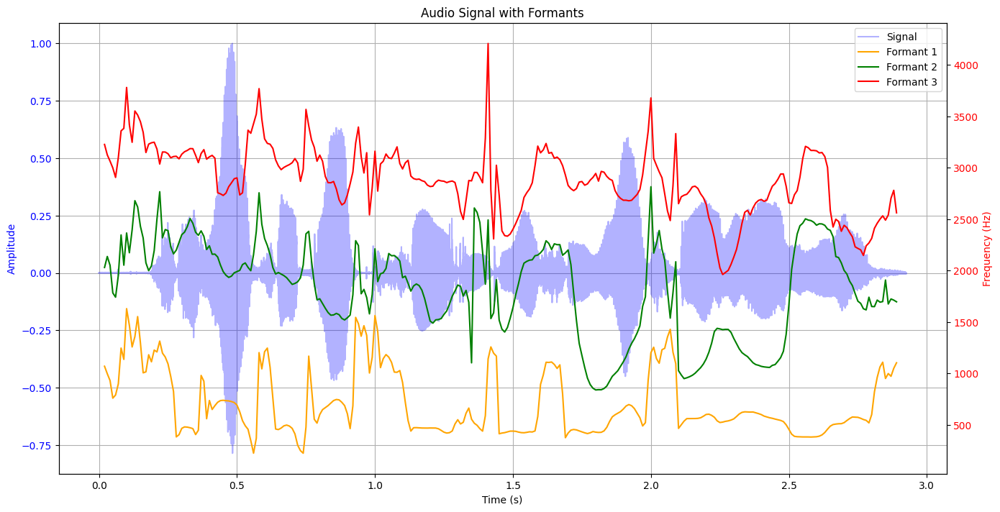

In [88]:
import os
import numpy as np
import librosa
import parselmouth
from parselmouth.praat import call
import matplotlib.pyplot as plt

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to extract formants using Praat via parselmouth
def extract_formants(audio_path, target_sr=16000):
    try:
        snd = parselmouth.Sound(audio_path)
        formant = call(snd, "To Formant (burg)", 0.01, 5.0, 5500, 0.025, 50.0)
        formants = []
        for t in range(1, int(snd.duration // 0.01) + 1):
            formants.append([call(formant, "Get value at time", i, t * 0.01, 'Hertz', 'Linear') for i in range(1, 4)])
        return np.array(formants), 0.01
    except Exception as e:
        print(f"Error extracting formants for {audio_path}: {e}")
        return None, None

# Function to process and plot a single audio file
def process_and_plot(audio_path, target_sr=16000, frame_length=0.01):
    y, sr = process_audio_file(audio_path, target_sr)
    if y is not None and sr is not None:
        formants, formant_time_step = extract_formants(audio_path, target_sr)
        
        time_formants = np.arange(formants.shape[0]) * formant_time_step if formants is not None else None
        time_signal = np.arange(len(y)) / sr
        
        fig, ax1 = plt.subplots(figsize=(14, 7))
        
        # Normalize the signal for better visibility
        y_normalized = y / np.max(np.abs(y))
        
        # Plot Signal on the primary y-axis
        ax1.plot(time_signal, y_normalized, label='Signal', alpha=0.3, color='b')
        ax1.set_xlabel('Time (s)')
        ax1.set_ylabel('Amplitude', color='b')
        ax1.tick_params(axis='y', labelcolor='b')
        
        # Create a secondary y-axis for the formants
        ax2 = ax1.twinx()
        ax2.set_ylabel('Frequency (Hz)', color='r')
        ax2.tick_params(axis='y', labelcolor='r')
        
        # Plot Formants on the secondary y-axis
        if formants is not None:
            formant_colors = ['orange', 'green', 'red']
            for i in range(3):
                ax2.plot(time_formants, formants[:, i], label=f'Formant {i+1}', color=formant_colors[i])
        
        fig.tight_layout()
        fig.legend(loc="upper right", bbox_to_anchor=(1,1), bbox_transform=ax1.transAxes)
        ax1.grid(True)  # Adding grid for better readability
        plt.title('Audio Signal with Formants')
        plt.show()
    else:
        print("Failed to process the audio file")

# Example usage for a single audio file
audio_file = './Audio/SA1.wav'
process_and_plot(audio_file)

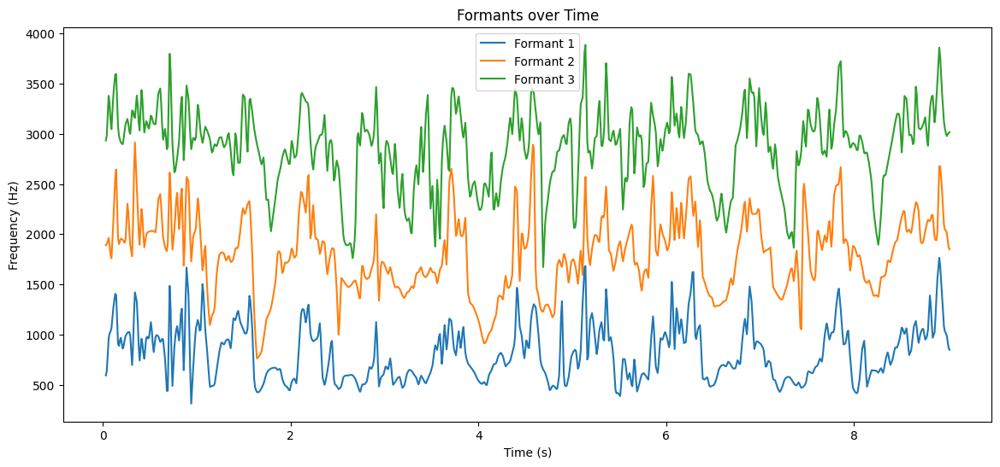

(array([[          nan,           nan,           nan],
        [          nan,           nan,           nan],
        [          nan,           nan,           nan],
        ...,
        [ 848.55660135, 1848.78426833, 3015.88758849],
        [          nan,           nan,           nan],
        [          nan,           nan,           nan]]),
 array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
        0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21,
        0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32,
        0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43,
        0.44, 0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54,
        0.55, 0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65,
        0.66, 0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76,
        0.77, 0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87,
        0.88, 0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0

In [66]:
import numpy as np
import matplotlib.pyplot as plt
import parselmouth
from parselmouth.praat import call
import scipy.io.wavfile as wav

# Load the audio file
audio_path = './speech/NS10-OF-NO1-BC.wav'
sr, y = wav.read(audio_path)

# If stereo, convert to mono
if y.ndim == 2:
    y = np.mean(y, axis=1)

# Resample to 16 kHz if necessary
target_sr = 16000
if sr != target_sr:
    y_resampled = librosa.resample(y, orig_sr=sr, target_sr=target_sr)
else:
    y_resampled = y

# Function to extract formants using Praat
def extract_formants(signal, sample_rate, frame_length=0.01, max_formant=5500):
    sound = parselmouth.Sound(signal, sampling_frequency=sample_rate)
    formant = call(sound, "To Formant (burg)", 0.025, 5.0, max_formant, 0.025, 50.0)
    num_frames = int(np.ceil(sound.duration / frame_length))
    formants = np.zeros((num_frames, 3))
    time_step = sound.duration / num_frames
    for i in range(num_frames):
        t = i * time_step
        for j in range(3):
            formants[i, j] = call(formant, "Get value at time", j + 1, t, 'Hertz', 'Linear')
    return formants, time_step

# Extract formants from the resampled signal
formants, formant_time_step = extract_formants(y_resampled, target_sr)

# Plot the formants over time
time_formants = np.arange(formants.shape[0]) * formant_time_step
plt.figure(figsize=(14, 6))
for i in range(3):
    plt.plot(time_formants, formants[:, i], label=f'Formant {i+1}')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.title('Formants over Time')
plt.legend()
plt.show()

formants, time_formants

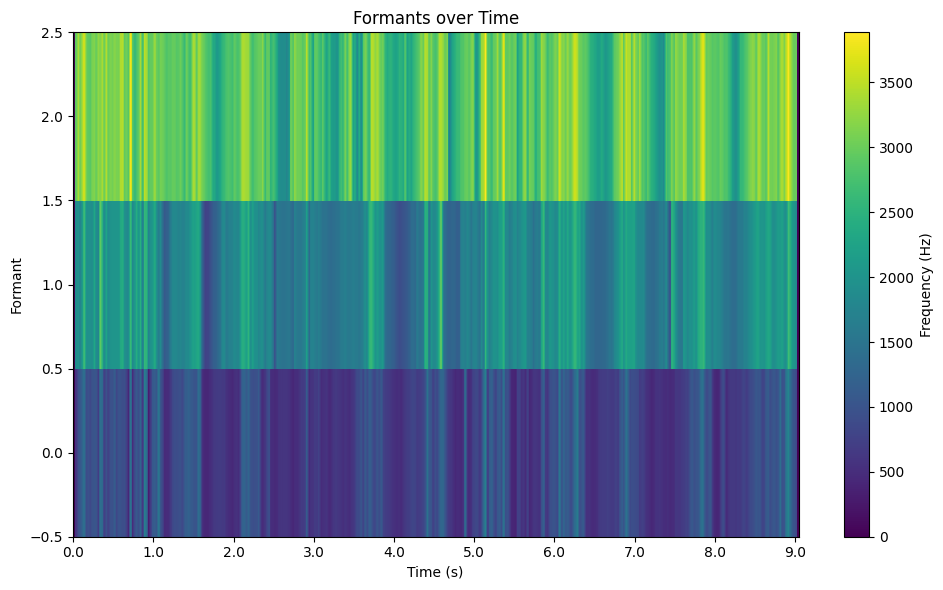

In [83]:
import numpy as np
import matplotlib.pyplot as plt
import parselmouth
from parselmouth.praat import call
import scipy.io.wavfile as wav
import librosa

# Load the audio file
audio_path = './speech/NS10-OF-NO1-BC.wav'
sr, y = wav.read(audio_path)

# If stereo, convert to mono
if y.ndim == 2:
    y = np.mean(y, axis=1)

# Resample to 16 kHz if necessary
target_sr = 16000
if sr != target_sr:
    y_resampled = librosa.resample(y, orig_sr=sr, target_sr=target_sr)
else:
    y_resampled = y

# Function to extract formants using Praat
def extract_formants(signal, sample_rate, frame_length=0.01, max_formant=5500):
    sound = parselmouth.Sound(signal, sampling_frequency=sample_rate)
    formant = call(sound, "To Formant (burg)", 0.025, 5.0, max_formant, 0.025, 50.0)
    num_frames = int(np.ceil(sound.duration / frame_length))
    formants = np.zeros((num_frames, 3))
    time_step = sound.duration / num_frames
    for i in range(num_frames):
        t = i * time_step
        for j in range(3):
            formants[i, j] = call(formant, "Get value at time", j + 1, t, 'Hertz', 'Linear')
    
    # Replace NaNs with 0
    formants = np.nan_to_num(formants, nan=0.0)
    
    return formants, time_step

# Extract formants from the resampled signal
formants, formant_time_step = extract_formants(y_resampled, target_sr)

# Convert frame time to seconds
frame_duration = 0.01  # 10 ms per frame
frame_times = np.arange(formants.shape[0]) * frame_duration

# Plot formants over time in seconds
plt.figure(figsize=(10, 6))
plt.imshow(formants.T, aspect='auto', origin='lower', cmap='viridis', interpolation='nearest')
plt.colorbar(label='Frequency (Hz)')
plt.xlabel('Time (s)')
plt.ylabel('Formant')
plt.title('Formants over Time')
plt.xticks(np.arange(0, formants.shape[0], 100), labels=np.round(np.arange(0, formants.shape[0], 100) * frame_duration, 2))
plt.tight_layout()
plt.show()

Frame 0: Time 0.00s, Formants [0. 0. 0.]
Frame 1: Time 0.01s, Formants [0. 0. 0.]
Frame 2: Time 0.02s, Formants [0. 0. 0.]
Frame 3: Time 0.03s, Formants [ 593.47744418 1890.55912228 2933.59827903]
Frame 4: Time 0.04s, Formants [ 634.18517918 1898.63881269 2983.15380554]
Frame 5: Time 0.05s, Formants [ 797.01611915 1930.95757431 3181.37591158]
Frame 6: Time 0.06s, Formants [ 959.84705912 1963.27633593 3379.59801762]
Frame 7: Time 0.07s, Formants [1012.4038099  1894.2811683  3301.97935567]
Frame 8: Time 0.08s, Formants [1028.2024976  1791.51469092 3132.41377106]
Frame 9: Time 0.09s, Formants [1065.04373328 1760.51939238 3047.30249477]
Frame 10: Time 0.10s, Formants [1165.01261289 1944.83763036 3215.55414345]
Frame 11: Time 0.11s, Formants [1264.98149251 2129.15586834 3383.80579212]
Frame 12: Time 0.12s, Formants [1339.39732945 2341.5079887  3496.70164028]
Frame 13: Time 0.13s, Formants [1405.29548549 2563.20473652 3591.14555493]
Frame 14: Time 0.14s, Formants [1393.87753991 2644.19494396

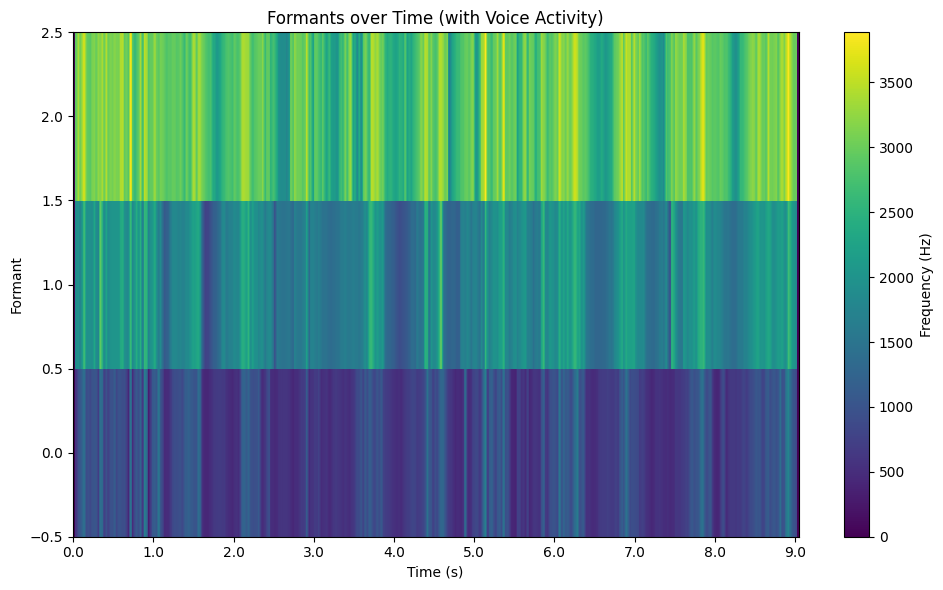

In [87]:
import numpy as np
import matplotlib.pyplot as plt
import parselmouth
from parselmouth.praat import call
import scipy.io.wavfile as wav
import librosa

# Load the audio file
audio_path = './speech/NS10-OF-NO1-BC.wav'
sr, y = wav.read(audio_path)

# If stereo, convert to mono
if y.ndim == 2:
    y = np.mean(y, axis=1)

# Resample to 16 kHz if necessary
target_sr = 16000
if sr != target_sr:
    y_resampled = librosa.resample(y, orig_sr=sr, target_sr=target_sr)
else:
    y_resampled = y

# Detect voice activity by amplitude threshold
frame_length = int(target_sr * 0.01)  # 10 ms per frame
frames = librosa.util.frame(y_resampled, frame_length=frame_length, hop_length=frame_length).T
amplitude_threshold = 0.02  # You may need to adjust this threshold
voice_activity = np.any(np.abs(frames) > amplitude_threshold, axis=1)

# Function to extract formants using Praat
def extract_formants(signal, sample_rate, frame_length=0.01, max_formant=5500):
    sound = parselmouth.Sound(signal, sampling_frequency=sample_rate)
    formant = call(sound, "To Formant (burg)", 0.025, 5.0, max_formant, 0.025, 50.0)
    num_frames = int(np.ceil(sound.duration / frame_length))
    formants = np.zeros((num_frames, 3))
    time_step = sound.duration / num_frames
    for i in range(num_frames):
        t = i * time_step
        for j in range(3):
            formants[i, j] = call(formant, "Get value at time", j + 1, t, 'Hertz', 'Linear')
    
    # Replace NaNs with 0
    formants = np.nan_to_num(formants, nan=0.0)
    
    return formants, time_step

# Extract formants from the resampled signal
formants, formant_time_step = extract_formants(y_resampled, target_sr)

# Convert frame time to seconds
frame_duration = 0.01  # 10 ms per frame
frame_times = np.arange(formants.shape[0]) * frame_duration

# Filter formants and times based on voice activity
filtered_formants = formants[voice_activity]
filtered_times = frame_times[voice_activity]

# Print array of formant values with time in seconds for frames with voice activity
for i, (time, values) in enumerate(zip(filtered_times, filtered_formants)):
    print(f"Frame {i}: Time {time:.2f}s, Formants {values}")

# Plot formants over time in seconds for frames with voice activity
plt.figure(figsize=(10, 6))
plt.imshow(filtered_formants.T, aspect='auto', origin='lower', cmap='viridis', interpolation='nearest')
plt.colorbar(label='Frequency (Hz)')
plt.xlabel('Time (s)')
plt.ylabel('Formant')
plt.title('Formants over Time (with Voice Activity)')
plt.xticks(np.arange(0, filtered_formants.shape[0], 100), labels=np.round(np.arange(0, filtered_formants.shape[0], 100) * frame_duration, 2))
plt.tight_layout()
plt.show()

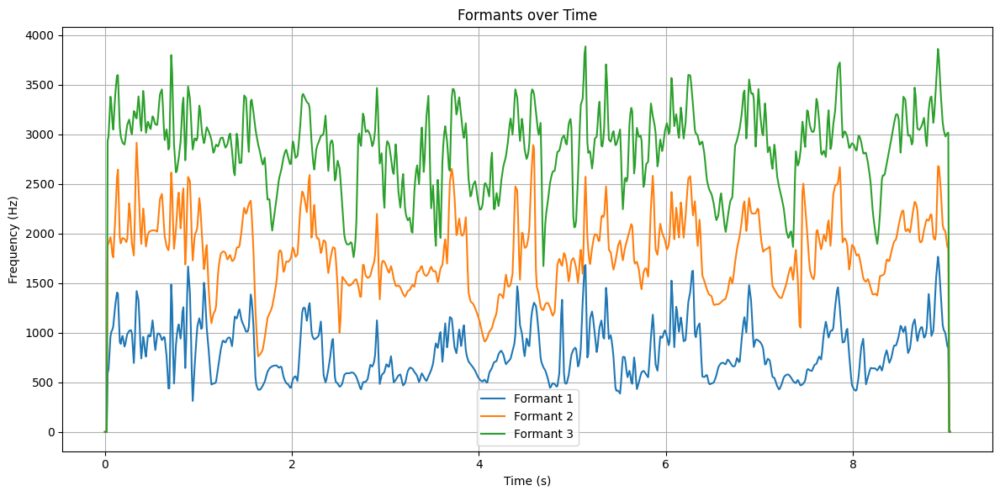

In [77]:
import numpy as np
import matplotlib.pyplot as plt
import parselmouth
from parselmouth.praat import call
import scipy.io.wavfile as wav
import librosa

# Load the audio file
audio_path = './speech/NS10-OF-NO1-BC.wav'
sr, y = wav.read(audio_path)

# If stereo, convert to mono
if y.ndim == 2:
    y = np.mean(y, axis=1)

# Resample to 16 kHz if necessary
target_sr = 16000
if sr != target_sr:
    y_resampled = librosa.resample(y, orig_sr=sr, target_sr=target_sr)
else:
    y_resampled = y

# Function to extract formants using Praat
def extract_formants(signal, sample_rate, frame_length=0.01, max_formant=5500):
    sound = parselmouth.Sound(signal, sampling_frequency=sample_rate)
    formant = call(sound, "To Formant (burg)", 0.025, 5.0, max_formant, 0.025, 50.0)
    num_frames = int(np.ceil(sound.duration / frame_length))
    formants = np.zeros((num_frames, 3))
    time_step = sound.duration / num_frames
    for i in range(num_frames):
        t = i * time_step
        for j in range(3):
            formants[i, j] = call(formant, "Get value at time", j + 1, t, 'Hertz', 'Linear')
    # Replace NaN values with 0
    formants = np.nan_to_num(formants, nan=0.0)
    return formants, time_step

# Extract formants from the resampled signal
formants, formant_time_step = extract_formants(y_resampled, target_sr)

# Create time points for formants
time_formants = np.arange(formants.shape[0]) * formant_time_step

# Plot formants
plt.figure(figsize=(12, 6))
for i in range(3):
    plt.plot(time_formants, formants[:, i], label=f'Formant {i+1}')

plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.title('Formants over Time')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Formant values (first 10 frames):
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]


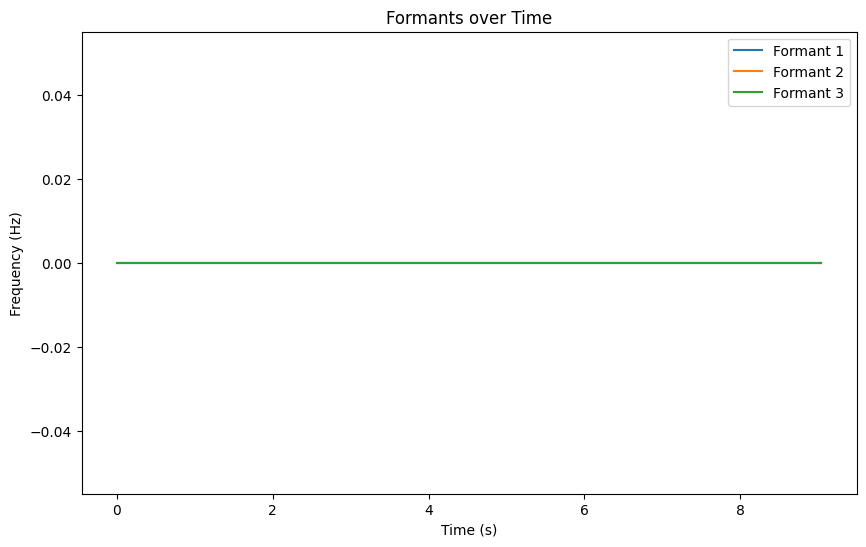

In [97]:
import numpy as np
import matplotlib.pyplot as plt
import parselmouth
from parselmouth.praat import call
import scipy.io.wavfile as wav
import librosa

# Load the audio file
audio_path = './speech/NS10-OF-NO1-BC.wav'
sr, y = wav.read(audio_path)

# If stereo, convert to mono
if y.ndim == 2:
    y = np.mean(y, axis=1)

# Resample to 16 kHz if necessary
target_sr = 16000
if sr != target_sr:
    y_resampled = librosa.resample(y, orig_sr=sr, target_sr=target_sr)
else:
    y_resampled = y

# Function to extract formants using Praat
def extract_formants(signal, sample_rate, max_formant=5500):
    sound = parselmouth.Sound(signal, sampling_frequency=sample_rate)
    formant = call(sound, "To Formant (burg)", 0.025, 5.0, max_formant, 0.025, 50.0)
    formant_values = []
    for i in range(1, 4):  # Extracting the first three formants
        value = call(formant, "Get value at time", i, 0.5, 'Hertz', 'Linear')
        formant_values.append(value)
    
    # Replace NaNs with 0
    formant_values = np.nan_to_num(formant_values, nan=0.0)
    
    return formant_values

# Split the signal into frames
frame_length = 0.01  # 10 ms
frame_size = int(target_sr * frame_length)
num_frames = int(np.ceil(len(y_resampled) / frame_size))

# Initialize an array to store formant values
formants = np.zeros((num_frames, 3))
frame_times = np.arange(num_frames) * frame_length

# Process each frame independently
for i in range(num_frames):
    start = i * frame_size
    end = min(start + frame_size, len(y_resampled))
    frame_signal = y_resampled[start:end]
    
    if len(frame_signal) < frame_size:
        # Zero-pad the last frame if it is shorter than the frame size
        frame_signal = np.pad(frame_signal, (0, frame_size - len(frame_signal)))
    
    # Extract formants for the current frame
    frame_formants = extract_formants(frame_signal, target_sr)
    
    # Store the first three formants
    formants[i, :] = frame_formants

# Check if formant extraction is working correctly
print("Formant values (first 10 frames):")
print(formants[:10])

# Plot formants over time in seconds for all frames
plt.figure(figsize=(10, 6))
for i in range(3):
    plt.plot(frame_times, formants[:, i], label=f'Formant {i+1}')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.title('Formants over Time')
plt.legend()
plt.show()


In [105]:
import numpy as np
import matplotlib.pyplot as plt
import parselmouth
from parselmouth.praat import call
import scipy.io.wavfile as wav
import librosa

# Load the audio file
audio_path = './speech/NS10-OF-NO1-BC.wav'
sr, y = wav.read(audio_path)

# If stereo, convert to mono
if y.ndim == 2:
    y = np.mean(y, axis=1)

# Resample to 16 kHz if necessary
target_sr = 16000
if sr != target_sr:
    y_resampled = librosa.resample(y, orig_sr=sr, target_sr=target_sr)
else:
    y_resampled = y

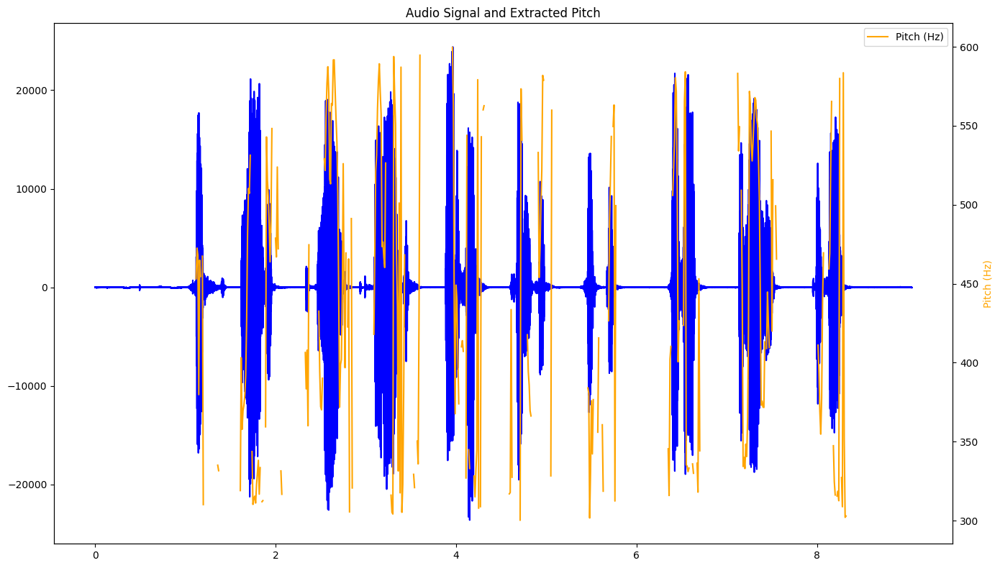

In [115]:
import numpy as np
import matplotlib.pyplot as plt
import parselmouth
from parselmouth.praat import call
import scipy.io.wavfile as wav
import librosa

# Load the audio file
audio_path = './speech/NS10-OF-NO1-BC.wav'
sr, y = wav.read(audio_path)

# If stereo, convert to mono
if y.ndim == 2:
    y = np.mean(y, axis=1)

# Resample to 16 kHz if necessary
target_sr = 16000
if sr != target_sr:
    y_resampled = librosa.resample(y, orig_sr=sr, target_sr=target_sr)
else:
    y_resampled = y

# Duration of each frame in seconds (10 ms)
frame_duration = 0.01  # 10 ms
frame_size = int(target_sr * frame_duration)
num_frames = int(np.ceil(len(y_resampled) / frame_size))

# Initialize an array to store pitch values
pitch_values = np.zeros(num_frames)
frame_times = np.arange(num_frames) * frame_duration

# Process each frame independently
for i in range(num_frames):
    start = i * frame_size
    end = min(start + frame_size, len(y_resampled))
    frame_signal = y_resampled[start:end]
    
    # Extract pitch (F0) for the current frame
    sound = parselmouth.Sound(frame_signal, sampling_frequency=target_sr)
    pitch = call(sound, "To Pitch", 0.0, 300, 600)
    pitch_value = call(pitch, "Get mean", 0, 0, "Hertz")
    pitch_values[i] = pitch_value

# Plot both audio signal and extracted pitch on the same figure
plt.figure(figsize=(14, 8))

# Plot the audio signal
plt.plot(np.arange(len(y_resampled)) / target_sr, y_resampled, label='Audio Signal', color='blue')

# Overlay the pitch values on the audio signal plot
plt.twinx()  # Create a secondary y-axis sharing the same x-axis
plt.plot(frame_times, pitch_values, label='Pitch (Hz)', color='orange')

# Set labels and titles
plt.xlabel('Time (s)')
plt.ylabel('Amplitude', color='blue')
plt.ylabel('Pitch (Hz)', color='orange')
plt.title('Audio Signal and Extracted Pitch')
plt.legend()

plt.tight_layout()
plt.show()

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_entropy.py:133: RuntimeWarning: divide by zero encountered in divide
  pk = 1.0*pk / np.sum(pk, axis=axis, keepdims=True)


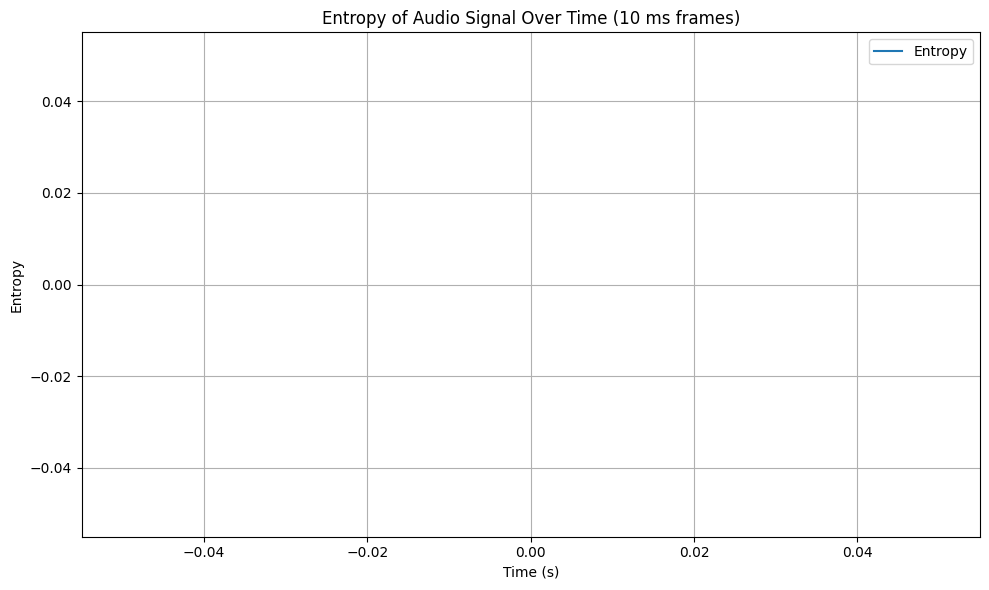

Average entropy of the audio signal: -inf


In [125]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wav
import librosa
from scipy.stats import entropy

# Load the audio file (replace with your actual file path)
audio_path = './speech/NS10-OF-NO1-BC.wav'
sr, y = wav.read(audio_path)

# If stereo, convert to mono
if y.ndim == 2:
    y = np.mean(y, axis=1)

# Resample to 16 kHz if necessary
target_sr = 16000
if sr != target_sr:
    y_resampled = librosa.resample(y, orig_sr=sr, target_sr=target_sr)
else:
    y_resampled = y

# Function to calculate entropy of a signal segment
def calculate_entropy(signal):
    # Normalize signal
    signal = (signal - np.mean(signal)) / np.std(signal)

    # Calculate entropy
    entropy_value = entropy(signal)

    return entropy_value

# Frame parameters
frame_duration = 0.01  # 10 ms
frame_size = int(frame_duration * target_sr)  # Number of samples per frame
overlap = int(frame_size * 0.5)  # 50% overlap

# Calculate entropy for each frame
num_frames = int(np.ceil(len(y_resampled) / frame_size))
entropies = np.zeros(num_frames)

for i in range(num_frames):
    start = i * (frame_size - overlap)
    end = start + frame_size
    frame_signal = y_resampled[start:end]
    entropies[i] = calculate_entropy(frame_signal)

# Print or plot entropy values over time
plt.figure(figsize=(10, 6))
frame_times = np.arange(num_frames) * (frame_size - overlap) / target_sr
plt.plot(frame_times, entropies, label='Entropy')
plt.xlabel('Time (s)')
plt.ylabel('Entropy')
plt.title('Entropy of Audio Signal Over Time (10 ms frames)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Optionally, print average entropy across all frames
average_entropy = np.mean(entropies)
print(f"Average entropy of the audio signal: {average_entropy:.4f}")

In [145]:
import librosa

# Load your audio file (replace 'your_audio.wav' with the actual file path)
audio_file = './speech/NS10-OF-NO1-BC.wav'
y, sr = librosa.load(audio_file, sr=16000, mono=True)

# Now 'y' contains the mono audio signal resampled to 16 kHz

In [156]:
import librosa
import parselmouth
import soundfile as sf

# Replace with your actual audio file path
audio_file = './speech/NS10-OF-NO1-BC.wav'

# Load the audio file
audio, sr = librosa.load(audio_file, sr=16000, mono=True)  # Load and resample to 16 kHz if needed

# Parameters for frame analysis
frame_length = int(0.01 * sr)  # Frame length in samples (10 ms)
hop_length = frame_length      # Hop length, same as frame length for non-overlapping frames

# Initialize an empty list to store formant data
formants = []

# Extract formants for each frame
for i in range(0, len(audio) - frame_length + 1, hop_length):
    frame = audio[i:i + frame_length]
    snd = parselmouth.Sound(frame, sampling_frequency=sr)
    formant = snd.to_formant_burg(max_number_of_formants=3)  # Extract up to 3 formants
    if formant:
        formants.append(formant)

# Process the formant data as needed
for idx, f in enumerate(formants):
    # Example: Print the first three formants' frequencies for each frame
    for j in range(1, 4):  # Formants are indexed starting from 1
        formant_freq = f.get_value_at_time(j, f.t1 + (idx * hop_length / sr))
        print(f"Frame {idx+1} - Formant {j}: {formant_freq:.2f} Hz")


Frame 1 - Formant 1: 2492.54 Hz
Frame 1 - Formant 2: 4086.57 Hz
Frame 1 - Formant 3: nan Hz
Frame 2 - Formant 1: nan Hz
Frame 2 - Formant 2: nan Hz
Frame 2 - Formant 3: nan Hz
Frame 3 - Formant 1: nan Hz
Frame 3 - Formant 2: nan Hz
Frame 3 - Formant 3: nan Hz
Frame 4 - Formant 1: nan Hz
Frame 4 - Formant 2: nan Hz
Frame 4 - Formant 3: nan Hz
Frame 5 - Formant 1: nan Hz
Frame 5 - Formant 2: nan Hz
Frame 5 - Formant 3: nan Hz
Frame 6 - Formant 1: nan Hz
Frame 6 - Formant 2: nan Hz
Frame 6 - Formant 3: nan Hz
Frame 7 - Formant 1: nan Hz
Frame 7 - Formant 2: nan Hz
Frame 7 - Formant 3: nan Hz
Frame 8 - Formant 1: nan Hz
Frame 8 - Formant 2: nan Hz
Frame 8 - Formant 3: nan Hz
Frame 9 - Formant 1: nan Hz
Frame 9 - Formant 2: nan Hz
Frame 9 - Formant 3: nan Hz
Frame 10 - Formant 1: nan Hz
Frame 10 - Formant 2: nan Hz
Frame 10 - Formant 3: nan Hz
Frame 11 - Formant 1: nan Hz
Frame 11 - Formant 2: nan Hz
Frame 11 - Formant 3: nan Hz
Frame 12 - Formant 1: nan Hz
Frame 12 - Formant 2: nan Hz
Fram

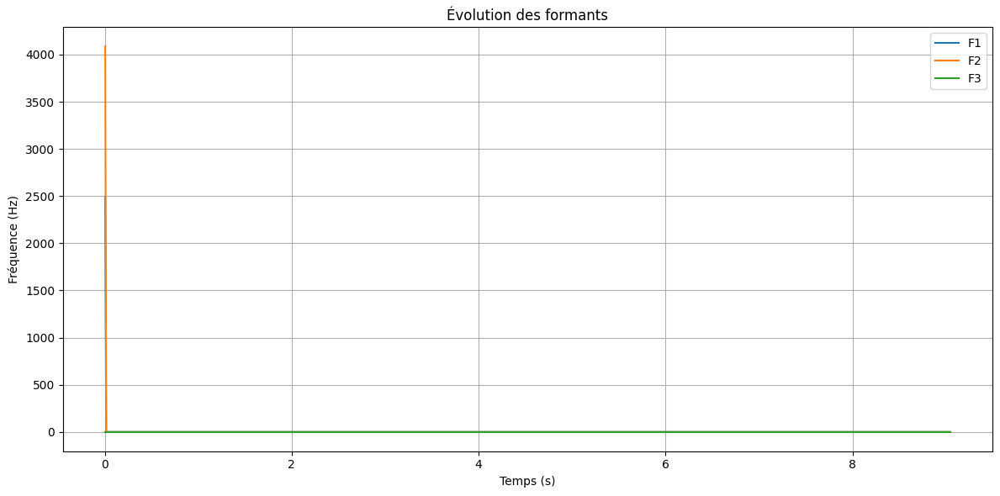

In [157]:
import librosa
import parselmouth
import matplotlib.pyplot as plt
import pandas as pd  # Importer pandas

# Remplacez par le chemin de votre fichier audio réel
audio_file = './speech/NS10-OF-NO1-BC.wav'

# Charger le fichier audio
audio, sr = librosa.load(audio_file, sr=16000, mono=True)  # Charger et rééchantillonner à 16 kHz si nécessaire

# Paramètres pour l'analyse par trame
frame_length = int(0.01 * sr)  # Longueur de la trame en échantillons (10 ms)
hop_length = frame_length      # Longueur du saut, identique à la longueur de la trame pour des trames non chevauchantes

# Initialiser une liste vide pour stocker les données de formant
formants = []

# Extraire les formants pour chaque trame
for i in range(0, len(audio) - frame_length + 1, hop_length):
    frame = audio[i:i + frame_length]
    snd = parselmouth.Sound(frame, sampling_frequency=sr)
    formant = snd.to_formant_burg(max_number_of_formants=3)  # Extraire jusqu'à 3 formants
    if formant:
        formants.append(formant)

# Préparer les données pour le tracé
formant_data = {
    'Time (s)': [],
    'F1 (Hz)': [],
    'F2 (Hz)': [],
    'F3 (Hz)': []
}

# Remplir les données de formant pour chaque trame
for idx, f in enumerate(formants):
    formant_data['Time (s)'].append(f.t1 + (idx * hop_length / sr))
    formant_data['F1 (Hz)'].append(f.get_value_at_time(1, f.t1 + (idx * hop_length / sr)))
    formant_data['F2 (Hz)'].append(f.get_value_at_time(2, f.t1 + (idx * hop_length / sr)))
    formant_data['F3 (Hz)'].append(f.get_value_at_time(3, f.t1 + (idx * hop_length / sr)))

# Convertir les données de formant en DataFrame pandas
formant_df = pd.DataFrame(formant_data)

# Remplacer NaN par 0 dans le DataFrame
formant_df.fillna(0, inplace=True)

# Tracer les formants au fil du temps
plt.figure(figsize=(12, 6))

plt.plot(formant_df['Time (s)'], formant_df['F1 (Hz)'], label='F1')
plt.plot(formant_df['Time (s)'], formant_df['F2 (Hz)'], label='F2')
plt.plot(formant_df['Time (s)'], formant_df['F3 (Hz)'], label='F3')

plt.title('Évolution des formants')
plt.xlabel('Temps (s)')
plt.ylabel('Fréquence (Hz)')
plt.legend()

plt.grid(True)
plt.tight_layout()

# Afficher le tracé
plt.show()


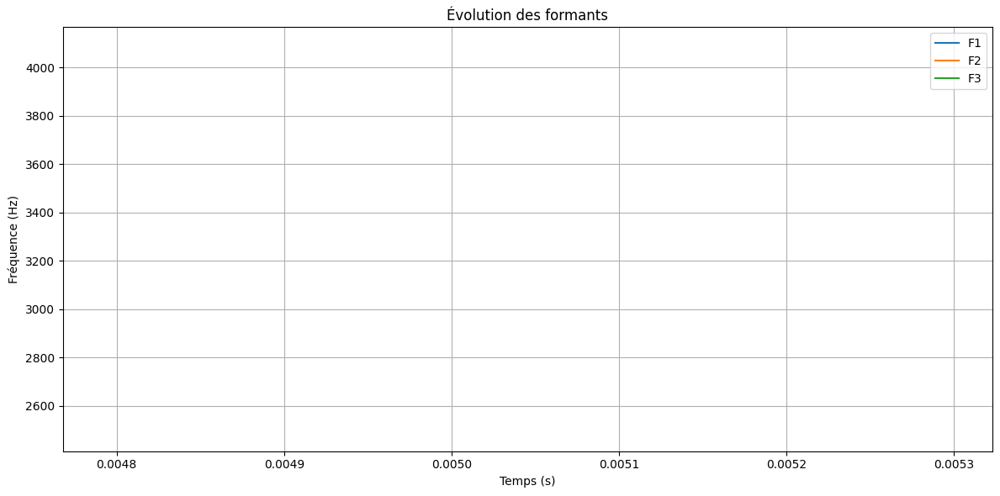

In [154]:
import librosa
import parselmouth
import matplotlib.pyplot as plt

# Remplacez par le chemin de votre fichier audio réel
audio_file = './speech/NS10-OF-NO1-BC.wav'

# Charger le fichier audio
audio, sr = librosa.load(audio_file, sr=16000, mono=True)  # Charger et rééchantillonner à 16 kHz si nécessaire

# Paramètres pour l'analyse par trame
frame_length = int(0.01 * sr)  # Longueur de la trame en échantillons (10 ms)
hop_length = frame_length      # Longueur du saut, identique à la longueur de la trame pour des trames non chevauchantes

# Initialiser une liste vide pour stocker les données de formant
formants = []

# Extraire les formants pour chaque trame
for i in range(0, len(audio) - frame_length + 1, hop_length):
    frame = audio[i:i + frame_length]
    snd = parselmouth.Sound(frame, sampling_frequency=sr)
    formant = snd.to_formant_burg(max_number_of_formants=3)  # Extraire jusqu'à 3 formants
    if formant:
        formants.append(formant)

# Préparer les données pour le tracé
formant_data = {
    'Time (s)': [],
    'F1 (Hz)': [],
    'F2 (Hz)': [],
    'F3 (Hz)': []
}

# Remplir les données de formant pour chaque trame
for idx, f in enumerate(formants):
    formant_data['Time (s)'].append(f.t1 + (idx * hop_length / sr))
    formant_data['F1 (Hz)'].append(f.get_value_at_time(1, f.t1 + (idx * hop_length / sr)))
    formant_data['F2 (Hz)'].append(f.get_value_at_time(2, f.t1 + (idx * hop_length / sr)))
    formant_data['F3 (Hz)'].append(f.get_value_at_time(3, f.t1 + (idx * hop_length / sr)))

# Convertir les données de formant en DataFrame pandas (facultatif)
# Ceci est utile si vous souhaitez analyser davantage les données de formant ou les sauvegarder
import pandas as pd
formant_df = pd.DataFrame(formant_data)

# Tracer les formants au fil du temps
plt.figure(figsize=(12, 6))

plt.plot(formant_data['Time (s)'], formant_data['F1 (Hz)'], label='F1')
plt.plot(formant_data['Time (s)'], formant_data['F2 (Hz)'], label='F2')
plt.plot(formant_data['Time (s)'], formant_data['F3 (Hz)'], label='F3')

plt.title('Évolution des formants')
plt.xlabel('Temps (s)')
plt.ylabel('Fréquence (Hz)')
plt.legend()

plt.grid(True)
plt.tight_layout()

# Afficher le tracé
plt.show()

Frame 0: Formants [0. 0. 0.]
Frame 1: Formants [0. 0. 0.]
Frame 2: Formants [0. 0. 0.]
Frame 3: Formants [ 593.47744418 1890.55912228 2933.59827903]
Frame 4: Formants [ 634.18517918 1898.63881269 2983.15380554]
Frame 5: Formants [ 797.01611915 1930.95757431 3181.37591158]
Frame 6: Formants [ 959.84705912 1963.27633593 3379.59801762]
Frame 7: Formants [1012.4038099  1894.2811683  3301.97935567]
Frame 8: Formants [1028.2024976  1791.51469092 3132.41377106]
Frame 9: Formants [1065.04373328 1760.51939238 3047.30249477]
Frame 10: Formants [1165.01261289 1944.83763036 3215.55414345]
Frame 11: Formants [1264.98149251 2129.15586834 3383.80579212]
Frame 12: Formants [1339.39732945 2341.5079887  3496.70164028]
Frame 13: Formants [1405.29548549 2563.20473652 3591.14555493]
Frame 14: Formants [1393.87753991 2644.19494396 3596.55369867]
Frame 15: Formants [1150.51128945 2303.06553029 3334.85452969]
Frame 16: Formants [ 907.14503899 1961.93611661 3073.1553607 ]
Frame 17: Formants [ 886.70658335 1900

ValueError: The number of FixedLocator locations (10), usually from a call to set_ticks, does not match the number of labels (905).

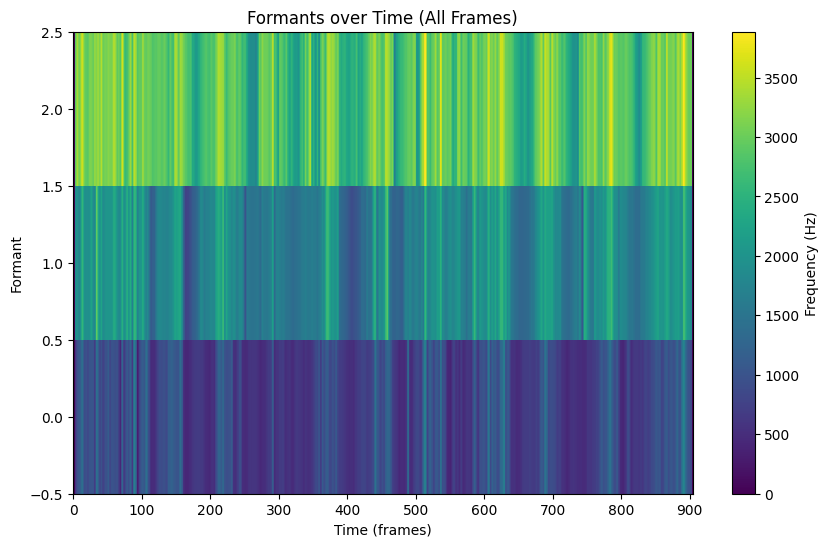

In [120]:
import numpy as np
import matplotlib.pyplot as plt
import parselmouth
from parselmouth.praat import call
import scipy.io.wavfile as wav
import librosa

# Load the audio file
audio_path = './speech/NS10-OF-NO1-BC.wav'
sr, y = wav.read(audio_path)

# If stereo, convert to mono
if y.ndim == 2:
    y = np.mean(y, axis=1)

# Resample to 16 kHz if necessary
target_sr = 16000
if sr != target_sr:
    y_resampled = librosa.resample(y, orig_sr=sr, target_sr=target_sr)
else:
    y_resampled = y.astype(np.float64)  # Ensure the correct data type for Sound creation

# Function to extract formants using Praat for all frames
def extract_formants_all(signal, sample_rate, frame_duration=0.01):
    sound = parselmouth.Sound(signal, sampling_frequency=sample_rate)
    formant = call(sound, "To Formant (burg)", 0.025, 5.0, 5500, 0.025, 50.0)
    num_frames = int(np.ceil(sound.duration / frame_duration))
    formants = np.zeros((num_frames, 3))  # Initialize array to store formants
    time_step = sound.duration / num_frames
    
    for i in range(num_frames):
        t = i * time_step
        for j in range(3):  # Extracting three formants
            formants[i, j] = call(formant, "Get value at time", j + 1, t, 'Hertz', 'Linear')
    
    # Replace NaNs with 0
    formants = np.nan_to_num(formants, nan=0.0)
    
    return formants, time_step

# Extract formants for all frames from the resampled signal
formants, frame_duration = extract_formants_all(y_resampled, target_sr)

# Print formant values (example)
for i, values in enumerate(formants):
    print(f"Frame {i}: Formants {values}")

# Plot formants over time (example)
plt.figure(figsize=(10, 6))
plt.imshow(formants.T, aspect='auto', origin='lower', cmap='viridis', interpolation='nearest')
plt.colorbar(label='Frequency (Hz)')
plt.xlabel('Time (frames)')
plt.ylabel('Formant')
plt.title('Formants over Time (All Frames)')
plt.xticks(np.arange(0, formants.shape[0], 100), labels=np.round(np.arange(0, formants.shape[0]) * frame_duration, 2))
plt.tight_layout()
plt.show()

In [37]:
import os
import pandas as pd
import numpy as np
import librosa
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from keras.preprocessing.sequence import pad_sequences

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to calculate RMS (Root Mean Square) per frame
def calculate_rms(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms, frame_length

# Function to extract energy
def extract_energy(signal, sample_rate, frame_length=0.01):
    energies, time_step = calculate_rms(signal, sample_rate, frame_length)
    return energies

# Function to process files as before
def process_files(csv_folder, audio_folder, target_sr=16000, frame_length=0.01):
    X = []
    y = []
    skipped_files_count = 0

    for csv_file in os.listdir(csv_folder):
        if csv_file.endswith('_fractal_df.csv'):
            csv_path = os.path.join(csv_folder, csv_file)
            df = pd.read_csv(csv_path, header=None)
            decisions = df.iloc[:, 1].values

            audio_file_base = csv_file.replace('_fractal_df.csv', '')
            audio_path = os.path.join(audio_folder, f"{audio_file_base}.wav")

            if not os.path.exists(audio_path):
                print(f"No audio file found for {csv_file}")
                skipped_files_count += 1
                continue

            # Process audio file
            signal, sr = process_audio_file(audio_path, target_sr=target_sr)
            
            if signal is None or sr is None:
                print(f"Error processing audio file: {audio_path}")
                skipped_files_count += 1
                continue
            
            # Extract energies
            energies = extract_energy(signal, sr, frame_length)
            
            # Pad energies if necessary
            if len(energies) % int(frame_length * sr) != 0:
                pad_length = int(frame_length * sr) - (len(energies) % int(frame_length * sr))
                energies = np.pad(energies, (0, pad_length), mode='constant', constant_values=0)

            # Append each frame's features and corresponding decision
            X.append(energies)
            y.append(decisions)

    print(f"Number of files skipped due to missing audio: {skipped_files_count}")

    # Determine the maximum sequence length for padding
    max_sequence_length = max(len(seq) for seq in X)

    # Pad sequences to max sequence length
    X = pad_sequences(X, maxlen=max_sequence_length, padding='post', dtype='float32')
    y = pad_sequences(y, maxlen=max_sequence_length, padding='post', dtype='int')

    return X, y, max_sequence_length



audio_dir = 'speech'
csv_dir = 'training_set'

X, y, max_sequence_length = process_files(csv_dir, audio_dir)

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the input data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train.reshape(-1, 1)).reshape(X_train.shape)
X_test_scaled = scaler.transform(X_test.reshape(-1, 1)).reshape(X_test.shape)

# Define the LSTM model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(max_sequence_length, 1)))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train_scaled, y_train, epochs=10, batch_size=32, validation_data=(X_test_scaled, y_test))

# Evaluate the model
loss, accuracy = model.evaluate(X_test_scaled, y_test)
print(f"Test accuracy: {accuracy}")


No audio file found for S147-OF-NO1-BC_fractal_df.csv
No audio file found for S147-OF-NO1-MC_fractal_df.csv
No audio file found for S147-OF-NO1-MF_fractal_df.csv
No audio file found for S147-OF-NO1-YM_fractal_df.csv
No audio file found for S148-OF-NO1-BC_fractal_df.csv
No audio file found for S148-OF-NO1-MC_fractal_df.csv
No audio file found for S148-OF-NO1-MF_fractal_df.csv
No audio file found for S148-OF-NO1-YM_fractal_df.csv
No audio file found for S149-OF-NO1-BC_fractal_df.csv
No audio file found for S149-OF-NO1-MC_fractal_df.csv
No audio file found for S149-OF-NO1-MF_fractal_df.csv
No audio file found for S149-OF-NO1-YM_fractal_df.csv
No audio file found for S150-OF-NO1-BC_fractal_df.csv
No audio file found for S150-OF-NO1-MC_fractal_df.csv
No audio file found for S150-OF-NO1-MF_fractal_df.csv
No audio file found for S150-OF-NO1-YM_fractal_df.csv
No audio file found for S151-OF-NO1-BC_fractal_df.csv
No audio file found for S151-OF-NO1-MC_fractal_df.csv
No audio file found for S151

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step - accuracy: 0.5231 - loss: 0.6911 - val_accuracy: 0.8837 - val_loss: 0.5846
Epoch 2/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 0.8827 - loss: 0.5441 - val_accuracy: 0.8492 - val_loss: 0.3898
Epoch 3/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 21s 1s/step - accuracy: 0.8469 - loss: 0.3886 - val_accuracy: 0.8762 - val_loss: 0.3444
Epoch 4/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 0.8786 - loss: 0.3362 - val_accuracy: 0.8849 - val_loss: 0.2976
Epoch 5/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 0.8886 - loss: 0.2931 - val_accuracy: 0.9000 - val_loss: 0.2676
Epoch 6/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 0.8984 - loss: 0.2700 - val_accuracy: 0.9043 - val_loss: 0.2530
Epoch 7/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 0.9025 - loss: 0.2542 - val_accuracy: 0.9088 - val_loss: 0.2300
Epoch 8/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 0.9079 - loss: 0.2391 - val_accuracy: 0.9094 - val_loss: 0.2223
Epo

In [38]:
import os
import pandas as pd
import numpy as np
import librosa
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from keras.preprocessing.sequence import pad_sequences

# Constants
TARGET_SR = 16000
FRAME_LENGTH = 0.01

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=TARGET_SR):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to calculate RMS (Root Mean Square) per frame
def calculate_rms(signal, sample_rate, frame_length=FRAME_LENGTH):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms, frame_length

# Function to extract energy
def extract_energy(signal, sample_rate, frame_length=FRAME_LENGTH):
    energies, time_step = calculate_rms(signal, sample_rate, frame_length)
    return energies

# Function to process files and extract features
def process_files(csv_folder, audio_folder, target_sr=TARGET_SR, frame_length=FRAME_LENGTH):
    X = []
    y = []
    skipped_files_count = 0

    for csv_file in os.listdir(csv_folder):
        if csv_file.endswith('_fractal_df.csv'):
            csv_path = os.path.join(csv_folder, csv_file)
            df = pd.read_csv(csv_path, header=None)
            decisions = df.iloc[:, 1].values

            audio_file_base = csv_file.replace('_fractal_df.csv', '')
            audio_path = os.path.join(audio_folder, f"{audio_file_base}.wav")

            if not os.path.exists(audio_path):
                print(f"No audio file found for {csv_file}")
                skipped_files_count += 1
                continue

            # Process audio file
            signal, sr = process_audio_file(audio_path, target_sr=target_sr)
            if signal is None or sr is None:
                skipped_files_count += 1
                continue

            # Extract energies
            energies = extract_energy(signal, sr, frame_length)

            # Pad energies if necessary
            if len(energies) % int(frame_length * sr) != 0:
                pad_length = int(frame_length * sr) - (len(energies) % int(frame_length * sr))
                energies = np.pad(energies, (0, pad_length), mode='constant', constant_values=0)

            # Append each frame's features and corresponding decision
            X.append(energies)
            y.append(decisions)

    print(f"Number of files skipped due to missing audio: {skipped_files_count}")

    # Determine the maximum sequence length for padding
    max_sequence_length = max(len(seq) for seq in X)

    # Pad sequences to max sequence length
    X = pad_sequences(X, maxlen=max_sequence_length, padding='post', dtype='float32')
    y = pad_sequences(y, maxlen=max_sequence_length, padding='post', dtype='int')

    return X, y, max_sequence_length

# Main script
if __name__ == "__main__":
    audio_dir = 'speech'
    csv_dir = 'training_set'

    X, y, max_sequence_length = process_files(csv_dir, audio_dir)

    # Splitting the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Scale the input data
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train.reshape(-1, 1)).reshape(X_train.shape)
    X_test_scaled = scaler.transform(X_test.reshape(-1, 1)).reshape(X_test.shape)

    # Define the LSTM model
    model = Sequential()
    model.add(LSTM(units=150, return_sequences=True, input_shape=(max_sequence_length, 1)))
    model.add(Dropout(0.3))
    model.add(LSTM(units=100, return_sequences=True))
    model.add(Dense(1, activation='sigmoid'))

    # Compile the model
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Train the model
    model.fit(X_train_scaled, y_train, epochs=10, batch_size=32, validation_data=(X_test_scaled, y_test))

    # Evaluate the model
    loss, accuracy = model.evaluate(X_test_scaled, y_test)
    print(f"Test accuracy: {accuracy}")

No audio file found for S147-OF-NO1-BC_fractal_df.csv
No audio file found for S147-OF-NO1-MC_fractal_df.csv
No audio file found for S147-OF-NO1-MF_fractal_df.csv
No audio file found for S147-OF-NO1-YM_fractal_df.csv
No audio file found for S148-OF-NO1-BC_fractal_df.csv
No audio file found for S148-OF-NO1-MC_fractal_df.csv
No audio file found for S148-OF-NO1-MF_fractal_df.csv
No audio file found for S148-OF-NO1-YM_fractal_df.csv
No audio file found for S149-OF-NO1-BC_fractal_df.csv
No audio file found for S149-OF-NO1-MC_fractal_df.csv
No audio file found for S149-OF-NO1-MF_fractal_df.csv
No audio file found for S149-OF-NO1-YM_fractal_df.csv
No audio file found for S150-OF-NO1-BC_fractal_df.csv
No audio file found for S150-OF-NO1-MC_fractal_df.csv
No audio file found for S150-OF-NO1-MF_fractal_df.csv
No audio file found for S150-OF-NO1-YM_fractal_df.csv
No audio file found for S151-OF-NO1-BC_fractal_df.csv
No audio file found for S151-OF-NO1-MC_fractal_df.csv
No audio file found for S151

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 394s 29s/step - accuracy: 0.7334 - loss: 0.5604 - val_accuracy: 0.8800 - val_loss: 0.3131
Epoch 2/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 379s 29s/step - accuracy: 0.8876 - loss: 0.3055 - val_accuracy: 0.8992 - val_loss: 0.2729
Epoch 3/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 366s 28s/step - accuracy: 0.8990 - loss: 0.2681 - val_accuracy: 0.9097 - val_loss: 0.2331
Epoch 4/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 436s 34s/step - accuracy: 0.9123 - loss: 0.2344 - val_accuracy: 0.9213 - val_loss: 0.2037
Epoch 5/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 319s 24s/step - accuracy: 0.9193 - loss: 0.2161 - val_accuracy: 0.9278 - val_loss: 0.2175
Epoch 6/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 308s 24s/step - accuracy: 0.9231 - loss: 0.2265 - val_accuracy: 0.9272 - val_loss: 0.1933
Epoch 7/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 261s 19s/step - accuracy: 0.9274 - loss: 0.1973 - val_accuracy: 0.9291 - val_loss: 0.1814
Epoch 8/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 116s 9s/step - accuracy: 0.9281 - loss: 0.1991 - val_accuracy: 0.9

In [39]:
model.save('energies.h5')

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


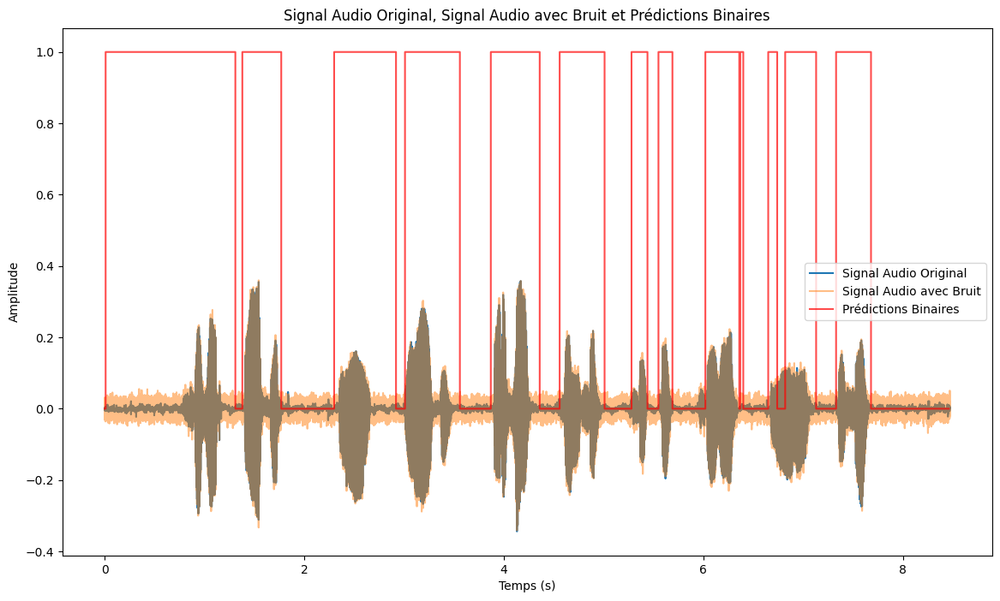

In [26]:
import os
import numpy as np
import librosa
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing.sequence import pad_sequences

# Charger le modèle entraîné
model = load_model('energy_mfcc_zcr.h5')

# Constants
TARGET_SR = 16000
FRAME_LENGTH = 0.01  # 10 ms

# Fonction pour charger et prétraiter l'audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Erreur lors du traitement du fichier audio {audio_path}: {e}")
        return None, None

# Fonction pour ajouter du bruit au signal audio
def add_noise(signal, noise, snr):
    signal_power = np.mean(signal ** 2)
    noise_power = np.mean(noise ** 2)
    noise_variance = signal_power / (10 ** (snr / 10))
    scaled_noise = np.sqrt(noise_variance / noise_power) * noise
    noisy_signal = signal + scaled_noise
    return noisy_signal

# Fonction pour extraire les fonctionnalités (energy, MFCC, ZCR)
def extract_features(signal, sample_rate, frame_length=0.01, n_mfcc=13):
    hop_length = int(sample_rate * frame_length)
    energies, _ = calculate_rms(signal, sample_rate, frame_length)
    mfccs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=n_mfcc, hop_length=hop_length).T
    zcrs = librosa.feature.zero_crossing_rate(y=signal, frame_length=hop_length, hop_length=hop_length).T
    min_length = min(len(energies), len(mfccs), len(zcrs))
    energies = energies[:min_length]
    mfccs = mfccs[:min_length]
    zcrs = zcrs[:min_length]
    features = np.hstack((energies.reshape(-1, 1), mfccs, zcrs))
    return features

# Fonction pour calculer RMS par frame
def calculate_rms(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms, frame_length

# Charger et prétraiter un fichier audio
audio_path = './Test/S147-OF-NO1-MC.wav'
signal, sr = process_audio_file(audio_path)

if signal is not None:
    # Générer du bruit
    noise = np.random.randn(len(signal))
    
    # Ajouter du bruit au signal avec un rapport signal-bruit (SNR) spécifié
    snr = 10  # par exemple, 10 dB
    signal_noisy = add_noise(signal, noise, snr)
    
    # Extraire les fonctionnalités
    features = extract_features(signal_noisy, sr, frame_length=FRAME_LENGTH)
    features_padded = pad_sequences([features], dtype='float32', padding='post')
    
    # Générer des prédictions
    predictions = model.predict(features_padded)[0]
    
    # Convertir les prédictions en valeurs binaires
    threshold = 0.5
    binary_predictions = (predictions >= threshold).astype(int)
    
    # Tracer les prédictions binaires sur le signal audio
    plt.figure(figsize=(14, 8))
    time = np.arange(0, len(signal)) / sr
    plt.plot(time, signal, label='Signal Audio Original')
    plt.plot(time, signal_noisy, label='Signal Audio avec Bruit', alpha=0.5)
    
    frame_time = np.arange(0, len(binary_predictions)) * FRAME_LENGTH
    plt.step(frame_time, binary_predictions, label='Prédictions Binaires', color='red', alpha=0.7, where='post')
    
    plt.xlabel('Temps (s)')
    plt.ylabel('Amplitude')
    plt.title('Signal Audio Original, Signal Audio avec Bruit et Prédictions Binaires')
    plt.legend()
    plt.show()
else:
    print("Erreur lors du chargement et du prétraitement du fichier audio.")


In [35]:
import os
import pandas as pd
import numpy as np
import librosa
from keras.models import load_model
from keras.preprocessing.sequence import pad_sequences

# Constants
TARGET_SR = 16000
FRAME_LENGTH = 0.01  # 10 ms

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to calculate RMS (Root Mean Square) per frame
def calculate_rms(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms, frame_length

# Function to extract energy
def extract_energy(signal, sample_rate, frame_length=0.01):
    energies, time_step = calculate_rms(signal, sample_rate, frame_length)
    return energies, time_step

# Function to extract MFCC features
def extract_mfcc(signal, sample_rate, frame_length=0.01, n_mfcc=13):
    hop_length = int(sample_rate * frame_length)
    mfccs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=n_mfcc, hop_length=hop_length)
    return mfccs.T, frame_length

# Function to extract ZCR (Zero-Crossing Rate)
def extract_zcr(signal, sample_rate, frame_length=0.01):
    hop_length = int(sample_rate * frame_length)
    zcr = librosa.feature.zero_crossing_rate(y=signal, frame_length=hop_length, hop_length=hop_length)
    return zcr.T, frame_length

# Function to add noise to the audio signal
def add_noise(signal, noise, snr):
    signal_power = np.mean(signal ** 2)
    noise_power = np.mean(noise ** 2)
    noise_variance = signal_power / (10 ** (snr / 10))
    scaled_noise = np.sqrt(noise_variance / noise_power) * noise
    noisy_signal = signal + scaled_noise
    return noisy_signal

# Function to process files and extract features
def process_files(csv_folder, audio_folder, noise_paths, snr_levels, target_sr=TARGET_SR, frame_length=FRAME_LENGTH):
    X = []
    y = []
    skipped_files_count = 0

    for csv_file in os.listdir(csv_folder):
        if csv_file.endswith('_fractal_df.csv'):
            csv_path = os.path.join(csv_folder, csv_file)
            df = pd.read_csv(csv_path, header=None)
            decisions = df.iloc[:, 1].values

            audio_file_base = csv_file.replace('_fractal_df.csv', '')
            audio_path = os.path.join(audio_folder, f"{audio_file_base}.wav")

            if not os.path.exists(audio_path):
                print(f"No audio file found for {csv_file}")
                skipped_files_count += 1
                continue

            # Process audio file
            signal, sr = process_audio_file(audio_path, target_sr=target_sr)
            if signal is None or sr is None:
                skipped_files_count += 1
                continue

            for noise_path in noise_paths:
                noise, _ = librosa.load(noise_path, sr=target_sr)
                if len(noise) < len(signal):
                    repeats = int(np.ceil(len(signal) / len(noise)))
                    noise = np.tile(noise, repeats)[:len(signal)]
                elif len(noise) > len(signal):
                    noise = noise[:len(signal)]

                for snr in snr_levels:
                    noisy_signal = add_noise(signal, noise, snr)

                    # Extract features
                    energies, _ = extract_energy(noisy_signal, sr, frame_length)
                    mfccs, _ = extract_mfcc(noisy_signal, sr, frame_length)
                    zcrs, _ = extract_zcr(noisy_signal, sr, frame_length)

                    # Ensure all features have the same length
                    min_length = min(len(energies), len(mfccs), len(zcrs))
                    energies = energies[:min_length]
                    mfccs = mfccs[:min_length]
                    zcrs = zcrs[:min_length]

                    # Concatenate features
                    features = np.hstack((energies.reshape(-1, 1), mfccs, zcrs))

                    X.append(features)
                    y.append(decisions[:len(features)])

    X = pad_sequences(X, dtype='float32', padding='post')
    y = pad_sequences(y, dtype='int', padding='post')
    return np.array(X), np.array(y)

# Define paths and parameters
csv_folder = './training_set'  # Replace with your CSV folder path
audio_folder = './Test'  # Replace with your audio folder path
noise_paths = ['./Bruits/AirConditioner.wav', './Bruits/pink.wav']  # Replace with your noise paths
snr_levels = [-10, -5, 0, 5, 10]  # SNR levels to test

# Load your trained model
model = load_model('energy_mfcc_zcr.h5')  # Replace with your model path

# Process files and extract features for testing
X_test, y_test = process_files(csv_folder, audio_folder, noise_paths, snr_levels)

# Evaluate the model on test data
accuracy = model.evaluate(X_test, y_test)

print(f"Global test accuracy: {accuracy}")

No audio file found for NS10-OF-NO1-BC_fractal_df.csv
No audio file found for NS10-OF-NO1-MC_fractal_df.csv
No audio file found for NS10-OF-NO1-MF_fractal_df.csv
No audio file found for NS10-OF-NO1-YM_fractal_df.csv
No audio file found for NS14-OF-NO1-MC_fractal_df.csv
No audio file found for NS14-OF-NO1-MF_fractal_df.csv
No audio file found for NS14-OF-NO1-YM_fractal_df.csv
No audio file found for NS15-OF-NO1-MC_fractal_df.csv
No audio file found for NS15-OF-NO1-MF_fractal_df.csv
No audio file found for NS15-OF-NO1-YM_fractal_df.csv
No audio file found for NS151-OF-NO1-BC_fractal_df.csv
No audio file found for NS151-OF-NO1-MC_fractal_df.csv
No audio file found for NS151-OF-NO1-MF_fractal_df.csv
No audio file found for NS151-OF-NO1-YM_fractal_df.csv
No audio file found for NS153-OF-NO1-MC_fractal_df.csv
No audio file found for NS153-OF-NO1-MF_fractal_df.csv
No audio file found for NS153-OF-NO1-YM_fractal_df.csv
No audio file found for NS155-OF-NO1-MC_fractal_df.csv
No audio file found 

In [42]:
import os
import pandas as pd
import numpy as np
import librosa
from keras.models import load_model
from keras.preprocessing.sequence import pad_sequences

# Constants
TARGET_SR = 16000
FRAME_LENGTH = 0.01  # 10 ms

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to calculate RMS (Root Mean Square) per frame
def calculate_rms(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms, frame_length

# Function to extract energy
def extract_energy(signal, sample_rate, frame_length=0.01):
    energies, time_step = calculate_rms(signal, sample_rate, frame_length)
    return energies, time_step

# Function to extract MFCC features
def extract_mfcc(signal, sample_rate, frame_length=0.01, n_mfcc=13):
    hop_length = int(sample_rate * frame_length)
    mfccs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=n_mfcc, hop_length=hop_length)
    return mfccs.T, frame_length

# Function to extract ZCR (Zero-Crossing Rate)
def extract_zcr(signal, sample_rate, frame_length=0.01):
    hop_length = int(sample_rate * frame_length)
    zcr = librosa.feature.zero_crossing_rate(y=signal, frame_length=hop_length, hop_length=hop_length)
    return zcr.T, frame_length

# Function to add noise to the audio signal
def add_noise(signal, noise, snr):
    signal_power = np.mean(signal ** 2)
    noise_power = np.mean(noise ** 2)
    noise_variance = signal_power / (10 ** (snr / 10))
    scaled_noise = np.sqrt(noise_variance / noise_power) * noise
    noisy_signal = signal + scaled_noise
    return noisy_signal

# Function to process files and extract features
def process_files(csv_folder, audio_folder, noise_paths, snr_levels, target_sr=TARGET_SR, frame_length=FRAME_LENGTH):
    X = []
    y = []
    skipped_files_count = 0
    total_files_processed = 0

    for csv_file in os.listdir(csv_folder):
        if csv_file.endswith('_fractal_df.csv'):
            csv_path = os.path.join(csv_folder, csv_file)
            df = pd.read_csv(csv_path, header=None)
            decisions = df.iloc[:, 1].values

            audio_file_base = csv_file.replace('_fractal_df.csv', '')
            audio_path = os.path.join(audio_folder, f"{audio_file_base}.wav")

            if not os.path.exists(audio_path):
                print(f"No audio file found for {csv_file}")
                skipped_files_count += 1
                continue

            # Process audio file
            signal, sr = process_audio_file(audio_path, target_sr=target_sr)
            if signal is None or sr is None:
                skipped_files_count += 1
                continue

            for noise_path in noise_paths:
                noise, _ = librosa.load(noise_path, sr=target_sr)
                if len(noise) < len(signal):
                    repeats = int(np.ceil(len(signal) / len(noise)))
                    noise = np.tile(noise, repeats)[:len(signal)]
                elif len(noise) > len(signal):
                    noise = noise[:len(signal)]

                for snr in snr_levels:
                    noisy_signal = add_noise(signal, noise, snr)

                    # Extract features
                    energies, _ = extract_energy(noisy_signal, sr, frame_length)
                    mfccs, _ = extract_mfcc(noisy_signal, sr, frame_length)
                    zcrs, _ = extract_zcr(noisy_signal, sr, frame_length)

                    # Ensure all features have the same length
                    min_length = min(len(energies), len(mfccs), len(zcrs))
                    energies = energies[:min_length]
                    mfccs = mfccs[:min_length]
                    zcrs = zcrs[:min_length]

                    # Concatenate features
                    features = np.hstack((energies.reshape(-1, 1), mfccs, zcrs))

                    X.append(features)
                    y.append(decisions[:len(features)])
                    total_files_processed += 1

    X = pad_sequences(X, dtype='float32', padding='post')
    y = pad_sequences(y, dtype='int', padding='post')
    return np.array(X), np.array(y), total_files_processed

# Define paths and parameters
csv_folder = './training_set'  # Replace with your CSV folder path
audio_folder = './Test'  # Replace with your audio folder path
noise_paths = ['./bruits/airConditioner.wav', './bruits/pink.wav']  # Replace with your noise paths
snr_levels = [-10, -5, 0, 5, 10]  # SNR levels to test

# Load your trained model
model = load_model('energy_mfcc_zcr.h5')  # Replace with your model path

# Process files and extract features for testing
X_test, y_test, num_files_processed = process_files(csv_folder, audio_folder, noise_paths, snr_levels)

# Evaluate the model on test data
accuracy = model.evaluate(X_test, y_test)

print(f"Global test accuracy: {accuracy}")
print(f"Total number of files processed: {num_files_processed}")

No audio file found for NS10-OF-NO1-BC_fractal_df.csv
No audio file found for NS10-OF-NO1-MC_fractal_df.csv
No audio file found for NS10-OF-NO1-MF_fractal_df.csv
No audio file found for NS10-OF-NO1-YM_fractal_df.csv
No audio file found for NS14-OF-NO1-MC_fractal_df.csv
No audio file found for NS14-OF-NO1-MF_fractal_df.csv
No audio file found for NS14-OF-NO1-YM_fractal_df.csv
No audio file found for NS15-OF-NO1-MC_fractal_df.csv
No audio file found for NS15-OF-NO1-MF_fractal_df.csv
No audio file found for NS15-OF-NO1-YM_fractal_df.csv
No audio file found for NS151-OF-NO1-BC_fractal_df.csv
No audio file found for NS151-OF-NO1-MC_fractal_df.csv
No audio file found for NS151-OF-NO1-MF_fractal_df.csv
No audio file found for NS151-OF-NO1-YM_fractal_df.csv
No audio file found for NS153-OF-NO1-MC_fractal_df.csv
No audio file found for NS153-OF-NO1-MF_fractal_df.csv
No audio file found for NS153-OF-NO1-YM_fractal_df.csv
No audio file found for NS155-OF-NO1-MC_fractal_df.csv
No audio file found 

In [1]:
import os
import pandas as pd
import numpy as np
import librosa
from keras.models import load_model
from keras.preprocessing.sequence import pad_sequences

# Constants
TARGET_SR = 16000
FRAME_LENGTH = 0.01  # 10 ms

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to calculate RMS (Root Mean Square) per frame
def calculate_rms(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms, frame_length

# Function to extract energy
def extract_energy(signal, sample_rate, frame_length=0.01):
    energies, time_step = calculate_rms(signal, sample_rate, frame_length)
    return energies, time_step

# Function to extract MFCC features
def extract_mfcc(signal, sample_rate, frame_length=0.01, n_mfcc=13):
    hop_length = int(sample_rate * frame_length)
    mfccs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=n_mfcc, hop_length=hop_length)
    return mfccs.T, frame_length

# Function to extract ZCR (Zero-Crossing Rate)
def extract_zcr(signal, sample_rate, frame_length=0.01):
    hop_length = int(sample_rate * frame_length)
    zcr = librosa.feature.zero_crossing_rate(y=signal, frame_length=hop_length, hop_length=hop_length)
    return zcr.T, frame_length

# Function to add noise to the audio signal
def add_noise(signal, noise, snr):
    signal_power = np.mean(signal ** 2)
    noise_power = np.mean(noise ** 2)
    noise_variance = signal_power / (10 ** (snr / 10))
    scaled_noise = np.sqrt(noise_variance / noise_power) * noise
    noisy_signal = signal + scaled_noise
    return noisy_signal

# Function to process files and extract features
def process_files(csv_folder, audio_folder, noise_paths, snr_levels, target_sr=TARGET_SR, frame_length=FRAME_LENGTH):
    results = {}

    for noise_path in noise_paths:
        noise_name = os.path.basename(noise_path)
        results[noise_name] = {}

        for snr in snr_levels:
            X = []
            y = []
            skipped_files_count = 0
            total_files_processed = 0

            for csv_file in os.listdir(csv_folder):
                if csv_file.endswith('_fractal_df.csv'):
                    csv_path = os.path.join(csv_folder, csv_file)
                    df = pd.read_csv(csv_path, header=None)
                    decisions = df.iloc[:, 1].values

                    audio_file_base = csv_file.replace('_fractal_df.csv', '')
                    audio_path = os.path.join(audio_folder, f"{audio_file_base}.wav")

                    if not os.path.exists(audio_path):
                        print(f"No audio file found for {csv_file}")
                        skipped_files_count += 1
                        continue

                    # Process audio file
                    signal, sr = process_audio_file(audio_path, target_sr=target_sr)
                    if signal is None or sr is None:
                        skipped_files_count += 1
                        continue

                    noise, _ = librosa.load(noise_path, sr=target_sr)
                    if len(noise) < len(signal):
                        repeats = int(np.ceil(len(signal) / len(noise)))
                        noise = np.tile(noise, repeats)[:len(signal)]
                    elif len(noise) > len(signal):
                        noise = noise[:len(signal)]

                    noisy_signal = add_noise(signal, noise, snr)

                    # Extract features
                    energies, _ = extract_energy(noisy_signal, sr, frame_length)
                    mfccs, _ = extract_mfcc(noisy_signal, sr, frame_length)
                    zcrs, _ = extract_zcr(noisy_signal, sr, frame_length)

                    # Ensure all features have the same length
                    min_length = min(len(energies), len(mfccs), len(zcrs))
                    energies = energies[:min_length]
                    mfccs = mfccs[:min_length]
                    zcrs = zcrs[:min_length]

                    # Concatenate features
                    features = np.hstack((energies.reshape(-1, 1), mfccs, zcrs))

                    X.append(features)
                    y.append(decisions[:len(features)])
                    total_files_processed += 1

            X = pad_sequences(X, dtype='float32', padding='post')
            y = pad_sequences(y, dtype='int', padding='post')

            results[noise_name][snr] = (np.array(X), np.array(y), total_files_processed)
    
    return results

# Define paths and parameters
csv_folder = './training_set'  # Replace with your CSV folder path
audio_folder = './Test'  # Replace with your audio folder path
noise_paths = ['./bruits/airConditioner.wav', './bruits/pink.wav']  # Replace with your noise paths
snr_levels = [-10, -5, 0, 5, 10]  # SNR levels to test

# Load your trained model
model = load_model('energy_mfcc_zcr.h5')  # Replace with your model path

# Process files and extract features for testing
results = process_files(csv_folder, audio_folder, noise_paths, snr_levels)

# Evaluate the model on test data for each noise type and SNR level
for noise_name, snr_data in results.items():
    for snr, (X_test, y_test, num_files_processed) in snr_data.items():
        accuracy = model.evaluate(X_test, y_test, verbose=1)[1]  # Get accuracy from the evaluation result
        print(f"Noise: {noise_name}, SNR: {snr} dB, Accuracy: {accuracy}, Total files processed: {num_files_processed}")

No audio file found for NS10-OF-NO1-BC_fractal_df.csv
No audio file found for NS10-OF-NO1-MC_fractal_df.csv
No audio file found for NS10-OF-NO1-MF_fractal_df.csv
No audio file found for NS10-OF-NO1-YM_fractal_df.csv
No audio file found for NS14-OF-NO1-MC_fractal_df.csv
No audio file found for NS14-OF-NO1-MF_fractal_df.csv
No audio file found for NS14-OF-NO1-YM_fractal_df.csv
No audio file found for NS15-OF-NO1-MC_fractal_df.csv
No audio file found for NS15-OF-NO1-MF_fractal_df.csv
No audio file found for NS15-OF-NO1-YM_fractal_df.csv
No audio file found for NS151-OF-NO1-BC_fractal_df.csv
No audio file found for NS151-OF-NO1-MC_fractal_df.csv
No audio file found for NS151-OF-NO1-MF_fractal_df.csv
No audio file found for NS151-OF-NO1-YM_fractal_df.csv
No audio file found for NS153-OF-NO1-MC_fractal_df.csv
No audio file found for NS153-OF-NO1-MF_fractal_df.csv
No audio file found for NS153-OF-NO1-YM_fractal_df.csv
No audio file found for NS155-OF-NO1-MC_fractal_df.csv
No audio file found 

In [3]:
import os
import pandas as pd
import numpy as np
import librosa
from keras.models import load_model
from keras.preprocessing.sequence import pad_sequences

# Constants
TARGET_SR = 16000
FRAME_LENGTH = 0.01  # 10 ms

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to calculate RMS (Root Mean Square) per frame
def calculate_rms(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms, frame_length

# Function to extract energy
def extract_energy(signal, sample_rate, frame_length=0.01):
    energies, time_step = calculate_rms(signal, sample_rate, frame_length)
    return energies, time_step

# Function to extract MFCC features
def extract_mfcc(signal, sample_rate, frame_length=0.01, n_mfcc=13):
    hop_length = int(sample_rate * frame_length)
    mfccs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=n_mfcc, hop_length=hop_length)
    return mfccs.T, frame_length

# Function to extract ZCR (Zero-Crossing Rate)
def extract_zcr(signal, sample_rate, frame_length=0.01):
    hop_length = int(sample_rate * frame_length)
    zcr = librosa.feature.zero_crossing_rate(y=signal, frame_length=hop_length, hop_length=hop_length)
    return zcr.T, frame_length

# Function to add noise to the audio signal
def add_noise(signal, noise, snr):
    signal_power = np.mean(signal ** 2)
    noise_power = np.mean(noise ** 2)
    noise_variance = signal_power / (10 ** (snr / 10))
    scaled_noise = np.sqrt(noise_variance / noise_power) * noise
    noisy_signal = signal + scaled_noise
    return noisy_signal

# Function to process files and extract features
def process_files(csv_folder, audio_folder, noise_paths, snr_levels, target_sr=TARGET_SR, frame_length=FRAME_LENGTH):
    results = []

    for noise_path in noise_paths:
        noise_name = os.path.basename(noise_path)

        for snr in snr_levels:
            X = []
            y = []
            skipped_files_count = 0
            total_files_processed = 0

            for csv_file in os.listdir(csv_folder):
                if csv_file.endswith('_fractal_df.csv'):
                    csv_path = os.path.join(csv_folder, csv_file)
                    df = pd.read_csv(csv_path, header=None)
                    decisions = df.iloc[:, 1].values

                    audio_file_base = csv_file.replace('_fractal_df.csv', '')
                    audio_path = os.path.join(audio_folder, f"{audio_file_base}.wav")

                    if not os.path.exists(audio_path):
                        skipped_files_count += 1
                        continue

                    # Process audio file
                    signal, sr = process_audio_file(audio_path, target_sr=target_sr)
                    if signal is None or sr is None:
                        skipped_files_count += 1
                        continue

                    noise, _ = librosa.load(noise_path, sr=target_sr)
                    if len(noise) < len(signal):
                        repeats = int(np.ceil(len(signal) / len(noise)))
                        noise = np.tile(noise, repeats)[:len(signal)]
                    elif len(noise) > len(signal):
                        noise = noise[:len(signal)]

                    noisy_signal = add_noise(signal, noise, snr)

                    # Extract features
                    energies, _ = extract_energy(noisy_signal, sr, frame_length)
                    mfccs, _ = extract_mfcc(noisy_signal, sr, frame_length)
                    zcrs, _ = extract_zcr(noisy_signal, sr, frame_length)

                    # Ensure all features have the same length
                    min_length = min(len(energies), len(mfccs), len(zcrs))
                    energies = energies[:min_length]
                    mfccs = mfccs[:min_length]
                    zcrs = zcrs[:min_length]

                    # Concatenate features
                    features = np.hstack((energies.reshape(-1, 1), mfccs, zcrs))

                    X.append(features)
                    y.append(decisions[:len(features)])
                    total_files_processed += 1

            X = pad_sequences(X, dtype='float32', padding='post')
            y = pad_sequences(y, dtype='int', padding='post')

            results.append({
                'Noise': noise_name,
                'SNR (dB)': snr,
                'Accuracy': evaluate_model(X, y)
            })
    
    return results

def evaluate_model(X_test, y_test):
    accuracy = model.evaluate(X_test, y_test, verbose=1)[1]
    return accuracy

# Define paths and parameters
csv_folder = './training_set'  # Replace with your CSV folder path
audio_folder = './Test'  # Replace with your audio folder path
noise_paths = ['./bruits/airConditioner.wav', './bruits/pink.wav']  # Replace with your noise paths
snr_levels = [-10, -5, 0, 5, 10]  # SNR levels to test

# Load your trained model
model = load_model('energy_mfcc_zcr.h5')  # Replace with your model path

# Process files and extract features for testing
results = process_files(csv_folder, audio_folder, noise_paths, snr_levels)

# Create a DataFrame from results and display as table
df = pd.DataFrame(results)
print(df)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.9493 - loss: 0.1756
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.9559 - loss: 0.1562
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.9615 - loss: 0.1422
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.9673 - loss: 0.1236
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.9707 - loss: 0.1077
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.9298 - loss: 0.2269
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.9398 - loss: 0.2137
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.9457 - loss: 0.2006
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.9513 - loss: 0.1842
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.9554 - loss: 0.1635
                Noise  SNR (dB)  Accuracy
0  airConditioner.wav       -10  0.949318
1  airConditioner.wav        -5  0.955942
2  airConditioner.wav         0  0.961532
3  airConditioner.wav         5  0.967254
4  airConditioner.wav        10  0.970665
5            pink.wav       -10  0.929754
6     

In [8]:
import os
import pandas as pd
import numpy as np
import librosa
from keras.models import load_model
from keras.preprocessing.sequence import pad_sequences

# Constants
TARGET_SR = 16000
FRAME_LENGTH = 0.01  # 10 ms

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to calculate RMS (Root Mean Square) per frame
def calculate_rms(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms, frame_length

# Function to extract energy
def extract_energy(signal, sample_rate, frame_length=0.01):
    energies, time_step = calculate_rms(signal, sample_rate, frame_length)
    return energies, time_step

# Function to extract MFCC features
def extract_mfcc(signal, sample_rate, frame_length=0.01, n_mfcc=13):
    hop_length = int(sample_rate * frame_length)
    mfccs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=n_mfcc, hop_length=hop_length)
    return mfccs.T, frame_length

# Function to extract ZCR (Zero-Crossing Rate)
def extract_zcr(signal, sample_rate, frame_length=0.01):
    hop_length = int(sample_rate * frame_length)
    zcr = librosa.feature.zero_crossing_rate(y=signal, frame_length=hop_length, hop_length=hop_length)
    return zcr.T, frame_length

# Function to add noise to the audio signal
def add_noise(signal, noise, snr):
    signal_power = np.mean(signal ** 2)
    noise_power = np.mean(noise ** 2)
    noise_variance = signal_power / (10 ** (snr / 10))
    scaled_noise = np.sqrt(noise_variance / noise_power) * noise
    noisy_signal = signal + scaled_noise
    return noisy_signal

# Function to process files and extract features
def process_files(csv_folder, audio_folder, noise_paths, snr_levels, target_sr=TARGET_SR, frame_length=FRAME_LENGTH):
    results = []

    for noise_path in noise_paths:
        noise_name = os.path.basename(noise_path)

        for snr in snr_levels:
            X = []
            y = []
            skipped_files_count = 0
            total_files_processed = 0

            for csv_file in os.listdir(csv_folder):
                if csv_file.endswith('_fractal_df.csv'):
                    csv_path = os.path.join(csv_folder, csv_file)
                    df = pd.read_csv(csv_path, header=None)
                    decisions = df.iloc[:, 1].values

                    audio_file_base = csv_file.replace('_fractal_df.csv', '')
                    audio_path = os.path.join(audio_folder, f"{audio_file_base}.wav")

                    if not os.path.exists(audio_path):
                        skipped_files_count += 1
                        continue

                    # Process audio file
                    signal, sr = process_audio_file(audio_path, target_sr=target_sr)
                    if signal is None or sr is None:
                        skipped_files_count += 1
                        continue

                    noise, _ = librosa.load(noise_path, sr=target_sr)
                    if len(noise) < len(signal):
                        repeats = int(np.ceil(len(signal) / len(noise)))
                        noise = np.tile(noise, repeats)[:len(signal)]
                    elif len(noise) > len(signal):
                        noise = noise[:len(signal)]


                    # Extract features
                    energies, _ = extract_energy(signal, sr, frame_length)
                    mfccs, _ = extract_mfcc(signal, sr, frame_length)
                    zcrs, _ = extract_zcr(signal, sr, frame_length)

                    # Ensure all features have the same length
                    min_length = min(len(energies), len(mfccs), len(zcrs))
                    energies = energies[:min_length]
                    mfccs = mfccs[:min_length]
                    zcrs = zcrs[:min_length]

                    # Concatenate features
                    features = np.hstack((energies.reshape(-1, 1), mfccs, zcrs))

                    X.append(features)
                    y.append(decisions[:len(features)])
                    total_files_processed += 1

            X = pad_sequences(X, dtype='float32', padding='post')
            y = pad_sequences(y, dtype='int', padding='post')

            results.append({
                'Accuracy': evaluate_model(X, y)
            })
    
    return results

def evaluate_model(X_test, y_test):
    accuracy = model.evaluate(X_test, y_test, verbose=1)[1]
    return accuracy

# Define paths and parameters
csv_folder = './training_set'  # Replace with your CSV folder path
audio_folder = './Test'  # Replace with your audio folder path
noise_paths = ['./bruits/airConditioner.wav', './bruits/pink.wav']  # Replace with your noise paths
snr_levels = [-10, -5, 0, 5, 10]  # SNR levels to test

# Load your trained model
model = load_model('energy_mfcc_zcr.h5')  # Replace with your model path

# Process files and extract features for testing
results = process_files(csv_folder, audio_folder, noise_paths, snr_levels)

# Create a DataFrame from results and display as table
df = pd.DataFrame(results)
print(df)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.9610 - loss: 0.1376
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.9610 - loss: 0.1376
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.9610 - loss: 0.1376
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.9610 - loss: 0.1376
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.9610 - loss: 0.1376
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.9610 - loss: 0.1376
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.9610 - loss: 0.1376
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.9610 - loss: 0.1376
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.9610 - loss: 0.1376
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.9610 - loss: 0.1376
   Accuracy
0  0.961048
1  0.961048
2  0.961048
3  0.961048
4  0.961048
5  0.961048
6  0.961048
7  0.961048
8  0.961048
9  0.961048


In [23]:
import os
import pandas as pd
import numpy as np
import librosa
from keras.models import load_model
from keras.preprocessing.sequence import pad_sequences

# Constants
TARGET_SR = 16000
FRAME_LENGTH = 0.01  # 10 ms

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to calculate RMS (Root Mean Square) per frame
def calculate_rms(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms, frame_length

# Function to extract energy
def extract_energy(signal, sample_rate, frame_length=0.01):
    energies, time_step = calculate_rms(signal, sample_rate, frame_length)
    return energies, time_step

# Function to extract MFCC features
def extract_mfcc(signal, sample_rate, frame_length=0.01, n_mfcc=13):
    hop_length = int(sample_rate * frame_length)
    mfccs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=n_mfcc, hop_length=hop_length)
    return mfccs.T, frame_length

# Function to extract ZCR (Zero-Crossing Rate)
def extract_zcr(signal, sample_rate, frame_length=0.01):
    hop_length = int(sample_rate * frame_length)
    zcr = librosa.feature.zero_crossing_rate(y=signal, frame_length=hop_length, hop_length=hop_length)
    return zcr.T, frame_length

# Function to add noise to the audio signal
def add_noise(signal, noise, snr):
    signal_power = np.mean(signal ** 2)
    noise_power = np.mean(noise ** 2)
    noise_variance = signal_power / (10 ** (snr / 10))
    scaled_noise = np.sqrt(noise_variance / noise_power) * noise
    noisy_signal = signal + scaled_noise
    return noisy_signal

# Function to process files and extract features
def process_files(csv_folder, audio_folder, noise_paths, snr_levels, target_sr=TARGET_SR, frame_length=FRAME_LENGTH):
    results = []

    for noise_path in noise_paths:
        noise_name = os.path.basename(noise_path)

        for snr in snr_levels:
            X = []
            y = []
            skipped_files_count = 0
            total_files_processed = 0

            for csv_file in os.listdir(csv_folder):
                if csv_file.endswith('_fractal_df.csv'):
                    csv_path = os.path.join(csv_folder, csv_file)
                    df = pd.read_csv(csv_path, header=None)
                    decisions = df.iloc[:, 1].values

                    audio_file_base = csv_file.replace('_fractal_df.csv', '')
                    audio_path = os.path.join(audio_folder, f"{audio_file_base}.wav")

                    if not os.path.exists(audio_path):
                        skipped_files_count += 1
                        continue

                    # Process audio file
                    signal, sr = process_audio_file(audio_path, target_sr=target_sr)
                    if signal is None or sr is None:
                        skipped_files_count += 1
                        continue

                    noise, _ = librosa.load(noise_path, sr=target_sr)
                    if len(noise) < len(signal):
                        repeats = int(np.ceil(len(signal) / len(noise)))
                        noise = np.tile(noise, repeats)[:len(signal)]
                    elif len(noise) > len(signal):
                        noise = noise[:len(signal)]

                    noisy_signal = add_noise(signal, noise, snr)

                    # Extract features
                    energies, _ = extract_energy(noisy_signal, sr, frame_length)
                    
                    zcrs, _ = extract_zcr(noisy_signal, sr, frame_length)

                    # Ensure all features have the same length
                    min_length = min(len(energies), len(zcrs))
                    energies = energies[:min_length]
                    
                    zcrs = zcrs[:min_length]

                    # Concatenate features
                    features = np.hstack((energies.reshape(-1, 1), zcrs))

                    X.append(features)
                    y.append(decisions[:len(features)])
                    total_files_processed += 1

            X = pad_sequences(X, dtype='float32', padding='post')
            y = pad_sequences(y, dtype='int', padding='post')

            results.append({
                'Noise': noise_name,
                'SNR (dB)': snr,
                'Accuracy': evaluate_model(X, y)
            })
    
    return results

def evaluate_model(X_test, y_test):
    accuracy = model.evaluate(X_test, y_test, verbose=1)[1]
    return accuracy

# Define paths and parameters
csv_folder = './training_set'  # Replace with your CSV folder path
audio_folder = './Test'  # Replace with your audio folder path
noise_paths = ['./bruits/airConditioner.wav', './bruits/pink.wav']  # Replace with your noise paths
snr_levels = [-10, -5, 0, 5, 10]  # SNR levels to test

# Load your trained model
model = load_model('EZ.h5')  # Replace with your model path

# Process files and extract features for testing
results = process_files(csv_folder, audio_folder, noise_paths, snr_levels)

# Create a DataFrame from results and display as table
df = pd.DataFrame(results)
print(df)

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - accuracy: 0.8160 - loss: 0.3756
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.8757 - loss: 0.2749
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.9105 - loss: 0.2129
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.9306 - loss: 0.1765
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.9431 - loss: 0.1515
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.7852 - loss: 0.4128
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.8596 - loss: 0.3132
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.8904 - loss: 0.2589
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.9085 - loss: 0.2252
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.9178 - loss: 0.2065
                Noise  SNR (dB)  Accuracy
0  airConditioner.wav       -10  0.816021
1  airConditioner.wav        -5  0.875682
2  airConditioner.wav         0  0.910497
3  airConditioner.wav         5  0.930568
4  airConditioner.wav        10  0.943112
5            pink.wav       -10  0.785189
6     

In [52]:
import os
import pandas as pd
import numpy as np
import librosa
from keras.models import load_model
from keras.preprocessing.sequence import pad_sequences

# Constants
TARGET_SR = 16000
FRAME_LENGTH = 0.01  # 10 ms

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=TARGET_SR):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to calculate RMS (Root Mean Square) per frame
def calculate_rms(signal, sample_rate, frame_length=FRAME_LENGTH):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms, frame_length

# Function to extract MFCC features
def extract_mfcc(signal, sample_rate, frame_length=FRAME_LENGTH, n_mfcc=13):
    hop_length = int(sample_rate * frame_length)
    mfccs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=n_mfcc, hop_length=hop_length)
    return mfccs.T, frame_length

# Function to extract energy (RMS) features
def extract_energy(signal, sample_rate, frame_length=FRAME_LENGTH):
    energies, _ = calculate_rms(signal, sample_rate, frame_length)
    return energies, frame_length

# Function to add noise to the audio signal
def add_noise(signal, noise, snr):
    signal_power = np.mean(signal ** 2)
    noise_power = np.mean(noise ** 2)
    noise_variance = signal_power / (10 ** (snr / 10))
    scaled_noise = np.sqrt(noise_variance / noise_power) * noise
    noisy_signal = signal + scaled_noise
    return noisy_signal

# Function to process files and extract features
def process_files(csv_folder, audio_folder, noise_paths, snr_levels, target_sr=TARGET_SR, frame_length=FRAME_LENGTH):
    results = []

    for noise_path in noise_paths:
        noise_name = os.path.basename(noise_path)

        for snr in snr_levels:
            X = []
            y = []
            skipped_files_count = 0
            total_files_processed = 0

            for csv_file in os.listdir(csv_folder):
                if csv_file.endswith('_fractal_df.csv'):
                    csv_path = os.path.join(csv_folder, csv_file)
                    df = pd.read_csv(csv_path, header=None)
                    decisions = df.iloc[:, 1].values

                    audio_file_base = csv_file.replace('_fractal_df.csv', '')
                    audio_path = os.path.join(audio_folder, f"{audio_file_base}.wav")

                    if not os.path.exists(audio_path):
                        skipped_files_count += 1
                        continue

                    # Process audio file
                    signal, sr = process_audio_file(audio_path, target_sr=target_sr)
                    if signal is None or sr is None:
                        skipped_files_count += 1
                        continue

                    noise, _ = librosa.load(noise_path, sr=target_sr)
                    if len(noise) < len(signal):
                        repeats = int(np.ceil(len(signal) / len(noise)))
                        noise = np.tile(noise, repeats)[:len(signal)]
                    elif len(noise) > len(signal):
                        noise = noise[:len(signal)]

                    # Add noise to signal
                    snr = min(snr, 20)  # Limiting SNR to a practical range
                    noisy_signal = add_noise(signal, noise, snr)

                    # Extract MFCC and Energy features
                    energies, _ = extract_energy(noisy_signal, sr, frame_length)
                    mfccs, _ = extract_mfcc(noisy_signal, sr, frame_length)
                    
                    # Concatenate MFCC and Energy features
                    features = np.concatenate((energies[:, np.newaxis], mfccs), axis=1)
                    X.append(features)
                    y.append(decisions[:len(features)])

                    total_files_processed += 1

            # Pad sequences to ensure the same length
            max_length = max(len(seq) for seq in X)
            X = pad_sequences(X, maxlen=max_length, dtype='float32', padding='post', truncating='post', value=0.0)
            y = pad_sequences(y, maxlen=max_length, dtype='int', padding='post', truncating='post', value=0)

            # Evaluate model accuracy
            accuracy = evaluate_model(X, y)

            results.append({
                'Noise': noise_name,
                'SNR': snr,
                'Accuracy': accuracy
            })

    return results

def evaluate_model(X_test, y_test):
    # Load your trained model (replace with your model loading code)
    model = load_model('enmfcc.h5')  # Replace with your model path
    accuracy = model.evaluate(X_test, y_test, verbose=0)[1]
    return accuracy

# Define paths and parameters
csv_folder = './training_set'  # Replace with your CSV folder path
audio_folder = './Test'  # Replace with your audio folder path
noise_paths = ['./bruits/airConditioner.wav', './bruits/pink.wav']  # Replace with your noise paths
snr_levels = [-10, -5, 0, 5, 10]  # SNR levels to test

# Process files and extract MFCC and Energy features for testing
results = process_files(csv_folder, audio_folder, noise_paths, snr_levels)

# Create a DataFrame from results and display as table
df = pd.DataFrame(results)
print(df)

ValueError: all the input array dimensions except for the concatenation axis must match exactly, but along dimension 0, the array at index 0 has size 844 and the array at index 1 has size 845

In [48]:
import os
import pandas as pd
import numpy as np
import librosa
from keras.models import load_model
from keras.preprocessing.sequence import pad_sequences

# Constants
TARGET_SR = 16000
FRAME_LENGTH = 0.01  # 10 ms

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=16000):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=False)
        y_mono = librosa.to_mono(y)
        y_resampled = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to calculate RMS (Root Mean Square) per frame
def calculate_rms(signal, sample_rate, frame_length=0.01):
    frame_size = int(sample_rate * frame_length)
    num_frames = int(np.ceil(len(signal) / frame_size))
    pad_signal = np.pad(signal, (0, num_frames * frame_size - len(signal)), mode='constant')
    frames = pad_signal.reshape(num_frames, frame_size)
    rms = np.sqrt(np.mean(frames**2, axis=1))
    return rms, frame_length

# Function to extract MFCC features
def extract_mfcc(signal, sample_rate, frame_length=0.01, n_mfcc=13):
    hop_length = int(sample_rate * frame_length)
    mfccs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=n_mfcc, hop_length=hop_length)
    return mfccs.T, frame_length

# Function to extract energy features
def extract_energy(signal, sample_rate, frame_length=0.01):
    energies, _ = calculate_rms(signal, sample_rate, frame_length)
    return energies, frame_length

# Function to add noise to the audio signal
def add_noise(signal, noise, snr):
    signal_power = np.mean(signal ** 2)
    noise_power = np.mean(noise ** 2)
    noise_variance = signal_power / (10 ** (snr / 10))
    scaled_noise = np.sqrt(noise_variance / noise_power) * noise
    noisy_signal = signal + scaled_noise
    return noisy_signal

# Function to process files and extract features
def process_files(csv_folder, audio_folder, noise_paths, snr_levels, target_sr=TARGET_SR, frame_length=FRAME_LENGTH):
    results = []

    for noise_path in noise_paths:
        noise_name = os.path.basename(noise_path)

        for snr in snr_levels:
            X_mfcc = []
            X_energy = []
            y = []
            skipped_files_count = 0
            total_files_processed = 0

            for csv_file in os.listdir(csv_folder):
                if csv_file.endswith('_fractal_df.csv'):
                    csv_path = os.path.join(csv_folder, csv_file)
                    df = pd.read_csv(csv_path, header=None)
                    decisions = df.iloc[:, 1].values

                    audio_file_base = csv_file.replace('_fractal_df.csv', '')
                    audio_path = os.path.join(audio_folder, f"{audio_file_base}.wav")

                    if not os.path.exists(audio_path):
                        skipped_files_count += 1
                        continue

                    # Process audio file
                    signal, sr = process_audio_file(audio_path, target_sr=target_sr)
                    if signal is None or sr is None:
                        skipped_files_count += 1
                        continue

                    noise, _ = librosa.load(noise_path, sr=target_sr)
                    if len(noise) < len(signal):
                        repeats = int(np.ceil(len(signal) / len(noise)))
                        noise = np.tile(noise, repeats)[:len(signal)]
                    elif len(noise) > len(signal):
                        noise = noise[:len(signal)]

                    # Add noise to signal
                    snr = min(snr, 20)  # Limiting SNR to a practical range
                    noisy_signal = add_noise(signal, noise, snr)

                    # Extract MFCC features
                    mfccs, _ = extract_mfcc(noisy_signal, sr, frame_length)

                    # Extract Energy features
                    energies, _ = extract_energy(noisy_signal, sr, frame_length)

                    # Append MFCC and Energy features and ensure labels match length
                    X_mfcc.append(mfccs)
                    X_energy.append(energies.reshape(-1, 1))  # Reshape energies to match MFCCs shape
                    y.append(decisions[:len(mfccs)])  # Truncate labels to match MFCCs length
                    total_files_processed += 1

            # Pad sequences to ensure the same length
            max_length = max(len(seq) for seq in X_mfcc)
            X_mfcc = pad_sequences(X_mfcc, maxlen=max_length, dtype='float32', padding='post', truncating='post', value=0.0)
            X_energy = pad_sequences(X_energy, maxlen=max_length, dtype='float32', padding='post', truncating='post', value=0.0)
            y = pad_sequences(y, maxlen=max_length, dtype='int', padding='post', truncating='post', value=0)

            # Concatenate MFCC and Energy features
            X = np.concatenate((X_mfcc, X_energy), axis=-1)

            results.append({
                'SNR': snr,
                'Accuracy': evaluate_model(X, y)
            })
    
    return results

def evaluate_model(X_test, y_test):
    # Load your trained model (replace with your model loading code)
    model = load_model('enmfcc.h5')  # Replace with your model path
    accuracy = model.evaluate(X_test, y_test, verbose=1)[1]
    return accuracy

# Define paths and parameters
csv_folder = './training_set'  # Replace with your CSV folder path
audio_folder = './Test'  # Replace with your audio folder path
noise_paths = ['./bruits/airConditioner.wav', './bruits/pink.wav']  # Replace with your noise paths
snr_levels = [-10, -5, 0, 5, 10]  # SNR levels to test

# Process files and extract MFCC and Energy features for testing
results = process_files(csv_folder, audio_folder, noise_paths, snr_levels)

# Create a DataFrame from results and display as table
df = pd.DataFrame(results)
print(df)


ValueError: Exception encountered when calling LSTMCell.call().

[1mDimensions must be equal, but are 14 and 1 for '{{node sequential_1/lstm_1/lstm_cell_1/MatMul}} = MatMul[T=DT_FLOAT, grad_a=false, grad_b=false, transpose_a=false, transpose_b=false](sequential_1/lstm_1/strided_slice_1, sequential_1/lstm_1/lstm_cell_1/Cast/ReadVariableOp)' with input shapes: [32,14], [1,1056].[0m

Arguments received by LSTMCell.call():
  • inputs=tf.Tensor(shape=(32, 14), dtype=float32)
  • states=('tf.Tensor(shape=(32, 264), dtype=float32)', 'tf.Tensor(shape=(32, 264), dtype=float32)')
  • training=False

In [46]:
import os
import pandas as pd
import numpy as np
import librosa
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, Conv2D, MaxPooling2D, Flatten, Reshape, TimeDistributed
from sklearn.model_selection import train_test_split
from keras.preprocessing.sequence import pad_sequences

# Constants
TARGET_SR = 16000
N_MELS = 32
FRAME_LENGTH = 0.01  # 10 ms
HOP_LENGTH = 0.01  # 10 ms

# Function to load and preprocess audio
def process_audio_file(audio_path, target_sr=TARGET_SR):
    try:
        y, sr = librosa.load(audio_path, sr=None, mono=True)
        y_resampled = librosa.resample(y, orig_sr=sr, target_sr=target_sr)
        return y_resampled, target_sr
    except Exception as e:
        print(f"Error processing audio file {audio_path}: {e}")
        return None, None

# Function to extract Mel filter bank energies and log energy
def extract_mel_features(signal, sample_rate, n_mels=N_MELS, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH):
    hop_length_samples = int(sample_rate * hop_length)
    frame_length_samples = int(sample_rate * frame_length)
    
    mel_spectrogram = librosa.feature.melspectrogram(y=signal, sr=sample_rate, n_mels=n_mels, 
                                                     n_fft=frame_length_samples, hop_length=hop_length_samples)
    log_mel_spectrogram = librosa.power_to_db(mel_spectrogram)
    log_energy = np.log(np.sum(mel_spectrogram, axis=0) + 1e-6)
    
    # Combine log_mel_spectrogram and log_energy
    features = np.vstack([log_mel_spectrogram, log_energy])
    
    return features

# Function to process files and extract features
def process_files(csv_folder, audio_folder, target_sr=TARGET_SR, n_mels=N_MELS, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH):
    X = []
    y = []
    skipped_files_count = 0

    for csv_file in os.listdir(csv_folder):
        if csv_file.endswith('_fractal_df.csv'):
            csv_path = os.path.join(csv_folder, csv_file)
            df = pd.read_csv(csv_path, header=None)
            decisions = df.iloc[:, 1].values

            audio_file_base = csv_file.replace('_fractal_df.csv', '')
            audio_path = os.path.join(audio_folder, f"{audio_file_base}.wav")

            if not os.path.exists(audio_path):
                print(f"No audio file found for {csv_file}")
                skipped_files_count += 1
                continue

            # Process audio file
            signal, sr = process_audio_file(audio_path, target_sr=target_sr)
            if signal is None or sr is None:
                skipped_files_count += 1
                continue

            # Extract Mel features
            mel_features = extract_mel_features(signal, sr, n_mels=n_mels, frame_length=frame_length, hop_length=hop_length)

            # Create sequences of 32x32 spectrogram images
            for i in range(0, mel_features.shape[1] - 32 + 1, 32):
                X.append(mel_features[:, i:i+32])
                y.append(decisions[i:i+32])

    print(f"Number of files skipped due to missing audio: {skipped_files_count}")

    # Pad sequences to ensure they have the same length
    X = pad_sequences(X, dtype='float32', padding='post')
    y = pad_sequences(y, dtype='int', padding='post')
    
    X = np.array(X)
    y = np.array(y)
    
    return X, y

# Main script
if __name__ == "__main__":
    audio_dir = 'speech'
    csv_dir = 'training_set'

    X, y = process_files(csv_dir, audio_dir)

    # Splitting the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Define the CNN-LSTM model
    model = Sequential()
    model.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(N_MELS+1, 32, 1)))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(3200, activation='relu'))  # Ensure the number of units matches (32 * 100)
    model.add(Dropout(0.5))
    model.add(Reshape((32, 100)))
    model.add(LSTM(units=100, return_sequences=True))
    model.add(TimeDistributed(Dense(1, activation='sigmoid')))

    # Compile the model
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Reshape data for CNN input
    X_train = X_train[..., np.newaxis]
    X_test = X_test[..., np.newaxis]

    # Train the model
    model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

    # Evaluate the model
    loss, accuracy = model.evaluate(X_test, y_test)
    print(f"Test accuracy: {accuracy}")


No audio file found for S147-OF-NO1-BC_fractal_df.csv
No audio file found for S147-OF-NO1-MC_fractal_df.csv
No audio file found for S147-OF-NO1-MF_fractal_df.csv
No audio file found for S147-OF-NO1-YM_fractal_df.csv
No audio file found for S148-OF-NO1-BC_fractal_df.csv
No audio file found for S148-OF-NO1-MC_fractal_df.csv
No audio file found for S148-OF-NO1-MF_fractal_df.csv
No audio file found for S148-OF-NO1-YM_fractal_df.csv
No audio file found for S149-OF-NO1-BC_fractal_df.csv
No audio file found for S149-OF-NO1-MC_fractal_df.csv
No audio file found for S149-OF-NO1-MF_fractal_df.csv
No audio file found for S149-OF-NO1-YM_fractal_df.csv
No audio file found for S150-OF-NO1-BC_fractal_df.csv
No audio file found for S150-OF-NO1-MC_fractal_df.csv
No audio file found for S150-OF-NO1-MF_fractal_df.csv
No audio file found for S150-OF-NO1-YM_fractal_df.csv
No audio file found for S151-OF-NO1-BC_fractal_df.csv
No audio file found for S151-OF-NO1-MC_fractal_df.csv
No audio file found for S151

c:\Users\user\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 200s 475ms/step - accuracy: 0.5215 - loss: 0.7084 - val_accuracy: 0.5351 - val_loss: 0.6903
Epoch 2/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 173s 441ms/step - accuracy: 0.6077 - loss: 0.6089 - val_accuracy: 0.9258 - val_loss: 0.1876
Epoch 3/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 152s 390ms/step - accuracy: 0.9321 - loss: 0.1729 - val_accuracy: 0.9339 - val_loss: 0.1669
Epoch 4/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 170s 434ms/step - accuracy: 0.9425 - loss: 0.1472 - val_accuracy: 0.9448 - val_loss: 0.1395
Epoch 5/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 170s 435ms/step - accuracy: 0.9476 - loss: 0.1337 - val_accuracy: 0.9469 - val_loss: 0.1370
Epoch 6/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 175s 447ms/step - accuracy: 0.9504 - loss: 0.1261 - val_accuracy: 0.9498 - val_loss: 0.1260
Epoch 7/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 185s 474ms/step - accuracy: 0.9558 - loss: 0.1126 - val_accuracy: 0.9551 - val_loss: 0.1227
Epoch 8/10
391/391 ━━━━━━━━━━━━━━━━━━━━ 185s 474ms/step - accuracy: 0.9570 -

In [1]:
import librosa
import soundfile as sf
import numpy as np

# Fonction pour ajouter du bruit à un signal audio
def add_noise(signal, noise, snr):
    signal_power = np.mean(signal ** 2)
    noise_power = np.mean(noise ** 2)
    noise_variance = signal_power / (10 ** (snr / 10))
    scaled_noise = np.sqrt(noise_variance / noise_power) * noise
    noisy_signal = signal + scaled_noise
    return noisy_signal

# Charger un fichier audio et un fichier de bruit
audio_path = './speech/NS2-OF-NO1-BC.wav'
noise_path = './Bruits/babble.wav'
output_path = 'save_noisy_audio.wav'
snr = 5  # Le SNR souhaité

# Charger le signal audio
signal, sr = librosa.load(audio_path, sr=None, mono=True)

# Charger le bruit
noise, _ = librosa.load(noise_path, sr=sr, mono=True)

# S'assurer que le bruit est de la même longueur que le signal
if len(noise) < len(signal):
    repeats = int(np.ceil(len(signal) / len(noise)))
    noise = np.tile(noise, repeats)[:len(signal)]
elif len(noise) > len(signal):
    noise = noise[:len(signal)]

# Ajouter le bruit au signal
noisy_signal = add_noise(signal, noise, snr)

# Sauvegarder le signal bruité
sf.write(output_path, noisy_signal, sr)

print(f"Signal bruité sauvegardé dans {output_path}")

Signal bruité sauvegardé dans save_noisy_audio.wav
